# Imports

In [1]:
import tkinter
from PIL import Image, ImageTk, ImageDraw
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import csrgraph as cg
from scipy.sparse.csgraph import shortest_path
from scipy import ndimage
import scipy.stats as sts
import os
from numpy import asarray
#from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
from joblib import Parallel, delayed, dump, load
import tempfile
import shutil

# Define functions for the first GUI

In [2]:
# Define button functions: preview selected image
def prev_img():
    global imageblank, image_preview, fileList, dir_path, image_00, img
    global img_size, img
    img = dir_path + fileList.get('active')
    print(fileList.get('active'))
    img = Image.open(img)
    image_00 = ImageTk.PhotoImage(img,master=mainWindow)
    canvas_preview.itemconfig(image_preview, image=image_00)
    img_size.set(str(img.size))

# Define button functions: scaling image
def scale_img():
    global imageblank, image_preview, fileList, dir_path, image_00, sclFac
    global img_size, img, image_resized
    x_size, y_size = img.size
    scaleFac = float(sclFac.get())
    print(scaleFac)
    img = img.resize((round(x_size * scaleFac), round(y_size * scaleFac)), Image.ANTIALIAS)
    image_resized = ImageTk.PhotoImage(img,master=mainWindow)
    canvas_preview.itemconfig(image_preview, image=image_resized)
    img_size.set(str(img.size))
    print(fileList.get('active'))

# Define button functions: save to the test file 
# to be used by the next gui
def copy_img():
    global img
    img.save("test.png")

# Image selection and scaler

In [3]:
# Define main window
mainWindow = tkinter.Tk()

mainWindow.title("Select Image")
mainWindow['padx'] = 10 # pixel padding

# Define directories
dir_num = 0 # select directory by number in list
dir_paths = ['D:/Users/Pinhead/Documents/concordia-bootcamps/work/Final_Project/Putzing_around/cell_images/cell_images/train/parasitized/',
            'D:/Users/Pinhead/Documents/concordia-bootcamps/work/Final_Project/Putzing_around/various_images/']
dir_path = dir_paths[dir_num]

# Window sizing logic
width_of_window = 900
height_of_window = 600

screen_width = mainWindow.winfo_screenwidth()
screen_height = mainWindow.winfo_screenheight()

x_coordinate = (screen_width/2) - (width_of_window/2)
y_coordinate = (screen_height/2) - (height_of_window/2)

mainWindow.geometry("%dx%d+%d+%d" % (width_of_window, height_of_window, x_coordinate, y_coordinate))

# Define main window attributes
label = tkinter.Label(mainWindow, text='Select Image File')
label.grid(row=0, column=1, columnspan=3)

mainWindow.columnconfigure(0, weight=7)
mainWindow.columnconfigure(1, weight=1)
mainWindow.columnconfigure(2, weight=3)
mainWindow.columnconfigure(3, weight=3)
mainWindow.columnconfigure(4, weight=3)

mainWindow.rowconfigure(0, weight=1)
mainWindow.rowconfigure(1, weight=10)
mainWindow.rowconfigure(2, weight=1)
mainWindow.rowconfigure(3, weight=3)
mainWindow.rowconfigure(4, weight=3)

# Define right frame 
rightFrame = tkinter.Frame(mainWindow)
rightFrame = tkinter.LabelFrame(mainWindow, text='Command')
rightFrame.grid(row=1, column=2, sticky='n')

# File listing scroll window
fileList = tkinter.Listbox(mainWindow)
fileList.grid(row=1, column=0, sticky='news', rowspan=2)
fileList.config(border=2, relief='sunken')
for file in os.listdir(dir_path):
    fileList.insert(tkinter.END,file)

listScroll = tkinter.Scrollbar(mainWindow, orient=tkinter.VERTICAL, command=fileList.yview)
listScroll.grid(row=1, column=1, sticky='nws', rowspan=2)
fileList['yscrollcommand'] = listScroll.set

# Define blank image for placeholding
image = Image.new("RGB", (400, 400), (255,255,255))
imageblank = ImageTk.PhotoImage(image, master=mainWindow)

# Define preview frame
previewFrame = tkinter.Frame(mainWindow)
previewFrame = tkinter.LabelFrame(mainWindow, text='Preview')
previewFrame.grid(row=1, column=2, sticky='n')

previewFrame = tkinter.Frame(mainWindow)
previewFrame = tkinter.LabelFrame(mainWindow, text='Preview Window')
previewFrame.grid(row=1, column=3, sticky='n')
canvas_preview = tkinter.Canvas(previewFrame, width=400, height=400, 
                                relief='raised', borderwidth=0)
canvas_preview.grid(row=1, column=3)
image_preview = canvas_preview.create_image(0,0, image=imageblank, anchor='nw')

img_size = tkinter.StringVar()
tkinter.Label(previewFrame, textvariable=img_size).grid(column=3, row=2, sticky='we')

# Define the buttons
button2 = tkinter.Button(rightFrame, text='Preview', command=prev_img)
button3 = tkinter.Button(rightFrame, text='Scale', command=scale_img)
button2.grid(row=1, column=0)
button3.grid(row=2, column=0)
button4 = tkinter.Button(rightFrame, text='Copy', command=copy_img)
button4.grid(row=4, column=0)

# Define the scaling factor to be applied
scl = tkinter.StringVar(mainWindow)
scl.set("1.0")
sclFac = tkinter.Spinbox(rightFrame, width=7, textvariable=scl,
                             from_=0.02, to=3, increment=0.02,
                             format="%.2f")
sclFac.grid(row=3, column=0)

# Define positioning and formatting
rightFrame.config(relief='sunken', borderwidth=5)
rightFrame.grid(sticky='n') # nw, news, ... changes the extent of the frame
rightFrame.columnconfigure(0, weight=1)

mainWindow.mainloop()

## Verify image

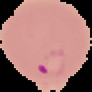

In [4]:
image = Image.open("test.png")
image

In [5]:
image.size, np.array(image).shape

((92, 92), (92, 92, 3))

# Define all the functions to be used by the main GUI

In [100]:
def make_image_edges(img_orig, neighbors=4):
    """
    Create the bi-directional edges
    for the planar image. All pixels are
    used in this first step after which
    masked pixels will be removed.
    
    Inputs:
    img_orig : the original image file
    neighbors : either a 4- or 8-neighbor
                scheme, the latter includes
                diagonal neighbors
    
    Outputs:
    G : the initial Graph of the image
        plane edges - all bi-directional -
        and including the masked pixels
    """
    m, n = img_orig.size    # NOTE: n = height; m = width
    
    # create an array identical in shape to the image
    # This will serve as a guide for working the nodes
    # of the graph
    img = np.linspace(0, n*m-1, n*m).reshape(n,m).astype(int)
    
    G = nx.DiGraph() # instantiate the graph
    
    # ======================
    # build horizontal edges
    # ======================
    # add horizontal edges along first row
    #                            =========
    row = [(j,j+1) for j in range(0,m-1)]
    G.add_edges_from(row)
    # add reverse direction
    rev = [(y, x) for x, y in row]
    G.add_edges_from(rev)
    
    # use first row to define all other horizontal connections
    #                         ================================
    other_rows = [(x+j*m, y+j*m) for x, y in row for j in range(1,n)]
    G.add_edges_from(other_rows)
    # add reverse direction
    rev = [(y, x) for x, y in other_rows]
    G.add_edges_from(rev)

    # ====================
    # build vertical edges
    # ====================
    # add vertical edges along first row
    #                          =========
    col = [(j,j+m) for j in range(0,m)]
    G.add_edges_from(col)
    # add reverse direction
    rev = [(y, x) for x, y in col]
    G.add_edges_from(rev)

    # use first col to define all other vertical connections
    #                         ==============================
    other_cols = [(x+j*m, y+j*m) for x, y in col for j in range(1,n-1)]
    G.add_edges_from(other_cols)
    # add reverse direction
    rev = [(y, x) for x, y in other_cols]
    G.add_edges_from(rev)

    if neighbors == 8:
        # ========================
        # build dropping diagonals
        # ========================
        # add diagonals sloping downward for first row
        #                                    =========
        ddiag = [(j,j+m+1) for j in range(0,m-1)]
        G.add_edges_from(ddiag)
        # add reverse direction
        rev = [(y, x) for x, y in ddiag]
        G.add_edges_from(rev)

        # use first sloping diagonals to create all others
        #                                       ==========
        other_ddiag = [(x+j*m, y+j*m) for x, y in ddiag for j in range(1,n-1)]
        G.add_edges_from(other_ddiag)
        # add reverse direction
        rev = [(y, x) for x, y in other_ddiag]
        G.add_edges_from(rev)

        # ======================
        # build rising diagonals
        # ======================
        # add diagonals sloping upward on first row
        udiag = [(j,j+m-1) for j in range(1,m)]
        G.add_edges_from(udiag)
        # add reverse direction
        rev = [(y, x) for x, y in udiag]
        G.add_edges_from(rev)

        # use first sloping diagonals to create all others
        other_udiag = [(x+j*m, y+j*m) for x, y in udiag for j in range(1,n-1)]
        G.add_edges_from(other_udiag)
        # add reverse direction
        rev = [(y, x) for x, y in other_udiag]
        G.add_edges_from(rev)
    
    return G

def get_scrib_colors(img, clr, image_orig, sgmnt, counter):
    global G_rgb, pxl
    """
    Make an image with only the 
    colors of the pixels on the 
    scribble.
    Use the occasion to populate
    the graph with identity of foreground
    or background nodes
    
    Inputs:
    img : the image file of the scribble
    clr : the color to match
    image_orig : the original image file
    sgmnt : either foreground or background
    counter : keep track of foreground /
              background iteration
    
    Outputs:
    img_0 : the image with only 
            scribble pixels
    """
    # create a blank, black image
    img_0 = Image.new("RGB", img.size, (0,0,0))
    # populate the pixels as per the scribbled
    # image drawn by the user
    for node in G_rgb.nodes:
        # does the pixel match the scribble color?
        if img.getpixel(pxl[node]) == clr:
            # ... assign the original color
            img_0.putpixel(pxl[node], image_orig.getpixel(pxl[node]))
            # ... tag the node as belonging to 
            # either forground or background
            G_rgb.nodes[node][sgmnt] = counter
        else:
            G_rgb.nodes[node][sgmnt] = 0
    return img_0

def plot_hist(img, ax, bandwidth):
    """
    Plot the histogram images.
    Not called for display in the GUI
    but displays in the notebook.
    Call could be commented out.
    
    Input:
    img : the image file
    ax : the plotting axes
    bandwidth : bandwidth for the histogram
    
    Output:
    None
    """
    # get the histogram data for object
    print(f"Getting histograms ...")
    r, g, b, _, _, _ = get_hist_sums(img)
    ax.plot(r, color='red');
    ax.plot(g, color='green');
    ax.plot(b, color='blue');
    # get the corresponding kde of the above data
    print(f"Getting KDE's ...")
    kde_r, kde_g, kde_b = get_kde(r, g, b, bandwidth)
    ax2 = ax.twinx()
    x = np.linspace(0,255,256)
    ax2.plot(x,kde_r.pdf(x),color='red',ls='--')
    ax2.plot(x,kde_g.pdf(x),color='green',ls='--')
    ax2.plot(x,kde_b.pdf(x),color='blue',ls='--')
    plt.show()
    return

def add_terminal(T, K, L, O, B, G_in, img, pxl, bw_O, bw_B):
    """
    Add a Terminal attached to each node 
    in G_in with corresponding capacity defined.
    Code and comments are written to reflect
        T = Terminal 'T'
        O = object or foreground
        B = background
    Can use this function to define S connections
    but one must reverse O and B in the reference 
    function call.
    
    Inputs:
        T : Either 'S' Source or 'T' Sink
            'S' is connected to foreground object
            'T' is connected to background
        K : variance of image calculated from greyscale
        L : lambda which multiplies the 
            probabilities
        O : Background image if T = 'S'
            (see Interactive Graph Cuts paper)
            Object image if T = 'T'
        B : opposite of O
        G_in : input graph
        img : baseline image
        pxl : dictionary of pixel x,y coords
        bw_O : bandwidth for foreground object
        bw_F : bandwidth for background
        
    Output:
        Graph with new terminal and capacities.
    """
    
    print(f"Adding Terminal {T} with K={K:.2f} and L={L:.2f} ...")
    
    tol = 1E-60 # define zero tolerance to catch issues
    # define ratio function and harmonic mean function
    f = lambda x, y: 0.5 if (x+y) == 0 else x / (x+y)
    hmn = lambda x, y, z: 0.5 if (x*y*z) <= tol else 3. / (1./x + 1./y + 1./z)
    
    G = G_in.copy()
    # get the histogram data for object and background
    r_O, g_O, b_O, _, _, _ = get_hist_sums(O)
    r_B, g_B, b_B, _, _, _ = get_hist_sums(B)

    n, m = O.size # get image size assuming all
                  # images provided to same size
    print(f"n:{n}, m:{m}")
    
    # get the corresponding kde of the above data
    kde_r_O, kde_g_O, kde_b_O = get_kde(r_O, g_O, b_O, bw_O)
    kde_r_B, kde_g_B, kde_b_B = get_kde(r_B, g_B, b_B, bw_B)
    
    # make a list of all nodes but
    # remove the terminal nodes from 
    # the list if they exist.
    nodes = list(G.nodes())
    try:
        nodes.remove('S')
    except:
        print('\tNo S-terminal found')
    try:
        nodes.remove('T')
    except:
        print('\tNo T-terminal found')
        
    G.add_node(T) # add the terminal node
    
    ttl = 0 # sum of three channels of zero color

    # loop through each node and assign
    # weights as per table from reference paper.
    # Note that these are the weights from a
    # terminal node to a pixel node. The weights
    # between pixels are defined in get_edge_weights
    for p in nodes:

        # check if part of object
        x, y = pxl[p]
        
        # in order to use this function for 
        # both Source and Sink we need to add
        # the following for proper directionality
        if T == "T":
            # here, from image to Sink
            from_node = p
            to_node = T
        else: # implies "S"
            # here, from Source to image
            from_node = T
            to_node = p
        
        # get corresponding pixel p in Object and Background
        r, g, b = O.getpixel((x, y)) # Object rgb
        r_b, g_b, b_b = B.getpixel((x,y)) # Background rgb
        
        # check if NOT black (hence, in Object)
        if sum([r, g, b]) != ttl:
            G.add_edge(from_node, to_node, capacity=0) # weight zero
            
        # check if NOT black (hence, in Background)
        elif sum([r_b, g_b, b_b]) != ttl:
            G.add_edge(from_node, to_node, capacity=K) # weight K
            
        # otherwise, assign regional weight
        else:
            r_i, g_i, b_i = img.getpixel((x, y)) # Image rgb
            
            Pr_r_O = kde_r_O.evaluate(r_i)[0] # foreground red probability
            Pr_g_O = kde_g_O.evaluate(g_i)[0] # foreground green probability
            Pr_b_O = kde_b_O.evaluate(b_i)[0] # foreground blue probability
            
            Pr_r_B = kde_r_B.evaluate(r_i)[0] # background red probability
            Pr_g_B = kde_g_B.evaluate(g_i)[0] # background green probability
            Pr_b_B = kde_b_B.evaluate(b_i)[0] # background blue probability
            
            
            # check if node has been created already
            if G.has_edge(from_node, to_node):
                # if so, then update as per top right column
                # of page 109 of Interactive Graph Cuts
                P_r_B = f(Pr_r_B, Pr_r_O) # prob red background
                P_g_B = f(Pr_g_B, Pr_g_O) # prob green background
                P_b_B = f(Pr_b_B, Pr_b_O) # prob blue background
                # calculate the overall probability as the harmonic
                # mean of the components
                prob_B = hmn(P_r_B, P_g_B, P_b_B)
                # avoid taking log of zero
                Rp = np.max([1./(m*n), prob_B])
#                 Rp = -np.log(np.sqrt(Rp)) # negative log liklihood
                Rp = -np.log(Rp) # negative log liklihood
                new_cpcty = (G[from_node][to_node]["capacity"]
                             + L*Rp
                             + (T=="S")*K)
                G[from_node][to_node]["capacity"] = new_capcty
            else:
                P_r_O = f(Pr_r_O, Pr_r_B) # prob red foreground
                P_g_O = f(Pr_g_O, Pr_g_B) # prob green foreground
                P_b_O = f(Pr_b_O, Pr_b_B) # prob blue foreground
                # calculate the overall probability as the harmonic
                # mean of the components
                prob_O = hmn(P_r_O, P_g_O, P_b_O)

                # avoid taking log of zero
                Rp = np.max([1./(m*n), prob_O])
#                 Rp = -np.log(np.sqrt(Rp)) # negative log liklihood
                Rp = -np.log(Rp) # negative log liklihood
                G.add_edge(from_node, to_node, capacity=L*Rp)
    print(f" ... done adding Terminal.")
    return G

def build_sample(hst_data):
    """
    Builds a sample distribution from
    the histogram data. I shouldn't have
    to do this but I can't find how to get
    this efficiently.
    
    Inputs:
    hst_data : the histogram data output
               from the histogram method
               
    Output:
    lst : the histogram data converted to 
          its samples format
    """
    lst = []
    for i in range(len(hst_data)):
        if hst_data[i] != 0:
            lst.extend(np.full(hst_data[i], i))
    return lst

def get_kde(r, g, b, bandwidth):
    """
    Calculates the Gaussian KDE
    from the provided histogram
    data.
    
    Input:
    r, g, b : the RGB histogram data
    
    Output:
    kde_r, kde_g, kde_b : 
          the gaussian probability density
          function for each channel
    """
    
    print(f"Getting kde with bandwidth {float(bandwidth.get())} ...")
    kde_r = sts.gaussian_kde(build_sample(r), bw_method=float(bandwidth.get()))
    kde_g = sts.gaussian_kde(build_sample(g), bw_method=float(bandwidth.get()))
    kde_b = sts.gaussian_kde(build_sample(b), bw_method=float(bandwidth.get()))
    print(f" ... got kde.")
    return kde_r, kde_g, kde_b

def get_hist_sums(img):  # misnomer to be changed
    """
    Calculates the histogram arrays
    for red, green & blue to be used
    elsewhere. Done here once to avoid
    recalculations.
    
    Input:
    img : the image file
    
    Output:
    r, g, b: the arrays of red, green
             and blue that will be used
             to look up relative count of 
             each channel in the histogram
             for the given pixel being examined
    r_sum, g_sum, b_sum : sums of previous arrays.
    """
    # create the greyscale mask first
    image_mask = img.convert(mode='L')
    hist_obj = img.histogram(mask=image_mask) # all bands concat'd
    
    # image by channel
    # get an array of the 
    # frequency of each degree of ...
    r = hist_obj[0:256] # ... red
    g = hist_obj[256:512] # ... green
    b = hist_obj[512:768] # ... blue
    
    return r, g, b, sum(r), sum(g), sum(b)

def remove_nodes_mask(G, img, pxl, msk_color=0):
    """
    Remove a node from the Graph
    if the mask image is equal to
    black (0) at that pixel location.
    
    Inputs:
    G : the Graph containing only
        pixel nodes - no terminal nodes yet.
    img : the image mask
    pxl : dictionary of pixel x,y coords
    msk_color : the color designated as a mask
    
    Output:
    G_new : the Graph without any mask nodes.
    """
    G_new = G.copy()
    # Note that we use G.nodes in this loop call
    for node in G.nodes:
        x, y = pxl[node]
        I = img.getpixel((x, y))
        if I == msk_color:
            G_new.remove_node(node)
    return G_new

def get_edge_weights(G, img, var, pxl, img_grey):
    """
    Assign the weights or capacities 
    for the planar representation of 
    pixel locations as per "Interactive
    Graph Cuts ..." page 109.
    Assigns the edge weights for foreground
    and background geodesic distance 
    calculations.
    Note that the weights from terminals
    to the pixel plane are defined in 
    add_terminal.
    
    Inputs:
    G : the Graph containing only
        pixel nodes - no terminal nodes yet.
    img : the image file
    var : the variance of image intensities
    pxl : dictionary of pixel x,y coords
    img_grey : the image mask
    
    Outputs:
    G_new : Graph with capacities for each
            image edge.
    lst : the list of all edge weights (used
          for debugging)
    K : as defined in "Interactive Graph Cuts ..."
        on page 108.
    """
    
    G_new = G.copy()
    n, m = img.size
    # array of size n*m (slot for each pixel)
    # that will store the sum of capacities
    # for all edges of that pixel location
    # -- used for second term of K equation
    edge_sums = np.zeros(n*m) 
    # initialize list to store all weight values
    lst = []

    # recall that image plane
    # edges are bi-directional and so 
    # each edge will appear twice ...
    for edge in G_new.edges:
        p, q = edge
        # get the required data at both nodes.
        # pixel p:
        Ip = G_new.nodes[p]["Ig"] # intensity
        Fp = G_new.nodes[p]["Prob_FG"] # probability foreground
        Bp = 1. - Fp # probability background
        # pixel q:
        Iq = G_new.nodes[q]["Ig"] # intensity
        Fq = G_new.nodes[q]["Prob_FG"] # probability foreground
        Bq = 1. - Fq# probability background
        # distance (Frobenius norm) between p & q
        dst = dist(p,q,m)
        # weight as per B equation on p. 109
        wgt = np.exp(-0.5 * (Ip - Iq)**2 / var) / dst
        lst.append(wgt) # add weight to list
        if wgt < 1E-10: # debugging statement
            print(p,q,Ip,Iq)
        # recall that image plane edges are
        # created in make_image_ for both directions so
        # each edge will appear twice and we 
        # collect the sum of weights at each node
        G_new[p][q]['capacity'] = wgt # direction 1
        edge_sums[p] += wgt
        # assign edge weights for geodesic distance calcs
        G_new[p][q]['foregrnd'] = abs(Ip - Iq)
        G_new[p][q]['backgrnd'] = abs(Ip - Iq)

    return G_new, lst, max(edge_sums)+1
        
def dist(p,q,m):
    """
    Calculate distance between pixels.
    Distance being Frobenius norm which is 
    deemed = 1 for row or column neighbors
    and sqrt(2) for diagonal neighbors
    
    Input:
    p : pixel p location on flattened array
    q : pixel q location on flattened array
    m : column width of image
    
    Output:
    distance between pixel p and pixel q
    """
    if abs(p-q) == 1:
        return 1 # p and q are neighbors on a row
    if abs(p-q) == m:
        return 1 # p and q are neighbors on a column
    return 1.4142  # otherwise, p and q are diagonals

def get_image_var(G, img, pxl, img_grey):
    """
    Calculate the image variance on 
    the grey scale image using only
    the non-masked pixel locations.
    As well, store RGB values for each
    node in the graph for later use.
    
    Inputs:
    G : the Graph containing only
        pixel nodes without mask locations
    img : the image file
    pxl : dictionary of pixel x,y coords
    img_grey : the image mask
          
    Outpus:
    variance of intensities
    G_new the graph with rgb attributes
    at each node.
    """
    G_new = G.copy()
    lst = []
    for node in G.nodes:
        x, y = pxl[node]
        # intensity based on grey scale 
        I = img_grey.getpixel((x, y))
        # get rgb values for storage at node
        r, g, b = img.getpixel((x, y))
        G_new.nodes[node]["r"] = r
        G_new.nodes[node]["g"] = g
        G_new.nodes[node]["b"] = b
        G_new.nodes[node]["Ig"] = I
        lst.append(I)
    return G_new, np.var(lst) # variance, new graph

def paint_region(image, reachables, pxl):
    """
    create an image where the reachables
    are displayed in a highlighted color
    
    Inputs:
    image : the image file
    reachables : the result of the graph
                 cut operation listing
                 reachable nodes from Source
    pxl : dictionary of pixel x,y coords
                 
    Outputs:
    img : the painted image with reachable
          pixels in blue
    """
    img = image.copy()
    color = (0, 0, 255)

    # remove the 'S' terminal
    reachables.remove('S')
    
    for p in reachables:
        x, y = pxl[p]
        img.putpixel((x,y),color)
                    
    return img

def x_y_for_p(tpl):
    """
    To reduce redundant calculations,
    work out the corresponding x, y 
    pixel locations for pixel p and
    create a dictionary of tuples.
    
    Input:
    tpl : image size dimensions tuple
    
    Output:
    pix_coord : the dict of tuples 
                defining the pixel 
                coordinates.
    """
    pix_coord = {} # initialize dictionary
    n, m = tpl
    p = 0
    for y in range(m): # col index
        for x in range(n): # row index
            pix_coord[p] = (x, y)
            p += 1
    
    return pix_coord

def paint_prob_image(image, G, pxl, color=(0,0,255), mn='mean'):
    global r_fg, g_fg, b_fg, r_bk, g_bk, b_bk
    global kde_r_fg, kde_g_fg, kde_b_fg, bw_fg
    global kde_r_bk, kde_g_bk, kde_b_bk, bw_bk
    """
    create an image where the probability
    is voted on for each pixel and displayed
    """
    img = image.copy()    # get the corresponding kde of the above data
    print(f"Getting KDE of foreground ...")
    kde_r_fg, kde_g_fg, kde_b_fg = get_kde(r_fg, g_fg, b_fg, bw_fg)
    print(f"Getting KDE of background ...")
    kde_r_bk, kde_g_bk, kde_b_bk = get_kde(r_bk, g_bk, b_bk, bw_bk)
    
    tol = 1E-60
    f = lambda x, y: 0.5 if (x+y) == 0 else x / (x+y)
    hmn = lambda x, y, z: 0.5 if (x*y*z) <= tol else 3. / (1./x + 1./y + 1./z)

    for node in G.nodes:
               
        # get probability foreground / background for each channel
        # based on the kde
        Pr_r_F = kde_r_fg.evaluate(G.nodes[node]["r"])[0] # foreground red probability
        Pr_g_F = kde_g_fg.evaluate(G.nodes[node]["g"])[0] # foreground green probability
        Pr_b_F = kde_b_fg.evaluate(G.nodes[node]["b"])[0] # foreground blue probability

        Pr_r_B = kde_r_bk.evaluate(G.nodes[node]["r"])[0] # background red probability
        Pr_g_B = kde_g_bk.evaluate(G.nodes[node]["g"])[0] # background green probability
        Pr_b_B = kde_b_bk.evaluate(G.nodes[node]["b"])[0] # background blue probability

        P_r_F = f(Pr_r_F, Pr_r_B) # prob red foreground
        P_g_F = f(Pr_g_F, Pr_g_B) # prob green foreground
        P_b_F = f(Pr_b_F, Pr_b_B) # prob blue foreground

        if mn == 'mean':
            prob_fg = (P_r_F + P_g_F + P_b_F) / 3.
        else:
            prob_fg = hmn(P_r_F, P_g_F, P_b_F)
        
        G.nodes[node]["Prob_FG"] = prob_fg

        if prob_fg > 0.5:
            img.putpixel(pxl[node],color)

    return img

def calc_region():
    """
    Main calculation loop where the various
    functions are called.
    """
    global image_orig, image_mask, image_region, img_reg, lambdaCost, bw_fg, bw_bk
    global pxl, G_rgb, G_wgtd
    # add the edge capacities (weights)
    # across all the pixels on the plane
    print(f"Adding all the boundary capacities ...")
    print(f"Var: {var:.4f}")
    G_wgtd, lst, K = get_edge_weights(G_rgb, image_orig, var, pxl, image_mask)
#     nx.write_edgelist(G_wgtd, "G_wgtd.edgelist", data=True)
    # read in the object and background images
    O = Image.open("fg_colors.png")
    B = Image.open("bk_colors.png")
    # create the edges and capacities from
    # the pixel plane to the Terminal T (sink)
    print(f"Adding edges from image to Sink ...")
    G_T = add_terminal('T', K, float(lambdaCost.get()), O, B, G_wgtd, image_orig, pxl, bw_fg, bw_bk)
#     nx.write_edgelist(G_T, "G_T_edges.csv")
    # create the edges and capacities from
    # Terminal S (source) to pixel plane
    print(f"Adding edges from Source to image ...")
    G_S = add_terminal('S', K, float(lambdaCost.get()), B, O, G_T, image_orig, pxl, bw_bk, bw_fg)
#     nx.write_edgelist(G_S, "G_S_edges.csv")
    # solve the max-flow, min-cut problem
    print(f"Generating Max-Flow / Min-Cut ...")
    cut_value, partition = nx.minimum_cut(G_S, 'S', 'T')
    # get the results
    reachable, unreachable = partition
    # paint the region over the original image
    img_reg = paint_region(image_orig, reachable, pxl)
    img_reg = ImageTk.PhotoImage(img_reg,master=mainWindow)
    canvas_region.itemconfig(image_region, image=img_reg)
    print(f"... image generated")
    
def save_img(subject):
    """
    Save the image files
    """
    global image_11, imagebk, bk_col, img_hist_bk, image_hist_bk
    global image_00, imagefg, fg_col, img_hist_fg, image_hist_fg
    global image_orig, image_mask, bw_fg, bw_bk
    global fg_counter, bk_counter
    
    if subject == 'fg':
        fg_counter += 1
        print(f"Foreground counter: {fg_counter}")
        image_1 = get_scrib_colors(imagefg, fg_col, image_orig, 'Fore', fg_counter)
        bw = bw_fg
    else:
        bk_counter += 1
        print(f"Background counter: {bk_counter}")
        image_1 = get_scrib_colors(imagebk, bk_col, image_orig, 'Back', bk_counter)
        bw = bw_bk

    hist_nm = "hist_"+subject+".png"
    image_1.save(subject+"_colors.png")

    fig, axx = plt.subplots()
    plot_hist(image_1, axx, bw)

    fig.savefig(hist_nm)
    img_hist = Image.open(hist_nm)
    img_hist = img_hist.resize((360,240), Image.ANTIALIAS)

    if subject == 'fg':
        image_00 = ImageTk.PhotoImage(image_1,master=mainWindow)
        canvasfg.itemconfig(image_fg, image=image_00)
        img_hist_fg = ImageTk.PhotoImage(img_hist,master=mainWindow)
        canvas_hist_fg.itemconfig(image_hist_fg, image=img_hist_fg)
    else:
        img_hist_bk = ImageTk.PhotoImage(img_hist,master=mainWindow)
        canvas_hist_bk.itemconfig(image_hist_bk, image=img_hist_bk)
        image_11 = ImageTk.PhotoImage(image_1,master=mainWindow)
        canvasbk.itemconfig(image_bk, image=image_11)
    
    
def show_prob_img():
    """
    Generate and display in the GUI
    the probability image.
    """
    global image_mask, image_orig, img, image_rend
    global r_fg, g_fg, b_fg, r_bk, g_bk, b_bk
    global G_rgb, pxl
    img_fg = Image.open('fg_colors.png')
    img_fg_msk = img_fg.convert(mode="L")
    img_bk = Image.open('bk_colors.png')
    img_bk_msk = img_bk.convert(mode="L")
    hist_fg = img_fg.histogram(mask=img_fg_msk) # all bands concat'd
    hist_bk = img_bk.histogram(mask=img_bk_msk) # all bands concat'd
    
    #============================
    # Calculate the following as
    # global variables to save 
    # computational effort
    #============================
    # foreground image by channel
    r_fg = hist_fg[0:256] # red
    g_fg = hist_fg[256:512] # green
    b_fg = hist_fg[512:768] # blue
    
    # background image by channel
    r_bk = hist_bk[0:256] # red
    g_bk = hist_bk[256:512] # green
    b_bk = hist_bk[512:768] # blue
    
    # calculate and display the probability image
    img = paint_prob_image(image_orig, G_rgb, pxl, mn='harmonic')
    img = ImageTk.PhotoImage(img,master=mainWindow)
    canvas_render.itemconfig(image_rend, image=img)
    
def get_x_and_y(event):
    global lastx, lasty, penWidth, vec
    lastx, lasty = event.x, event.y

def draw_squiggle(event):
    global lastx, lasty, penWidth, vec
    canvas.create_line((lastx, lasty, event.x, event.y), fill='red', width=penWidth.get())
    drawfg.line((lastx, lasty, event.x, event.y), fill='red', width=int(penWidth.get()))
    lastx, lasty = event.x, event.y

def get_x_and_y_bckgrnd(event):
    global lastxbk, lastybk, penWidth, vecbk
    lastxbk, lastybk = event.x, event.y

def draw_squiggle_bckgrnd(event):
    global lastxbk, lastybk, penWidth, vecbk
    canvas.create_line((lastxbk, lastybk, event.x, event.y), fill='blue', width=penWidth.get())
    drawbk.line((lastxbk, lastybk, event.x, event.y), fill='blue', width=int(penWidth.get()))
    lastxbk, lastybk = event.x, event.y
    
def filter_node_fg(n1):
    """
    Look for nodes that are 
    part of foreground.
    """
    global fg_counter, G_rgb
    return G_rgb.nodes[int(n1)]["Fore"] == fg_counter

def filter_node_bk(n1):
    """
    Look for nodes that are 
    part of background.
    """
    global bk_counter, G_rgb
    return G_rgb.nodes[int(n1)]["Back"] == bk_counter

def calc_geodesic(sgmnt,jobs=False):
    """
    Calculate the geodesic distance between
    the user scribble and the other pixels.
    For economy of calculation, choose only
    one pixel in the new scribble.
    Justification: the geodesic distance 
    within the scribble pixels is - by 
    definition - zero. So the geodesic distance
    from a pixel to any scibble pixel is
    the same.
    
    Inputs:
    sgmnt: whether calculating for foreground
           or background
           
    Outputs:
    Display the geodesic image in GUI
    """
    global G_wgtd, pxl, image_orig, image_geofg, image_geobk
    global img_geo_fg, img_geo_bk
    
    # change directed graph to undirected
    #G_wgtd = nx.read_edgelist("G_wgtd.edgelist")
    #G = G_wgtd.to_undirected()
    print(f"Calculating the geodesic distances for {sgmnt}.")
    G = G_wgtd.copy()
    img = image_orig.convert(mode='L')
    pixels = asarray(img)
    pixels = pixels.astype('float32')
    
    if sgmnt == 'foregrnd':
        # we are (re)calculating the forground
        # geodesic distance map based on the
        # most recent background scribble
        scrbl_nodes = nx.subgraph_view(G, filter_node=filter_node_fg)
        
    else:
        scrbl_nodes = nx.subgraph_view(G, filter_node=filter_node_bk)
    
    print(f"There are {len(set(scrbl_nodes))} nodes in the scribble.")
    # get the average intensity of all
    # these latest scribble nodes
#     int_avg = np.array([G_wgtd.nodes[node]['Ig'] for node in scrbl_nodes]).mean()
    
    # set the greyscale intensity for all
    # these scribble points to zero
#     for node in scrbl_nodes:
#         pixels[pxl[node]] = 0
    
    # find the minimum geodesic distance to
    # any point in scrbl_nodes
    nodes = list(set(G.nodes) - set(scrbl_nodes))
    # pick one and only one pixel in the 
    # user scribble to work out the geodesic
    # minimum distances
    #=============================================
    # WARNING: This assumes only ONE user scribble
    #          per iteration. This logic of using
    #          a single pixel for this operation
    #          breaks down if there are multiple 
    #          scribbles.
    #=============================================
    scrbl = list(scrbl_nodes)[0]
    print(f"Calculating all distances from node {scrbl} at {pxl[scrbl]}")
    # create a SciPy sparse graph to accelerate
    # calculations
    # NOTE: in order to retain the name of the 
    #       nodes, we create a dictionary to
    #       translate between nx name and scipy one.
    #       we convert the node names to string to
    #       keep track.

    nodelist = [node for node in G.nodes()]
    node_dict = {node: str(node) for node in G.nodes()}
    G_nx = nx.relabel_nodes(G,  # make graph with string node names
                            mapping=node_dict,
                            copy=True)
    # convert from networkx to scipy sparse
    G_sprs = nx.to_scipy_sparse_matrix(G,weight=sgmnt,nodelist=nodelist)

    sci_map = {node: i for i, node in enumerate(nodelist)}
    sci_scrbl = sci_map[scrbl]
        
    if jobs: # if want to try with joblib
        # Creat a temporary directory and define the array path
        folder = './joblib_memmap'
        try:
            os.mkdir(folder)
        except FileExistsError:
            pass
        # Create array to write to using numpy's memmap
        ab3path = os.path.join(folder,'ab3_mmap')
        ab3 = np.memmap(ab3path, dtype=float, shape=(pixels.shape), mode='w+')

        # Create the graph copy in memmap
        data_filename_memmap = os.path.join(folder, 'data_memmap')
        dump(G_sprs, data_filename_memmap)
        data = load(data_filename_memmap, mmap_mode='w+')

        # Create the pxl copy in memmap
        pxl_filename_memmap = os.path.join(folder, 'pxl_memmap')
        dump(pxl, pxl_filename_memmap)
        pxl_mem = load(pxl_filename_memmap, mmap_mode='r')

        nodes_lst = list(nodes)
        # Parallel process in order to populate array
        Parallel(n_jobs=4)(delayed(shortest_geo)
                           (data,
                            [sci_map[node],sci_scrbl],
                            pxl_mem[node],
                            ab3) 
                           for node in nodes_lst)
        pixels = ab3 / ab3.max() * 255.
        
        # Delete the temporary directory and contents
        try:
            shutil.rmtree(folder)
        except:
            print("Couldn't delete folder: "+str(folder))
    
    else: # no joblib
    
        for node in nodelist:
            dst = shortest_path(G_sprs,
                                indices=[sci_map[node],sci_scrbl],
                                directed=False,
                                return_predecessors=False)
#             print(f"From {pxl[node]} to {pxl[scrbl]}: {dst[0, sci_scrbl]}")
            x, y = pxl[node]
            pixels[y, x] = dst[0, sci_scrbl]

        pixels = pixels / pixels.max() * 255.

    pixels = pixels.astype('uint8')
    img_geo = Image.fromarray(pixels)

    
    if sgmnt == 'foregrnd':
        img_geo_fg = ImageTk.PhotoImage(img_geo,master=mainWindow)
        canvas_geofg.itemconfig(image_geofg, image=img_geo_fg)
    else:
        img_geo_bk = ImageTk.PhotoImage(img_geo,master=mainWindow)
        canvas_geobk.itemconfig(image_geobk, image=img_geo_bk)

def shortest_geo(data, ind_arr, tpl, ab3):
    dst = shortest_path(data, 
                       indices=ind_arr,
                       directed=False,
                       return_predecessors=False)
    ab3[tpl] = dst[0, ind_arr[1]]
        
def get_path(Pr, i, j):
    """
    Retrieve the path from the 
    the results of a shortest
    path function.
    """
    path = [j]
    k = j
    while Pr[i, k] != -9999:
        path.append(Pr[i, k])
        k = Pr[i, k]
    return path[::-1]


# nodelist = [node for node in G_wgtd.nodes]
# node_dict = {x: str(x) for x in G_wgtd.nodes()}
# G_nx = nx.relabel_nodes(G_wgtd,mapping=node_dict,copy=True)
# A = nx.to_scipy_sparse_matrix(G_wgtd,weight='capacity',nodelist=nodelist)
# sci_map = {node: i for i, node in enumerate(nodelist)}
# res, pths = shortest_path(A,indices=[sci_map[n1],sci_map[n2]],directed=False,return_predecessors=True)
# res[0,sci_map[n2]], res[1,sci_map[n1]]
# print([nx_map[node] for node in get_path(pths, 0, sci_map[n2])])
# print([nx_map[node] for node in get_path(pths, 1, sci_map[n1])])
        
        
def func3(data,node,tpl,scrbl,sgmnt,ab3):
    dst = nx.shortest_path_length(data, node, scrbl, weight=sgmnt)
    ab3[tpl] = dst
    
#     for node in list(nodes):
# #        dst = np.inf
# ##        print(f"Finding minimum distance from {node} to {scrbl} ...")
# #        for scrbl in scrbl_nodes:
# #         dst = nx.resistance_distance(G, node, scrbl, weight=sgmnt, invert_weight=False)
#         dst = nx.shortest_path_length(G, node, scrbl, weight=sgmnt)
# #        dst, pth = nx.single_source_dijkstra(G, node, scrbl, weight=sgmnt)
# #            dst_node, _ = nx.bidirectional_dijkstra(G_wgtd, node, scrbl, weight=sgmnt)
# #             if dst_node < dst:
# #                 dst = dst_node
                
# #            print(f"\t ... to {scrbl}: {dst:.4f}")
# ##        print(f"\t\t ... which is {dst:.4f}")
# #        img.putpixel(pxl[node], int(dst*255))
#         pixels[pxl[node]] = dst

def convert_strongly(G_in):
    """
    Convert the graph to a strongly
    connected graph in order to use
    certain algorithms.
    """
    G = G_in.copy()
    # get list of strongly connected nodes
    H = list(max(nx.strongly_connected_components(G), key=len))
    print(f"Making strongly-connected:")
    print(f"\tInitial size: {len(G.nodes)}")
    Gnodes = list(G.nodes)
    diff = set(Gnodes) - set(H)
    G.remove_nodes_from(diff)
    print(f"\tFinal size: {len(G.nodes)}")
    return G

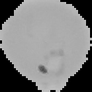

In [92]:
img = image_orig.convert(mode='L')
pixels = asarray(img)
pixels = pixels.astype('float32')
img

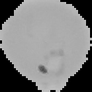

In [95]:
Image.fromarray(pixels.astype('uint8'))

In [97]:
pxl[21]

(21, 0)

In [98]:
image_orig.size

(92, 92)

In [84]:
# tmp = nx.subgraph_view(G_wgtd, filter_node=filter_node_fg)
# [node for node in tmp.nodes()]

In [69]:
np.array([G_wgtd.nodes[node]['Ig'] for node in G_wgtd.nodes]).mean()

162.93811918914798

Image size scaled: (92, 92)
Getting all image edges ...
Removing mask nodes ...
Making strongly-connected:
	Initial size: 6563
	Final size: 6561
Getting pixel variance ...
Variance: 1485.7429
Foreground counter: 1
Getting histograms ...
Getting KDE's ...
Getting kde with bandwidth 0.1 ...
 ... got kde.


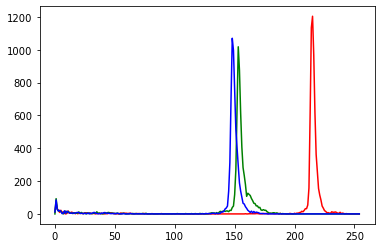

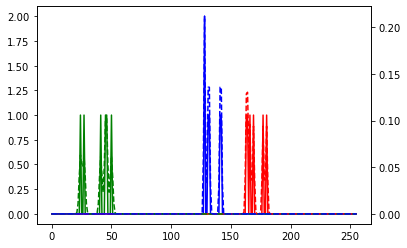

Background counter: 1
Getting histograms ...
Getting KDE's ...
Getting kde with bandwidth 0.1 ...
 ... got kde.


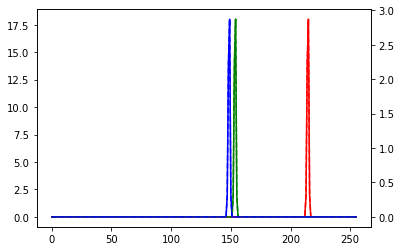

Getting KDE of foreground ...
Getting kde with bandwidth 0.1 ...
 ... got kde.
Getting KDE of background ...
Getting kde with bandwidth 0.1 ...
 ... got kde.
Adding all the boundary capacities ...
Var: 1485.7429
Adding edges from image to Sink ...
Adding Terminal T with K=7.83 and L=0.95 ...
n:92, m:92
Getting kde with bandwidth 0.1 ...
 ... got kde.
Getting kde with bandwidth 0.1 ...
 ... got kde.
	No S-terminal found
	No T-terminal found
 ... done adding Terminal.
Adding edges from Source to image ...
Adding Terminal S with K=7.83 and L=0.95 ...
n:92, m:92
Getting kde with bandwidth 0.1 ...
 ... got kde.
Getting kde with bandwidth 0.1 ...
 ... got kde.
	No S-terminal found
 ... done adding Terminal.
Generating Max-Flow / Min-Cut ...
... image generated
Background counter: 2
Getting histograms ...
Getting KDE's ...
Getting kde with bandwidth 0.1 ...
 ... got kde.


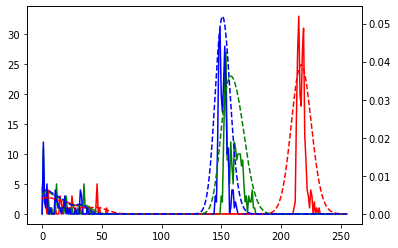

Getting KDE of foreground ...
Getting kde with bandwidth 0.1 ...
 ... got kde.
Getting KDE of background ...
Getting kde with bandwidth 0.1 ...
 ... got kde.
Adding all the boundary capacities ...
Var: 1485.7429
Adding edges from image to Sink ...
Adding Terminal T with K=7.83 and L=0.95 ...
n:92, m:92
Getting kde with bandwidth 0.1 ...
 ... got kde.
Getting kde with bandwidth 0.1 ...
 ... got kde.
	No S-terminal found
	No T-terminal found
 ... done adding Terminal.
Adding edges from Source to image ...
Adding Terminal S with K=7.83 and L=0.95 ...
n:92, m:92
Getting kde with bandwidth 0.1 ...
 ... got kde.
Getting kde with bandwidth 0.1 ...
 ... got kde.
	No S-terminal found
 ... done adding Terminal.
Generating Max-Flow / Min-Cut ...
... image generated
Calculating the geodesic distances for backgrnd.
There are 263 nodes in the scribble.
Calculating all distances from node 3329 at (17, 36)
Foreground counter: 2
Getting histograms ...
Getting KDE's ...
Getting kde with bandwidth 0.1 ..

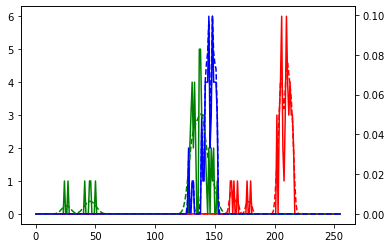

Getting KDE of foreground ...
Getting kde with bandwidth 0.1 ...
 ... got kde.
Getting KDE of background ...
Getting kde with bandwidth 0.1 ...
 ... got kde.
Adding all the boundary capacities ...
Var: 1485.7429
Adding edges from image to Sink ...
Adding Terminal T with K=7.83 and L=0.95 ...
n:92, m:92
Getting kde with bandwidth 0.1 ...
 ... got kde.
Getting kde with bandwidth 0.1 ...
 ... got kde.
	No S-terminal found
	No T-terminal found
 ... done adding Terminal.
Adding edges from Source to image ...
Adding Terminal S with K=7.83 and L=0.95 ...
n:92, m:92
Getting kde with bandwidth 0.1 ...
 ... got kde.
Getting kde with bandwidth 0.1 ...
 ... got kde.
	No S-terminal found
 ... done adding Terminal.
Generating Max-Flow / Min-Cut ...
... image generated
Calculating the geodesic distances for foregrnd.
There are 53 nodes in the scribble.
Calculating all distances from node 6388 at (40, 69)


In [101]:
global G_rgb, pxl

mainWindow = tkinter.Tk()
mainWindow.title("Final Project")

# Initialize some parameters
white = (0, 0, 0) # color for new default image (misnomer)
fg_col = (255,   0,   0) # color of foreground scribble
bk_col = (  0,   0, 255) # color of background scribble
rowspans = 20

width_of_window = 1300
height_of_window = 850

fg_counter, bk_counter = (0, 0) # initialize scribble counters
imageScaleFactor = 1

# draw main window
screen_width = mainWindow.winfo_screenwidth()
screen_height = mainWindow.winfo_screenheight()

x_coordinate = (screen_width/2) - (width_of_window/2)
y_coordinate = (screen_height/2) - (height_of_window/2)

mainWindow.geometry("%dx%d+%d+%d" % (width_of_window, height_of_window, x_coordinate, y_coordinate))

# Get and draw the image
image = Image.open("test.png")
x_o, y_o = image.size


label = tkinter.Label(mainWindow, text='Phase 1 Image Segmentation by User')
label.grid(row=0, column=1)

#================================
#
# Pen controls (penFrame)
#
#================================
penFrame = tkinter.Frame(mainWindow)
penFrame = tkinter.LabelFrame(mainWindow, text='Pen')
penFrame.grid(row=1, column=2, sticky='n')

# scale of the pen
penWidth = tkinter.Spinbox(penFrame, width=2, from_=1, to=10)
penWidth.grid(row=0, column=0)
penFrame.columnconfigure(0, weight=1)

#================================
#
# Probability and Graph Cut controls (probFrame)
#
#================================
probFrame = tkinter.Frame(mainWindow)
probFrame = tkinter.LabelFrame(mainWindow, text='Pr/Cut')
probFrame.grid(row=3, column=2, sticky='n')

button4 = tkinter.Button(probFrame, text='Prob Img', command=show_prob_img)
button5 = tkinter.Button(probFrame, text='Region', command=calc_region)
button4.grid(row=4, column=0)
button5.grid(row=5, column=0)
probFrame.config(relief='sunken', borderwidth=5)
probFrame.grid(sticky='n') # nw, news, ... changes the extent of the frame

# Lambda for Cost function
lmbd = tkinter.StringVar(mainWindow)
lmbd.set("0.95")
lambdaCost = tkinter.Spinbox(probFrame, width=7, textvariable=lmbd,
                             from_=0, to=10, increment=0.05,
                             format="%.2f")
lambdaCost.grid(row=6, column=0)
#probFrame.columnconfigure(0, weight=1)

#================================
#
# Scribble controls (scribbleFrame
#
#================================

scribbleFrame = tkinter.Frame(mainWindow)
scribbleFrame = tkinter.LabelFrame(mainWindow, text='Scribbles')
scribbleFrame.grid(row=2, column=2, sticky='n')

button2 = tkinter.Button(scribbleFrame, text='Save FG', command=lambda : save_img('fg'))
# bandwidth for foreground
bw_fg = tkinter.StringVar(mainWindow)
bw_fg.set("0.1")
bwFrgrnd = tkinter.Spinbox(scribbleFrame, width=7, textvariable=bw_fg,
                             from_=0.1, to=1, increment=0.1,
                             format="%.1f")
button3 = tkinter.Button(scribbleFrame, text='Save BK', command=lambda : save_img('bk'))
bw_bk = tkinter.StringVar(mainWindow)
bw_bk.set("0.1")
bwBkgrnd = tkinter.Spinbox(scribbleFrame, width=7, textvariable=bw_bk,
                             from_=0.1, to=1, increment=0.1,
                             format="%.1f")
button2.grid(row=0, column=0)
bwFrgrnd.grid(row=1, column=0)
button3.grid(row=2, column=0)
bwBkgrnd.grid(row=3, column=0)
scribbleFrame.columnconfigure(0, weight=2)
#================================
#
# Image Frames (leftFrame) for image
# and colored scribbles
#
#================================
leftFrame = tkinter.Frame(mainWindow)
leftFrame.grid(row=1, column=1, rowspan=rowspans)

canvas = tkinter.Canvas(leftFrame, 
                        width=x_o*imageScaleFactor, 
                        height=y_o*imageScaleFactor, relief='raised', borderwidth=0)
canvas.grid(row=1, column=0)
#canvas.pack(anchor='nw', fill='both', expand=1)

x_size, y_size = image.size
image_orig = image.resize((x_size * imageScaleFactor, y_size * imageScaleFactor), Image.ANTIALIAS)
print(f"Image size scaled: {image_orig.size}")
image_mask = image_orig.convert(mode="L")
# image = image.resize(image.size * int(imgScaleFac.get()), Image.ANTIALIAS)
image = ImageTk.PhotoImage(image_orig,master=mainWindow)

plt.plot(image_orig.histogram(mask=image_mask)[0:255],color='red');
plt.plot(image_orig.histogram(mask=image_mask)[256:511],color='green');
plt.plot(image_orig.histogram(mask=image_mask)[512:767],color='blue');
plt.savefig('hist_orig.png')

canvas.create_image(0,0, image=image, anchor='nw')

leftFrame.config(relief='sunken', borderwidth=10)
leftFrame.grid(sticky='ns')
#================================
#
# Initialize Graph
#
#================================
# get dictionary of pixel locations
pxl = x_y_for_p(image_orig.size)

# create all the edges (no attributes yet)
# on the image plane
print(f"Getting all image edges ...")
G = make_image_edges(image_orig, neighbors=8)

# remove from the Graph all the mask pixels
# and their associated edges by default
print(f"Removing mask nodes ...")
G_pic = remove_nodes_mask(G, image_mask, pxl)

# make the graph a strongly connected one
G_strong = convert_strongly(G_pic)

# get the variance of the pixel image
print(f"Getting pixel variance ...")
G_rgb, var = get_image_var(G_strong, image_orig, pxl, image_mask)
print(f"Variance: {var:0.4f}")
#================================
#
# Histogram Frame (histFrame) 
#
#================================
    
histFrame = tkinter.Frame(mainWindow)
histFrame = tkinter.LabelFrame(mainWindow, text='Histograms')
histFrame.grid(row=1, column=3, sticky='n', rowspan=rowspans)

# blank image for hist's
imageblankhst = Image.new("RGB", (360, 240), white)
imageblankhst = ImageTk.PhotoImage(imageblankhst,master=mainWindow)
# insert them
canvas_hist_fg = tkinter.Canvas(histFrame, width=360, height=240, relief='raised', borderwidth=0)
canvas_hist_fg.grid(row=2, column=0)
image_hist_fg = canvas_hist_fg.create_image(0,0, image=imageblankhst, anchor='nw')
canvas_hist_bk = tkinter.Canvas(histFrame, width=360, height=240, relief='raised', borderwidth=0)
canvas_hist_bk.grid(row=3, column=0)
image_hist_bk = canvas_hist_bk.create_image(0,0, image=imageblankhst, anchor='nw')

canvas_hist = tkinter.Canvas(histFrame, width=360, height=240, relief='raised', borderwidth=0)
canvas_hist.grid(row=1, column=0)
image_hst = Image.open("hist_orig.png")
image_hst = image_hst.resize((360,240), Image.ANTIALIAS)
image_hst = ImageTk.PhotoImage(image_hst,master=mainWindow)

canvas_hist.create_image(0,0, image=image_hst, anchor='nw')
#================================
#
# Probability and GraphCut frame
#   (renderFrame)
#
#================================
renderFrame = tkinter.Frame(mainWindow)
renderFrame = tkinter.LabelFrame(mainWindow, text='Probability render')
renderFrame.grid(row=1, column=4, sticky='n', rowspan=rowspans)
canvas_render = tkinter.Canvas(renderFrame, 
                               width=x_o*imageScaleFactor, 
                               height=y_o*imageScaleFactor, relief='raised', borderwidth=0)
canvas_render.grid(row=1, column=0)
image_rend = canvas_render.create_image(0,0, image=image, anchor='nw')

canvas_region = tkinter.Canvas(renderFrame, 
                               width=x_o*imageScaleFactor, 
                               height=y_o*imageScaleFactor, relief='raised', borderwidth=0)
canvas_region.grid(row=2, column=0)
image_region = canvas_region.create_image(0,0, image=image, anchor='nw')

#================================
#
# Geodesic image frames
#   (geoFrame)
#
#================================
geoFrame = tkinter.Frame(mainWindow)
geoFrame = tkinter.LabelFrame(mainWindow, text='Geodesic Distance Images')
geoFrame.grid(row=1, column=5, sticky='n', rowspan=rowspans)
canvas_geofg = tkinter.Canvas(geoFrame, 
                              width=x_o*imageScaleFactor, 
                              height=y_o*imageScaleFactor, relief='raised', borderwidth=0)
canvas_geofg.grid(row=1, column=0)
image_geofg = canvas_geofg.create_image(0,0, image=image, anchor='nw')

canvas_geobk = tkinter.Canvas(geoFrame, 
                              width=x_o*imageScaleFactor, 
                              height=y_o*imageScaleFactor, relief='raised', borderwidth=0)
canvas_geobk.grid(row=2, column=0)
image_geobk = canvas_geobk.create_image(0,0, image=image, anchor='nw')

#================================
#
# Geodesic (scribbleFrame)
#
#================================

geoFrame = tkinter.Frame(mainWindow)
geoFrame = tkinter.LabelFrame(mainWindow, text='Geodesic')
geoFrame.grid(row=4, column=2, sticky='n')

button6 = tkinter.Button(geoFrame, text='Geod FG', command=lambda : calc_geodesic('foregrnd'))
button6.grid(row=0, column=0)
button7 = tkinter.Button(geoFrame, text='Geod BK', command=lambda : calc_geodesic('backgrnd'))
button7.grid(row=1, column=0)
#================================
#
# Fill canvases
#
#================================

# PIL create an empty image and draw object to draw on
# memory only, not visible
# the foreground image ...
imagefg = Image.new("RGB", (x_size * imageScaleFactor, y_size * imageScaleFactor), white)
drawfg = ImageDraw.Draw(imagefg)

# the background image ...
imagebk = Image.new("RGB", (x_size * imageScaleFactor, y_size * imageScaleFactor), white)
drawbk = ImageDraw.Draw(imagebk)

# create a dummy image for display init
#imageblank = Image.open("test.png")
imageblank = Image.new("RGB", (x_size * imageScaleFactor, y_size * imageScaleFactor), white)
imageblank = ImageTk.PhotoImage(imageblank,master=mainWindow)


# actually draw the blank foreground image
canvasfg = tkinter.Canvas(leftFrame, 
                          width=x_o*imageScaleFactor, 
                          height=y_o*imageScaleFactor, relief='raised', borderwidth=0)
canvasfg.grid(row=2, column=0)
image_fg = canvasfg.create_image(0,0, image=imageblank, anchor='nw')
# actually draw the blank background image
canvasbk = tkinter.Canvas(leftFrame, 
                          width=x_o*imageScaleFactor, 
                          height=y_o*imageScaleFactor, relief='raised', borderwidth=0)
canvasbk.grid(row=3, column=0)
image_bk = canvasbk.create_image(0,0, image=imageblank, anchor='nw')

#================================
#
# Define interactive buttons
#
#================================
    
canvas.bind("<Button-1>", get_x_and_y)
canvas.bind("<B1-Motion>", draw_squiggle)
   
canvas.bind("<Button-3>", get_x_and_y_bckgrnd)
canvas.bind("<B3-Motion>", draw_squiggle_bckgrnd)



mainWindow.mainloop()

In [102]:
fg_counter

2

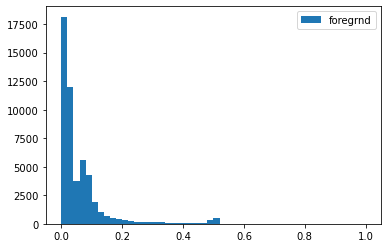

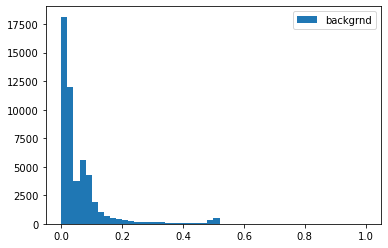

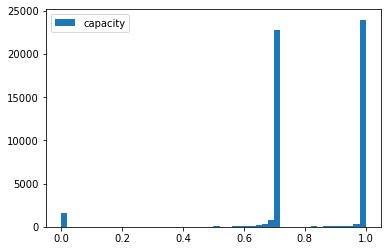

In [51]:
atts = ['foregrnd', 'backgrnd', 'capacity']
for att in atts:
    att_vals = [G_wgtd[p][q][att] for p, q in G_wgtd.edges]
    plt.hist(att_vals,bins=50,label=att);
    plt.legend();
    plt.show()

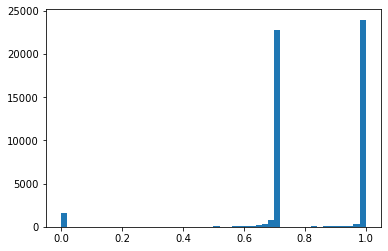

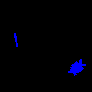

In [52]:
imagebk

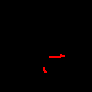

In [53]:
imagefg

In [65]:
G_rgb.nodes[2211], G_wgtd.nodes[2211]

({'r': 233,
  'g': 178,
  'b': 163,
  'Ig': 193,
  'Fore': 0,
  'Back': 0,
  'Prob_FG': 5.707371914652083e-22},
 {'r': 233,
  'g': 178,
  'b': 163,
  'Ig': 193,
  'Fore': 0,
  'Back': 0,
  'Prob_FG': 5.707371914652083e-22})

In [64]:
np.sqrt(233 ** 2 + 178 ** 2 + 163 ** 2)

0.005159135727579208

In [14]:
att_list = ['foregrnd', 'backgrnd']
G_tmp = G_wgtd.copy()

for (n1, n2, d) in G_tmp.edges(data=True):
    for att in att_list:
        d.pop(att, None)
nx.write_edgelist(G_tmp, 'G_test.edges', delimiter=',')

In [20]:
nx.write_edgelist(G_wgtd, 'G_test.edges', delimiter=',', data=['capacity'])

# Diving into the shortest path issue between networkx, csrgraph and scipy_sparse

In [9]:
import csrgraph as cg
import scipy

In [13]:
def get_path(Pr, i, j):
    path = [j]
    k = j
    while Pr[i, k] != -9999:
        path.append(Pr[i, k])
        k = Pr[i, k]
    return path[::-1]

In [39]:
len(G_wgtd.nodes), 92*92 # compare G.nodes length to # of pixels

(6561, 8464)

In [85]:
nodelist = [node for node in G_wgtd.nodes]
nodelist[:10], nodelist[-10:]

([21, 23, 24, 25, 26, 27, 28, 29, 30, 31],
 [3311, 3495, 3587, 3679, 3771, 4047, 4139, 4231, 4323, 4507])

In [8]:
G_wgtd.nodes()

NodeView((21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 2025, 2117, 2209, 2301, 2393, 2484, 2485, 2668, 2669, 2760, 2761, 2852, 2853, 2944, 2945, 3036, 3037, 3128, 3129, 3220, 3221, 3312, 3313, 3404, 3405, 3496, 3497, 3588, 3589, 3680, 3681, 3865, 3956, 3957, 4048, 4049, 4140, 4141, 4232, 4233, 4324, 4325, 4416, 4417, 4600, 4601, 4785, 4877, 1934, 2118, 2210, 2302, 2394, 2486, 2578, 2670, 2762, 2854, 2946, 3038, 3130, 3222, 3314, 3406, 3498, 3590, 3682, 3774, 3866, 3958, 4050, 4142, 4234, 4326, 4418, 4510, 4602, 4786, 1843, 1935, 2027, 2119, 2211, 2303, 2395, 2487, 2579, 2671, 2763, 2855, 2947, 3039, 3131, 3223, 3315, 3407, 3499, 3591, 3683, 3775, 3867, 3959, 4051, 4143, 4235, 4327, 4419, 4511, 4603, 4787, 4879, 4971, 5155, 5247, 1752, 1936, 2028, 2120, 2212, 2304, 2396, 2488, 2580, 2672, 2764, 2856, 2948, 3040, 3132, 3224, 3316, 3408, 3500, 3592, 3684, 3776, 3868, 3960, 4052, 

In [9]:
node_dict = {x: str(x) for x in G_wgtd.nodes()}
G_nx = nx.relabel_nodes(G_wgtd,mapping=node_dict,copy=True)

In [10]:
G_nx.nodes()

NodeView(('21', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '2025', '2117', '2209', '2301', '2393', '2484', '2485', '2668', '2669', '2760', '2761', '2852', '2853', '2944', '2945', '3036', '3037', '3128', '3129', '3220', '3221', '3312', '3313', '3404', '3405', '3496', '3497', '3588', '3589', '3680', '3681', '3865', '3956', '3957', '4048', '4049', '4140', '4141', '4232', '4233', '4324', '4325', '4416', '4417', '4600', '4601', '4785', '4877', '1934', '2118', '2210', '2302', '2394', '2486', '2578', '2670', '2762', '2854', '2946', '3038', '3130', '3222', '3314', '3406', '3498', '3590', '3682', '3774', '3866', '3958', '4050', '4142', '4234', '4326', '4418', '4510', '4602', '4786', '1843', '1935', '2027', '2119', '2211', '2303', '2395', '2487', '2579', '2671', '2763', '2855', '2947', '3039', '3131', '3223', '331

# Compare with string node graph

In [13]:
nx_pth = nx.shortest_path(G_nx,str(n1),str(n2),weight='capacity')
print(nx_pth)
print(nx.shortest_path_length(G_nx,str(n1),str(n2),weight='capacity'))

['2211', '2118', '2210', '2301', '2394', '2485', '2578', '2669', '2760', '2853', '2946', '3039', '3132', '3223', '3314', '3407', '3498', '3589', '3681', '3774', '3865', '3866', '3957', '4049', '4142', '4233', '4324', '4417', '4510', '4603', '4696', '4787', '4880', '4973', '5066', '5157', '5250', '5343', '5436', '5529', '5622', '5715', '5808', '5901', '5994', '6085', '6178', '6271', '6364', '6457', '6550', '6643', '6736', '6829', '6922', '7015', '6924', '7017', '7110', '7203', '7296', '7389', '7298', '7391', '7484', '7577', '7486', '7579', '7672', '7763', '7856', '7949', '8042', '8133', '8226', '8319', '8228', '8321', '8414', '8323', '8232', '8141', '8234', '8327', '8420', '8329', '8330', '8239', '8332', '8241', '8334', '8242', '8335', '8428', '8337', '8430', '8339', '8340', '8249', '8158', '8067', '7976', '7885', '7794', '7701', '7610', '7519', '7520', '7427', '7336', '7243', '7150', '7241', '7148', '7055']
17.857795001029757


In [16]:
nx_map = {v: k for k, v in sci_map.items()}
nx_map[121], nx_map[4837]

(2211, 7055)

In [15]:
nodelist = [node for node in G_wgtd.nodes()]
sci_map = {node: i for i, node in enumerate(nodelist)}
sci_map[n1], sci_map[n2]

(121, 4837)

# The orginal results in networkx with this graph

In [10]:
n1, n2 = (2211, 7055)
nx_pth = nx.shortest_path(G_wgtd,
                          n1,
                          n2,
                          weight='capacity')
# check the path to make sure that successive nodes
# are actually neighbors
for i in range(len(nx_pth)-1):
    neigh = list(G[nx_pth[i]])
    if nx_pth[i+1] not in neigh:
        print(f'no neighbor found with {nx_pth[i+1]} in {neigh}')

In [11]:
print(nx_pth)
print(nx.shortest_path_length(G_wgtd,n1,n2,weight='capacity'))

[2211, 2118, 2210, 2301, 2394, 2485, 2578, 2669, 2760, 2853, 2946, 3039, 3132, 3223, 3314, 3407, 3498, 3589, 3681, 3774, 3865, 3866, 3957, 4049, 4142, 4233, 4324, 4417, 4510, 4603, 4696, 4787, 4880, 4973, 5066, 5157, 5250, 5343, 5436, 5529, 5622, 5715, 5808, 5901, 5994, 6085, 6178, 6271, 6364, 6457, 6550, 6643, 6736, 6829, 6922, 7015, 6924, 7017, 7110, 7203, 7296, 7389, 7298, 7391, 7484, 7577, 7486, 7579, 7672, 7763, 7856, 7949, 8042, 8133, 8226, 8319, 8228, 8321, 8414, 8323, 8232, 8141, 8234, 8327, 8420, 8329, 8330, 8239, 8332, 8241, 8334, 8242, 8335, 8428, 8337, 8430, 8339, 8340, 8249, 8158, 8067, 7976, 7885, 7794, 7701, 7610, 7519, 7520, 7427, 7336, 7243, 7150, 7241, 7148, 7055]
17.857795001029757


In [12]:
G_wgtd[2211]

AtlasView({2212: {'capacity': 0.9526948684822425, 'foregrnd': 0.4966584284847566, 'backgrnd': 0.4966584284847566}, 2210: {'capacity': 0.9879579413311241, 'foregrnd': 0.5, 'backgrnd': 0.5}, 2303: {'capacity': 0.9669067707250065, 'foregrnd': 0.49993367157362534, 'backgrnd': 0.49993367157362534}, 2119: {'capacity': 0.00037903676358321485, 'foregrnd': 0.0, 'backgrnd': 0.0}, 2304: {'capacity': 0.673663462369002, 'foregrnd': 0.4966584284847566, 'backgrnd': 0.4966584284847566}, 2118: {'capacity': 9.253880897728794e-05, 'foregrnd': 0.0, 'backgrnd': 0.0}, 2302: {'capacity': 0.6555480353708443, 'foregrnd': 0.4870168827646382, 'backgrnd': 0.4870168827646383}, 2120: {'capacity': 0.6487445861069564, 'foregrnd': 0.46781561810020456, 'backgrnd': 0.46781561810020456}})

# Go directly from nx to scipy_sparse and compare

In [31]:
A = nx.to_scipy_sparse_matrix(G_wgtd,weight='capacity',nodelist=nodelist)
res, pths = shortest_path(A,
                          indices=[sci_map[n1],  # <==== note: mapping required
                                   sci_map[n2]], # <==== note: mapping required
                          directed=False,
                          return_predecessors=True)
res[0,sci_map[n2]], res[1,sci_map[n1]]

(17.857795001029757, 17.85779500102976)

In [29]:
A = nx.to_scipy_sparse_matrix(G_wgtd,weight='capacity')
res, pths = shortest_path(A,
                          indices=[n1,n2], # <==== note: no mapping
                          directed=False,
                          return_predecessors=True)
res[0,n2], res[1,n1]

ValueError: indices out of range 0...N

In [96]:
print([nx_map[node] for node in get_path(pths, 0, sci_map[n2])])
print([nx_map[node] for node in get_path(pths, 1, sci_map[n1])])

[2211, 2118, 2210, 2301, 2394, 2485, 2578, 2669, 2760, 2853, 2946, 3039, 3132, 3223, 3314, 3407, 3498, 3589, 3681, 3774, 3865, 3866, 3957, 4049, 4142, 4233, 4324, 4417, 4510, 4603, 4696, 4787, 4880, 4973, 5066, 5157, 5250, 5343, 5436, 5529, 5622, 5715, 5808, 5901, 5994, 6085, 6178, 6271, 6364, 6457, 6550, 6643, 6736, 6829, 6922, 7015, 6924, 7017, 7110, 7203, 7296, 7389, 7298, 7391, 7484, 7577, 7486, 7579, 7672, 7763, 7856, 7949, 8042, 8133, 8226, 8319, 8228, 8321, 8414, 8323, 8232, 8141, 8234, 8327, 8420, 8329, 8330, 8239, 8332, 8241, 8334, 8242, 8335, 8428, 8337, 8430, 8339, 8340, 8249, 8158, 8067, 7976, 7885, 7794, 7701, 7610, 7519, 7520, 7427, 7336, 7243, 7150, 7241, 7148, 7055]
[7055, 7148, 7241, 7150, 7243, 7336, 7427, 7520, 7519, 7610, 7701, 7794, 7885, 7976, 8067, 8158, 8249, 8340, 8339, 8430, 8337, 8428, 8335, 8242, 8334, 8241, 8332, 8239, 8330, 8329, 8420, 8327, 8234, 8141, 8232, 8323, 8414, 8321, 8228, 8319, 8226, 8133, 8042, 7949, 7856, 7763, 7672, 7579, 7486, 7577, 7484, 73

In [99]:
nx.shortest_path(G_wgtd,n1,n2,weight='capacity') ==[nx_map[node] for node in get_path(pths, 0, sci_map[n2])]

True

In [100]:
%timeit nx.shortest_path_length(G_wgtd,n1,n2,weight='capacity')

29 ms ± 76 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [101]:
%timeit scipy.sparse.csgraph.shortest_path(A,indices=[sci_map[n1],sci_map[n2]],directed=False)

4.83 ms ± 25.6 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


# The original graph written to file

In [185]:
nx.write_edgelist(G_wgtd, 'G_test.edges', delimiter=',', data=['capacity'])

# Read in the graph in csrgraph

In [208]:
G = cg.read_edgelist("G_test.edges", sep=',')

In [209]:
G.mat.shape

(6561, 6561)

# Get scipy sparse results

In [210]:
res, pths = scipy.sparse.csgraph.shortest_path(G.mat,indices=[2211,4463],directed=False,return_predecessors=True)
res[0,4463], res[1,2211]

(17.945686403739117, 17.945686403739117)

# Extract the path for comparison

In [212]:
print(get_path(pths, 1, 2211))
print(get_path(pths, 0, 4463))

[4463, 4380, 4295, 4208, 4119, 4033, 3941, 3850, 3761, 3669, 3578, 3485, 3392, 3303, 3215, 3126, 3033, 2942, 2851, 2762, 2669, 2579, 2487, 2395, 2303, 2211]
[2211, 2303, 2395, 2487, 2579, 2669, 2762, 2853, 2944, 3035, 3126, 3215, 3303, 3392, 3485, 3578, 3669, 3761, 3850, 3941, 4033, 4119, 4208, 4295, 4380, 4463]


# Note in the results above that neither the weighted distance nor the path agree between networkx and scipy

# checking neighbors of endpoints shows that 4380 is not a neighbor of 4463 - checked in both original graph and sparse graph

In [200]:
[k for k, v in G_wgtd[2211].items()], [k for k, v in G_wgtd[4463].items()]

([2212, 2210, 2303, 2119, 2304, 2118, 2302, 2120],
 [4464, 4462, 4555, 4371, 4556, 4370, 4554, 4372])

In [201]:
G[2211], G[4463]

(array([2303, 2304, 2212, 2120, 2119, 2304, 2303, 2118, 2302, 2119, 2210,
        2118, 2212, 2120, 2302, 2210], dtype=int64),
 array([4555, 4556, 4464, 4464, 4462, 4371, 4372, 4370, 4554, 4371, 4556,
        4370, 4372, 4462, 4555, 4554], dtype=int64))

# Manually check that all edges in nx graph are actually equal for (i,j) and (j,i)

In [202]:
for edge in G_wgtd.edges:
    p, q = edge
    if G_wgtd[p][q]['capacity'] != G_wgtd[q][p]['capacity']:
        print(p, q)

# Manually check that all nodes in min path for sparse are actually neighbors. They are not. And some are not nodes in graph???

In [203]:
res, sc_pths = scipy.sparse.csgraph.shortest_path(G.mat,indices=[2211,4463],directed=False,return_predecessors=True)

sc_pth = get_path(sc_pths, 0, 4463)
print(sc_pth)

for i in range(len(sc_pth)-1):
    print(f"node: {sc_pth[i]}")
    neigh = list(G[sc_pth[i]])
    if sc_pth[i+1] not in neigh:
        print(f'no neighbor found with {sc_pth[i+1]} in {neigh}')

[2211, 2303, 2395, 2487, 2577, 2669, 2762, 2853, 2944, 3035, 3126, 3215, 3303, 3392, 3485, 3578, 3669, 3761, 3850, 3941, 4033, 4119, 4208, 4295, 4380, 4463]
node: 2211
node: 2303
node: 2395
node: 2487
no neighbor found with 2577 in [2578, 2488, 2580, 2486, 2486, 2394, 2579, 2578, 2396, 2488, 2394, 2396, 2580, 2579, 2395, 2395]
node: 2577


IndexError: index 0 is out of bounds for axis 0 with size 0

# Work backwards: convert sparse to networkx and check results once more

In [204]:
G_new = nx.from_scipy_sparse_matrix(G.mat,create_using=nx.DiGraph)

In [205]:
# weight i,j is equal to weight j,i
for edge in G_new.edges:
    p, q = edge
    if G_new[p][q]['weight'] != G_new[q][p]['weight']:
        print(p, q)

In [206]:
nx_pth = nx.shortest_path(G_new,2211,4463,weight='weight')
# check the path to make sure that successive nodes
# are actually neighbors
for i in range(len(nx_pth)-1):
    neigh = list(G_new[nx_pth[i]])
    if nx_pth[i+1] not in neigh:
        print(f'no neighbor found with {nx_pth[i+1]} in {neigh}')

In [207]:
print(nx_pth)
print(nx.shortest_path_length(G_new,2211,4463,weight='weight'))

[2211, 2303, 2395, 2487, 2577, 2669, 2762, 2851, 2944, 3035, 3126, 3215, 3303, 3392, 3485, 3578, 3669, 3761, 3850, 3941, 4033, 4119, 4208, 4295, 4380, 4463]
17.945686403739117


In [115]:
G_wgtd[4463], G_wgtd[2296]

(AtlasView({4464: {'capacity': 0.9996635246304472, 'foregrnd': 0.03729118189039121, 'backgrnd': 0.037291181890391156}, 4462: {'capacity': 1.0, 'foregrnd': 0.0, 'backgrnd': 0.0}, 4555: {'capacity': 1.0, 'foregrnd': 0.0, 'backgrnd': 0.0}, 4371: {'capacity': 0.9996635246304472, 'foregrnd': 0.03729118189039121, 'backgrnd': 0.037291181890391156}, 4556: {'capacity': 0.7071135624381276, 'foregrnd': 0.0, 'backgrnd': 0.0}, 4370: {'capacity': 0.7068756361408904, 'foregrnd': 0.03729118189039121, 'backgrnd': 0.037291181890391156}, 4554: {'capacity': 0.7068756361408904, 'foregrnd': 0.04758560332961803, 'backgrnd': 0.04758560332961803}, 4372: {'capacity': 0.7068756361408904, 'foregrnd': 0.03729118189039121, 'backgrnd': 0.037291181890391156}}),
 AtlasView({2388: {'capacity': 0.9946299586585818, 'foregrnd': 0.0, 'backgrnd': 0.0}, 2204: {'capacity': 1.0, 'foregrnd': 0.0, 'backgrnd': 0.0}, 2389: {'capacity': 0.7068756361408904, 'foregrnd': 0.0, 'backgrnd': 0.0}, 2203: {'capacity': 0.7068756361408904, 'f

In [ ]:
def get_path(Pr, i, j):
    path = [j]
    k = j
    while Pr[i, k] != -9999:
        path.append(Pr[i, k])
        k = Pr[i, k]
    return path[::-1]
nodelist = [node for node in G_wgtd.nodes]
node_dict = {x: str(x) for x in G_wgtd.nodes()}
G_nx = nx.relabel_nodes(G_wgtd,mapping=node_dict,copy=True)
A = nx.to_scipy_sparse_matrix(G_wgtd,weight='capacity',nodelist=nodelist)
sci_map = {node: i for i, node in enumerate(nodelist)}
res, pths = scipy.sparse.csgraph.shortest_path(A,indices=[sci_map[n1],sci_map[n2]],directed=False,return_predecessors=True)
res[0,sci_map[n2]], res[1,sci_map[n1]]
print([nx_map[node] for node in get_path(pths, 0, sci_map[n2])])
print([nx_map[node] for node in get_path(pths, 1, sci_map[n1])])

In [105]:
graph = scipy.sparse.csr_matrix([[0, 16, 13,  0,  0,  0],
                    [0, 10,  0, 12,  0,  0],
                    [0,  4,  0,  0, 14,  0],
                    [0,  0,  9,  0,  0, 20],
                    [0,  0,  0,  7,  0,  4],
                    [0,  0,  0,  0,  0,  0]])
res = scipy.sparse.csgraph.maximum_flow(graph, 0, 5)

matrix([[ 0, 16, 13,  0,  0,  0],
        [ 0, 10,  0, 12,  0,  0],
        [ 0,  4,  0,  0, 14,  0],
        [ 0,  0,  9,  0,  0, 20],
        [ 0,  0,  0,  7,  0,  4],
        [ 0,  0,  0,  0,  0,  0]], dtype=int32)

In [8]:
shutil.rmtree('./joblib_memmap')

PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: './joblib_memmap\\ab3.mmap'

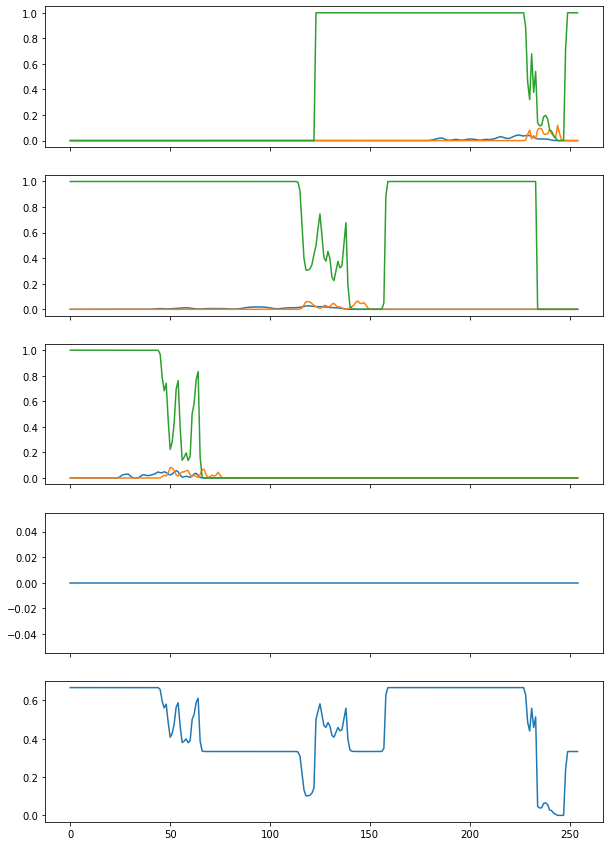

In [46]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5,1,figsize=(10,15),sharex='col')

xr = np.arange(0,255,1)
#print(sum(kde_r_fg.evaluate(xr)))
#print(sum(kde_r_bk.evaluate(xr)))
f = lambda x, y: 0. if (x+y) == 0 else x / (x+y)
tol = 1E-60
hmn = lambda x, y, z: 0 if (x*y*z) <= tol else 3. / (1./x + 1./y + 1./z)

ax1.plot(kde_r_fg.evaluate(xr))
ax1.plot(kde_r_bk.evaluate(xr))
prbr = [f(x,y) for x, y in zip(kde_r_fg.evaluate(xr), kde_r_bk.evaluate(xr))]
ax1.plot(prbr)

ax2.plot(kde_g_fg.evaluate(xr))
ax2.plot(kde_g_bk.evaluate(xr))
prbg = [f(x,y) for x, y in zip(kde_g_fg.evaluate(xr), kde_g_bk.evaluate(xr))]
ax2.plot(prbg)

ax3.plot(kde_b_fg.evaluate(xr))
ax3.plot(kde_b_bk.evaluate(xr))
prbb = [f(x,y) for x, y in zip(kde_b_fg.evaluate(xr), kde_b_bk.evaluate(xr))]
ax3.plot(prbb)

hr = [hmn(x,y,z) for x, y, z in zip(prbr, prbg, prbb)]
ax4.plot(hr)

mn = [np.mean([x,y,z]) for x, y, z in zip(prbr, prbg, prbb)]
ax5.plot(mn)

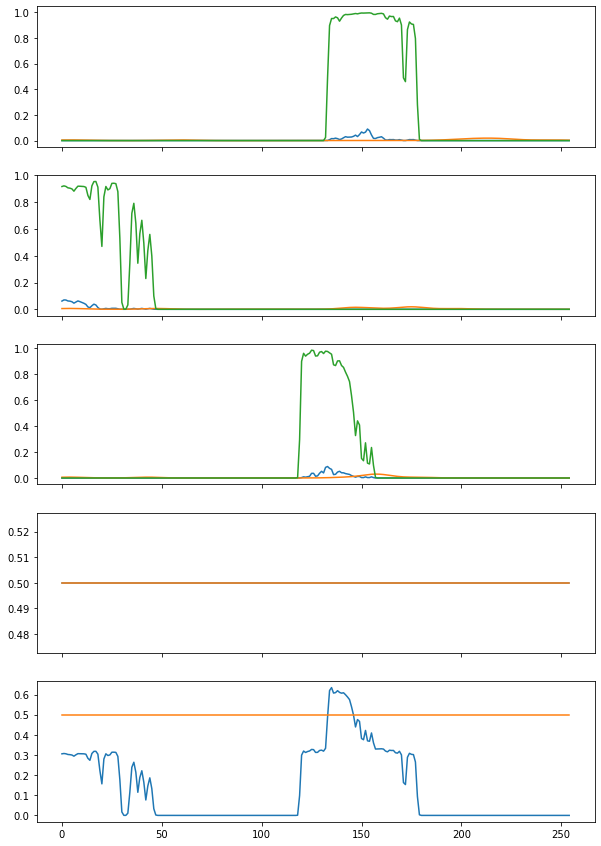

In [62]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5,1,figsize=(10,15),sharex='col')

xr = np.arange(0,255,1)
#print(sum(kde_r_fg.evaluate(xr)))
#print(sum(kde_r_bk.evaluate(xr)))
f = lambda x, y: 0.5 if (x+y) == 0 else x / (x+y)
tol = 1E-60
hmn = lambda x, y, z: 0.5 if (x*y*z) <= tol else 3. / (1./x + 1./y + 1./z)

ax1.plot(kde_r_fg.evaluate(xr))
ax1.plot(kde_r_bk.evaluate(xr))
prbr = [f(x,y) for x, y in zip(kde_r_fg.evaluate(xr), kde_r_bk.evaluate(xr))]
ax1.plot(prbr)

ax2.plot(kde_g_fg.evaluate(xr))
ax2.plot(kde_g_bk.evaluate(xr))
prbg = [f(x,y) for x, y in zip(kde_g_fg.evaluate(xr), kde_g_bk.evaluate(xr))]
ax2.plot(prbg)

ax3.plot(kde_b_fg.evaluate(xr))
ax3.plot(kde_b_bk.evaluate(xr))
prbb = [f(x,y) for x, y in zip(kde_b_fg.evaluate(xr), kde_b_bk.evaluate(xr))]
ax3.plot(prbb)

hr = [hmn(x,y,z) for x, y, z in zip(prbr, prbg, prbb)]
ax4.plot(hr)
ax4.plot([0,254],[0.5,0.5])

mn = [np.mean([x,y,z]) for x, y, z in zip(prbr, prbg, prbb)]
ax5.plot(mn)
ax5.plot([0,254],[0.5,0.5])

In [35]:
%timeit dst, pth = nx.single_source_dijkstra(G_wgtd, 103, 21193, weight='capacity')

286 ms ± 8.1 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [36]:
%timeit dst = nx.shortest_path_length(G_wgtd, 103, 21193, weight='capacity')

204 ms ± 423 µs per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [9]:
img = image_orig.convert(mode='L')

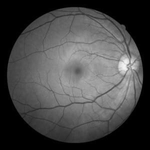

In [10]:
img

In [11]:
np.var(img)

3462.973719583211

In [1]:
img = image_orig.convert(mode='L')

NameError: name 'image_orig' is not defined

In [49]:
for node in list(nodes):
    dst = nx.shortest_path_length(G, node, scrbl, weight=sgmnt)
    img.putpixel(pxl[node], int(dst))

TypeError: 'Image' object is not iterable

In [31]:
edges = list(pairwise(pth))
summ = 0
for edge in edges:
    n1, n2 = edge
    summ += G_wgtd[n1][n2]['capacity']
print(dst, summ)

39.55828987666888 39.55828987666888


In [16]:
G_wgtd.edges([5067],data=True)

OutEdgeDataView([(5067, 5068, {'capacity': 0.9995254289867592, 'foregrnd': 0, 'backgrnd': 0.0}), (5067, 5066, {'capacity': 1.0, 'foregrnd': 0, 'backgrnd': 0.0}), (5067, 5315, {'capacity': 0.706777986838325, 'foregrnd': 0, 'backgrnd': 0.0}), (5067, 4819, {'capacity': 0.7071135624381276, 'foregrnd': 0, 'backgrnd': 0.0}), (5067, 5316, {'capacity': 0.7057722152633575, 'foregrnd': 0, 'backgrnd': 0.0}), (5067, 4818, {'capacity': 0.706777986838325, 'foregrnd': 0, 'backgrnd': 0.0}), (5067, 5314, {'capacity': 0.706777986838325, 'foregrnd': 0, 'backgrnd': 0.0}), (5067, 4820, {'capacity': 0.706777986838325, 'foregrnd': 0, 'backgrnd': 0.0})])

In [26]:
from networkx.utils import pairwise

[(103, 104),
 (104, 353),
 (353, 602),
 (602, 851),
 (851, 1099),
 (1099, 1347),
 (1347, 1595),
 (1595, 1843),
 (1843, 2091),
 (2091, 2339),
 (2339, 2587),
 (2587, 2835),
 (2835, 3083),
 (3083, 3331),
 (3331, 3579),
 (3579, 3827),
 (3827, 4075),
 (4075, 4323),
 (4323, 4571),
 (4571, 4819),
 (4819, 5067),
 (5067, 5315),
 (5315, 5563),
 (5563, 5811),
 (5811, 6059),
 (6059, 6307),
 (6307, 6555),
 (6555, 6803),
 (6803, 7051),
 (7051, 7299),
 (7299, 7547),
 (7547, 7795),
 (7795, 8043),
 (8043, 8291),
 (8291, 8539),
 (8539, 8787),
 (8787, 9035),
 (9035, 9283),
 (9283, 9531),
 (9531, 9779),
 (9779, 10027),
 (10027, 10275),
 (10275, 10523),
 (10523, 10771),
 (10771, 11019),
 (11019, 11267),
 (11267, 11515),
 (11515, 11763),
 (11763, 12011),
 (12011, 12259),
 (12259, 12507),
 (12507, 12755),
 (12755, 13003),
 (13003, 13251),
 (13251, 13499),
 (13499, 13747),
 (13747, 13995),
 (13995, 14243),
 (14243, 14491),
 (14491, 14739),
 (14739, 14987),
 (14987, 15235),
 (15235, 15483),
 (15483, 15731),
 (

In [19]:
n2=50308
pth =nx.shortest_path(G_wgtd, source=175, target=n2, weight='foregrnd') 
edges = list(pairwise(pth))
nx.shortest_path_length(G_wgtd, source=175, target=n2, weight='foregrnd')

0

In [20]:
for edge in edges:
    print(G_wgtd.edges[edge])

{'capacity': 0.9887264813835837, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.6991419045280609, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.7020012952444529, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.5080543479103495, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.6915736740913232, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.24871881543151397, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.02284279459056174, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.2596684641314433, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.6915736740913232, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.6469732280566427, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.7020012952444529, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.7067929578282033, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.7071135624381276, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.7058320159057654, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.7058320159057654, 'foregrnd': 0, 'backgrnd': 0.0}
{'capacity': 0.70711356

In [16]:
G_wgtd.nodes

NodeView((175, 176, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 215, 216, 43369, 43646, 43647, 43924, 43925, 44758, 44759, 45036, 45037, 45314, 45315, 45592, 45593, 45870, 45871, 46148, 46149, 46426, 46427, 46704, 46705, 46982, 46983, 47260, 47261, 47538, 47539, 47816, 47817, 48094, 48095, 48372, 48373, 48650, 48651, 48928, 48929, 49206, 49207, 49484, 49485, 49762, 49763, 50040, 50041, 50318, 50319, 50596, 50597, 50874, 50875, 51152, 51153, 51430, 51431, 51708, 51709, 51986, 51987, 52264, 52265, 53098, 53099, 53376, 53377, 53655, 43092, 43370, 43648, 43926, 44760, 45038, 45316, 45594, 45872, 46150, 46428, 46706, 46984, 47262, 47540, 47818, 48096, 48374, 48652, 48930, 49208, 49486, 49764, 50042, 50320, 50598, 50876, 51154, 51432, 51710, 51988, 52266, 53100, 53378, 53656, 53934, 43649, 43927, 44761, 45039, 45317, 45595, 45873, 46151, 46429, 46707, 46985, 47263, 47

In [87]:
int(0.9695*255)

247

In [81]:
n1, n2 = (176, 455)
length, path = nx.bidirectional_dijkstra(G_wgtd, n1, n2, weight='foregrnd')

In [84]:
length, G_wgtd.edges[(n1, n2)], G_wgtd.nodes[n1], G_wgtd.nodes[n2]

(0,
 {'capacity': 0.6991419045280609, 'foregrnd': 0, 'backgrnd': 0.0},
 {'r': 7, 'g': 5, 'b': 5, 'Ig': 6, 'Fore': 0, 'Back': 0, 'Prob_FG': 0},
 {'r': 1, 'g': 1, 'b': 1, 'Ig': 1, 'Fore': 0, 'Back': 0, 'Prob_FG': 0})

In [73]:
path

[175,
 176,
 455,
 734,
 1013,
 1291,
 1569,
 1847,
 2125,
 2403,
 2681,
 2959,
 3237,
 3515,
 3793,
 4071,
 4350,
 4629,
 4908,
 5187,
 5466,
 5745,
 6024,
 6303,
 6582,
 6861,
 7140,
 7419,
 7698,
 7977,
 8256,
 8535,
 8814,
 9093,
 9372,
 9651,
 9930,
 10209,
 10488,
 10767,
 11046,
 11325,
 11604,
 11883,
 12162,
 12441,
 12720,
 12999,
 13278,
 13557,
 13836,
 14115,
 14394,
 14673,
 14952,
 15231,
 15510,
 15789,
 16068,
 16347,
 16626,
 16904,
 16905,
 17183,
 17460,
 17738,
 18017,
 18295,
 18572,
 18849,
 19126,
 19403,
 19680,
 19957,
 20234,
 20513,
 20791,
 21069,
 21346,
 21625,
 21904,
 22183,
 22462]

In [65]:
G_rgb.nodes['175']

KeyError: '175'

In [49]:
len(G_rgb.nodes), len(G_rgb.edges)

(65022, 512506)

In [54]:
G_rgb.edges[(188, 467)]

{}

In [11]:
H = G_rgb.to_undirected()

In [12]:
len(H.nodes), len(H.edges)

(49336, 193473)

In [14]:
H.edges[(67,68)]['foregrnd']

KeyError: 'foregrnd'

In [21]:
nx.is_strongly_connected(G_rgb)

False

In [41]:
H = list(max(nx.strongly_connected_components(G_rgb), key=len))
Gnodes = list(G_rgb.nodes)
print(len(H))
print(len(Gnodes))
diff = set(Gnodes) - set(H)
G_rgb.remove_nodes_from(diff)

65022
65112


In [44]:
len(G_rgb.nodes)

65022

In [55]:
def filter_node(n1):
    return n1 != 5
view = nx.subgraph_view(G, filter_node=filter_node,

(290, 260)


((281, 129), (282, 159))

In [83]:
#pxl = x_y_for_p((180, 90))
dic = {}
tpls = [(1,y) for x in [0,1,2] for y in [3,4,5]]
[dic.update({x:y}) for x, y in zip(list(np.arange(9)),tpls)]
dic

{0: (1, 3),
 1: (1, 4),
 2: (1, 5),
 3: (1, 3),
 4: (1, 4),
 5: (1, 5),
 6: (1, 3),
 7: (1, 4),
 8: (1, 5)}

In [13]:
G = nx.path_graph(3)
list(G.nodes)

[0, 1, 2]

In [14]:
list(G)

[0, 1, 2]

In [15]:
G.add_node(1, fgrnd="5pm")
G.nodes[0]["foo"] = "bar"

In [19]:
for node in G.nodes:
    print(G.nodes[node]["foo"])

bar


KeyError: 'foo'

In [6]:
r, g, b = (223, 156, 79)
r, g, b

(223, 156, 79)

In [7]:
G.nodes[0]["r", "g", "b"] = (r, g, b)

In [8]:
G.nodes[0]

{'foo': 'bar', ('r', 'g', 'b'): (223, 156, 79)}

In [10]:
G.nodes[0]["r", "g", "b"]

(223, 156, 79)

In [19]:
G.nodes[0]["foo"]

'bar'

In [49]:
tst = set(G.edges)

(44550, 44339)
(16623, 16624)
(55009, 55221)
(24964, 24963)
(5859, 5860)
(36792, 36580)
(38440, 38228)
(48899, 49110)
(29794, 30007)
(8625, 8624)
(51851, 51852)
(38135, 38346)
(11577, 11366)
(23684, 23896)
(14808, 15021)
(12920, 13132)
(6810, 7021)
(26396, 26397)
(48453, 48242)
(20526, 20527)
(56794, 56581)
(9762, 9763)
(58672, 58883)
(42038, 42249)
(61624, 61625)
(40455, 40242)
(31579, 31367)
(1764, 1763)
(17128, 16917)
(6364, 6153)
(18471, 18683)
(16823, 17035)
(15240, 15028)
(59809, 60022)
(254, 42)
(38640, 38639)
(10713, 10924)
(58226, 58015)
(19535, 19536)
(30299, 30300)
(62575, 62786)
(51811, 52022)
(37360, 37572)
(35242, 35029)
(28484, 28697)
(7315, 7314)
(36825, 37036)
(10267, 10056)
(8379, 8167)
(10027, 9815)
(48413, 48412)
(62129, 61918)
(20486, 20697)
(11610, 11822)
(23438, 23439)
(25086, 25087)
(63472, 63684)
(2269, 2056)
(54131, 53918)
(45255, 45043)
(57362, 57573)
(55714, 55925)
(15440, 15439)
(38257, 38470)
(454, 453)
(28916, 28704)
(20040, 19829)
(30499, 30711)
(28381, 

(43174, 43385)
(51996, 51997)
(30827, 30614)
(24069, 24282)
(46126, 46127)
(2900, 2899)
(32410, 32621)
(5852, 5641)
(7500, 7289)
(17959, 18171)
(7195, 7407)
(57714, 57503)
(60945, 61158)
(38128, 38127)
(1085, 1296)
(20671, 20672)
(59057, 59269)
(53187, 53399)
(40840, 40628)
(52947, 53158)
(55899, 55900)
(34730, 34517)
(27972, 28185)
(639, 428)
(11098, 11310)
(9515, 9303)
(47901, 47900)
(10858, 11069)
(32915, 32914)
(52501, 52290)
(24574, 24575)
(62960, 63172)
(13810, 13811)
(44743, 44531)
(56850, 57061)
(46391, 46179)
(37745, 37958)
(16576, 16575)
(59802, 59803)
(46086, 46297)
(44503, 44290)
(19528, 19317)
(31635, 31847)
(20871, 21083)
(34347, 34348)
(42688, 42687)
(56404, 56193)
(14761, 14972)
(3997, 4208)
(54516, 54304)
(48406, 48193)
(39530, 39318)
(37642, 37429)
(32532, 32745)
(11363, 11362)
(9715, 9714)
(23191, 22979)
(61577, 61576)
(14315, 14104)
(24774, 24986)
(24534, 24745)
(38250, 38251)
(46591, 46590)
(27486, 27487)
(6317, 6104)
(60067, 59855)
(58179, 57966)
(51421, 51634)
(4

(54159, 54372)
(59269, 59056)
(32990, 32989)
(31342, 31341)
(13885, 13886)
(44818, 44606)
(35942, 35731)
(46401, 46613)
(34054, 33842)
(46161, 46372)
(59877, 59878)
(49113, 49114)
(27944, 27731)
(21186, 21399)
(19068, 18856)
(20946, 21158)
(2729, 2517)
(4072, 4283)
(26129, 26128)
(54591, 54379)
(45715, 45504)
(17788, 17789)
(56174, 56386)
(7024, 7025)
(37957, 37745)
(50064, 50275)
(39605, 39393)
(30959, 31172)
(9790, 9789)
(53016, 53017)
(39300, 39511)
(37717, 37504)
(12742, 12531)
(24849, 25061)
(15973, 16186)
(14390, 14179)
(14085, 14297)
(27561, 27562)
(35902, 35901)
(49618, 49407)
(7975, 8186)
(47730, 47518)
(59837, 60048)
(62789, 62790)
(41620, 41407)
(32744, 32532)
(64437, 64438)
(2929, 2928)
(34622, 34834)
(4577, 4576)
(16405, 16193)
(7529, 7318)
(19636, 19848)
(17988, 18200)
(17748, 17959)
(11878, 12089)
(59391, 59180)
(31464, 31465)
(39805, 39804)
(20700, 20701)
(53281, 53069)
(63740, 63951)
(44635, 44848)
(23466, 23465)
(52976, 53187)
(38525, 38737)
(36407, 36194)
(29649, 298

(27049, 27050)
(63317, 63104)
(35390, 35389)
(48866, 48654)
(39990, 39779)
(12063, 12064)
(50449, 50661)
(50209, 50420)
(44339, 44550)
(63925, 63926)
(25234, 25447)
(4065, 4064)
(23651, 23440)
(53161, 53162)
(31992, 31779)
(7017, 6806)
(19124, 19336)
(8665, 8454)
(8360, 8572)
(6777, 6565)
(907, 695)
(58879, 58668)
(62110, 62323)
(21836, 21837)
(60222, 60434)
(54352, 54564)
(2250, 2461)
(42005, 41793)
(54112, 54323)
(57064, 57065)
(35895, 35682)
(29137, 29350)
(16790, 16579)
(28897, 29109)
(10680, 10468)
(49066, 49065)
(1804, 1593)
(12023, 12234)
(62542, 62330)
(53666, 53455)
(25739, 25740)
(64125, 64337)
(4570, 4357)
(34080, 34079)
(63885, 64096)
(58015, 58226)
(45668, 45455)
(38910, 39123)
(17741, 17740)
(47251, 47462)
(20693, 20482)
(22341, 22130)
(32800, 33012)
(20453, 20241)
(22036, 22248)
(54617, 54616)
(15926, 16137)
(35512, 35513)
(7585, 7798)
(5467, 5255)
(43853, 43852)
(3579, 3366)
(55681, 55469)
(57329, 57117)
(58912, 59124)
(57024, 57235)
(49571, 49358)
(10880, 10879)
(12528

(4128, 3915)
(57878, 57666)
(47114, 46902)
(59221, 59432)
(18947, 18946)
(32663, 32452)
(62173, 62174)
(41004, 40791)
(34246, 34459)
(13077, 13076)
(21899, 21688)
(34006, 34218)
(32358, 32570)
(64939, 64938)
(2313, 2312)
(45834, 45835)
(15789, 15577)
(54175, 54174)
(26248, 26459)
(30848, 30849)
(1033, 1245)
(51017, 50805)
(52895, 53107)
(50777, 50564)
(44019, 44232)
(22850, 22849)
(12086, 12085)
(25802, 25591)
(37909, 38121)
(25562, 25350)
(36021, 36232)
(58078, 58077)
(38973, 38974)
(21035, 21246)
(40621, 40622)
(12694, 12907)
(17804, 17591)
(2818, 2605)
(60790, 60578)
(53792, 54005)
(47922, 48135)
(26753, 26752)
(46339, 46128)
(54680, 54467)
(7648, 7649)
(46034, 46246)
(29705, 29494)
(15989, 15988)
(35575, 35364)
(47682, 47894)
(39924, 40135)
(31048, 31260)
(59510, 59511)
(29465, 29253)
(44524, 44525)
(4250, 4039)
(14709, 14921)
(64693, 64481)
(12591, 12378)
(5833, 6046)
(64453, 64240)
(57695, 57908)
(36526, 36525)
(25762, 25761)
(39478, 39267)
(51585, 51797)
(39238, 39026)
(2435, 24

(43991, 43778)
(37233, 37446)
(16064, 16063)
(19016, 18805)
(31123, 31335)
(18776, 18564)
(12906, 12694)
(52940, 52939)
(51292, 51291)
(11018, 10805)
(14249, 14460)
(5908, 6121)
(64768, 64556)
(54004, 53792)
(41136, 41349)
(19967, 19966)
(39553, 39342)
(47894, 47681)
(862, 863)
(28789, 28578)
(40896, 41108)
(61065, 61064)
(33138, 33349)
(22679, 22467)
(37738, 37739)
(16569, 16356)
(9811, 10024)
(46079, 46078)
(7923, 8135)
(5805, 5592)
(57907, 57695)
(57667, 57454)
(50909, 51122)
(29740, 29739)
(59250, 59461)
(32692, 32481)
(44799, 45011)
(34340, 34129)
(32452, 32240)
(34035, 34247)
(26582, 26370)
(64968, 64967)
(24694, 24481)
(47511, 47512)
(19584, 19797)
(27925, 28136)
(8820, 9033)
(1367, 1156)
(9708, 9495)
(2710, 2922)
(53229, 53018)
(61570, 61357)
(54812, 55025)
(33643, 33642)
(42465, 42254)
(54572, 54784)
(14538, 14539)
(22879, 22878)
(36355, 36143)
(27479, 27268)
(37938, 38150)
(51414, 51415)
(23487, 23700)
(59755, 59754)
(12723, 12936)
(11140, 10929)
(40650, 40651)
(19481, 19268)

(46965, 47178)
(44847, 44635)
(30396, 30185)
(2469, 2470)
(40855, 41067)
(38737, 38524)
(19632, 19421)
(62672, 62671)
(23981, 24192)
(43567, 43568)
(22398, 22185)
(15640, 15853)
(13522, 13310)
(51908, 51907)
(5764, 5551)
(63736, 63524)
(57626, 57413)
(20583, 20582)
(40169, 39958)
(50628, 50840)
(41752, 41965)
(1478, 1479)
(23535, 23324)
(35642, 35854)
(32411, 32199)
(33754, 33965)
(55811, 55810)
(47470, 47471)
(15537, 15324)
(10427, 10640)
(7196, 6985)
(60641, 60854)
(58523, 58311)
(30356, 30355)
(2429, 2640)
(52413, 52200)
(45655, 45868)
(44072, 43861)
(33308, 33097)
(45415, 45627)
(5381, 5382)
(43767, 43979)
(57243, 57244)
(27198, 26986)
(37657, 37868)
(20200, 20413)
(1983, 1772)
(12442, 12654)
(3566, 3779)
(64304, 64516)
(62186, 61973)
(55428, 55641)
(34259, 34258)
(6332, 6543)
(15154, 15155)
(23495, 23494)
(37211, 37000)
(49318, 49530)
(9284, 9285)
(36971, 36759)
(47430, 47641)
(29213, 29000)
(32444, 32655)
(24103, 24316)
(11756, 11545)
(5886, 5675)
(3998, 3786)
(7229, 7441)
(44032

(14858, 14857)
(34444, 34233)
(6517, 6518)
(44903, 45115)
(36027, 36240)
(26686, 26474)
(65072, 65071)
(28029, 28240)
(47615, 47616)
(19688, 19901)
(41745, 41746)
(9812, 9599)
(1471, 1260)
(2814, 3026)
(54916, 55129)
(53333, 53122)
(56564, 56777)
(61674, 61461)
(38347, 38136)
(27583, 27372)
(36459, 36247)
(51518, 51519)
(30349, 30136)
(21473, 21261)
(59859, 59858)
(31932, 32143)
(19585, 19372)
(12827, 13040)
(43520, 43519)
(6717, 6929)
(46472, 46261)
(58579, 58791)
(49703, 49916)
(28534, 28533)
(607, 818)
(48120, 47909)
(9429, 9430)
(61291, 61292)
(33364, 33577)
(55421, 55422)
(41705, 41916)
(23488, 23275)
(25136, 24923)
(18378, 18591)
(16490, 16702)
(36659, 36658)
(1504, 1716)
(38307, 38306)
(52023, 51812)
(10380, 10591)
(50135, 49923)
(41259, 41048)
(53366, 53578)
(13332, 13333)
(45608, 45819)
(65194, 65195)
(44025, 43812)
(35149, 34937)
(26503, 26716)
(5334, 5333)
(54430, 54431)
(28151, 28364)
(33261, 33048)
(20393, 20605)
(18275, 18062)
(9934, 9723)
(42210, 42209)
(14283, 14494)
(6

(18350, 18137)
(11592, 11805)
(9704, 9916)
(63454, 63667)
(31521, 31520)
(3594, 3805)
(45237, 45026)
(53578, 53365)
(34473, 34262)
(8194, 8195)
(46580, 46792)
(6546, 6547)
(38822, 39033)
(58408, 58409)
(37239, 37026)
(28363, 28151)
(19717, 19930)
(21365, 21578)
(13607, 13819)
(3148, 2937)
(35424, 35423)
(7497, 7708)
(55010, 54799)
(27083, 27084)
(63351, 63138)
(56593, 56806)
(16319, 16320)
(48595, 48806)
(40254, 40467)
(38136, 37924)
(30378, 30165)
(32026, 31813)
(25268, 25481)
(53195, 53196)
(14504, 14717)
(12921, 12710)
(7051, 6840)
(5163, 4951)
(45197, 45196)
(17270, 17481)
(8394, 8606)
(58913, 58702)
(48149, 47938)
(60256, 60468)
(20222, 20223)
(50915, 50702)
(42039, 41827)
(52498, 52709)
(12224, 12223)
(35041, 35254)
(16824, 16613)
(27283, 27495)
(25165, 24952)
(6060, 5849)
(10714, 10502)
(49100, 49099)
(10409, 10620)
(29995, 29996)
(52052, 51841)
(8826, 8613)
(64159, 64371)
(2068, 2281)
(38336, 38335)
(51812, 51600)
(62271, 62482)
(15009, 15010)
(53395, 53607)
(44054, 43841)
(472

(60590, 60379)
(21899, 21900)
(60285, 60497)
(52832, 52620)
(730, 517)
(58702, 58490)
(52592, 52379)
(45834, 46047)
(54175, 54386)
(5560, 5561)
(35070, 35283)
(27617, 27406)
(13901, 13900)
(35958, 35745)
(37836, 38047)
(28960, 29172)
(10743, 10531)
(50777, 50776)
(22850, 23061)
(12086, 12297)
(10503, 10290)
(62605, 62393)
(53729, 53518)
(3745, 3958)
(55607, 55820)
(63948, 64159)
(56495, 56282)
(37390, 37179)
(40621, 40834)
(45731, 45518)
(38973, 39186)
(17804, 17803)
(347, 348)
(38733, 38945)
(32863, 33075)
(31280, 31068)
(30975, 31186)
(20516, 20304)
(58902, 58901)
(7648, 7861)
(15989, 16200)
(35575, 35576)
(14406, 14193)
(3642, 3429)
(59510, 59723)
(57392, 57180)
(27577, 27576)
(19236, 19237)
(49634, 49421)
(55504, 55291)
(48746, 48959)
(4250, 4251)
(42636, 42848)
(32177, 31966)
(24419, 24207)
(64453, 64452)
(36526, 36737)
(24179, 23966)
(17421, 17634)
(25762, 25973)
(45348, 45349)
(547, 759)
(59407, 59194)
(54297, 54510)
(52649, 52862)
(31480, 31479)
(51066, 50855)
(12375, 12376)
(5

(24189, 24400)
(13730, 13518)
(25837, 26048)
(39553, 39554)
(862, 1075)
(28789, 28790)
(7620, 7407)
(61065, 61276)
(59482, 59269)
(52724, 52937)
(20791, 20790)
(41960, 42173)
(42848, 42635)
(35850, 36062)
(5805, 5804)
(25391, 25180)
(17633, 17421)
(57667, 57666)
(29740, 29951)
(17393, 17180)
(10635, 10848)
(32692, 32693)
(11523, 11310)
(18976, 19187)
(38562, 38563)
(60619, 60408)
(4525, 4737)
(62497, 62710)
(63385, 63172)
(52621, 52408)
(47511, 47724)
(24694, 24693)
(44280, 44069)
(7237, 7238)
(45623, 45835)
(38170, 37958)
(29294, 29083)
(39753, 39965)
(27406, 27194)
(39513, 39724)
(53229, 53230)
(42465, 42466)
(21296, 21083)
(14538, 14751)
(12420, 12208)
(22879, 23090)
(10532, 10319)
(64282, 64070)
(34467, 34466)
(56524, 56311)
(39067, 38856)
(11140, 11141)
(49526, 49738)
(40650, 40863)
(19481, 19480)
(376, 377)
(31309, 31097)
(43416, 43627)
(32652, 32863)
(52238, 52239)
(31069, 30856)
(24311, 24524)
(46368, 46369)
(25199, 24986)
(6094, 5883)
(18201, 18413)
(7437, 7649)
(57956, 57745)

(64092, 64093)
(42923, 42710)
(44506, 44717)
(23818, 23607)
(32159, 31946)
(4232, 4231)
(17708, 17496)
(56094, 56093)
(8832, 8621)
(19291, 19503)
(6944, 6732)
(19051, 19262)
(60694, 60483)
(32767, 32768)
(62277, 62490)
(22003, 22004)
(834, 621)
(65043, 65254)
(54279, 54490)
(52696, 52483)
(45938, 46151)
(39828, 40040)
(29064, 29276)
(10847, 10635)
(50881, 50880)
(22954, 23165)
(12495, 12283)
(10607, 10394)
(3849, 4062)
(25906, 25907)
(4737, 4524)
(12190, 12401)
(62709, 62497)
(64052, 64263)
(58182, 58393)
(56599, 56386)
(45835, 45622)
(40725, 40938)
(17908, 17907)
(37494, 37283)
(451, 452)
(31384, 31172)
(22508, 22297)
(32967, 33179)
(20620, 20408)
(32727, 32938)
(46443, 46444)
(54784, 54783)
(35679, 35680)
(14510, 14297)
(7752, 7965)
(5634, 5422)
(3746, 3533)
(59614, 59827)
(57496, 57284)
(1642, 1854)
(49738, 49525)
(32281, 32070)
(4354, 4355)
(42740, 42952)
(12695, 12694)
(24523, 24311)
(26171, 25959)
(64557, 64556)
(36630, 36841)
(25866, 26077)
(24283, 24070)
(17525, 17738)
(39582, 

(58257, 58468)
(47493, 47704)
(45910, 45697)
(39152, 39365)
(61209, 61210)
(17983, 17982)
(33042, 33254)
(30924, 30711)
(22278, 22490)
(4061, 3849)
(16168, 16379)
(63681, 63470)
(35754, 35755)
(57811, 57600)
(5709, 5497)
(5404, 5615)
(44095, 44094)
(55923, 55711)
(59154, 59366)
(40937, 40725)
(51396, 51607)
(49813, 49600)
(39049, 38836)
(33939, 34152)
(12770, 12769)
(11122, 11121)
(24598, 24386)
(62984, 62983)
(15722, 15511)
(26181, 26393)
(25941, 26152)
(39657, 39658)
(47998, 47997)
(28893, 28894)
(7724, 7511)
(966, 1179)
(59586, 59373)
(52828, 53041)
(50710, 50498)
(61169, 61380)
(44600, 44387)
(25495, 25284)
(35954, 36166)
(5909, 5908)
(17737, 17525)
(49430, 49431)
(19385, 19173)
(57771, 57770)
(29844, 30055)
(20968, 21180)
(32796, 32797)
(11627, 11414)
(4629, 4841)
(54613, 54401)
(65072, 65283)
(52725, 52512)
(47615, 47828)
(7341, 7342)
(39857, 40069)
(37739, 37526)
(29398, 29187)
(1471, 1472)
(39617, 39828)
(53333, 53334)
(61674, 61673)
(14642, 14855)
(12524, 12312)
(42569, 42570)

(8090, 8302)
(9738, 9950)
(61840, 62053)
(29907, 29906)
(49493, 49282)
(21566, 21567)
(57834, 57621)
(44966, 45178)
(43383, 43171)
(34507, 34296)
(32619, 32407)
(44726, 44937)
(58442, 58443)
(26509, 26296)
(19751, 19964)
(28092, 28303)
(47678, 47679)
(1534, 1323)
(13641, 13853)
(1294, 1082)
(11753, 11964)
(61737, 61524)
(33810, 33809)
(2877, 3089)
(53396, 53185)
(16353, 16354)
(54739, 54951)
(36522, 36310)
(48629, 48840)
(29524, 29737)
(8355, 8354)
(51581, 51582)
(30412, 30199)
(23654, 23867)
(11307, 11096)
(23414, 23626)
(5197, 4985)
(43583, 43582)
(63169, 62958)
(6540, 6751)
(57059, 56847)
(48183, 47972)
(20256, 20257)
(58642, 58854)
(9492, 9493)
(58402, 58613)
(40425, 40213)
(41768, 41979)
(61354, 61355)
(40185, 39972)
(33427, 33640)
(12258, 12257)
(1494, 1493)
(15210, 14999)
(27317, 27529)
(16553, 16765)
(14970, 14758)
(25429, 25640)
(10443, 10654)
(30029, 30030)
(2102, 2315)
(38370, 38369)
(50198, 49986)
(62305, 62516)
(51541, 51752)
(43200, 43413)
(65257, 65258)
(44088, 43875)
(5

(31365, 31577)
(20601, 20813)
(13148, 12936)
(51534, 51533)
(14491, 14702)
(34077, 34078)
(65010, 64798)
(64705, 64916)
(54246, 54034)
(48136, 47923)
(41378, 41591)
(20209, 20208)
(49719, 49930)
(1104, 1105)
(37372, 37159)
(23161, 22950)
(9445, 9444)
(22921, 22709)
(61307, 61306)
(33380, 33591)
(24504, 24716)
(37980, 37981)
(10053, 10266)
(46321, 46320)
(8165, 8377)
(6047, 5834)
(58149, 57937)
(59797, 59585)
(57909, 57696)
(51151, 51364)
(29982, 29981)
(52039, 51826)
(59492, 59703)
(32934, 32723)
(45041, 45253)
(13348, 13347)
(34277, 34489)
(26824, 26612)
(65210, 65209)
(16060, 15848)
(47753, 47754)
(28167, 28378)
(3192, 3405)
(1609, 1398)
(31119, 31120)
(9950, 9737)
(2952, 3164)
(63395, 63606)
(61812, 61599)
(55054, 55267)
(52936, 52724)
(23121, 23120)
(14780, 14781)
(51048, 50835)
(38180, 38392)
(36597, 36385)
(27721, 27510)
(37940, 38151)
(59997, 59996)
(32070, 32281)
(51656, 51657)
(23729, 23942)
(19723, 19510)
(12965, 13178)
(11382, 11171)
(40892, 40893)
(6855, 7067)
(64827, 65040

(20108, 19896)
(45931, 45932)
(13998, 13785)
(7240, 7453)
(5657, 5446)
(35167, 35168)
(59102, 59315)
(37933, 37932)
(27169, 27168)
(40885, 40674)
(52992, 53204)
(3842, 3843)
(42228, 42440)
(34775, 34563)
(40645, 40433)
(54056, 54057)
(36118, 36329)
(55704, 55705)
(17013, 17226)
(9560, 9349)
(17901, 17688)
(10903, 11115)
(63005, 63218)
(22731, 22732)
(58999, 58786)
(31072, 31071)
(50658, 50447)
(44548, 44336)
(35672, 35461)
(46131, 46343)
(33784, 33572)
(45891, 46102)
(59607, 59608)
(19333, 19122)
(48843, 48844)
(27674, 27461)
(20916, 21129)
(20676, 20888)
(51609, 51608)
(14806, 15018)
(4042, 4254)
(2459, 2247)
(54561, 54350)
(40845, 40844)
(12918, 13129)
(54321, 54109)
(17518, 17519)
(55904, 56116)
(37687, 37475)
(49794, 50005)
(37447, 37234)
(30689, 30902)
(24819, 25032)
(52746, 52747)
(9520, 9519)
(31577, 31364)
(12472, 12261)
(24579, 24791)
(13815, 14027)
(6362, 6150)
(44748, 44747)
(64334, 64123)
(7705, 7916)
(27291, 27292)
(59807, 60019)
(58224, 58012)
(49348, 49137)
(47460, 47248

(48009, 47797)
(49657, 49445)
(60116, 60327)
(51240, 51452)
(49352, 49563)
(41899, 41686)
(64716, 64717)
(22794, 22583)
(24442, 24231)
(34901, 35113)
(26025, 26238)
(4856, 4855)
(16684, 16472)
(7808, 7597)
(18027, 18238)
(9686, 9899)
(40084, 40083)
(59670, 59459)
(31743, 31744)
(51672, 51459)
(42796, 42584)
(54903, 55114)
(14629, 14628)
(28345, 28134)
(57855, 57856)
(28040, 28252)
(29688, 29900)
(26457, 26245)
(17581, 17370)
(60621, 60620)
(11471, 11259)
(49857, 49856)
(21930, 22141)
(41516, 41517)
(9583, 9370)
(4473, 4686)
(2825, 3038)
(64916, 65128)
(63333, 63121)
(63028, 63239)
(48577, 48789)
(46459, 46246)
(39701, 39914)
(18532, 18531)
(7768, 7767)
(21484, 21273)
(23362, 23575)
(21244, 21032)
(59630, 59629)
(31703, 31914)
(53760, 53759)
(13486, 13273)
(36303, 36304)
(8376, 8589)
(6488, 6700)
(56472, 56260)
(49474, 49687)
(28305, 28304)
(42021, 41810)
(50362, 50149)
(31257, 31046)
(43364, 43576)
(3330, 3331)
(41716, 41928)
(55192, 55193)
(25147, 24935)
(63533, 63532)
(35606, 35817)


(19473, 19685)
(10132, 9919)
(13363, 13574)
(32949, 32950)
(63882, 63670)
(5022, 5235)
(53118, 52906)
(46120, 46333)
(24951, 24950)
(19081, 19080)
(38667, 38456)
(47008, 46795)
(40250, 40463)
(27903, 27692)
(40010, 40222)
(38362, 38574)
(51838, 51839)
(21793, 21581)
(60179, 60178)
(14795, 15008)
(64779, 64568)
(36852, 36853)
(4919, 4706)
(28854, 28853)
(56781, 56568)
(50023, 50236)
(18090, 18089)
(31806, 31595)
(43913, 44125)
(33454, 33243)
(42025, 42236)
(33149, 33361)
(25696, 25484)
(31566, 31354)
(18698, 18911)
(27039, 27250)
(46625, 46626)
(7934, 8147)
(481, 270)
(8822, 8609)
(59796, 60009)
(38627, 38626)
(60684, 60471)
(53926, 54139)
(1824, 2036)
(41579, 41368)
(53686, 53898)
(23641, 23640)
(35469, 35257)
(26593, 26382)
(56398, 56399)
(36812, 37023)
(50528, 50529)
(29359, 29146)
(10254, 10043)
(18595, 18382)
(11837, 12050)
(11597, 11809)
(63699, 63912)
(42530, 42529)
(3839, 4050)
(31766, 31765)
(45482, 45271)
(47130, 46919)
(57589, 57801)
(45242, 45030)
(8439, 8440)
(46825, 47037)

(38456, 38244)
(1653, 1654)
(40039, 40251)
(33929, 34140)
(53515, 53516)
(25588, 25801)
(23470, 23258)
(61856, 61855)
(14824, 15037)
(15712, 15499)
(8714, 8926)
(48469, 48258)
(30531, 30530)
(2604, 2815)
(60576, 60788)
(51700, 51913)
(11426, 11427)
(5556, 5557)
(42359, 42147)
(33483, 33272)
(43702, 43913)
(57418, 57419)
(36249, 36036)
(25485, 25272)
(20375, 20588)
(18727, 18940)
(17144, 16933)
(18487, 18699)
(49420, 49419)
(12617, 12829)
(270, 58)
(10729, 10940)
(64479, 64691)
(62361, 62148)
(54020, 53809)
(43256, 43045)
(15329, 15330)
(53715, 53927)
(23670, 23669)
(39264, 39477)
(37146, 36934)
(47605, 47816)
(28500, 28713)
(7331, 7330)
(29388, 29175)
(11931, 11720)
(22390, 22602)
(13514, 13727)
(4173, 3961)
(44207, 44206)
(42559, 42558)
(16280, 16491)
(5516, 5727)
(25102, 25103)
(56035, 55823)
(47159, 46948)
(3933, 3720)
(19232, 19233)
(57378, 57589)
(30820, 30609)
(60330, 60331)
(34051, 34264)
(39161, 38948)
(32403, 32616)
(15834, 15623)
(13946, 13734)
(5070, 4859)
(37346, 37345)
(94

(4640, 4641)
(35573, 35361)
(38804, 39016)
(26697, 26486)
(36916, 37127)
(58973, 58972)
(31046, 31257)
(50632, 50633)
(29463, 29250)
(18699, 18486)
(13589, 13802)
(10358, 10147)
(4248, 4036)
(42634, 42633)
(5831, 6043)
(63803, 64016)
(61685, 61473)
(5591, 5802)
(19307, 19308)
(57693, 57905)
(55575, 55362)
(48817, 49030)
(47234, 47023)
(36470, 36259)
(8543, 8544)
(46929, 47141)
(32478, 32691)
(30360, 30148)
(40819, 41030)
(60405, 60406)
(22602, 22389)
(5145, 4934)
(15604, 15816)
(6728, 6941)
(58590, 58803)
(37421, 37420)
(9494, 9705)
(49249, 49037)
(40373, 40162)
(52480, 52692)
(12446, 12447)
(50592, 50803)
(64308, 64309)
(44722, 44933)
(24034, 23823)
(27265, 27478)
(32375, 32162)
(25617, 25830)
(19507, 19719)
(9048, 8837)
(7160, 6948)
(47194, 47193)
(60910, 60699)
(62493, 62706)
(41324, 41323)
(30560, 30559)
(2633, 2844)
(50146, 49935)
(22219, 22220)
(60605, 60817)
(1050, 837)
(54495, 54706)
(44036, 43824)
(36278, 36065)
(59095, 59096)
(29280, 29492)
(20404, 20617)
(18821, 18610)
(1106

(42785, 42786)
(21616, 21403)
(5742, 5955)
(27799, 27800)
(64602, 64390)
(53838, 53626)
(51734, 51947)
(58492, 58279)
(11460, 11461)
(49846, 50058)
(47728, 47515)
(40970, 41183)
(19801, 19800)
(39387, 39176)
(34860, 35072)
(22513, 22301)
(32972, 33183)
(14755, 14542)
(37572, 37573)
(16403, 16190)
(9645, 9858)
(17986, 18197)
(61507, 61720)
(50743, 50956)
(29574, 29573)
(43290, 43079)
(51631, 51418)
(44873, 45086)
(1647, 1858)
(23704, 23703)
(32526, 32315)
(6247, 6248)
(44633, 44845)
(4599, 4600)
(56461, 56462)
(26416, 26204)
(64802, 64801)
(19418, 19631)
(41475, 41476)
(20306, 20093)
(9542, 9329)
(1201, 990)
(53063, 52852)
(61404, 61191)
(54646, 54859)
(33477, 33476)
(38077, 37866)
(48536, 48748)
(36189, 35977)
(30319, 30107)
(23321, 23534)
(31662, 31873)
(51248, 51249)
(30079, 29866)
(12557, 12770)
(5104, 4893)
(43250, 43249)
(15323, 15534)
(58549, 58762)
(6447, 6659)
(46202, 45991)
(58309, 58521)
(28264, 28263)
(40092, 39880)
(33094, 33307)
(41435, 41646)
(55151, 55152)
(33982, 33769)

(37847, 38059)
(30394, 30182)
(19630, 19418)
(58016, 58015)
(31737, 31948)
(19390, 19177)
(12632, 12845)
(62616, 62405)
(34689, 34690)
(13520, 13307)
(6762, 6975)
(58624, 58837)
(46277, 46066)
(54618, 54405)
(47860, 48073)
(26691, 26690)
(31291, 31080)
(41750, 41962)
(29403, 29191)
(23533, 23321)
(63567, 63566)
(24876, 25087)
(44462, 44463)
(23293, 23080)
(10425, 10637)
(8537, 8748)
(58521, 58308)
(11489, 11490)
(51523, 51735)
(21478, 21477)
(39416, 39205)
(13137, 13138)
(33306, 33094)
(45413, 45624)
(26308, 26521)
(34649, 34860)
(48365, 48366)
(27196, 26983)
(8091, 7880)
(16432, 16219)
(9434, 9646)
(61536, 61749)
(63184, 63397)
(1981, 1769)
(40367, 40366)
(59953, 59742)
(3564, 3776)
(3324, 3535)
(1676, 1887)
(44967, 44756)
(17040, 17041)
(55426, 55638)
(6276, 6277)
(58138, 58139)
(36969, 36756)
(30211, 30424)
(38552, 38763)
(19447, 19660)
(24101, 24313)
(13337, 13549)
(7227, 7438)
(54740, 54529)
(35154, 35153)
(16049, 16050)
(10179, 10180)
(46982, 46770)
(39984, 40197)
(48325, 48536)


(32271, 32270)
(51857, 51646)
(23930, 23931)
(62316, 62528)
(13166, 13167)
(60198, 59985)
(37101, 37314)
(34983, 34771)
(45442, 45653)
(65028, 65029)
(43859, 43646)
(50042, 50043)
(9768, 9557)
(20227, 20439)
(2010, 1798)
(63213, 63426)
(3658, 3446)
(42044, 42043)
(14117, 14328)
(61630, 61419)
(1770, 1557)
(3353, 3564)
(53872, 53660)
(57103, 57315)
(17069, 17070)
(55215, 55426)
(49345, 49556)
(28657, 28446)
(31888, 32101)
(36998, 36785)
(13671, 13460)
(24130, 24342)
(11783, 11571)
(51817, 51816)
(23890, 24101)
(37606, 37607)
(45947, 45946)
(54769, 54558)
(26842, 26843)
(5673, 5460)
(57535, 57322)
(48659, 48447)
(59118, 59329)
(40901, 40688)
(63718, 63719)
(3858, 3857)
(23444, 23233)
(33903, 34115)
(15686, 15474)
(27793, 28004)
(17334, 17122)
(55720, 55719)
(17029, 17240)
(8688, 8901)
(30745, 30746)
(2578, 2790)
(460, 247)
(50674, 50461)
(53905, 54116)
(52322, 52109)
(45564, 45777)
(13631, 13630)
(5290, 5291)
(35688, 35475)
(37566, 37777)
(28690, 28902)
(59623, 59622)
(40518, 40519)
(193

(41168, 40957)
(13241, 13242)
(35298, 35087)
(21582, 21581)
(33410, 33198)
(45517, 45728)
(36641, 36853)
(48469, 48470)
(27300, 27087)
(18424, 18212)
(11426, 11639)
(3668, 3880)
(63288, 63501)
(2085, 1873)
(40471, 40470)
(3428, 3639)
(25485, 25484)
(45071, 44860)
(17144, 17145)
(55530, 55742)
(53412, 53199)
(6380, 6381)
(49420, 49631)
(38961, 38749)
(28197, 27985)
(38656, 38867)
(58242, 58243)
(37073, 36860)
(43256, 43257)
(22087, 21874)
(2982, 2771)
(13441, 13653)
(56427, 56640)
(35258, 35257)
(48974, 48763)
(7331, 7542)
(54844, 54633)
(26917, 26918)
(47086, 46874)
(59193, 59404)
(50317, 50529)
(62145, 62146)
(40976, 40763)
(32100, 31888)
(42559, 42770)
(30212, 29999)
(25102, 25315)
(3933, 3932)
(2285, 2284)
(6885, 6674)
(18992, 19204)
(17344, 17556)
(17104, 17315)
(58747, 58536)
(30820, 30821)
(60330, 60543)
(39161, 39160)
(47983, 47772)
(20056, 20057)
(52637, 52425)
(50749, 50536)
(41873, 41661)
(52332, 52543)
(56932, 56933)
(35763, 35550)
(29005, 29218)
(16658, 16447)
(27117, 27329

(51961, 51750)
(24034, 24035)
(62420, 62632)
(60302, 60089)
(32375, 32374)
(13270, 13271)
(45851, 45639)
(35087, 34875)
(47194, 47405)
(45546, 45757)
(50146, 50147)
(28977, 28764)
(22219, 22432)
(1050, 1049)
(9872, 9661)
(20331, 20543)
(14221, 14432)
(5345, 5557)
(33807, 33808)
(55864, 55653)
(63317, 63530)
(3762, 3550)
(42148, 42147)
(64205, 63992)
(18821, 18822)
(57207, 57419)
(38990, 38778)
(10823, 10822)
(38750, 38537)
(31992, 32205)
(59, 58)
(13775, 13564)
(25882, 26094)
(13535, 13323)
(7665, 7453)
(46051, 46050)
(26946, 26947)
(5777, 5564)
(9008, 9219)
(59527, 59315)
(28594, 28595)
(48763, 48551)
(60870, 61081)
(59222, 59433)
(11960, 11961)
(63822, 63823)
(42653, 42440)
(35895, 36108)
(14726, 14725)
(44236, 44447)
(23548, 23337)
(3962, 3961)
(17678, 17467)
(17438, 17226)
(55824, 55823)
(27897, 28108)
(19021, 19233)
(47483, 47484)
(32497, 32498)
(2682, 2894)
(564, 351)
(52666, 52454)
(64773, 64984)
(52426, 52213)
(45668, 45881)
(54009, 54220)
(13735, 13734)
(7865, 7864)
(27451, 27

(18774, 18773)
(48284, 48495)
(8010, 8009)
(21726, 21515)
(33833, 34045)
(21486, 21274)
(59872, 59871)
(31945, 32156)
(54002, 54001)
(23069, 23281)
(34897, 34898)
(36545, 36546)
(13728, 13515)
(16959, 17170)
(56714, 56502)
(49716, 49929)
(50604, 50391)
(43846, 44059)
(11913, 11912)
(31499, 31288)
(3572, 3573)
(41958, 42170)
(39840, 39627)
(35848, 36059)
(26972, 27184)
(55434, 55435)
(25389, 25177)
(63775, 63774)
(25084, 25295)
(14625, 14413)
(10633, 10845)
(8515, 8302)
(1757, 1970)
(60617, 60405)
(58729, 58516)
(32450, 32449)
(61960, 62171)
(60377, 60164)
(53619, 53832)
(21686, 21685)
(13345, 13346)
(35402, 35191)
(47509, 47721)
(45621, 45832)
(36745, 36957)
(35162, 34950)
(48573, 48574)
(27404, 27191)
(18528, 18316)
(30635, 30846)
(50221, 50222)
(11530, 11743)
(4077, 3866)
(2189, 1977)
(63392, 63605)
(5420, 5632)
(64280, 64067)
(57522, 57735)
(3772, 3984)
(45175, 44964)
(17248, 17249)
(55634, 55846)
(53516, 53303)
(25589, 25588)
(39065, 38853)
(40648, 40860)
(28301, 28089)
(40408, 406

(36033, 36034)
(25269, 25270)
(4100, 3887)
(56202, 55990)
(57850, 57638)
(49204, 49417)
(28035, 28034)
(57545, 57756)
(30987, 30776)
(43094, 43306)
(34218, 34431)
(13049, 13048)
(16001, 15790)
(14113, 13901)
(45806, 45807)
(15761, 15549)
(54147, 54146)
(26220, 26431)
(8003, 7790)
(1005, 1217)
(59865, 59652)
(50989, 50777)
(63096, 63307)
(61448, 61659)
(21174, 21173)
(43991, 44204)
(22822, 22821)
(36538, 36327)
(6188, 6187)
(34650, 34438)
(25774, 25563)
(37881, 38093)
(36233, 36445)
(30123, 30334)
(49709, 49710)
(19664, 19452)
(58050, 58049)
(38945, 38946)
(17776, 17563)
(11018, 11231)
(4908, 5120)
(2790, 2577)
(60762, 60550)
(41711, 41710)
(26725, 26724)
(56235, 56446)
(56770, 56982)
(54652, 54439)
(47894, 48107)
(15961, 15960)
(35547, 35336)
(7620, 7621)
(29677, 29466)
(27789, 27577)
(39896, 40107)
(31020, 31232)
(59482, 59483)
(29437, 29225)
(42848, 42849)
(16569, 16782)
(21679, 21466)
(44496, 44497)
(14681, 14893)
(5805, 6018)
(64665, 64453)
(34850, 34849)
(57667, 57880)
(50214, 500

(37135, 37348)
(45476, 45687)
(65062, 65063)
(33129, 32916)
(26371, 26584)
(5202, 5201)
(8154, 7943)
(20261, 20473)
(7914, 7702)
(60016, 59805)
(2044, 1832)
(40430, 40429)
(22973, 22974)
(61359, 61571)
(53906, 53694)
(55489, 55701)
(3387, 3598)
(43142, 42930)
(55249, 55460)
(28691, 28480)
(58201, 58202)
(37032, 36819)
(30274, 30487)
(9105, 9104)
(17927, 17716)
(30034, 30246)
(60967, 60966)
(22276, 22487)
(41862, 41863)
(11817, 11605)
(50203, 50202)
(1053, 841)
(63679, 63467)
(26876, 26877)
(5707, 5494)
(47045, 46833)
(59152, 59363)
(18878, 18877)
(48388, 48599)
(46805, 46592)
(40047, 40260)
(21830, 21619)
(33937, 34149)
(23478, 23267)
(23173, 23385)
(21590, 21378)
(15720, 15508)
(54106, 54105)
(13832, 13619)
(8722, 8935)
(17063, 17274)
(36649, 36650)
(56818, 56606)
(50708, 50495)
(43950, 44163)
(22781, 22780)
(42367, 42156)
(31603, 31392)
(43710, 43922)
(3676, 3677)
(12017, 12016)
(25493, 25281)
(63879, 63878)
(16617, 16406)
(27076, 27288)
(14729, 14517)
(40552, 40553)
(12625, 12838)
(

(58762, 58975)
(54756, 54543)
(47998, 48211)
(26829, 26828)
(16065, 16064)
(29781, 29570)
(41888, 42100)
(29541, 29329)
(40000, 40211)
(62057, 62056)
(31124, 31336)
(21783, 21570)
(44600, 44601)
(16673, 16886)
(25014, 25225)
(4326, 4115)
(5909, 6122)
(64769, 64557)
(57771, 57984)
(36602, 36601)
(50318, 50107)
(58659, 58446)
(51901, 52114)
(19968, 19967)
(39554, 39343)
(51661, 51873)
(11627, 11628)
(50013, 50225)
(33444, 33232)
(22680, 22468)
(34787, 34998)
(48503, 48504)
(37739, 37740)
(16570, 16357)
(9812, 10025)
(8229, 8018)
(9572, 9784)
(40505, 40504)
(61674, 61887)
(29741, 29740)
(1814, 2025)
(43457, 43246)
(55564, 55776)
(53676, 53887)
(6414, 6415)
(44800, 45012)
(43217, 43005)
(56628, 56629)
(30349, 30562)
(38690, 38901)
(58276, 58277)
(26343, 26130)
(19585, 19798)
(1368, 1157)
(13475, 13687)
(53230, 53019)
(35292, 35291)
(33644, 33643)
(54573, 54785)
(47120, 46908)
(48703, 48915)
(36356, 36144)
(48463, 48674)
(62179, 62180)
(21905, 21694)
(51415, 51416)
(30246, 30033)
(23488, 23

(12833, 12834)
(43766, 43554)
(34890, 34679)
(6963, 6964)
(45109, 45320)
(58825, 58826)
(18551, 18340)
(21782, 21995)
(26892, 26679)
(20134, 20347)
(19894, 20106)
(14024, 14236)
(1677, 1465)
(55427, 55216)
(63768, 63555)
(55122, 55334)
(25077, 25076)
(44663, 44452)
(16736, 16737)
(49012, 49223)
(38553, 38341)
(29907, 30120)
(8738, 8737)
(30795, 30582)
(11690, 11479)
(23797, 24009)
(14921, 15134)
(13338, 13127)
(5580, 5368)
(45614, 45613)
(17687, 17898)
(26509, 26510)
(6923, 7134)
(48566, 48355)
(20639, 20640)
(59025, 59237)
(58785, 58996)
(61737, 61738)
(35458, 35671)
(40568, 40355)
(33810, 34023)
(43799, 44010)
(3525, 3524)
(17241, 17030)
(15353, 15141)
(6477, 6266)
(18584, 18796)
(10826, 11037)
(58339, 58128)
(30412, 30413)
(9243, 9030)
(367, 155)
(38753, 38752)
(52229, 52017)
(62688, 62899)
(53812, 54024)
(22414, 22413)
(25366, 25155)
(7428, 7427)
(27014, 26803)
(37473, 37685)
(35355, 35142)
(28597, 28810)
(59290, 59289)
(20599, 20810)
(40185, 40186)
(62242, 62031)
(12258, 12471)
(1

(62195, 61982)
(57085, 57298)
(55197, 55409)
(46321, 46534)
(25152, 25151)
(6047, 6048)
(177, 178)
(36980, 36768)
(28104, 27893)
(40211, 40423)
(38323, 38534)
(32453, 32664)
(52039, 52040)
(30870, 30657)
(60380, 60379)
(11765, 11554)
(14996, 15209)
(20106, 19893)
(13348, 13561)
(7238, 7450)
(63092, 62880)
(29055, 29054)
(48641, 48430)
(20714, 20715)
(56982, 56769)
(50224, 50437)
(48336, 48548)
(37877, 37666)
(9950, 9951)
(42226, 42437)
(61812, 61813)
(31767, 31555)
(24009, 23796)
(46826, 46827)
(17011, 17223)
(8135, 8348)
(6552, 6341)
(59997, 60210)
(38828, 38827)
(10901, 11112)
(137, 348)
(41780, 41569)
(53887, 54099)
(13853, 13854)
(51999, 52210)
(33782, 33569)
(28672, 28885)
(27024, 27237)
(10455, 10244)
(8567, 8355)
(48601, 48600)
(63900, 64113)
(42731, 42730)
(62317, 62106)
(4040, 4251)
(51553, 51342)
(63660, 63872)
(23626, 23627)
(62012, 62224)
(2457, 2244)
(31967, 31966)
(45443, 45231)
(55902, 56113)
(47026, 47238)
(60502, 60503)
(18580, 18369)
(642, 641)
(20228, 20017)
(30687, 

(51977, 51764)
(46867, 47080)
(45219, 45432)
(44979, 45191)
(14934, 14933)
(26762, 26550)
(29993, 30205)
(28105, 28316)
(41821, 41822)
(20652, 20439)
(50162, 50161)
(22235, 22446)
(1547, 1336)
(4778, 4991)
(9888, 9675)
(63638, 63426)
(61750, 61537)
(54992, 55205)
(33823, 33822)
(38423, 38212)
(10496, 10497)
(48882, 49094)
(40006, 40219)
(18837, 18836)
(38118, 38330)
(42772, 42983)
(51594, 51595)
(23667, 23880)
(21549, 21337)
(59935, 59934)
(32008, 32219)
(13791, 13578)
(6793, 7005)
(60543, 60756)
(683, 894)
(48196, 47985)
(58655, 58867)
(49779, 49992)
(28610, 28609)
(3635, 3636)
(40438, 40226)
(31562, 31351)
(43669, 43881)
(41781, 41992)
(63838, 63837)
(35911, 36122)
(55497, 55498)
(34328, 34115)
(23564, 23351)
(18454, 18667)
(16806, 17019)
(47499, 47498)
(237, 26)
(10696, 10908)
(9113, 8901)
(24172, 24173)
(62558, 62770)
(60440, 60227)
(53682, 53895)
(32513, 32512)
(13408, 13409)
(51794, 52006)
(52099, 51888)
(41335, 41124)
(37343, 37556)
(35225, 35013)
(45684, 45895)
(65270, 65271)
(

(25761, 25548)
(19003, 19216)
(6656, 6445)
(17115, 17327)
(2129, 2341)
(60101, 60314)
(546, 334)
(38932, 38931)
(60989, 60776)
(241, 452)
(11005, 11216)
(41884, 41673)
(15605, 15606)
(53991, 54203)
(13957, 13958)
(35774, 35562)
(37117, 37328)
(28776, 28989)
(18900, 18687)
(10559, 10348)
(11902, 12114)
(42835, 42834)
(62421, 62210)
(64004, 64217)
(4449, 4237)
(2561, 2348)
(5792, 6003)
(4144, 4355)
(63764, 63976)
(23730, 23731)
(56006, 56217)
(8744, 8745)
(45547, 45335)
(39437, 39224)
(32679, 32892)
(60606, 60607)
(28673, 28460)
(21915, 22128)
(746, 745)
(20332, 20121)
(52608, 52607)
(15805, 16017)
(3458, 3246)
(55560, 55349)
(58791, 59004)
(57208, 56997)
(18517, 18518)
(56903, 57115)
(49450, 49238)
(42452, 42665)
(50793, 51004)
(10519, 10518)
(24235, 24024)
(32576, 32363)
(4649, 4648)
(25578, 25790)
(18125, 17913)
(56511, 56510)
(17820, 18031)
(37406, 37407)
(7361, 7149)
(45747, 45746)
(19468, 19679)
(363, 576)
(59223, 59011)
(50347, 50136)
(22420, 22421)
(1251, 1038)
(53113, 52900)
(46

(40527, 40314)
(32186, 31975)
(39639, 39852)
(33529, 33741)
(15312, 15100)
(27419, 27630)
(45357, 45358)
(8314, 8527)
(861, 650)
(58298, 58087)
(2204, 2416)
(60176, 60389)
(61064, 60851)
(54306, 54519)
(50300, 50087)
(43542, 43755)
(22373, 22372)
(41959, 41748)
(3268, 3269)
(43302, 43514)
(37432, 37644)
(25085, 24873)
(35544, 35755)
(40144, 40145)
(18975, 18762)
(12217, 12430)
(20558, 20769)
(64079, 64292)
(60073, 59860)
(53315, 53528)
(45862, 45651)
(32146, 32145)
(54203, 53990)
(4219, 4430)
(7171, 7172)
(8819, 8820)
(47205, 47417)
(17160, 17159)
(28988, 28776)
(41095, 41306)
(30331, 30542)
(28748, 28535)
(21990, 22203)
(12114, 11901)
(3773, 3562)
(5116, 5328)
(36049, 36048)
(55635, 55424)
(58866, 59079)
(63976, 63763)
(57218, 57431)
(56978, 57190)
(51108, 51320)
(49220, 49431)
(1958, 1959)
(38761, 38549)
(32651, 32438)
(25893, 26106)
(62161, 62160)
(4724, 4723)
(34234, 34445)
(21887, 21674)
(53820, 53821)
(13546, 13335)
(64019, 63808)
(7436, 7224)
(45822, 45821)
(9019, 9231)
(48774, 

(34309, 34520)
(23545, 23756)
(21962, 21749)
(65188, 64977)
(15204, 15417)
(37261, 37262)
(16092, 15879)
(9094, 9306)
(29263, 29262)
(48849, 48638)
(52080, 52293)
(57190, 56977)
(50432, 50645)
(11806, 11807)
(44322, 44534)
(33863, 33652)
(31975, 31763)
(57798, 57799)
(25865, 25652)
(19107, 19320)
(27448, 27659)
(47034, 47035)
(15101, 14888)
(12997, 13209)
(650, 438)
(39036, 39035)
(61093, 60880)
(11109, 11320)
(2233, 2445)
(15709, 15710)
(54095, 54307)
(24050, 24049)
(43636, 43425)
(4945, 4946)
(35878, 35666)
(47985, 48196)
(35638, 35425)
(28880, 29093)
(50937, 50938)
(29768, 29555)
(37221, 37432)
(56807, 56808)
(10663, 10452)
(13894, 14107)
(19004, 18791)
(12006, 12218)
(64108, 64321)
(4553, 4341)
(42939, 42938)
(62525, 62314)
(6136, 6348)
(5896, 6107)
(47539, 47328)
(57998, 58210)
(45651, 45439)
(8848, 8849)
(60710, 60711)
(39541, 39328)
(32783, 32996)
(30665, 30453)
(41124, 41335)
(850, 849)
(28777, 28564)
(15909, 16121)
(14326, 14114)
(5450, 5239)
(15669, 15880)
(55664, 55453)
(979

(22477, 22476)
(42063, 41852)
(45294, 45507)
(50404, 50191)
(5020, 5021)
(37536, 37748)
(35953, 35741)
(27077, 26866)
(37296, 37507)
(51012, 51013)
(59353, 59352)
(12321, 12534)
(20662, 20873)
(40248, 40249)
(19079, 18866)
(6211, 6423)
(64183, 64396)
(62065, 61853)
(4323, 4534)
(54307, 54094)
(55955, 55742)
(8923, 8924)
(47309, 47521)
(17264, 17263)
(36850, 36639)
(29092, 28880)
(30740, 30528)
(41199, 41410)
(22094, 22307)
(925, 924)
(44151, 44152)
(22982, 22769)
(30435, 30646)
(3877, 3666)
(15984, 16196)
(7108, 7321)
(5220, 5432)
(64080, 63867)
(58970, 59183)
(57322, 57535)
(36153, 36152)
(18696, 18697)
(40753, 40542)
(12826, 12827)
(51212, 51424)
(49094, 48881)
(2062, 2063)
(64688, 64689)
(53924, 53925)
(32755, 32542)
(25997, 26210)
(23879, 23667)
(34338, 34549)
(9428, 9217)
(19887, 20099)
(9123, 9335)
(7540, 7328)
(3013, 3224)
(50526, 50315)
(22599, 22600)
(60985, 61197)
(52109, 52322)
(11835, 11836)
(30940, 30939)
(42768, 42556)
(54875, 55086)
(44111, 44322)
(57827, 57828)
(36658, 

(12889, 12678)
(24996, 25208)
(14232, 14444)
(12649, 12437)
(45165, 45164)
(64751, 64540)
(4891, 4678)
(8122, 8333)
(27708, 27709)
(58641, 58429)
(26060, 26061)
(58336, 58547)
(47877, 47665)
(59984, 60195)
(40879, 41092)
(41767, 41554)
(35009, 35222)
(62936, 62937)
(33121, 33333)
(31003, 30790)
(3076, 3075)
(22662, 22451)
(16552, 16340)
(54938, 54937)
(18135, 18347)
(46597, 46598)
(5788, 5576)
(17895, 18106)
(59538, 59327)
(20847, 20848)
(57650, 57438)
(51780, 51568)
(49892, 49679)
(51540, 51327)
(44782, 44995)
(23613, 23612)
(53123, 53334)
(12849, 12848)
(26565, 26354)
(38672, 38884)
(26325, 26113)
(36784, 36995)
(27908, 28120)
(39736, 39737)
(41384, 41385)
(9691, 9479)
(21798, 22009)
(9451, 9238)
(2693, 2906)
(61553, 61341)
(54555, 54768)
(62896, 63107)
(55443, 55230)
(48685, 48898)
(16752, 16751)
(36338, 36127)
(44679, 44466)
(37681, 37893)
(31811, 32023)
(30228, 30016)
(29923, 30134)
(19464, 19252)
(31571, 31782)
(45287, 45288)
(6596, 6809)
(5013, 4802)
(34523, 34524)
(13354, 13141

(12659, 12871)
(45240, 45239)
(26135, 26136)
(62403, 62190)
(34476, 34475)
(6549, 6760)
(47952, 47740)
(58411, 58622)
(11149, 11150)
(49535, 49747)
(31318, 31106)
(63011, 63012)
(32661, 32872)
(52247, 52248)
(31078, 30865)
(24320, 24533)
(3151, 3150)
(6103, 5892)
(18210, 18422)
(7446, 7658)
(5863, 5651)
(38379, 38378)
(57965, 57754)
(16322, 16533)
(19274, 19275)
(1336, 1547)
(20922, 20923)
(51855, 51643)
(59308, 59520)
(51550, 51761)
(41091, 40879)
(53198, 53409)
(34093, 34306)
(34981, 34768)
(28223, 28436)
(7054, 7053)
(26640, 26429)
(56150, 56151)
(26335, 26547)
(15876, 15665)
(27983, 28195)
(9766, 9554)
(48152, 48151)
(890, 679)
(11349, 11561)
(39811, 39812)
(24825, 24826)
(63211, 63423)
(52752, 52541)
(14061, 14062)
(44994, 44782)
(44754, 44541)
(37996, 38209)
(16827, 16826)
(46337, 46548)
(6063, 6062)
(19779, 19568)
(31886, 32098)
(19539, 19327)
(21122, 21334)
(13669, 13457)
(32950, 32951)
(34598, 34599)
(6671, 6884)
(15012, 15223)
(54767, 54555)
(48657, 48444)
(41899, 42112)
(996

(52240, 52029)
(64347, 64559)
(2256, 2469)
(38524, 38523)
(10597, 10808)
(62459, 62670)
(15197, 15198)
(53583, 53795)
(44242, 44029)
(35366, 35154)
(47473, 47684)
(28368, 28581)
(7199, 7198)
(20915, 20704)
(50425, 50426)
(20610, 20822)
(10151, 9940)
(22258, 22470)
(53191, 53190)
(4041, 3829)
(42427, 42426)
(14500, 14711)
(62013, 61802)
(34086, 34087)
(57486, 57698)
(55903, 55691)
(55598, 55809)
(45139, 44927)
(39029, 38816)
(32271, 32484)
(11102, 11101)
(60198, 60199)
(338, 337)
(14054, 13843)
(13814, 13602)
(52200, 52199)
(24273, 24484)
(46330, 46329)
(15397, 15609)
(6056, 5843)
(28873, 28874)
(946, 1159)
(59806, 59594)
(49042, 48830)
(61149, 61360)
(42044, 42257)
(20875, 20874)
(34591, 34380)
(64101, 64102)
(42932, 42719)
(4241, 4240)
(23827, 23616)
(35934, 36146)
(34286, 34498)
(17717, 17505)
(56103, 56102)
(6953, 6741)
(19060, 19271)
(60703, 60492)
(58815, 58603)
(22012, 22013)
(52945, 52733)
(843, 630)
(54288, 54499)
(52705, 52492)
(45947, 46160)
(24778, 24777)
(14014, 14013)
(567

(32839, 32628)
(30951, 30739)
(43058, 43269)
(56774, 56775)
(46010, 46011)
(19731, 19944)
(24841, 24628)
(18083, 18296)
(17843, 18055)
(2857, 3069)
(969, 1180)
(42612, 42401)
(14685, 14686)
(53071, 53283)
(23026, 23025)
(51488, 51276)
(36502, 36290)
(46961, 47172)
(34614, 34401)
(27856, 28069)
(6687, 6686)
(9639, 9428)
(11287, 11076)
(21746, 21958)
(19628, 19415)
(12870, 13083)
(10982, 11194)
(64732, 64945)
(43563, 43562)
(24458, 24459)
(32799, 32798)
(46515, 46304)
(4872, 5083)
(44627, 44415)
(46275, 46063)
(56734, 56945)
(47858, 48070)
(59686, 59687)
(61334, 61335)
(38517, 38304)
(31519, 31731)
(22643, 22856)
(1474, 1473)
(13302, 13090)
(4426, 4215)
(16533, 16745)
(14645, 14856)
(36702, 36701)
(8775, 8986)
(56288, 56077)
(28361, 28362)
(64629, 64416)
(7192, 6979)
(60637, 60848)
(50178, 49966)
(49873, 50084)
(41532, 41745)
(39414, 39202)
(35422, 35634)
(33304, 33091)
(26546, 26759)
(5377, 5376)
(24963, 24752)
(24658, 24870)
(14199, 13988)
(57239, 57238)
(10207, 10420)
(8089, 7877)
(46

(59007, 59220)
(37838, 37837)
(18733, 18734)
(57119, 57331)
(38902, 38690)
(40550, 40338)
(51009, 51220)
(40245, 40456)
(32792, 32579)
(13687, 13476)
(15335, 15124)
(25794, 26006)
(7577, 7365)
(47611, 47610)
(45963, 45962)
(8920, 9131)
(579, 792)
(30977, 30976)
(59439, 59227)
(50563, 50352)
(62670, 62882)
(22636, 22637)
(61022, 61234)
(60782, 60993)
(1467, 1254)
(54912, 55123)
(14638, 14637)
(34224, 34013)
(63734, 63735)
(42565, 42352)
(35807, 36020)
(29697, 29909)
(19238, 19027)
(18933, 19145)
(17350, 17138)
(51514, 51513)
(4482, 4695)
(2364, 2152)
(40750, 40749)
(12823, 13034)
(60336, 60125)
(32409, 32410)
(52578, 52366)
(64685, 64896)
(55809, 56021)
(54226, 54014)
(53921, 54132)
(46468, 46255)
(27363, 27152)
(39470, 39682)
(30594, 30807)
(9425, 9424)
(21253, 21041)
(59639, 59638)
(12377, 12166)
(14255, 14468)
(22596, 22807)
(64239, 64028)
(36312, 36313)
(15143, 14930)
(44653, 44652)
(4379, 4166)
(56241, 56028)
(49483, 49696)
(47365, 47153)
(32914, 32703)
(62424, 62425)
(4987, 4988)


(61821, 61608)
(55063, 55276)
(33894, 33893)
(2961, 3173)
(23130, 23129)
(42716, 42505)
(54823, 55035)
(14789, 14790)
(53175, 53387)
(47065, 47276)
(36606, 36394)
(25842, 25630)
(51665, 51666)
(30496, 30283)
(21850, 22062)
(19732, 19519)
(12974, 13187)
(11391, 11180)
(64836, 65049)
(43667, 43666)
(32903, 32902)
(4976, 5187)
(46619, 46408)
(58726, 58938)
(48267, 48056)
(9576, 9577)
(47962, 48174)
(40509, 40297)
(46379, 46167)
(59790, 59791)
(33511, 33724)
(38621, 38408)
(41852, 42063)
(61438, 61439)
(22747, 22960)
(1578, 1577)
(15294, 15083)
(23635, 23422)
(4530, 4319)
(16637, 16849)
(47570, 47569)
(56392, 56181)
(28465, 28466)
(36806, 36805)
(10527, 10738)
(8879, 9090)
(50282, 50070)
(41406, 41195)
(51865, 52077)
(39518, 39306)
(25067, 24856)
(54577, 54578)
(33408, 33195)
(26650, 26863)
(5481, 5480)
(57343, 57342)
(20540, 20752)
(8193, 7981)
(46579, 46578)
(60295, 60084)
(18652, 18863)
(435, 222)
(60055, 59843)
(3666, 3877)
(54185, 53973)
(23252, 23253)
(61638, 61850)
(2083, 1870)
(471

(13432, 13431)
(33018, 32807)
(62528, 62529)
(22254, 22043)
(34361, 34573)
(65294, 65293)
(25020, 24807)
(16144, 15932)
(54530, 54529)
(26603, 26814)
(46189, 46190)
(9146, 9359)
(31203, 31204)
(10034, 9821)
(3276, 3489)
(1388, 1600)
(55138, 55351)
(63479, 63690)
(51132, 50919)
(44374, 44587)
(23205, 23204)
(42791, 42580)
(26157, 25946)
(38264, 38476)
(25917, 25705)
(20047, 19835)
(58433, 58432)
(18159, 17946)
(13049, 13262)
(21390, 21601)
(61145, 60933)
(3173, 2960)
(46694, 46483)
(55035, 54822)
(48277, 48490)
(27108, 27107)
(35930, 35719)
(48037, 48249)
(8003, 8004)
(29820, 29608)
(40279, 40490)
(22822, 23035)
(53220, 53219)
(44879, 44880)
(23710, 23497)
(16952, 17165)
(15064, 15276)
(12946, 12733)
(6188, 6401)
(4605, 4394)
(78, 290)
(64808, 64595)
(58050, 58263)
(36881, 36880)
(39833, 39622)
(51940, 52152)
(41481, 41270)
(2790, 2791)
(41176, 41388)
(33723, 33511)
(39593, 39381)
(31835, 31622)
(26725, 26938)
(35066, 35277)
(54652, 54653)
(15961, 16174)
(8508, 8297)
(16849, 16636)
(985

(61542, 61543)
(33615, 33828)
(41956, 42167)
(15398, 15187)
(23739, 23526)
(16741, 16953)
(28569, 28570)
(10631, 10842)
(38558, 38557)
(13583, 13584)
(50386, 50174)
(41510, 41299)
(51729, 51940)
(45859, 46070)
(44276, 44063)
(33512, 33299)
(26754, 26967)
(5585, 5584)
(25171, 24960)
(10185, 9974)
(20644, 20856)
(57447, 57446)
(8297, 8085)
(2427, 2215)
(63630, 63843)
(42461, 42460)
(62047, 61836)
(60399, 60188)
(23356, 23357)
(61742, 61954)
(2187, 1974)
(3770, 3981)
(47291, 47504)
(55632, 55843)
(37415, 37202)
(18310, 18099)
(30417, 30629)
(372, 371)
(12200, 11988)
(52234, 52233)
(50586, 50585)
(24307, 24518)
(5202, 5415)
(13543, 13754)
(64062, 63850)
(55186, 54975)
(27259, 27260)
(6090, 5877)
(59535, 59746)
(38847, 38636)
(42078, 42291)
(47188, 46975)
(40430, 40643)
(19261, 19260)
(23861, 23650)
(34320, 34532)
(21973, 21761)
(56137, 56136)
(45373, 45372)
(17446, 17657)
(64959, 64748)
(37032, 37033)
(15863, 15650)
(9105, 9318)
(6987, 6775)
(60432, 60644)
(2995, 3207)
(60967, 61180)
(5884

(44478, 44691)
(23309, 23308)
(45366, 45153)
(8323, 8322)
(27909, 27698)
(38368, 38580)
(20151, 19939)
(32258, 32469)
(60185, 60184)
(13153, 13366)
(21494, 21705)
(35210, 35211)
(41080, 41081)
(63137, 62926)
(19911, 19698)
(3277, 3064)
(55139, 54926)
(48381, 48594)
(27212, 27211)
(46798, 46587)
(50029, 50242)
(48141, 48353)
(42271, 42483)
(29924, 29712)
(44983, 44984)
(23814, 23601)
(17056, 17269)
(53324, 53323)
(25397, 25608)
(13050, 12837)
(182, 394)
(58154, 58367)
(36985, 36984)
(59042, 58829)
(39937, 39726)
(41585, 41374)
(13658, 13659)
(52044, 52256)
(43168, 43381)
(21999, 21998)
(2894, 2895)
(41280, 41492)
(33827, 33615)
(45934, 46145)
(54756, 54757)
(26829, 27042)
(48886, 48887)
(35170, 35381)
(8612, 8401)
(16953, 16740)
(9955, 10167)
(60474, 60263)
(63705, 63918)
(62057, 62270)
(3845, 4056)
(45488, 45277)
(6797, 6798)
(43600, 43388)
(34724, 34513)
(39073, 39284)
(58659, 58660)
(37490, 37277)
(28614, 28402)
(26726, 26513)
(19968, 20181)
(3399, 3188)
(13858, 14070)
(50661, 50660)

(48475, 48264)
(20548, 20549)
(9784, 9785)
(58934, 59146)
(52824, 53035)
(33719, 33932)
(42060, 42271)
(55776, 55777)
(23843, 23630)
(25491, 25278)
(18733, 18946)
(16845, 17057)
(276, 64)
(38662, 38661)
(52378, 52167)
(10735, 10946)
(41614, 41403)
(15335, 15336)
(53721, 53933)
(13687, 13688)
(44380, 44167)
(35504, 35292)
(45963, 46174)
(26858, 27071)
(28506, 28719)
(5689, 5688)
(19165, 18953)
(10289, 10078)
(20748, 20960)
(14638, 14849)
(62151, 61940)
(34224, 34225)
(63734, 63947)
(42565, 42564)
(3874, 4085)
(23460, 23461)
(2291, 2078)
(47395, 47608)
(45277, 45065)
(55736, 55947)
(37519, 37306)
(60336, 60337)
(39167, 38954)
(32409, 32622)
(21645, 21858)
(476, 475)
(20062, 19851)
(14192, 13981)
(30521, 30733)
(12304, 12092)
(24411, 24622)
(15535, 15747)
(52338, 52337)
(27363, 27364)
(6194, 5981)
(55290, 55079)
(59639, 59850)
(49180, 48968)
(40534, 40747)
(19365, 19364)
(42182, 42395)
(23965, 23754)
(34424, 34636)
(32306, 32093)
(4379, 4378)
(17855, 17643)
(56241, 56240)
(37136, 37137)
(

(56948, 57161)
(35779, 35778)
(59714, 59925)
(50838, 51050)
(38491, 38279)
(48950, 49161)
(30733, 30520)
(4454, 4453)
(33964, 34175)
(53550, 53551)
(32381, 32168)
(25623, 25836)
(13276, 13065)
(7406, 7195)
(5518, 5306)
(17625, 17836)
(8749, 8961)
(39682, 39681)
(59268, 59057)
(7166, 6954)
(45552, 45551)
(20577, 20578)
(48504, 48293)
(22225, 22226)
(60611, 60823)
(52853, 53064)
(54501, 54712)
(51270, 51057)
(42394, 42182)
(35396, 35609)
(57453, 57454)
(17179, 16968)
(27638, 27850)
(25520, 25307)
(26055, 25843)
(11069, 10857)
(49455, 49454)
(41114, 41115)
(9181, 8968)
(2423, 2636)
(305, 93)
(64514, 64726)
(10764, 10975)
(52167, 51955)
(62626, 62837)
(15364, 15365)
(44409, 44196)
(46057, 45844)
(39299, 39512)
(47640, 47851)
(26952, 26741)
(28535, 28748)
(21082, 20871)
(7366, 7365)
(19194, 18982)
(59228, 59227)
(31301, 31512)
(53358, 53357)
(22425, 22637)
(62180, 61969)
(35901, 35902)
(34253, 34254)
(4208, 3996)
(6086, 6298)
(56070, 55858)
(49072, 49285)
(11269, 11268)
(30855, 30644)
(3919

(20652, 20653)
(56920, 56707)
(50162, 50375)
(28993, 28992)
(52928, 53139)
(44052, 44264)
(31705, 31493)
(25835, 25623)
(57528, 57529)
(27178, 27389)
(27713, 27925)
(25595, 25382)
(18837, 19050)
(620, 409)
(10839, 11050)
(1963, 2175)
(32896, 32895)
(52482, 52271)
(380, 168)
(38766, 38765)
(60823, 60610)
(13791, 13792)
(15439, 15440)
(53825, 54037)
(46372, 46160)
(46067, 46278)
(47715, 47926)
(44484, 44271)
(35608, 35396)
(28610, 28823)
(29498, 29285)
(10393, 10182)
(20852, 21064)
(18734, 18521)
(63838, 64051)
(4283, 4071)
(42669, 42668)
(62255, 62044)
(5866, 6078)
(34328, 34329)
(57728, 57940)
(47269, 47058)
(45381, 45169)
(8578, 8579)
(39511, 39299)
(37623, 37410)
(60440, 60441)
(39271, 39058)
(32513, 32726)
(11344, 11343)
(40854, 41065)
(580, 579)
(14296, 14085)
(26403, 26615)
(14056, 13844)
(24515, 24726)
(46572, 46571)
(15639, 15851)
(55394, 55183)
(29115, 29116)
(27467, 27468)
(60048, 59836)
(9529, 9740)
(49284, 49072)
(61391, 61602)
(42286, 42499)
(64343, 64344)
(43174, 42961)
(3

(2743, 2954)
(42498, 42286)
(54605, 54816)
(35500, 35713)
(57557, 57558)
(36388, 36175)
(29630, 29843)
(17283, 17072)
(25624, 25411)
(12756, 12968)
(11173, 10961)
(49559, 49558)
(2297, 2086)
(409, 197)
(12516, 12727)
(54159, 53948)
(26232, 26233)
(64618, 64830)
(15468, 15469)
(46401, 46189)
(18234, 18233)
(47744, 47955)
(46161, 45948)
(39403, 39616)
(7470, 7469)
(21186, 20975)
(33293, 33505)
(22529, 22741)
(20946, 20734)
(34357, 34358)
(44346, 44345)
(16419, 16630)
(36005, 36006)
(4072, 3859)
(5655, 5866)
(56174, 55962)
(57517, 57728)
(50064, 49851)
(51647, 51858)
(30959, 30748)
(39300, 39087)
(13021, 13020)
(11373, 11372)
(24849, 24637)
(63235, 63234)
(15973, 15762)
(26432, 26644)
(14085, 13873)
(26192, 26403)
(39908, 39909)
(29144, 29145)
(7975, 7762)
(1217, 1430)
(977, 1189)
(59837, 59624)
(53079, 53292)
(31910, 31909)
(61420, 61631)
(21146, 21145)
(46969, 47181)
(6160, 6159)
(34622, 34410)
(36205, 36417)
(17988, 17776)
(49681, 49682)
(19636, 19424)
(58022, 58021)
(30095, 30306)
(19

(38156, 38157)
(8341, 8553)
(9989, 10201)
(6758, 6546)
(40922, 40921)
(62091, 62304)
(30158, 30157)
(2231, 2442)
(49744, 49533)
(21817, 21818)
(60203, 60415)
(58085, 57872)
(54093, 54304)
(45217, 45429)
(43634, 43422)
(32870, 32658)
(43329, 43540)
(58693, 58694)
(47929, 47930)
(28878, 29090)
(26760, 26547)
(20002, 20215)
(7655, 7444)
(1785, 1574)
(61100, 61313)
(1545, 1333)
(53647, 53436)
(39931, 39930)
(61988, 61775)
(12004, 12215)
(34061, 34060)
(3128, 3340)
(63866, 64077)
(16604, 16605)
(54990, 55202)
(45649, 45436)
(36773, 36561)
(48880, 49091)
(29775, 29988)
(8606, 8605)
(22322, 22111)
(51832, 51833)
(11558, 11347)
(23665, 23877)
(22017, 22229)
(63420, 63209)
(35493, 35494)
(5448, 5236)
(43834, 43833)
(57310, 57098)
(58893, 59105)
(46546, 46334)
(58653, 58864)
(40676, 40464)
(57005, 57216)
(12509, 12508)
(42019, 42230)
(61605, 61606)
(40436, 40223)
(33678, 33891)
(1745, 1744)
(15461, 15250)
(25680, 25891)
(16804, 17016)
(15221, 15009)
(53607, 53606)
(2353, 2566)
(30280, 30281)
(50

(13599, 13598)
(33185, 32974)
(45292, 45504)
(32945, 32733)
(34528, 34740)
(27075, 26863)
(46356, 46357)
(28418, 28629)
(48004, 48005)
(25187, 24974)
(16311, 16099)
(9313, 9526)
(10201, 9988)
(1860, 1649)
(3203, 3415)
(34136, 34135)
(63646, 63857)
(62063, 61850)
(55305, 55518)
(23372, 23371)
(42958, 42747)
(15031, 15032)
(51299, 51086)
(47307, 47518)
(38431, 38643)
(36848, 36636)
(26084, 25872)
(23980, 24193)
(51907, 51908)
(41143, 41144)
(22092, 22304)
(19974, 19761)
(13216, 13429)
(11633, 11422)
(43909, 43908)
(7106, 7318)
(65078, 65291)
(5218, 5429)
(46861, 46650)
(58968, 59180)
(27275, 27274)
(9818, 9819)
(48204, 48416)
(40751, 40539)
(60032, 60033)
(38863, 38650)
(29987, 29775)
(42094, 42305)
(61680, 61681)
(22989, 23202)
(1820, 1819)
(15536, 15325)
(45046, 45047)
(23877, 23664)
(17119, 17332)
(4772, 4561)
(16879, 17091)
(15231, 15443)
(56634, 56423)
(28707, 28708)
(64975, 64762)
(37048, 37047)
(50524, 50312)
(41648, 41437)
(52107, 52319)
(39760, 39548)
(51867, 52078)
(54819, 5482

(55955, 55956)
(17264, 17477)
(9811, 9600)
(7923, 7711)
(11154, 11366)
(63256, 63469)
(3396, 3607)
(50909, 50698)
(22982, 22983)
(61368, 61580)
(59250, 59037)
(31323, 31322)
(44799, 44587)
(46382, 46594)
(34035, 33823)
(19584, 19373)
(49094, 49095)
(27925, 27712)
(21167, 21380)
(8820, 8609)
(51860, 51859)
(13169, 13380)
(2710, 2498)
(54812, 54601)
(41096, 41095)
(54572, 54360)
(65031, 65242)
(17769, 17770)
(56155, 56367)
(37938, 37726)
(50045, 50256)
(9771, 9770)
(30940, 31153)
(23487, 23276)
(12723, 12512)
(24830, 25042)
(6613, 6401)
(46647, 46646)
(44999, 44998)
(64585, 64374)
(36658, 36659)
(4725, 4512)
(7956, 8167)
(60058, 60270)
(58475, 58263)
(47711, 47499)
(59818, 60029)
(58170, 58381)
(62770, 62771)
(41601, 41388)
(34843, 35056)
(13674, 13673)
(33260, 33049)
(22496, 22285)
(34603, 34815)
(16626, 16415)
(2910, 2909)
(16386, 16174)
(54772, 54771)
(26845, 27056)
(17969, 18181)
(31445, 31446)
(3518, 3731)
(1630, 1842)
(51614, 51402)
(63721, 63932)
(51374, 51161)
(44616, 44829)
(234

(41986, 41774)
(50862, 50649)
(13819, 13818)
(57045, 57046)
(35876, 35663)
(29118, 29331)
(27535, 27324)
(16771, 16560)
(27230, 27442)
(59811, 59810)
(40706, 40707)
(10661, 10449)
(62763, 62552)
(49047, 49046)
(21120, 21331)
(3663, 3876)
(60875, 60663)
(64106, 64318)
(62523, 62311)
(49655, 49868)
(47767, 47979)
(38891, 39104)
(17722, 17721)
(20674, 20463)
(32781, 32993)
(20434, 20222)
(30893, 31104)
(52950, 52949)
(12676, 12463)
(15907, 16118)
(7566, 7779)
(64538, 64325)
(55662, 55450)
(48664, 48877)
(27495, 27494)
(21625, 21624)
(41211, 41000)
(49552, 49339)
(42794, 43007)
(10861, 10860)
(30447, 30236)
(42554, 42766)
(2520, 2521)
(40906, 41118)
(34796, 35007)
(54382, 54383)
(24337, 24125)
(62723, 62722)
(39396, 39397)
(9581, 9793)
(7463, 7250)
(705, 918)
(59565, 59353)
(31398, 31397)
(60908, 61119)
(3471, 3682)
(61443, 61655)
(59325, 59112)
(20634, 20633)
(52567, 52780)
(34350, 34139)
(46457, 46669)
(44569, 44780)
(35693, 35905)
(34110, 33898)
(26352, 26139)
(21242, 21455)
(29583, 297

(34303, 34090)
(57120, 57121)
(29193, 29406)
(16846, 16635)
(27305, 27517)
(18429, 18642)
(9088, 8876)
(12319, 12531)
(49122, 49121)
(62838, 62627)
(32488, 32487)
(4561, 4772)
(52074, 51863)
(64181, 64393)
(24147, 24148)
(62533, 62745)
(45964, 45752)
(37318, 37531)
(35200, 34988)
(7033, 7032)
(29090, 28877)
(22332, 22545)
(1163, 1162)
(20749, 20538)
(9985, 9774)
(53025, 53024)
(33920, 33921)
(12751, 12538)
(55977, 55766)
(3875, 3663)
(42261, 42260)
(14334, 14545)
(18934, 18935)
(57320, 57532)
(55737, 55525)
(42869, 43082)
(51210, 51421)
(32105, 32318)
(10936, 10935)
(24652, 24441)
(30522, 30311)
(13888, 13677)
(25995, 26207)
(7778, 7566)
(46164, 46163)
(5890, 5677)
(9121, 9332)
(780, 993)
(59640, 59428)
(61223, 61435)
(48876, 48664)
(60983, 61194)
(20709, 20708)
(34425, 34214)
(63935, 63936)
(42766, 42553)
(36008, 36221)
(14839, 14838)
(23661, 23450)
(35768, 35980)
(28010, 28221)
(47596, 47597)
(17551, 17339)
(55937, 55936)
(10553, 10766)
(4683, 4896)
(32610, 32611)
(11441, 11228)
(279

(21224, 21435)
(10765, 10553)
(62867, 62656)
(49151, 49150)
(3767, 3980)
(62627, 62415)
(25824, 25825)
(64210, 64422)
(4655, 4442)
(58100, 58311)
(49759, 49972)
(17826, 17825)
(45753, 45540)
(39883, 39670)
(38995, 39208)
(20778, 20567)
(32885, 33097)
(22426, 22215)
(22121, 22333)
(14668, 14456)
(54702, 54701)
(53054, 53053)
(7670, 7883)
(16011, 16222)
(35597, 35598)
(57654, 57443)
(55766, 55554)
(49656, 49443)
(42898, 43111)
(21729, 21728)
(41315, 41104)
(2624, 2625)
(42658, 42870)
(24441, 24229)
(62827, 62826)
(34900, 35111)
(39500, 39501)
(18331, 18118)
(11573, 11786)
(47841, 47840)
(7567, 7354)
(809, 1022)
(63435, 63648)
(61317, 61105)
(59429, 59216)
(52671, 52884)
(31502, 31501)
(53559, 53346)
(34454, 34243)
(36102, 35891)
(8175, 8176)
(46561, 46773)
(35797, 36009)
(28344, 28132)
(29687, 29898)
(49273, 49274)
(21346, 21559)
(11470, 11257)
(3129, 2918)
(4472, 4684)
(54991, 54780)
(58222, 58435)
(63332, 63119)
(56574, 56787)
(16300, 16301)
(56334, 56546)
(50464, 50676)
(1314, 1315)
(

(11545, 11332)
(4787, 5000)
(41055, 41054)
(13128, 13339)
(781, 568)
(56649, 56862)
(54531, 54319)
(64990, 65201)
(45885, 46098)
(24716, 24715)
(46773, 46560)
(29316, 29105)
(1389, 1390)
(39775, 39987)
(30899, 31112)
(9730, 9729)
(29011, 29223)
(21558, 21346)
(61592, 61591)
(59944, 59943)
(33665, 33876)
(22901, 23112)
(42487, 42488)
(64544, 64333)
(21318, 21105)
(14560, 14773)
(36617, 36618)
(4684, 4471)
(48205, 47994)
(51436, 51649)
(56546, 56333)
(49788, 50001)
(49548, 49760)
(43678, 43890)
(31331, 31119)
(22455, 22244)
(32674, 32885)
(18463, 18676)
(54731, 54730)
(26804, 27015)
(46390, 46391)
(25221, 25008)
(14457, 14244)
(7699, 7912)
(38392, 38391)
(1589, 1801)
(60449, 60236)
(59561, 59774)
(41344, 41133)
(15065, 15066)
(53451, 53663)
(44575, 44788)
(23406, 23405)
(42992, 42781)
(4301, 4302)
(42687, 42899)
(35234, 35022)
(28236, 28449)
(36577, 36788)
(50293, 50294)
(56163, 56164)
(10019, 9808)
(20008, 19795)
(18360, 18147)
(11362, 11574)
(63464, 63677)
(33179, 33178)
(5252, 5463)
(

(837, 1048)
(42480, 42269)
(50821, 50608)
(44063, 44276)
(22894, 22893)
(31716, 31505)
(5437, 5438)
(43823, 44035)
(3789, 3790)
(36065, 36276)
(25606, 25394)
(63992, 63991)
(18608, 18821)
(12738, 12951)
(40665, 40666)
(19496, 19283)
(8732, 8519)
(391, 180)
(64600, 64813)
(32667, 32666)
(52253, 52042)
(60594, 60381)
(53836, 54049)
(9340, 9341)
(47726, 47938)
(37267, 37056)
(29509, 29297)
(29269, 29056)
(22511, 22724)
(30852, 31063)
(50438, 50439)
(11747, 11960)
(4294, 4083)
(14513, 14724)
(5637, 5849)
(64497, 64284)
(57739, 57952)
(56156, 55945)
(17465, 17466)
(57499, 57711)
(39282, 39070)
(2479, 2480)
(32284, 32497)
(40625, 40836)
(54341, 54342)
(33172, 32959)
(62682, 62681)
(14067, 13856)
(22408, 22195)
(15410, 15622)
(9540, 9752)
(7957, 7745)
(46343, 46342)
(9300, 9511)
(50943, 50732)
(23016, 23017)
(61402, 61614)
(12252, 12253)
(50638, 50850)
(44528, 44739)
(64114, 64115)
(42945, 42732)
(36187, 36400)
(4254, 4253)
(26311, 26098)
(19313, 19525)
(1096, 884)
(41130, 41129)
(13203, 1341

(16190, 16401)
(29906, 29907)
(59416, 59629)
(38247, 38246)
(57833, 57622)
(19142, 19143)
(62182, 62393)
(49835, 49622)
(43077, 43290)
(40959, 40747)
(51418, 51629)
(33201, 32988)
(56018, 56019)
(34849, 34636)
(15744, 15533)
(26203, 26415)
(7986, 7774)
(9634, 9422)
(48020, 48019)
(20093, 20304)
(9329, 9540)
(988, 1201)
(59848, 59636)
(50972, 50761)
(63079, 63291)
(23045, 23046)
(1876, 1663)
(61191, 61402)
(53738, 53525)
(44862, 44650)
(55321, 55532)
(42974, 42761)
(37864, 38077)
(15047, 15046)
(30106, 30318)
(27988, 27775)
(19647, 19436)
(29866, 30077)
(43582, 43583)
(51923, 51922)
(4891, 5104)
(2773, 2561)
(13232, 13443)
(60745, 60534)
(32818, 32819)
(11649, 11436)
(54635, 54423)
(46877, 46664)
(48525, 48312)
(1493, 1494)
(39879, 40091)
(31003, 31216)
(9834, 9833)
(29420, 29209)
(21662, 21450)
(61696, 61695)
(33769, 33980)
(23005, 23216)
(36721, 36722)
(64648, 64437)
(8554, 8766)
(58538, 58326)
(56650, 56437)
(51540, 51753)
(49892, 50105)
(19607, 19606)
(33323, 33112)
(41664, 41451)
(

(54828, 54615)
(37371, 37160)
(9444, 9445)
(47830, 48042)
(17785, 17784)
(29613, 29401)
(31261, 31049)
(41720, 41931)
(30956, 31167)
(50542, 50543)
(29373, 29160)
(22615, 22828)
(44672, 44673)
(1446, 1445)
(16505, 16717)
(14387, 14174)
(7629, 7842)
(5741, 5953)
(64601, 64388)
(59491, 59704)
(47144, 46933)
(19217, 19218)
(41274, 41063)
(27558, 27557)
(2583, 2584)
(42617, 42829)
(39386, 39174)
(51493, 51704)
(24400, 24188)
(34859, 35070)
(54445, 54446)
(33276, 33063)
(22512, 22299)
(17402, 17615)
(8061, 7849)
(46447, 46446)
(11292, 11504)
(9644, 9856)
(9404, 9615)
(23120, 23121)
(61506, 61718)
(59388, 59175)
(52630, 52843)
(31461, 31460)
(12356, 12357)
(3534, 3745)
(51047, 50836)
(55396, 55607)
(43049, 42836)
(36291, 36504)
(34173, 33961)
(44632, 44843)
(64218, 64219)
(49232, 49233)
(30181, 30393)
(28063, 27850)
(21305, 21518)
(8958, 8747)
(19417, 19629)
(1200, 988)
(62403, 62616)
(2848, 2636)
(54950, 54739)
(41234, 41233)
(13307, 13518)
(60820, 60609)
(4431, 4643)
(53062, 52850)
(56293,

(56505, 56292)
(6521, 6732)
(58383, 58594)
(11121, 11122)
(49507, 49719)
(61335, 61336)
(40166, 39953)
(31290, 31078)
(41749, 41960)
(1475, 1474)
(24292, 24505)
(3123, 3122)
(16839, 16628)
(14951, 14739)
(6075, 5864)
(18182, 18394)
(16534, 16746)
(57937, 57726)
(30010, 30011)
(59520, 59733)
(38351, 38350)
(19246, 19247)
(53410, 53622)
(51522, 51733)
(4260, 4261)
(41063, 40851)
(7026, 7025)
(36536, 36747)
(56122, 56123)
(34953, 34740)
(15848, 15637)
(9978, 9767)
(8090, 7878)
(20197, 20408)
(11321, 11533)
(39783, 39784)
(61840, 61629)
(9738, 9526)
(23149, 23150)
(63183, 63395)
(24797, 24798)
(44966, 44754)
(57073, 57284)
(37968, 38181)
(44726, 44513)
(6035, 6034)
(165, 164)
(19751, 19540)
(28092, 27879)
(13641, 13429)
(52027, 52026)
(32922, 32923)
(11753, 11540)
(2877, 2665)
(14984, 15195)
(54739, 54527)
(17936, 17937)
(48629, 48416)
(41871, 42084)
(20702, 20701)
(50212, 50423)
(29524, 29313)
(1597, 1598)
(23654, 23443)
(9938, 9937)
(23414, 23202)
(61800, 61799)
(33873, 34084)
(24997, 25

(41934, 41935)
(20765, 20552)
(1660, 1449)
(13767, 13979)
(63751, 63539)
(33936, 33935)
(56753, 56966)
(10609, 10610)
(48995, 49207)
(18950, 18949)
(47412, 47200)
(38536, 38325)
(48755, 48966)
(42885, 43096)
(62471, 62472)
(30538, 30325)
(23780, 23993)
(45837, 45838)
(2611, 2610)
(32121, 32332)
(51707, 51708)
(7211, 7000)
(17670, 17882)
(15552, 15339)
(6906, 7118)
(60656, 60869)
(20382, 20383)
(58768, 58980)
(28723, 28722)
(796, 1007)
(48309, 48098)
(40551, 40339)
(52658, 52869)
(43782, 43994)
(41894, 42105)
(55610, 55611)
(57258, 57259)
(34441, 34228)
(25565, 25353)
(27443, 27655)
(18567, 18780)
(9226, 9014)
(47612, 47611)
(350, 139)
(10809, 11021)
(10569, 10780)
(52212, 52001)
(24285, 24286)
(62671, 62883)
(60553, 60340)
(32626, 32625)
(13521, 13522)
(46102, 45890)
(56561, 56772)
(45797, 46008)
(44214, 44001)
(37456, 37669)
(35338, 35126)
(50397, 50398)
(29228, 29015)
(20582, 20794)
(10123, 9912)
(14472, 14683)
(61985, 61774)
(34058, 34059)
(56115, 55904)
(63568, 63781)
(4013, 3801)


(40626, 40414)
(31750, 31539)
(64026, 64025)
(36099, 36310)
(55685, 55686)
(25640, 25428)
(23752, 23539)
(16994, 17207)
(44921, 44922)
(425, 214)
(10884, 11096)
(8766, 8553)
(2008, 2221)
(120, 332)
(58980, 58767)
(53870, 54083)
(32701, 32700)
(62211, 62422)
(60628, 60415)
(13596, 13597)
(21937, 21936)
(35653, 35442)
(41523, 41312)
(33765, 33553)
(35413, 35201)
(45872, 46083)
(36996, 37208)
(48824, 48825)
(50472, 50473)
(27655, 27442)
(18779, 18567)
(20657, 20869)
(11781, 11994)
(2440, 2228)
(63643, 63856)
(5671, 5883)
(3783, 3994)
(54302, 54090)
(45426, 45215)
(17499, 17500)
(55885, 56097)
(53767, 53554)
(25840, 25839)
(39316, 39104)
(49775, 49986)
(39011, 39222)
(37428, 37215)
(30670, 30883)
(28552, 28340)
(14101, 13890)
(43611, 43612)
(24560, 24772)
(22442, 22229)
(15684, 15897)
(13796, 14008)
(3337, 3126)
(46377, 46376)
(7686, 7897)
(55199, 54988)
(27272, 27273)
(49329, 49118)
(56782, 56995)
(35613, 35612)
(47441, 47229)
(50672, 50884)
(59548, 59759)
(12286, 12287)
(32455, 32243)
(6

(49638, 49426)
(51221, 51433)
(38874, 38662)
(50981, 51192)
(49333, 49544)
(64697, 64698)
(24423, 24212)
(53933, 53934)
(32764, 32551)
(26006, 26219)
(4837, 4836)
(13659, 13448)
(25766, 25978)
(7789, 7578)
(56699, 56698)
(9132, 9344)
(7549, 7337)
(45935, 45934)
(18008, 18219)
(59411, 59199)
(22608, 22609)
(60994, 61206)
(30949, 30948)
(42777, 42565)
(54884, 55095)
(44120, 44331)
(63706, 63707)
(42537, 42324)
(35779, 35992)
(57836, 57837)
(14610, 14609)
(36667, 36454)
(17562, 17351)
(19210, 18999)
(29669, 29881)
(18905, 19117)
(11452, 11240)
(49838, 49837)
(4454, 4667)
(12795, 13006)
(64897, 65109)
(63314, 63102)
(32381, 32382)
(54438, 54227)
(52550, 52338)
(64657, 64868)
(46440, 46227)
(39682, 39895)
(37564, 37352)
(38099, 37888)
(7749, 7748)
(21225, 21013)
(59611, 59610)
(12349, 12138)
(22808, 23020)
(36284, 36285)
(8357, 8570)
(44625, 44624)
(64211, 64000)
(25520, 25521)
(4351, 4138)
(56453, 56241)
(58101, 57889)
(56213, 56000)
(49455, 49668)
(28286, 28285)
(50343, 50130)
(57796, 580

(25959, 26170)
(45545, 45546)
(4736, 4524)
(30559, 30560)
(9390, 9177)
(58486, 58275)
(744, 956)
(50728, 50516)
(50488, 50275)
(43730, 43943)
(22561, 22560)
(52071, 52282)
(11797, 11796)
(25513, 25302)
(27161, 26950)
(37620, 37832)
(25273, 25061)
(26856, 27068)
(19403, 19191)
(57789, 57788)
(17515, 17302)
(40332, 40333)
(12405, 12618)
(20746, 20957)
(1641, 1854)
(60501, 60289)
(2529, 2316)
(32334, 32333)
(46050, 45839)
(54391, 54178)
(47633, 47846)
(15700, 15699)
(35286, 35075)
(47393, 47605)
(7359, 7360)
(30759, 30971)
(29176, 28964)
(20300, 20089)
(18412, 18200)
(30519, 30730)
(44235, 44236)
(12302, 12089)
(5544, 5757)
(3961, 3750)
(64404, 64192)
(33471, 33472)
(5304, 5516)
(64164, 63951)
(57406, 57619)
(36237, 36236)
(25473, 25472)
(39189, 38978)
(40837, 40626)
(51296, 51508)
(2146, 2147)
(40532, 40744)
(38949, 38737)
(52360, 52361)
(26081, 26294)
(34422, 34633)
(54008, 54009)
(22075, 21862)
(15317, 15530)
(16205, 15992)
(9447, 9660)
(9207, 9419)
(29376, 29375)
(31024, 31023)
(48962

(12434, 12647)
(12194, 12406)
(64296, 64509)
(43127, 43126)
(6324, 6536)
(4436, 4647)
(47727, 47516)
(58186, 58398)
(56068, 55855)
(9036, 9037)
(47422, 47634)
(17377, 17376)
(60898, 60899)
(32971, 33184)
(30853, 30641)
(41312, 41523)
(22207, 22420)
(1038, 1037)
(23095, 22882)
(3990, 3779)
(7221, 7434)
(5638, 5427)
(16097, 16309)
(36266, 36265)
(59083, 59296)
(37914, 37913)
(18809, 18810)
(12939, 12940)
(51325, 51537)
(49742, 49530)
(40866, 40655)
(51085, 51296)
(64801, 64802)
(32868, 32655)
(26110, 26323)
(4941, 4940)
(24527, 24316)
(54037, 54038)
(27758, 27971)
(9541, 9330)
(20000, 20212)
(7653, 7441)
(22712, 22713)
(61098, 61310)
(1543, 1330)
(31053, 31052)
(3126, 3337)
(50639, 50428)
(44529, 44317)
(54988, 55199)
(46112, 46324)
(14714, 14713)
(36771, 36558)
(17666, 17455)
(19314, 19103)
(29773, 29985)
(20897, 21110)
(11556, 11344)
(51590, 51589)
(49942, 49941)
(32485, 32486)
(4558, 4771)
(54542, 54331)
(26615, 26616)
(65001, 65213)
(12899, 13110)
(64761, 64972)
(46544, 46331)
(39786

(43156, 43155)
(16877, 17088)
(6113, 6324)
(56632, 56420)
(47756, 47545)
(59863, 60075)
(19829, 19830)
(58215, 58427)
(57975, 58186)
(60927, 60928)
(34648, 34861)
(39758, 39545)
(33000, 33213)
(2715, 2714)
(16431, 16220)
(24772, 24559)
(5667, 5456)
(48707, 48706)
(10016, 10227)
(57529, 57318)
(29602, 29603)
(51659, 51448)
(8433, 8220)
(37943, 37942)
(53002, 53214)
(51419, 51207)
(61878, 62089)
(27787, 28000)
(6618, 6617)
(26204, 25993)
(36663, 36875)
(58480, 58479)
(47716, 47715)
(19789, 20000)
(61432, 61221)
(1572, 1359)
(3220, 3007)
(61192, 60980)
(55322, 55110)
(53434, 53221)
(44558, 44346)
(56665, 56876)
(16391, 16390)
(30107, 29896)
(38448, 38235)
(19343, 19132)
(31450, 31662)
(62383, 62382)
(43278, 43279)
(22109, 21896)
(13233, 13021)
(51619, 51618)
(23692, 23903)
(6235, 6448)
(65095, 64883)
(52227, 52440)
(39880, 39669)
(50339, 50551)
(48221, 48008)
(41463, 41676)
(20294, 20293)
(1189, 1190)
(9530, 9529)
(23246, 23035)
(35353, 35565)
(23006, 22794)
(61392, 61391)
(33465, 33676)


(9140, 9141)
(37067, 36856)
(56172, 55959)
(33075, 33288)
(30957, 30745)
(41416, 41627)
(61002, 61003)
(23199, 22986)
(46016, 46017)
(24847, 24634)
(18089, 18302)
(5742, 5531)
(16201, 16413)
(7325, 7538)
(59187, 59400)
(38018, 38017)
(51734, 51523)
(10091, 10302)
(1215, 1427)
(49846, 49634)
(40970, 40759)
(53077, 53289)
(13043, 13044)
(64905, 64906)
(34860, 34648)
(32972, 32759)
(27862, 28075)
(26214, 26427)
(9645, 9434)
(17986, 17773)
(61507, 61296)
(63090, 63303)
(41921, 41920)
(3230, 3441)
(4878, 5089)
(50743, 50532)
(62850, 63062)
(22816, 22817)
(44873, 44662)
(1647, 1434)
(31157, 31156)
(46216, 46428)
(44633, 44421)
(55092, 55303)
(59692, 59693)
(31765, 31978)
(21001, 21214)
(19418, 19207)
(29877, 30089)
(23767, 23978)
(14891, 15103)
(51694, 51693)
(13003, 13214)
(26719, 26720)
(54646, 54435)
(54406, 54194)
(48536, 48324)
(46648, 46435)
(49879, 50090)
(41538, 41751)
(9605, 9604)
(23321, 23110)
(31662, 31449)
(24904, 25117)
(3735, 3734)
(12557, 12346)
(24664, 24876)
(55597, 55596)


(24979, 25192)
(14215, 14428)
(12632, 12421)
(6762, 6551)
(16981, 17192)
(8105, 8317)
(58624, 58413)
(44908, 44907)
(19933, 19934)
(47860, 47649)
(59967, 60179)
(41750, 41538)
(43093, 43304)
(34752, 34965)
(2819, 2818)
(24876, 24663)
(17878, 18090)
(10425, 10213)
(48811, 48810)
(29706, 29707)
(8537, 8324)
(38047, 38046)
(63870, 64082)
(11768, 11979)
(10120, 10331)
(51523, 51311)
(61982, 62193)
(14720, 14721)
(53106, 53318)
(45413, 45200)
(38655, 38868)
(46996, 47207)
(26308, 26097)
(34649, 34436)
(27891, 28104)
(6722, 6721)
(58584, 58583)
(30657, 30868)
(21781, 21993)
(9434, 9222)
(61536, 61325)
(63184, 62973)
(3564, 3352)
(1676, 1463)
(4907, 5118)
(24493, 24494)
(55426, 55214)
(62879, 63091)
(3324, 3111)
(48428, 48641)
(56769, 56980)
(10625, 10624)
(30211, 30000)
(38552, 38339)
(31794, 32007)
(19447, 19236)
(31554, 31766)
(24101, 23889)
(62487, 62486)
(23796, 24007)
(13337, 13125)
(51723, 51722)
(6339, 6552)
(7227, 7014)
(469, 682)
(65199, 64987)
(28396, 28397)
(60672, 60883)
(52331, 

(53181, 53393)
(34964, 34752)
(36307, 36518)
(27966, 28179)
(50023, 50024)
(18090, 17877)
(9749, 9538)
(11092, 11304)
(63194, 63407)
(3639, 3427)
(42025, 42024)
(61611, 61400)
(64842, 65055)
(3334, 3545)
(4982, 5193)
(62954, 63166)
(57084, 57296)
(44737, 44525)
(55196, 55407)
(7934, 7935)
(59796, 59797)
(38627, 38414)
(31869, 32082)
(40210, 40421)
(27863, 27650)
(21105, 21318)
(51798, 51797)
(23871, 24082)
(14995, 15207)
(54750, 54539)
(56398, 56187)
(36812, 36811)
(17707, 17708)
(48640, 48428)
(41642, 41855)
(49983, 50194)
(63699, 63700)
(42530, 42317)
(3839, 3838)
(23425, 23214)
(31766, 31553)
(24768, 24980)
(17315, 17103)
(55701, 55700)
(17010, 17221)
(18658, 18869)
(6551, 6339)
(60301, 60090)
(44937, 44936)
(441, 228)
(58413, 58201)
(21610, 21611)
(53886, 54097)
(52303, 52090)
(45545, 45758)
(43427, 43215)
(34781, 34994)
(13612, 13611)
(35669, 35456)
(62708, 62709)
(5271, 5272)
(41539, 41326)
(28671, 28883)
(18212, 18001)
(10454, 10242)
(50488, 50487)
(22561, 22772)
(31383, 31384)


(18405, 18193)
(19748, 19959)
(39334, 39335)
(18165, 17952)
(11407, 11620)
(63269, 63482)
(5297, 5509)
(3409, 3620)
(45052, 44841)
(53393, 53180)
(6361, 6362)
(8009, 8010)
(46395, 46607)
(28178, 27966)
(40285, 40496)
(29521, 29732)
(27938, 27725)
(22068, 21855)
(21180, 21393)
(43237, 43238)
(11304, 11091)
(2963, 2752)
(4306, 4518)
(56408, 56621)
(35239, 35238)
(54825, 54614)
(58056, 58269)
(63166, 62953)
(50298, 50510)
(39839, 39628)
(37951, 37739)
(1148, 1149)
(53010, 53011)
(31841, 31628)
(25083, 25296)
(3914, 3913)
(33424, 33635)
(21077, 20864)
(18973, 19185)
(6626, 6414)
(17085, 17296)
(8209, 8421)
(47964, 47753)
(49612, 49401)
(21685, 21686)
(60071, 60283)
(30026, 30025)
(2099, 2310)
(10921, 10922)
(41854, 41642)
(53961, 54172)
(34856, 35069)
(43197, 43408)
(56913, 56914)
(35744, 35531)
(16639, 16428)
(19870, 20083)
(24980, 24767)
(17982, 18194)
(12112, 12324)
(10529, 10317)
(48915, 48914)
(10224, 10435)
(53515, 53304)
(25588, 25589)
(63974, 64186)
(51627, 51415)
(14824, 14825)
(4

(1423, 1635)
(60283, 60070)
(61931, 61718)
(14899, 14900)
(53285, 53497)
(23240, 23239)
(35068, 34856)
(47175, 47386)
(38299, 38511)
(36411, 36622)
(50127, 50128)
(28958, 28745)
(9853, 9642)
(13084, 13297)
(18194, 17981)
(5326, 5538)
(64946, 65159)
(63298, 63511)
(3743, 3531)
(42129, 42128)
(5086, 5297)
(46729, 46518)
(18802, 18803)
(57188, 57400)
(55070, 54857)
(8038, 8039)
(51078, 51289)
(40314, 40525)
(59900, 59901)
(38731, 38518)
(31973, 32186)
(29855, 29643)
(40, 39)
(25863, 26075)
(15099, 15311)
(13516, 13304)
(4640, 4429)
(36916, 36915)
(8989, 9200)
(56502, 56291)
(28575, 28576)
(58085, 58298)
(17811, 17812)
(48744, 48532)
(60851, 61062)
(51975, 52187)
(50087, 50298)
(42634, 42421)
(44217, 44428)
(63803, 63804)
(31870, 31657)
(26760, 26973)
(5591, 5590)
(3943, 3942)
(23529, 23318)
(17419, 17207)
(8543, 8332)
(19002, 19214)
(6655, 6443)
(18762, 18973)
(32478, 32479)
(61988, 62201)
(60405, 60194)
(49641, 49430)
(21714, 21715)
(545, 332)
(52407, 52194)
(45649, 45862)
(43531, 43319)

(48387, 48600)
(27218, 27217)
(8113, 8114)
(46499, 46711)
(16454, 16453)
(28282, 28070)
(40389, 40600)
(31513, 31725)
(29625, 29836)
(43341, 43342)
(44989, 44990)
(22172, 21959)
(3067, 2856)
(15174, 15386)
(6298, 6511)
(65158, 64946)
(56512, 56725)
(58160, 58373)
(35343, 35342)
(20357, 20356)
(39943, 39732)
(12016, 12017)
(50402, 50614)
(48284, 48071)
(1252, 1253)
(63878, 63879)
(44292, 44503)
(33528, 33739)
(53114, 53115)
(31945, 31732)
(25187, 25400)
(23069, 22857)
(19077, 19289)
(16959, 16746)
(8313, 8525)
(62063, 62276)
(30130, 30129)
(2203, 2414)
(49716, 49505)
(21789, 21790)
(60175, 60387)
(51299, 51512)
(41958, 41746)
(54065, 54276)
(45189, 45401)
(35848, 35635)
(26972, 26760)
(57017, 57018)
(25084, 24871)
(19974, 20187)
(10633, 10421)
(1757, 1546)
(12216, 12428)
(11976, 12187)
(25692, 25693)
(64078, 64290)
(61960, 61747)
(34033, 34032)
(53619, 53408)
(14928, 14929)
(47509, 47297)
(45621, 45408)
(38863, 39076)
(36745, 36533)
(48852, 49063)
(47204, 47415)
(51804, 51805)
(30635, 3

(13352, 13564)
(11464, 11675)
(2588, 2800)
(1005, 793)
(61448, 61235)
(24405, 24404)
(43991, 43780)
(16064, 16065)
(54450, 54662)
(5300, 5301)
(36233, 36021)
(48340, 48551)
(37881, 37669)
(8066, 8065)
(37576, 37787)
(30123, 29910)
(29235, 29448)
(51292, 51293)
(11018, 10807)
(23125, 23337)
(14249, 14462)
(12361, 12573)
(4908, 4696)
(43294, 43293)
(6251, 6462)
(25837, 25838)
(19967, 19968)
(58353, 58565)
(56235, 56022)
(56770, 56558)
(47894, 47683)
(58113, 58324)
(61065, 61066)
(39896, 39683)
(33138, 33351)
(31020, 30808)
(41479, 41690)
(1205, 1204)
(14681, 14469)
(5805, 5594)
(16264, 16476)
(57667, 57456)
(29740, 29741)
(59250, 59463)
(38081, 38080)
(10154, 10365)
(18976, 18977)
(49909, 49697)
(62016, 62227)
(42911, 43124)
(51252, 51463)
(64968, 64969)
(5108, 5107)
(24694, 24483)
(36801, 37013)
(27925, 28138)
(6756, 6755)
(20167, 20379)
(9708, 9497)
(7820, 7608)
(39513, 39514)
(19927, 20138)
(61570, 61359)
(33643, 33644)
(1710, 1497)
(22879, 22880)
(55155, 55366)
(53572, 53359)
(44696,

(30508, 30296)
(42615, 42826)
(62201, 62202)
(2341, 2340)
(31851, 32062)
(30268, 30055)
(23510, 23723)
(45567, 45568)
(5293, 5082)
(17400, 17612)
(6941, 6730)
(6636, 6848)
(5053, 4841)
(37569, 37568)
(57155, 56944)
(60386, 60599)
(526, 737)
(20112, 20113)
(52628, 52840)
(51045, 50833)
(58498, 58710)
(40281, 40069)
(52388, 52599)
(50740, 50951)
(55340, 55341)
(34171, 33958)
(27413, 27626)
(6244, 6243)
(25830, 25619)
(15066, 14855)
(27173, 27385)
(8956, 8744)
(47342, 47341)
(10539, 10751)
(51942, 51731)
(24015, 24016)
(62401, 62613)
(32356, 32355)
(13251, 13252)
(44184, 43972)
(45832, 45620)
(56291, 56502)
(65113, 65114)
(43944, 43731)
(37186, 37399)
(59243, 59244)
(16017, 16016)
(38074, 37861)
(45527, 45738)
(18969, 18758)
(31076, 31288)
(20312, 20524)
(12859, 12647)
(51245, 51244)
(33788, 33789)
(5861, 6074)
(64721, 64509)
(55845, 55634)
(14202, 14413)
(53957, 53745)
(47847, 47634)
(41089, 41302)
(38971, 38759)
(9156, 9155)
(815, 816)
(37083, 36870)
(10804, 10803)
(24215, 24427)
(22632

(9821, 9820)
(23537, 23326)
(53047, 53048)
(31878, 31665)
(25120, 25333)
(12773, 12562)
(24880, 25092)
(6663, 6451)
(45049, 45048)
(8006, 8217)
(58525, 58313)
(49649, 49438)
(21722, 21723)
(60108, 60320)
(553, 340)
(59868, 60079)
(53998, 54209)
(62820, 62821)
(41651, 41438)
(34893, 35106)
(13724, 13723)
(43234, 43445)
(2960, 2959)
(16676, 16465)
(18324, 18113)
(28783, 28995)
(16436, 16224)
(18019, 18231)
(11909, 12120)
(31495, 31496)
(3568, 3781)
(51664, 51452)
(53312, 53100)
(63771, 63982)
(53007, 53218)
(23497, 23496)
(45554, 45341)
(6863, 6862)
(8511, 8510)
(26449, 26238)
(38556, 38768)
(58725, 58724)
(11463, 11252)
(21922, 22134)
(20339, 20127)
(9575, 9363)
(21682, 21893)
(41268, 41269)
(14229, 14016)
(63325, 63114)
(35398, 35399)
(24634, 24635)
(3465, 3252)
(48569, 48782)
(27400, 27399)
(56910, 57121)
(55327, 55114)
(42459, 42671)
(32000, 31789)
(30112, 29900)
(31695, 31907)
(1650, 1649)
(45171, 45172)
(17244, 17457)
(15126, 14914)
(53512, 53511)
(25585, 25796)
(13238, 13025)
(648

(36570, 36783)
(15401, 15400)
(27229, 27017)
(18353, 18142)
(28572, 28783)
(42288, 42289)
(21119, 20906)
(50629, 50628)
(2014, 1803)
(31524, 31525)
(5245, 5458)
(64105, 63893)
(10355, 10142)
(3597, 3810)
(62217, 62004)
(55459, 55672)
(53341, 53129)
(63800, 64011)
(38890, 38679)
(49349, 49561)
(47231, 47018)
(199, 200)
(38585, 38797)
(8540, 8539)
(28126, 27915)
(32475, 32686)
(23599, 23811)
(52061, 52062)
(22016, 21804)
(60402, 60401)
(14258, 14045)
(7260, 7472)
(57244, 57032)
(27429, 27428)
(50246, 50459)
(29077, 29076)
(1150, 1361)
(59122, 59334)
(9972, 9973)
(32029, 31818)
(44136, 44348)
(4102, 4103)
(42488, 42700)
(42248, 42459)
(64305, 64304)
(55964, 55965)
(45200, 45201)
(18921, 19134)
(24031, 23818)
(17273, 17486)
(704, 493)
(60907, 60694)
(54149, 54362)
(41802, 41591)
(13875, 13876)
(52261, 52473)
(22216, 22215)
(35692, 35480)
(46151, 46362)
(37275, 37487)
(8829, 8618)
(10477, 10266)
(20936, 21148)
(12060, 12273)
(63922, 64135)
(42753, 42752)
(4062, 4273)
(31989, 31988)
(45705, 

(33165, 32954)
(43624, 43836)
(32860, 33072)
(31277, 31065)
(26750, 26961)
(46336, 46337)
(18409, 18622)
(16291, 16079)
(54677, 54676)
(7645, 7858)
(35572, 35573)
(8533, 8320)
(14403, 14190)
(1535, 1747)
(38338, 38337)
(60395, 60182)
(41290, 41079)
(44521, 44734)
(23352, 23351)
(53397, 53609)
(4247, 4248)
(26304, 26093)
(35180, 34968)
(36523, 36734)
(56109, 56110)
(50239, 50240)
(9965, 9754)
(13196, 13409)
(18306, 18093)
(11548, 11761)
(11308, 11520)
(63410, 63623)
(61292, 61080)
(5438, 5650)
(31477, 31476)
(33125, 33124)
(46841, 46630)
(44953, 44741)
(36077, 35866)
(8150, 8151)
(46536, 46748)
(16491, 16490)
(60012, 60013)
(29967, 29755)
(40426, 40637)
(152, 151)
(49248, 49249)
(28079, 27866)
(21321, 21534)
(22209, 21996)
(52014, 52013)
(4752, 4541)
(15211, 15423)
(6335, 6548)
(54966, 54755)
(58197, 58410)
(37028, 37027)
(9101, 9312)
(17923, 17924)
(39980, 39769)
(38092, 37880)
(50199, 50410)
(53151, 53152)
(26872, 27085)
(31982, 31769)
(25224, 25437)
(24984, 25196)
(6767, 6555)
(9998,

(4200, 4199)
(17916, 17705)
(26257, 26044)
(19499, 19712)
(7152, 6941)
(19259, 19471)
(1042, 830)
(41076, 41075)
(39428, 39427)
(2385, 2596)
(54487, 54699)
(52904, 52692)
(44028, 43817)
(56135, 56347)
(16101, 16102)
(54247, 54458)
(48377, 48588)
(29272, 29485)
(8103, 8102)
(27689, 27478)
(57199, 57200)
(30920, 31133)
(36030, 35817)
(23162, 23374)
(59965, 59964)
(12703, 12492)
(10815, 10603)
(62917, 62706)
(25874, 25875)
(64260, 64472)
(4705, 4492)
(6288, 6499)
(58150, 58361)
(49809, 50022)
(47691, 47479)
(39933, 39720)
(20828, 20617)
(22476, 22265)
(32935, 33147)
(2890, 2889)
(14718, 14506)
(54752, 54751)
(53104, 53103)
(7720, 7933)
(16061, 16272)
(57704, 57493)
(29777, 29778)
(8608, 8395)
(38118, 38117)
(62053, 62264)
(41365, 41154)
(49706, 49493)
(42948, 43161)
(21779, 21778)
(26379, 26168)
(36838, 37050)
(24491, 24279)
(58655, 58654)
(19964, 20175)
(39550, 39551)
(18381, 18168)
(11623, 11836)
(9505, 9293)
(859, 1072)
(47891, 47890)
(1747, 1534)
(61367, 61155)
(59719, 59507)
(7617, 7

(6473, 6474)
(37406, 37194)
(44859, 45071)
(35518, 35305)
(58335, 58336)
(30408, 30621)
(38749, 38960)
(19644, 19857)
(12191, 11980)
(20532, 20319)
(50337, 50336)
(13534, 13746)
(64053, 63842)
(53289, 53078)
(7424, 7635)
(25362, 25363)
(47179, 46967)
(38303, 38092)
(36415, 36203)
(48522, 48733)
(62238, 62239)
(41069, 40856)
(23547, 23760)
(2378, 2377)
(21964, 21753)
(30305, 30092)
(23307, 23519)
(17437, 17649)
(54240, 54239)
(5090, 4878)
(43476, 43475)
(15549, 15760)
(58840, 58629)
(57192, 56981)
(20149, 20150)
(58535, 58747)
(56952, 56740)
(563, 774)
(52425, 52636)
(44084, 44297)
(40078, 39865)
(33320, 33533)
(12151, 12150)
(34208, 33995)
(27210, 27422)
(8993, 8781)
(49027, 49026)
(47379, 47378)
(21100, 21311)
(29922, 29923)
(1995, 2208)
(60855, 60643)
(51979, 51768)
(62438, 62650)
(10336, 10547)
(50091, 49879)
(62198, 62409)
(54745, 54532)
(35640, 35429)
(65150, 65151)
(38871, 39084)
(43981, 43768)
(37223, 37436)
(16054, 16053)
(36983, 37195)
(31113, 31325)
(18766, 18554)
(29225, 294

(19151, 18940)
(31258, 31470)
(62191, 62190)
(43086, 43087)
(21917, 21704)
(65143, 64932)
(13041, 12829)
(51427, 51426)
(23500, 23711)
(6043, 6256)
(173, 386)
(64903, 64691)
(28100, 28101)
(6931, 6718)
(52035, 52248)
(60376, 60587)
(39688, 39477)
(11761, 11762)
(48029, 47816)
(41271, 41484)
(20102, 20101)
(35161, 35373)
(22814, 22602)
(16944, 16732)
(56978, 56977)
(15056, 14843)
(18287, 18498)
(37873, 37874)
(16704, 16491)
(9946, 10159)
(58042, 57830)
(1948, 2159)
(45174, 45387)
(24005, 24004)
(43591, 43380)
(51932, 51719)
(4900, 4901)
(32827, 32616)
(44934, 45146)
(26717, 26505)
(65103, 65102)
(37176, 37387)
(19719, 19932)
(41776, 41777)
(20607, 20394)
(13849, 14062)
(50117, 50116)
(1502, 1291)
(11961, 12173)
(9843, 9630)
(61705, 61492)
(54947, 55160)
(33778, 33777)
(53364, 53153)
(38378, 38167)
(10451, 10452)
(48837, 49049)
(36490, 36278)
(38073, 38285)
(30620, 30408)
(28732, 28519)
(51549, 51550)
(23622, 23835)
(31963, 32174)
(12858, 13071)
(5405, 5194)
(13746, 13533)
(15624, 15835)

(58944, 58733)
(31017, 31018)
(60527, 60740)
(39358, 39357)
(667, 878)
(20253, 20254)
(58639, 58851)
(63293, 63504)
(44188, 44401)
(42070, 41858)
(52529, 52740)
(34312, 34099)
(16855, 16644)
(27314, 27526)
(9097, 8885)
(21204, 21415)
(49131, 49130)
(10440, 10651)
(2099, 2312)
(2987, 2774)
(60959, 60747)
(52083, 51872)
(64190, 64402)
(24156, 24157)
(62302, 62513)
(56432, 56643)
(54849, 54636)
(37327, 37540)
(16158, 16157)
(35744, 35533)
(38975, 39188)
(44085, 43872)
(31217, 31429)
(20758, 20547)
(53034, 53033)
(33929, 33930)
(12760, 12547)
(6002, 6215)
(3884, 3672)
(42270, 42269)
(14343, 14554)
(61856, 61645)
(57864, 58077)
(55746, 55534)
(47988, 47775)
(49636, 49423)
(30531, 30320)
(2604, 2605)
(40990, 41202)
(32114, 32327)
(10945, 10944)
(22773, 22561)
(62807, 62806)
(61159, 61158)
(34880, 35091)
(15775, 15988)
(24116, 24327)
(37832, 37833)
(5899, 5686)
(789, 1002)
(59649, 59437)
(57761, 57548)
(52651, 52864)
(51003, 51216)
(20718, 20717)
(34434, 34223)
(6507, 6508)
(42775, 42562)
(23

(25252, 25463)
(23604, 23815)
(38968, 38969)
(28204, 28205)
(7035, 6822)
(277, 490)
(65007, 64795)
(8618, 8829)
(60480, 60691)
(58897, 58684)
(52139, 52352)
(50021, 49809)
(41375, 41588)
(20206, 20205)
(42263, 42050)
(24806, 24595)
(35265, 35477)
(5220, 5219)
(17048, 16836)
(57082, 57081)
(29155, 29366)
(37977, 37978)
(16808, 16595)
(60034, 59823)
(10050, 10263)
(32107, 32108)
(18391, 18602)
(61912, 62125)
(3940, 4152)
(43695, 43484)
(46926, 47139)
(52036, 51823)
(24109, 24108)
(6652, 6653)
(45038, 45250)
(39168, 39380)
(26821, 26609)
(52644, 52645)
(22294, 22505)
(41880, 41881)
(20711, 20498)
(13953, 14166)
(11835, 11623)
(9947, 9734)
(63697, 63485)
(55051, 55264)
(33882, 33881)
(55939, 55726)
(18896, 18895)
(38482, 38271)
(10555, 10556)
(48941, 49153)
(40065, 40278)
(30724, 30512)
(42831, 43042)
(32067, 32278)
(51653, 51654)
(30484, 30271)
(23726, 23939)
(45783, 45784)
(5509, 5298)
(17616, 17828)
(6852, 7064)
(58954, 59167)
(60602, 60815)
(28669, 28668)
(742, 953)
(42385, 42174)
(404

(27601, 27388)
(18725, 18513)
(29184, 29395)
(16837, 16624)
(2386, 2174)
(5617, 5829)
(3969, 4181)
(63589, 63802)
(3729, 3940)
(45372, 45161)
(17445, 17446)
(55831, 56043)
(46955, 47168)
(25786, 25785)
(6681, 6682)
(49721, 49932)
(30616, 30829)
(38957, 39168)
(24506, 24718)
(22388, 22175)
(15630, 15843)
(3283, 3072)
(13742, 13954)
(27218, 27219)
(56728, 56941)
(49275, 49064)
(35559, 35558)
(57616, 57403)
(10584, 10585)
(12232, 12233)
(50618, 50830)
(42860, 43071)
(62446, 62447)
(41277, 41064)
(32401, 32189)
(2586, 2585)
(25403, 25616)
(17645, 17857)
(15527, 15314)
(16062, 15850)
(7186, 6975)
(1076, 864)
(39462, 39461)
(11535, 11746)
(59048, 58837)
(31121, 31122)
(20357, 20358)
(52633, 52844)
(5371, 5372)
(44292, 44505)
(42174, 41962)
(34416, 34203)
(36064, 35851)
(29306, 29519)
(8137, 8136)
(57233, 57234)
(11089, 10878)
(9201, 8989)
(10849, 10637)
(49235, 49234)
(21308, 21519)
(12432, 12644)
(62951, 62740)
(24260, 24261)
(25908, 25909)
(64294, 64506)
(3091, 2878)
(46077, 45865)
(58184,

(32457, 32669)
(30339, 30126)
(21693, 21905)
(11234, 11023)
(3476, 3264)
(64679, 64892)
(5124, 4912)
(43510, 43509)
(15583, 15794)
(63096, 62885)
(4819, 5030)
(35169, 35170)
(55338, 55126)
(58569, 58781)
(18535, 18536)
(57226, 57015)
(49228, 49015)
(40352, 40140)
(50811, 51022)
(38464, 38251)
(33354, 33567)
(10537, 10536)
(24013, 23801)
(15137, 14926)
(25596, 25808)
(25356, 25567)
(39072, 39073)
(47413, 47412)
(56235, 56024)
(28308, 28309)
(7139, 6926)
(381, 594)
(59001, 58788)
(52243, 52456)
(50125, 49913)
(60584, 60795)
(65184, 65185)
(44015, 43802)
(5324, 5323)
(24910, 24699)
(35369, 35581)
(17152, 16940)
(29259, 29470)
(48845, 48846)
(18800, 18588)
(57186, 57185)
(18495, 18706)
(32211, 32212)
(4044, 4256)
(54028, 53816)
(52140, 51927)
(53788, 53575)
(47030, 47243)
(15097, 15096)
(6756, 6757)
(886, 887)
(37154, 36941)
(28813, 28602)
(39032, 39243)
(61089, 61088)
(41984, 41985)
(20815, 20602)
(11939, 11727)
(24046, 24257)
(63801, 63589)
(56803, 57016)
(57691, 57478)
(50933, 51146)
(3

(31225, 31226)
(1180, 968)
(39566, 39565)
(53042, 52830)
(44166, 43955)
(54625, 54837)
(42278, 42066)
(5475, 5476)
(36408, 36196)
(37751, 37962)
(57337, 57338)
(36168, 35955)
(29410, 29623)
(8241, 8240)
(11193, 10982)
(23300, 23512)
(12536, 12748)
(10953, 10741)
(63055, 62844)
(24364, 24365)
(6426, 6637)
(26012, 26013)
(64398, 64610)
(46181, 45969)
(58288, 58499)
(47524, 47735)
(45941, 45728)
(40071, 39858)
(33313, 33526)
(39183, 39396)
(61240, 61241)
(1380, 1379)
(33073, 33285)
(3028, 3027)
(20966, 20755)
(22309, 22521)
(14856, 14644)
(53242, 53241)
(16439, 16651)
(4092, 3880)
(16199, 16410)
(57842, 57631)
(19151, 19152)
(55954, 55742)
(50084, 49872)
(49844, 49631)
(43086, 43299)
(21917, 21916)
(51427, 51638)
(39080, 38867)
(11153, 11152)
(24869, 24658)
(36976, 37188)
(24629, 24417)
(35088, 35299)
(26212, 26424)
(39688, 39689)
(11761, 11974)
(48029, 48028)
(20102, 20313)
(7755, 7542)
(997, 1210)
(59857, 59645)
(52859, 53072)
(61200, 61411)
(53747, 53534)
(15056, 15055)
(34642, 34431)


(18755, 18756)
(49688, 49476)
(40812, 40601)
(12885, 12886)
(51271, 51483)
(51031, 51242)
(45161, 45372)
(64747, 64748)
(4887, 4886)
(53983, 53984)
(32814, 32601)
(26056, 26269)
(19946, 20158)
(9487, 9276)
(9182, 9394)
(7599, 7387)
(62932, 63145)
(30999, 30998)
(3072, 3283)
(50585, 50374)
(22658, 22659)
(61044, 61256)
(11894, 11895)
(42827, 42615)
(54934, 55145)
(46058, 46270)
(44475, 44263)
(44170, 44381)
(57886, 57887)
(36717, 36504)
(17612, 17401)
(29719, 29931)
(20843, 21056)
(11502, 11290)
(49888, 49887)
(2626, 2415)
(738, 526)
(12845, 13056)
(54488, 54277)
(26561, 26562)
(64947, 65159)
(62829, 62616)
(5392, 5179)
(15797, 15798)
(64707, 64918)
(34902, 34901)
(58837, 59048)
(63364, 63152)
(46490, 46277)
(39732, 39945)
(37614, 37402)
(48073, 48284)
(23163, 22952)
(52673, 52674)
(33622, 33834)
(21275, 21063)
(12399, 12188)
(22858, 23070)
(64261, 64050)
(36334, 36335)
(6289, 6077)
(44675, 44674)
(4401, 4188)
(56503, 56291)
(59734, 59946)
(57846, 58057)
(50393, 50180)
(11702, 11701)
(3

(34472, 34683)
(54058, 54059)
(23708, 23919)
(37424, 37425)
(16255, 16042)
(9497, 9710)
(9257, 9469)
(59241, 59029)
(29426, 29425)
(14440, 14439)
(42902, 42690)
(34026, 33815)
(46133, 46345)
(6099, 6100)
(44485, 44697)
(44245, 44456)
(38375, 38586)
(57961, 57962)
(47197, 47198)
(26028, 25815)
(19270, 19483)
(13160, 13372)
(11042, 10829)
(2701, 2490)
(2396, 2608)
(65022, 65234)
(62904, 62691)
(56146, 56359)
(34977, 34976)
(24213, 24212)
(43799, 43588)
(15872, 15873)
(54258, 54470)
(36041, 35829)
(48148, 48359)
(39272, 39484)
(37689, 37477)
(51100, 51101)
(29931, 29718)
(52748, 52749)
(22933, 23145)
(14057, 14270)
(4716, 4504)
(43102, 43101)
(6059, 6270)
(47702, 47491)
(19775, 19776)
(58161, 58373)
(56043, 55830)
(28116, 28115)
(56578, 56366)
(41592, 41380)
(52051, 52262)
(60873, 60874)
(39704, 39491)
(32946, 33159)
(30828, 30616)
(16377, 16166)
(45887, 45888)
(26836, 27048)
(24718, 24505)
(5613, 5402)
(16072, 16284)
(48653, 48652)
(57475, 57264)
(29548, 29549)
(51605, 51394)
(1621, 1834

(45335, 45546)
(59051, 59052)
(37882, 37669)
(18777, 18566)
(20425, 20214)
(30884, 31096)
(22008, 22221)
(839, 838)
(12667, 12455)
(51053, 51052)
(3791, 3580)
(14010, 14221)
(33596, 33597)
(64529, 64317)
(55653, 55442)
(5669, 5882)
(27726, 27727)
(39314, 39103)
(47655, 47442)
(40897, 41110)
(38779, 38567)
(8964, 8963)
(24328, 24117)
(24023, 24235)
(22440, 22228)
(13564, 13353)
(7454, 7242)
(45840, 45839)
(17913, 18124)
(37499, 37500)
(26735, 26736)
(5566, 5353)
(57668, 57456)
(60899, 61111)
(59316, 59104)
(29501, 29500)
(59011, 59222)
(32453, 32242)
(44560, 44772)
(35684, 35897)
(14515, 14514)
(17467, 17256)
(19345, 19558)
(55613, 55612)
(41402, 41403)
(27686, 27897)
(47272, 47273)
(9469, 9256)
(4359, 4572)
(2711, 2924)
(2471, 2683)
(61331, 61118)
(52455, 52243)
(64562, 64773)
(24288, 24287)
(38004, 37793)
(7654, 7653)
(36116, 35904)
(27240, 27029)
(39347, 39559)
(37699, 37911)
(31589, 31800)
(51175, 51176)
(21130, 20918)
(59516, 59515)
(19242, 19029)
(12484, 12697)
(6374, 6586)
(4256,

(45669, 45457)
(57776, 57987)
(17502, 17501)
(31218, 31007)
(60728, 60729)
(39559, 39346)
(20454, 20243)
(32561, 32773)
(30913, 31125)
(63494, 63493)
(44389, 44390)
(14344, 14132)
(52730, 52729)
(24803, 25014)
(5698, 5911)
(7346, 7559)
(51450, 51662)
(49332, 49119)
(42574, 42787)
(21405, 21404)
(10641, 10640)
(2300, 2301)
(24357, 24146)
(34576, 34787)
(25700, 25912)
(56633, 56632)
(24117, 23905)
(62503, 62502)
(16359, 16146)
(11249, 11462)
(19590, 19801)
(39176, 39177)
(485, 698)
(59345, 59133)
(31178, 31177)
(52347, 52560)
(53235, 53022)
(44894, 44683)
(6203, 6204)
(46237, 46449)
(44589, 44801)
(34130, 33919)
(28020, 27808)
(38479, 38690)
(58065, 58066)
(17256, 17044)
(2805, 2594)
(13264, 13476)
(11146, 10933)
(4388, 4601)
(63008, 62795)
(56250, 56463)
(35081, 35080)
(64591, 64802)
(15976, 15977)
(24317, 24316)
(38033, 37822)
(50140, 50352)
(37793, 37581)
(48252, 48463)
(990, 991)
(39376, 39588)
(30035, 29822)
(52852, 52853)
(24925, 25138)
(33266, 33477)
(12578, 12367)
(14161, 14374)


(12339, 12552)
(10756, 10545)
(64201, 64414)
(43032, 43031)
(2758, 2545)
(32268, 32267)
(4341, 4552)
(51854, 51643)
(23927, 23928)
(45984, 45773)
(56203, 56414)
(47327, 47539)
(45744, 45532)
(37986, 37773)
(32876, 33089)
(60803, 60804)
(30988, 31200)
(22112, 22325)
(943, 942)
(20529, 20318)
(12771, 12559)
(52805, 52804)
(16002, 16214)
(14114, 14325)
(55757, 55546)
(27830, 27831)
(49647, 49435)
(47759, 47546)
(38883, 38671)
(50990, 51201)
(10716, 10715)
(24432, 24221)
(32773, 32560)
(26015, 26228)
(4846, 4845)
(13668, 13457)
(25775, 25987)
(56708, 56707)
(37603, 37604)
(16434, 16221)
(59660, 59449)
(7558, 7346)
(45944, 45943)
(18017, 18228)
(560, 773)
(59420, 59208)
(22617, 22618)
(61003, 61215)
(46552, 46765)
(34205, 33994)
(44664, 44876)
(42546, 42333)
(35788, 36001)
(14619, 14618)
(3855, 3854)
(29678, 29890)
(27790, 28001)
(17331, 17119)
(49847, 49846)
(9573, 9360)
(4463, 4676)
(12804, 13015)
(63323, 63111)
(32390, 32391)
(52559, 52347)
(64666, 64877)
(24392, 24391)
(45561, 45774)
(4

(21044, 21045)
(61078, 61290)
(59430, 59642)
(42861, 42649)
(35863, 36076)
(44204, 44415)
(3930, 3929)
(17646, 17435)
(25987, 25774)
(19229, 19442)
(6882, 6671)
(18989, 19201)
(11536, 11324)
(49922, 49921)
(30817, 30818)
(9648, 9435)
(52874, 52663)
(64981, 65193)
(772, 560)
(39158, 39157)
(11231, 11442)
(52634, 52422)
(63093, 63304)
(15831, 15832)
(54217, 54429)
(39766, 39979)
(48107, 48318)
(27419, 27208)
(35760, 35547)
(29002, 29215)
(7833, 7832)
(59695, 59694)
(22892, 23104)
(10545, 10333)
(4675, 4463)
(62647, 62436)
(2787, 2574)
(6018, 6229)
(63990, 64202)
(56537, 56325)
(4435, 4222)
(57880, 58091)
(39663, 39450)
(32905, 33118)
(11736, 11735)
(31322, 31111)
(20558, 20347)
(32665, 32877)
(63598, 63597)
(23324, 23111)
(14448, 14236)
(52834, 52833)
(24907, 25118)
(44493, 44494)
(7450, 7663)
(29507, 29508)
(8338, 8125)
(1580, 1793)
(53442, 53655)
(61783, 61994)
(49436, 49223)
(42678, 42891)
(21509, 21508)
(41095, 40884)
(26109, 25898)
(36568, 36780)
(24221, 24009)
(25804, 26016)
(18351

(64324, 64113)
(36397, 36398)
(15228, 15015)
(4464, 4251)
(8470, 8683)
(60332, 60545)
(58214, 58002)
(56326, 56113)
(49568, 49781)
(28399, 28398)
(34582, 34795)
(32999, 32788)
(5072, 5073)
(43458, 43670)
(25241, 25029)
(63627, 63626)
(37348, 37559)
(65275, 65274)
(18243, 18456)
(26584, 26795)
(46170, 46171)
(25001, 24788)
(8367, 8154)
(1369, 1581)
(60229, 60016)
(53471, 53684)
(13197, 13198)
(53231, 53443)
(23186, 23185)
(35014, 34802)
(26138, 25927)
(36357, 36568)
(50073, 50074)
(28904, 28691)
(58414, 58413)
(30487, 30698)
(9799, 9588)
(18140, 17927)
(63244, 63457)
(3689, 3477)
(42075, 42074)
(5272, 5484)
(5032, 5243)
(45027, 44816)
(46675, 46464)
(18748, 18749)
(57134, 57346)
(48258, 48471)
(7984, 7985)
(46370, 46582)
(51024, 51235)
(59846, 59847)
(31919, 32132)
(40260, 40471)
(22043, 21830)
(15045, 15257)
(8935, 9146)
(36862, 36861)
(11887, 11888)
(48690, 48478)
(39814, 39603)
(51921, 52133)
(50033, 50244)
(44163, 44374)
(63749, 63750)
(42580, 42367)
(31816, 31603)
(25058, 25271)
(3

(61887, 62098)
(42782, 42995)
(21613, 21612)
(43670, 43457)
(27796, 28009)
(6627, 6626)
(26213, 26002)
(36672, 36884)
(18455, 18243)
(30562, 30773)
(58489, 58488)
(11457, 11670)
(19798, 20009)
(33514, 33515)
(39384, 39385)
(61441, 61230)
(18215, 18002)
(5347, 5559)
(63319, 63532)
(53443, 53230)
(46685, 46898)
(45102, 44891)
(48333, 48546)
(8059, 8060)
(46445, 46657)
(28228, 28016)
(29571, 29782)
(43287, 43288)
(22118, 21905)
(13242, 13030)
(23701, 23912)
(11354, 11141)
(65104, 64892)
(56458, 56671)
(35289, 35288)
(39889, 39678)
(11962, 11963)
(50348, 50560)
(41472, 41685)
(20303, 20302)
(1198, 1199)
(44238, 44449)
(53060, 53061)
(31891, 31678)
(25133, 25346)
(47190, 47191)
(61401, 61400)
(33474, 33685)
(15257, 15044)
(16905, 16692)
(8259, 8471)
(62009, 62222)
(2149, 2360)
(49662, 49451)
(43792, 43581)
(30076, 30075)
(5101, 5102)
(41904, 41692)
(45135, 45347)
(37377, 37588)
(56963, 56964)
(35794, 35581)
(26918, 26706)
(25030, 24817)
(19920, 20133)
(1703, 1492)
(12162, 12374)
(10044, 983

(61011, 61012)
(39842, 39629)
(1151, 1150)
(26974, 27186)
(5751, 5540)
(16210, 16422)
(29686, 29687)
(59196, 59409)
(38027, 38026)
(10100, 10311)
(57613, 57402)
(18922, 18923)
(49855, 49643)
(53086, 53298)
(13052, 13053)
(51198, 51409)
(64914, 64915)
(43745, 43532)
(45328, 45539)
(24640, 24429)
(27871, 28084)
(32981, 32768)
(5054, 5053)
(18530, 18318)
(56916, 56915)
(9654, 9443)
(20113, 20325)
(7766, 7554)
(19873, 20084)
(61516, 61305)
(33589, 33590)
(63099, 63312)
(50752, 50541)
(22825, 22826)
(1656, 1443)
(53518, 53305)
(46760, 46973)
(44642, 44430)
(55101, 55312)
(14827, 14826)
(36884, 36671)
(19427, 19216)
(29886, 30098)
(11669, 11457)
(23776, 23987)
(13317, 13105)
(51703, 51702)
(4671, 4884)
(13012, 13223)
(26728, 26729)
(5559, 5346)
(63531, 63319)
(32598, 32599)
(11429, 11216)
(64874, 65085)
(59004, 59215)
(46657, 46444)
(38316, 38105)
(41547, 41760)
(1273, 1274)
(23330, 23119)
(21442, 21230)
(33549, 33760)
(61476, 61475)
(55606, 55605)
(36501, 36502)
(15332, 15119)
(6456, 6244)


(51532, 51320)
(61991, 62202)
(60408, 60195)
(43774, 43561)
(45422, 45209)
(26317, 26106)
(36776, 36988)
(6731, 6730)
(18559, 18347)
(20207, 19995)
(58593, 58592)
(30666, 30877)
(21790, 22002)
(19902, 20113)
(33618, 33619)
(5451, 5663)
(3333, 3120)
(55435, 55223)
(53547, 53334)
(55195, 54982)
(48437, 48650)
(56778, 56989)
(8163, 8164)
(16504, 16503)
(30220, 30009)
(38561, 38348)
(40439, 40650)
(31563, 31775)
(62496, 62495)
(23805, 24016)
(25453, 25664)
(43391, 43392)
(22222, 22009)
(13346, 13134)
(6348, 6561)
(65208, 64996)
(238, 450)
(58210, 58423)
(59098, 58885)
(52340, 52553)
(20407, 20406)
(39993, 39782)
(12066, 12067)
(50452, 50664)
(48334, 48121)
(1302, 1303)
(44342, 44553)
(35466, 35678)
(33883, 33671)
(23119, 22907)
(33578, 33789)
(38178, 38179)
(19127, 19339)
(17009, 16796)
(10251, 10464)
(18592, 18803)
(62113, 62326)
(51349, 51562)
(30180, 30179)
(43896, 43685)
(52237, 52024)
(2253, 2464)
(5205, 5206)
(6853, 6854)
(45239, 45451)
(57067, 57068)
(35898, 35685)
(27022, 26810)
(3

(34268, 34057)
(6341, 6342)
(44727, 44939)
(38617, 38828)
(58203, 58204)
(28158, 27946)
(19512, 19725)
(27853, 28064)
(41569, 41570)
(47439, 47440)
(26270, 26057)
(13402, 13614)
(11284, 11071)
(4526, 4739)
(2638, 2850)
(61498, 61285)
(64729, 64940)
(63146, 62933)
(56388, 56601)
(16114, 16115)
(24455, 24454)
(38171, 37960)
(44041, 43830)
(36283, 36071)
(48390, 48601)
(39514, 39726)
(51342, 51343)
(30173, 29960)
(21297, 21085)
(19409, 19196)
(14299, 14512)
(4958, 4746)
(8189, 8401)
(6541, 6753)
(6301, 6512)
(431, 642)
(47944, 47733)
(20017, 20018)
(58403, 58615)
(56285, 56072)
(9253, 9254)
(28358, 28357)
(41834, 41622)
(39946, 39733)
(33188, 33401)
(31070, 30858)
(41529, 41740)
(46129, 46130)
(24960, 24747)
(18202, 18415)
(5855, 5644)
(16314, 16526)
(10204, 10415)
(57717, 57506)
(1328, 1540)
(29790, 29791)
(51847, 51636)
(59300, 59513)
(38131, 38130)
(49959, 49747)
(62066, 62277)
(53190, 53402)
(45432, 45643)
(65018, 65019)
(34973, 34761)
(33085, 32872)
(6806, 6805)
(27975, 28188)
(9758,

(21067, 21278)
(6616, 6828)
(4498, 4285)
(62470, 62258)
(54712, 54499)
(28433, 28432)
(57943, 58154)
(56360, 56147)
(49602, 49815)
(9328, 9329)
(17669, 17668)
(31385, 31174)
(41604, 41815)
(32728, 32940)
(63661, 63660)
(31145, 30933)
(44556, 44557)
(23387, 23174)
(14511, 14299)
(46204, 46205)
(16389, 16601)
(7513, 7726)
(59375, 59588)
(1403, 1615)
(60263, 60050)
(41158, 40947)
(13231, 13232)
(51617, 51829)
(49499, 49286)
(21572, 21571)
(2467, 2468)
(65093, 65094)
(35048, 34836)
(26402, 26615)
(24284, 24072)
(34743, 34954)
(9833, 9622)
(39343, 39344)
(18174, 17961)
(11416, 11629)
(63278, 63491)
(3418, 3629)
(23004, 23005)
(45061, 44850)
(52514, 52727)
(31345, 31344)
(55280, 55491)
(8018, 8019)
(46404, 46616)
(58232, 58233)
(40294, 40505)
(28187, 27975)
(20, 19)
(21189, 21402)
(13736, 13525)
(2972, 2761)
(15079, 15291)
(13431, 13643)
(35248, 35247)
(54834, 54623)
(26907, 26908)
(63175, 62962)
(16143, 16144)
(50307, 50519)
(48724, 48512)
(37960, 37748)
(50067, 50278)
(48419, 48630)
(53019

(45911, 45699)
(58018, 58229)
(56370, 56581)
(38913, 39126)
(31460, 31249)
(60970, 60971)
(39801, 39588)
(33043, 33256)
(1110, 1109)
(20696, 20485)
(31155, 31367)
(25045, 25256)
(16169, 16381)
(44631, 44632)
(14586, 14374)
(52972, 52971)
(55684, 55472)
(49814, 49602)
(21647, 21646)
(51157, 51368)
(49574, 49361)
(42816, 43029)
(10883, 10882)
(24599, 24388)
(36706, 36918)
(34818, 35029)
(25942, 26154)
(56875, 56874)
(24359, 24147)
(37770, 37771)
(11491, 11704)
(16601, 16388)
(19832, 20043)
(39418, 39419)
(727, 940)
(59587, 59375)
(52589, 52802)
(53477, 53264)
(46719, 46932)
(25550, 25549)
(34372, 34161)
(6445, 6446)
(44831, 45043)
(42713, 42500)
(14786, 14785)
(58307, 58308)
(28262, 28050)
(38721, 38932)
(29845, 30057)
(17498, 17286)
(27957, 28168)
(43321, 43322)
(3047, 2836)
(32557, 32558)
(63490, 63278)
(13506, 13718)
(11388, 11175)
(4630, 4843)
(61602, 61389)
(63250, 63037)
(56492, 56705)
(35323, 35322)
(64833, 65044)
(24559, 24558)
(18689, 18688)
(38275, 38064)
(50382, 50594)
(38035,

(2246, 2245)
(14074, 13862)
(5198, 4987)
(35003, 35004)
(7076, 7289)
(57060, 56849)
(29133, 29134)
(15417, 15628)
(49062, 48849)
(42304, 42517)
(40186, 39974)
(52293, 52504)
(10371, 10370)
(12019, 12018)
(25735, 25524)
(23847, 23635)
(14971, 14760)
(27078, 27290)
(25430, 25642)
(19320, 19531)
(38906, 38907)
(8861, 8649)
(47247, 47246)
(215, 428)
(28142, 28143)
(59075, 58863)
(60723, 60511)
(6973, 6760)
(62306, 62518)
(30908, 30907)
(60418, 60629)
(15922, 15921)
(45967, 46179)
(43849, 43636)
(37091, 37304)
(5158, 5157)
(18874, 18663)
(16986, 16774)
(29093, 29304)
(48679, 48680)
(18634, 18422)
(57020, 57019)
(10876, 10663)
(5766, 5979)
(3878, 4090)
(53862, 53650)
(64321, 64532)
(62738, 62525)
(46864, 47077)
(25695, 25694)
(39411, 39200)
(28647, 28436)
(40754, 40966)
(720, 721)
(39106, 39318)
(9061, 9060)
(37523, 37311)
(52582, 52583)
(22537, 22325)
(60923, 60922)
(32996, 33207)
(20649, 20436)
(13891, 14104)
(63635, 63423)
(7781, 7993)
(5663, 5450)
(59643, 59855)
(57525, 57312)
(50767, 50

(57891, 58103)
(27846, 27845)
(56308, 56096)
(47432, 47221)
(51781, 51992)
(43440, 43653)
(41322, 41110)
(39434, 39221)
(32676, 32889)
(11507, 11506)
(33564, 33351)
(60603, 60604)
(14459, 14248)
(26566, 26778)
(16107, 15896)
(15802, 16014)
(8349, 8137)
(48383, 48382)
(46735, 46734)
(29278, 29279)
(1351, 1564)
(60211, 59999)
(51335, 51124)
(61794, 62006)
(9692, 9903)
(49447, 49235)
(61554, 61765)
(34996, 34785)
(64506, 64507)
(43337, 43124)
(36579, 36792)
(34461, 34249)
(4646, 4645)
(36339, 36551)
(18122, 17910)
(56508, 56507)
(9246, 9035)
(19465, 19676)
(61108, 60897)
(33181, 33182)
(12012, 11799)
(41522, 41521)
(1248, 1035)
(53350, 53138)
(54998, 54786)
(53110, 52897)
(46352, 46565)
(25183, 25182)
(54693, 54904)
(28135, 27924)
(29783, 29572)
(40242, 40454)
(29478, 29690)
(62059, 62058)
(23368, 23579)
(42954, 42955)
(65011, 64800)
(15027, 15240)
(51295, 51294)
(5151, 4938)
(63123, 62911)
(48137, 47925)
(57013, 56800)
(18322, 18321)
(19970, 19969)
(50015, 50227)
(865, 866)
(22922, 22711

(37734, 37523)
(35846, 35634)
(37429, 37641)
(50905, 50906)
(22978, 23191)
(59246, 59245)
(31319, 31530)
(18972, 18759)
(12214, 12427)
(13102, 12889)
(6104, 6316)
(64964, 64751)
(45859, 45648)
(57966, 58178)
(49090, 49303)
(27921, 27920)
(26273, 26272)
(8816, 8817)
(39749, 39537)
(30873, 30662)
(28985, 28773)
(41092, 41303)
(54808, 54809)
(33639, 33426)
(16117, 16330)
(14534, 14323)
(17765, 17978)
(22875, 22662)
(15877, 16089)
(10007, 10219)
(46810, 46809)
(8119, 8330)
(51410, 51199)
(61869, 62081)
(51105, 51317)
(21060, 21059)
(49522, 49310)
(40646, 40435)
(44995, 45206)
(64581, 64582)
(36654, 36867)
(34536, 34324)
(25890, 26103)
(4721, 4720)
(26778, 26565)
(7673, 7462)
(19780, 19992)
(10904, 11117)
(9321, 9110)
(9016, 9228)
(1563, 1351)
(62766, 62979)
(41597, 41596)
(39949, 39948)
(13670, 13881)
(59535, 59324)
(22492, 22493)
(2906, 3117)
(53425, 53213)
(44549, 44338)
(55008, 55220)
(42661, 42449)
(54768, 54979)
(28210, 27999)
(57720, 57721)
(31441, 31654)
(36551, 36338)
(29793, 30006

(51439, 51228)
(63546, 63758)
(1455, 1668)
(23512, 23513)
(61898, 62110)
(61658, 61869)
(64610, 64611)
(46672, 46883)
(38331, 38544)
(43441, 43228)
(6398, 6397)
(20114, 19903)
(9350, 9139)
(21457, 21669)
(18226, 18014)
(33285, 33286)
(12116, 11903)
(3240, 3028)
(41626, 41625)
(13699, 13910)
(1352, 1139)
(61212, 61001)
(56685, 56897)
(55102, 54890)
(1960, 1961)
(40346, 40558)
(38228, 38015)
(31470, 31683)
(10301, 10300)
(29887, 29676)
(62163, 62162)
(15131, 15344)
(13013, 12801)
(65115, 64904)
(51399, 51398)
(23472, 23683)
(5255, 5042)
(145, 358)
(64875, 64663)
(28072, 28073)
(6903, 6690)
(57117, 56904)
(60348, 60559)
(41243, 41456)
(20074, 20073)
(33790, 33579)
(31902, 31690)
(23026, 22815)
(35133, 35345)
(27375, 27586)
(46961, 46962)
(25792, 25579)
(16916, 16704)
(55302, 55301)
(8270, 8483)
(9918, 10131)
(15028, 14815)
(2160, 2372)
(58014, 57802)
(23977, 23976)
(43563, 43352)
(54022, 54234)
(51904, 51691)
(45146, 45359)
(13213, 13212)
(32799, 32588)
(4872, 4873)
(37148, 37359)
(26689,

(51392, 51179)
(46282, 46495)
(33935, 33724)
(44394, 44606)
(14349, 14348)
(26177, 25965)
(17301, 17090)
(29408, 29620)
(27520, 27731)
(21650, 21861)
(41236, 41237)
(20067, 19854)
(49577, 49576)
(962, 751)
(4193, 4406)
(9303, 9090)
(63053, 62841)
(61165, 60952)
(54407, 54620)
(33238, 33237)
(18252, 18251)
(37838, 37627)
(9911, 9912)
(48297, 48509)
(46179, 45966)
(37533, 37745)
(39421, 39634)
(31423, 31634)
(51009, 51010)
(23082, 23295)
(20964, 20752)
(59350, 59349)
(13206, 12993)
(36023, 36024)
(6208, 6420)
(65068, 64855)
(59958, 60171)
(98, 309)
(49194, 49407)
(28025, 28024)
(47611, 47400)
(58070, 58282)
(30977, 30766)
(43084, 43296)
(3050, 3051)
(39853, 39641)
(41196, 41407)
(54912, 54913)
(63253, 63252)
(35326, 35537)
(14638, 14427)
(17869, 18082)
(22979, 22766)
(16221, 16434)
(10111, 10323)
(37798, 37797)
(23587, 23588)
(59855, 59642)
(53097, 53310)
(31928, 31927)
(51514, 51303)
(40750, 40539)
(12823, 12824)
(51209, 51421)
(64685, 64686)
(34640, 34428)
(45099, 45310)
(26882, 26669)

(42408, 42621)
(21239, 21238)
(40825, 40614)
(34955, 34744)
(33067, 32855)
(36298, 36510)
(48126, 48127)
(18081, 17869)
(56467, 56466)
(28540, 28751)
(16193, 15980)
(11083, 11296)
(59179, 58967)
(3325, 3537)
(1207, 994)
(3085, 3296)
(16801, 16802)
(53069, 52856)
(46311, 46524)
(25142, 25141)
(44728, 44517)
(33964, 33753)
(6037, 6038)
(36730, 36517)
(27854, 27642)
(38313, 38524)
(20096, 19883)
(42913, 42914)
(21744, 21531)
(14986, 15199)
(2639, 2428)
(13098, 13310)
(4222, 4435)
(54501, 54290)
(56084, 56297)
(48631, 48420)
(34915, 34914)
(6988, 7199)
(37867, 37656)
(49974, 50186)
(9940, 9941)
(61802, 61803)
(31757, 31545)
(23111, 23324)
(24759, 24972)
(29869, 29656)
(14883, 14670)
(6542, 6331)
(7885, 8097)
(38818, 38817)
(58404, 58193)
(59987, 60200)
(127, 338)
(1775, 1986)
(47640, 47429)
(59747, 59959)
(19713, 19714)
(51989, 52200)
(4727, 4728)
(41530, 41318)
(34532, 34745)
(35420, 35207)
(28662, 28875)
(56589, 56590)
(26774, 26986)
(24656, 24443)
(17898, 18111)
(16315, 16104)
(48591, 4

(5002, 5214)
(44757, 44546)
(18478, 18479)
(56864, 57076)
(46100, 46312)
(38647, 38435)
(50754, 50965)
(59576, 59577)
(31649, 31862)
(39990, 40201)
(13432, 13221)
(21773, 21560)
(14775, 14987)
(7322, 7110)
(45708, 45707)
(65294, 65083)
(7017, 7228)
(26603, 26604)
(5434, 5221)
(60767, 60979)
(8665, 8876)
(48420, 48208)
(58879, 59090)
(11617, 11618)
(43893, 44104)
(63479, 63480)
(42310, 42097)
(35552, 35765)
(3619, 3618)
(23205, 22994)
(31546, 31333)
(24788, 25001)
(18678, 18890)
(55481, 55480)
(8219, 8008)
(6331, 6119)
(461, 249)
(40495, 40494)
(60081, 59870)
(58433, 58222)
(32154, 32155)
(61664, 61877)
(221, 8)
(1804, 2015)
(52323, 52111)
(21390, 21391)
(59776, 59988)
(53666, 53877)
(45325, 45538)
(35449, 35236)
(7522, 7521)
(27108, 26897)
(28451, 28663)
(20998, 20786)
(10234, 10022)
(22341, 22552)
(20693, 20904)
(3236, 3449)
(53220, 53009)
(25293, 25294)
(4124, 3911)
(62096, 61884)
(55986, 55773)
(49228, 49441)
(57569, 57780)
(45222, 45009)
(38464, 38677)
(17295, 17294)
(36881, 36670)

(25046, 24834)
(63432, 63431)
(26629, 26841)
(14282, 14070)
(26389, 26600)
(24741, 24952)
(40105, 40106)
(9755, 9966)
(29341, 29342)
(60274, 60062)
(8172, 7959)
(1414, 1627)
(58386, 58173)
(53276, 53489)
(61617, 61828)
(42512, 42725)
(21343, 21342)
(35059, 34848)
(43400, 43187)
(15473, 15472)
(45278, 45489)
(36402, 36614)
(48230, 48231)
(18185, 17973)
(30292, 30503)
(17945, 17732)
(11187, 11400)
(61171, 60960)
(33244, 33245)
(63049, 63262)
(5077, 5289)
(63937, 63724)
(25246, 25245)
(44832, 44621)
(53173, 52960)
(46415, 46628)
(46175, 46387)
(40305, 40517)
(38417, 38628)
(27958, 27746)
(53781, 53782)
(21848, 21635)
(15090, 15303)
(23431, 23642)
(43017, 43018)
(56188, 56401)
(35019, 35018)
(57076, 56863)
(7092, 7303)
(11692, 11693)
(50078, 50290)
(20033, 20032)
(31861, 31649)
(43968, 44179)
(52790, 52791)
(31621, 31408)
(24863, 25076)
(46920, 46921)
(25751, 25538)
(33204, 33415)
(6646, 6435)
(14987, 14774)
(7989, 8201)
(60091, 60304)
(61739, 61952)
(536, 324)
(38922, 38921)
(58508, 58297

(306, 517)
(50290, 50077)
(4906, 4907)
(43292, 43504)
(13247, 13246)
(25075, 24863)
(65109, 65108)
(37182, 37393)
(24835, 24622)
(18077, 18290)
(40134, 40135)
(18965, 18752)
(26418, 26629)
(11967, 12179)
(1203, 1415)
(60063, 59850)
(54953, 55166)
(53305, 53518)
(32136, 32135)
(51722, 51511)
(14679, 14680)
(36736, 36525)
(47195, 47407)
(34848, 34636)
(60671, 60672)
(30321, 30532)
(49907, 49908)
(28738, 28525)
(21980, 22193)
(811, 810)
(17974, 17761)
(15870, 16082)
(5106, 5318)
(3523, 3311)
(63966, 63753)
(46509, 46298)
(18582, 18583)
(56968, 57180)
(26923, 26922)
(7818, 7819)
(38751, 38539)
(50858, 51069)
(40094, 40305)
(38511, 38298)
(31753, 31966)
(53810, 53811)
(32641, 32428)
(21877, 21664)
(16767, 16980)
(13536, 13325)
(14879, 15091)
(7426, 7214)
(45812, 45811)
(9009, 9221)
(8769, 8980)
(22485, 22486)
(60871, 61083)
(50412, 50201)
(11721, 11722)
(42414, 42201)
(35656, 35869)
(33538, 33326)
(43997, 44208)
(63583, 63584)
(3723, 3722)
(17199, 16987)
(8323, 8112)
(18782, 18994)
(18542, 

(61843, 62056)
(60195, 60408)
(1983, 2194)
(21569, 21570)
(15699, 15700)
(54085, 54297)
(51967, 51754)
(52502, 52290)
(43626, 43415)
(4935, 4936)
(35628, 35415)
(28870, 29083)
(26752, 26540)
(37211, 37422)
(56797, 56798)
(12301, 12090)
(10413, 10201)
(1537, 1326)
(11996, 12208)
(25472, 25473)
(63858, 64070)
(54982, 55195)
(33813, 33812)
(5886, 6097)
(14708, 14709)
(53399, 53188)
(45641, 45429)
(57748, 57959)
(48872, 49084)
(46984, 47195)
(60700, 60701)
(20426, 20215)
(23657, 23870)
(2488, 2487)
(5440, 5229)
(15899, 16111)
(3552, 3340)
(43586, 43585)
(15659, 15870)
(57302, 57091)
(29375, 29376)
(37716, 37715)
(18611, 18612)
(50887, 51098)
(49304, 49091)
(40428, 40216)
(52535, 52746)
(55487, 55488)
(25672, 25884)
(24089, 23877)
(15213, 15002)
(47489, 47488)
(19562, 19773)
(39148, 39149)
(9103, 8891)
(7215, 7002)
(457, 670)
(8798, 9009)
(62548, 62760)
(60660, 60871)
(42443, 42230)
(37333, 37546)
(16164, 16163)
(45674, 45885)
(44091, 43878)
(5400, 5399)
(19116, 18905)
(17228, 17016)
(18876

(45716, 45504)
(36840, 36629)
(47059, 47270)
(41189, 41400)
(60775, 60776)
(28842, 28629)
(22084, 22297)
(19966, 19754)
(30425, 30636)
(50011, 50012)
(5515, 5304)
(35025, 35026)
(13856, 13643)
(5210, 5422)
(64070, 63857)
(58960, 59173)
(37791, 37790)
(18686, 18687)
(57072, 57284)
(40743, 40532)
(27027, 27026)
(46613, 46402)
(38855, 38643)
(40503, 40291)
(50962, 51173)
(42086, 42298)
(53914, 53915)
(55562, 55563)
(23869, 23657)
(25747, 25959)
(16871, 17084)
(8873, 9084)
(50516, 50305)
(22589, 22590)
(58857, 58644)
(30930, 30929)
(11825, 11826)
(44406, 44194)
(44101, 44312)
(63687, 63688)
(42518, 42305)
(33642, 33430)
(45749, 45960)
(19191, 18980)
(48701, 48702)
(27532, 27319)
(18886, 19098)
(8427, 8216)
(20534, 20746)
(12776, 12987)
(60289, 60078)
(3900, 4112)
(32362, 32363)
(54419, 54208)
(61872, 62085)
(2317, 2105)
(40703, 40702)
(55762, 55974)
(64638, 64849)
(37545, 37333)
(30547, 30760)
(9378, 9377)
(39423, 39635)
(37305, 37092)
(12330, 12119)
(24437, 24649)
(12090, 11878)
(50476, 5

(10249, 10461)
(62111, 62323)
(59993, 59780)
(12961, 12962)
(51347, 51559)
(21302, 21301)
(40888, 40677)
(2197, 2198)
(33130, 32918)
(34778, 34566)
(45237, 45448)
(64823, 64824)
(26132, 26345)
(4963, 4962)
(48189, 48190)
(27020, 26807)
(34473, 34684)
(7915, 7704)
(9563, 9352)
(20022, 20234)
(11146, 11359)
(9258, 9470)
(1805, 1593)
(63008, 63221)
(40191, 40190)
(22734, 22735)
(3148, 3359)
(53667, 53455)
(44791, 44580)
(16864, 16865)
(55250, 55462)
(55010, 55221)
(57962, 57963)
(36793, 36580)
(30035, 30248)
(27917, 27705)
(13466, 13255)
(13161, 13373)
(11578, 11366)
(2702, 2491)
(7051, 7262)
(54564, 54353)
(26637, 26638)
(65023, 65235)
(34978, 34977)
(15873, 15874)
(46806, 46594)
(48454, 48242)
(58913, 59124)
(48149, 48360)
(18639, 18638)
(61865, 61866)
(21591, 21380)
(24822, 25035)
(3653, 3652)
(33698, 33910)
(6605, 6394)
(44751, 44750)
(16824, 17035)
(36410, 36411)
(58467, 58256)
(50469, 50256)
(41593, 41381)
(53700, 53911)
(52052, 52263)
(11778, 11777)
(34595, 34808)
(13426, 13425)
(2

(55578, 55365)
(48820, 49033)
(27651, 27650)
(57161, 57372)
(16887, 16886)
(30603, 30392)
(42710, 42922)
(30363, 30151)
(40822, 41033)
(31946, 32158)
(43774, 43775)
(45422, 45423)
(17495, 17708)
(53763, 53762)
(25836, 26047)
(5148, 4937)
(13489, 13276)
(6731, 6944)
(58593, 58806)
(621, 833)
(59481, 59268)
(20790, 20789)
(40376, 40165)
(52483, 52695)
(22438, 22437)
(3333, 3334)
(41719, 41931)
(35849, 36061)
(34266, 34054)
(23502, 23290)
(55195, 55196)
(35609, 35820)
(49325, 49326)
(17392, 17179)
(10634, 10847)
(9051, 8840)
(38561, 38562)
(10394, 10606)
(62496, 62709)
(41327, 41326)
(30563, 30562)
(2636, 2847)
(56386, 56598)
(7236, 7237)
(45622, 45834)
(15577, 15576)
(44039, 43827)
(31171, 31384)
(39512, 39723)
(59098, 59099)
(27165, 26952)
(20407, 20620)
(48334, 48335)
(2190, 1979)
(3838, 3627)
(14297, 14509)
(3533, 3745)
(62393, 62180)
(57283, 57496)
(36114, 36113)
(34466, 34465)
(54052, 53841)
(17009, 17010)
(55395, 55607)
(47942, 47730)
(49525, 49737)
(37178, 36966)
(49285, 49496)
(6

(39122, 39335)
(26775, 26564)
(56285, 56286)
(35116, 34903)
(28358, 28571)
(7189, 7188)
(10141, 9930)
(22248, 22460)
(20360, 20571)
(11484, 11696)
(42417, 42416)
(62003, 61792)
(9901, 9689)
(2143, 1930)
(5374, 5585)
(24960, 24961)
(55893, 55681)
(63346, 63558)
(45129, 44917)
(57236, 57447)
(16962, 16961)
(38131, 38344)
(39019, 38806)
(32261, 32474)
(30678, 30467)
(60188, 60189)
(19914, 19703)
(32021, 32233)
(13804, 13592)
(52190, 52189)
(4928, 4717)
(6806, 7019)
(15147, 15358)
(28863, 28864)
(7694, 7481)
(56790, 56579)
(48792, 48579)
(42034, 42247)
(20865, 20864)
(10101, 10100)
(23817, 23606)
(25465, 25254)
(35924, 36136)
(23577, 23365)
(25160, 25372)
(38636, 38637)
(10709, 10922)
(19050, 19261)
(6703, 6490)
(58805, 58593)
(60453, 60241)
(833, 620)
(30638, 30637)
(60148, 60359)
(52695, 52482)
(33590, 33379)
(45697, 45909)
(15652, 15651)
(27480, 27268)
(18604, 18393)
(16716, 16504)
(48409, 48410)
(28823, 29034)
(42539, 42540)
(21370, 21157)
(10606, 10393)
(3848, 4061)
(2265, 2054)
(5496

(49745, 49957)
(9711, 9712)
(31768, 31557)
(41987, 42198)
(33111, 33323)
(31528, 31316)
(18660, 18873)
(54928, 54927)
(27001, 27212)
(46587, 46588)
(14654, 14441)
(7896, 8109)
(6313, 6102)
(38589, 38588)
(1786, 1998)
(60646, 60433)
(59758, 59971)
(41541, 41330)
(53648, 53860)
(44772, 44985)
(4498, 4499)
(42884, 43096)
(35431, 35219)
(28433, 28646)
(36774, 36985)
(56360, 56361)
(10216, 10005)
(18557, 18344)
(11799, 12012)
(11559, 11771)
(63661, 63874)
(61543, 61331)
(42492, 42491)
(23387, 23388)
(59655, 59442)
(31728, 31727)
(57551, 57763)
(3801, 4012)
(45204, 44992)
(36328, 36117)
(8401, 8402)
(46787, 46999)
(60263, 60264)
(32336, 32549)
(40677, 40888)
(19989, 19778)
(49499, 49500)
(28330, 28117)
(21572, 21785)
(403, 402)
(52265, 52264)
(5003, 4792)
(15462, 15674)
(3115, 2903)
(55217, 55006)
(58448, 58661)
(18174, 18175)
(56560, 56772)
(49107, 48895)
(38343, 38131)
(50450, 50661)
(32233, 32020)
(25475, 25688)
(23892, 23681)
(13128, 12917)
(25235, 25447)
(7018, 6806)
(45404, 45403)
(470

(26508, 26295)
(18167, 17956)
(7403, 7192)
(19510, 19722)
(1293, 1081)
(39679, 39678)
(13400, 13611)
(59265, 59054)
(31338, 31339)
(54738, 54950)
(53155, 52943)
(44279, 44068)
(42391, 42179)
(54498, 54709)
(40287, 40500)
(36281, 36068)
(29523, 29736)
(8354, 8353)
(27940, 27729)
(57450, 57451)
(29283, 29495)
(60216, 60215)
(23413, 23625)
(11066, 10854)
(21525, 21736)
(63168, 62957)
(26125, 26126)
(64511, 64723)
(57058, 56846)
(4956, 4743)
(62928, 62716)
(6539, 6750)
(50060, 50273)
(58401, 58612)
(46054, 45841)
(39296, 39509)
(31843, 31632)
(18127, 18126)
(40184, 39971)
(33426, 33639)
(21079, 20868)
(33186, 33398)
(3141, 3140)
(14969, 14757)
(55003, 55002)
(53355, 53354)
(7971, 8184)
(16312, 16523)
(57955, 57744)
(30028, 30029)
(56067, 55855)
(41616, 41405)
(49957, 49744)
(43199, 43412)
(22030, 22029)
(11266, 11265)
(42959, 43171)
(37089, 37301)
(35201, 35412)
(24742, 24530)
(11874, 12087)
(48142, 48141)
(20215, 20426)
(39801, 39802)
(18632, 18419)
(7868, 7655)
(1110, 1323)
(59970, 59758

(8888, 8675)
(1890, 2102)
(60750, 60537)
(41645, 41434)
(43293, 43082)
(53752, 53964)
(44876, 45089)
(23707, 23706)
(4602, 4603)
(35535, 35323)
(28537, 28750)
(36878, 37089)
(50594, 50595)
(58935, 58934)
(18661, 18448)
(10320, 10109)
(13551, 13764)
(11663, 11875)
(62182, 61971)
(5793, 6005)
(63765, 63978)
(61647, 61435)
(5553, 5764)
(47196, 46985)
(19269, 19270)
(8505, 8506)
(46891, 47103)
(45308, 45096)
(36432, 36221)
(30322, 30110)
(40781, 40992)
(60367, 60368)
(39198, 38985)
(21676, 21889)
(507, 506)
(22564, 22351)
(5107, 4896)
(15566, 15778)
(55321, 55110)
(58552, 58765)
(37383, 37382)
(9456, 9667)
(56969, 56758)
(18278, 18279)
(40335, 40124)
(12408, 12409)
(42213, 42426)
(50554, 50765)
(64270, 64271)
(32337, 32124)
(27227, 27440)
(25579, 25792)
(25339, 25551)
(7122, 6910)
(47156, 47155)
(10353, 10565)
(60872, 60661)
(8465, 8676)
(2595, 2806)
(50108, 49897)
(62215, 62427)
(22181, 22182)
(60567, 60779)
(1012, 799)
(43998, 43786)
(54457, 54668)
(35352, 35565)
(37000, 37213)
(14183, 1

(11875, 11662)
(3534, 3323)
(6765, 6978)
(63737, 63524)
(58627, 58840)
(56979, 57192)
(41993, 42206)
(40410, 40199)
(12483, 12484)
(48751, 48538)
(1719, 1720)
(29646, 29435)
(23536, 23324)
(61922, 61921)
(33995, 34206)
(53581, 53582)
(32412, 32199)
(8780, 8992)
(62530, 62743)
(60642, 60854)
(51766, 51979)
(30597, 30596)
(2670, 2881)
(50183, 49972)
(11492, 11493)
(5622, 5623)
(45656, 45868)
(43768, 43979)
(57484, 57485)
(25551, 25338)
(27199, 26986)
(20441, 20654)
(2224, 2013)
(336, 124)
(40370, 40369)
(12443, 12654)
(54086, 53875)
(62427, 62214)
(55669, 55882)
(43322, 43111)
(55429, 55641)
(15395, 15396)
(46088, 45875)
(37212, 37000)
(47671, 47882)
(30214, 30427)
(11997, 11786)
(22456, 22668)
(16346, 16557)
(63859, 63648)
(5887, 5675)
(44273, 44272)
(33509, 33508)
(5582, 5793)
(47225, 47014)
(3999, 3786)
(59332, 59544)
(48568, 48780)
(46985, 46773)
(57444, 57655)
(39227, 39014)
(42458, 42669)
(62044, 62045)
(34117, 34330)
(23353, 23566)
(2184, 2183)
(15900, 15689)
(21770, 21559)
(14012

(2013, 1801)
(12472, 12683)
(54115, 53904)
(55763, 55552)
(53875, 53663)
(17072, 17073)
(48005, 47793)
(55458, 55670)
(46117, 45904)
(41007, 41220)
(49348, 49559)
(733, 734)
(30243, 30456)
(22790, 22579)
(9074, 9073)
(31131, 30918)
(33009, 33220)
(24133, 24345)
(55066, 55065)
(16375, 16586)
(18023, 18234)
(63888, 63677)
(35961, 35962)
(5916, 5704)
(57778, 57566)
(48902, 48691)
(50780, 50993)
(51668, 51455)
(44910, 45123)
(34146, 34359)
(12977, 12976)
(32563, 32352)
(40904, 40691)
(28036, 28248)
(64839, 64838)
(15689, 15477)
(26148, 26359)
(41512, 41513)
(30748, 30749)
(9579, 9366)
(2821, 3034)
(11162, 11373)
(61681, 61469)
(63024, 63235)
(54683, 54896)
(43919, 44132)
(22750, 22749)
(36466, 36255)
(44807, 44594)
(37809, 38021)
(19592, 19380)
(59626, 59625)
(31699, 31910)
(19352, 19139)
(12594, 12807)
(62578, 62367)
(34651, 34652)
(20935, 21146)
(2718, 2505)
(46239, 46028)
(49470, 49683)
(54580, 54367)
(47822, 48035)
(26653, 26652)
(47582, 47794)
(41712, 41924)
(29365, 29153)
(39824, 400

(61573, 61786)
(3601, 3813)
(1713, 1924)
(51697, 51484)
(14654, 14653)
(34240, 34029)
(6313, 6314)
(44699, 44911)
(26482, 26270)
(38589, 38800)
(27825, 28036)
(26242, 26029)
(20372, 20159)
(19484, 19697)
(41541, 41542)
(1267, 1056)
(4498, 4711)
(2610, 2822)
(54712, 54925)
(33543, 33542)
(53129, 52918)
(56360, 56573)
(61470, 61257)
(48602, 48814)
(38143, 37932)
(36255, 36043)
(51314, 51315)
(30145, 29932)
(23387, 23600)
(21269, 21057)
(59655, 59654)
(19381, 19168)
(31728, 31939)
(17277, 17489)
(4930, 4718)
(6513, 6725)
(6273, 6484)
(47916, 47705)
(19989, 19990)
(58375, 58587)
(49499, 49712)
(28330, 28329)
(9225, 9226)
(403, 614)
(40158, 39946)
(52265, 52476)
(39918, 39705)
(33160, 33373)
(55217, 55218)
(34048, 33835)
(41501, 41712)
(14943, 14732)
(18174, 18387)
(23284, 23071)
(16286, 16498)
(10416, 10628)
(8833, 8621)
(51819, 51608)
(23892, 23893)
(41055, 40844)
(13128, 13129)
(45404, 45615)
(64990, 64991)
(43821, 43608)
(34945, 34733)
(5130, 5129)
(20189, 20401)
(18606, 18394)
(9730, 9

(63128, 63339)
(44911, 44698)
(46559, 46346)
(7868, 7867)
(37913, 38125)
(19696, 19484)
(31803, 32014)
(21344, 21132)
(59730, 59729)
(21039, 21250)
(12698, 12911)
(13586, 13373)
(62682, 62471)
(34755, 34756)
(6588, 6800)
(56572, 56360)
(26757, 26756)
(49574, 49787)
(54684, 54471)
(9300, 9301)
(3430, 3431)
(41816, 42028)
(39698, 39485)
(40233, 40021)
(31357, 31146)
(41576, 41787)
(63633, 63632)
(35706, 35917)
(55292, 55293)
(44528, 44529)
(23359, 23146)
(16601, 16814)
(14483, 14271)
(24942, 25153)
(10491, 10703)
(58587, 58374)
(60235, 60022)
(53477, 53690)
(41130, 40919)
(13203, 13204)
(51589, 51801)
(42713, 42926)
(21544, 21543)
(2439, 2440)
(33372, 33160)
(45479, 45690)
(36603, 36815)
(34715, 34926)
(48431, 48432)
(27262, 27049)
(8157, 7946)
(20264, 20476)
(11388, 11601)
(3630, 3842)
(63250, 63463)
(61602, 61815)
(2047, 1835)
(3390, 3601)
(45033, 44822)
(17106, 17107)
(55492, 55704)
(53374, 53161)
(6342, 6343)
(38618, 38829)
(58204, 58205)
(37035, 36822)
(30277, 30490)
(28159, 27947)


(40262, 40050)
(52369, 52580)
(43493, 43705)
(25276, 25064)
(56969, 56970)
(55321, 55322)
(27154, 27366)
(25036, 24823)
(18278, 18491)
(38207, 38206)
(10280, 10491)
(60264, 60051)
(32337, 32336)
(51923, 51712)
(13232, 13233)
(53266, 53478)
(45813, 45601)
(65094, 65095)
(43925, 43712)
(35049, 34837)
(47156, 47367)
(45508, 45719)
(28051, 28264)
(50108, 50109)
(28939, 28726)
(9834, 9623)
(20293, 20505)
(61696, 61485)
(5307, 5519)
(33769, 33770)
(63279, 63492)
(3724, 3512)
(42110, 42109)
(14183, 14394)
(57169, 57381)
(44822, 44610)
(38952, 38740)
(37064, 36851)
(40295, 40506)
(38712, 38499)
(31954, 32167)
(10785, 10784)
(21, 20)
(13737, 13526)
(25844, 26056)
(15080, 15292)
(13497, 13285)
(46013, 46012)
(51883, 51882)
(5739, 5526)
(8970, 9181)
(28556, 28557)
(59489, 59277)
(26908, 26909)
(59184, 59395)
(57601, 57388)
(48725, 48513)
(60832, 61043)
(41727, 41940)
(42615, 42402)
(35857, 36070)
(63784, 63785)
(33969, 34181)
(31851, 31638)
(3924, 3923)
(23510, 23299)
(17400, 17188)
(55786, 55785

(30956, 30957)
(9787, 9574)
(3029, 3242)
(911, 699)
(63232, 63443)
(52773, 52561)
(46663, 46450)
(39905, 40118)
(18736, 18735)
(48246, 48457)
(7972, 7971)
(27558, 27347)
(21688, 21477)
(19800, 19588)
(21448, 21236)
(59834, 59833)
(31907, 32118)
(23031, 23243)
(51493, 51494)
(34859, 34860)
(36507, 36508)
(8580, 8793)
(13690, 13477)
(6692, 6904)
(56676, 56464)
(49678, 49891)
(11875, 11874)
(31461, 31250)
(3534, 3535)
(41920, 42132)
(39802, 39589)
(55396, 55397)
(25351, 25139)
(63737, 63736)
(23463, 23250)
(16705, 16918)
(14587, 14375)
(1719, 1932)
(29646, 29647)
(8477, 8264)
(58691, 58478)
(61922, 62133)
(60339, 60126)
(53581, 53794)
(32412, 32411)
(21648, 21647)
(41234, 41023)
(13307, 13308)
(35364, 35153)
(33476, 33264)
(45583, 45794)
(36707, 36919)
(35124, 34912)
(18490, 18278)
(50183, 50184)
(48535, 48536)
(20368, 20580)
(11492, 11705)
(5382, 5594)
(63354, 63567)
(3494, 3705)
(53478, 53265)
(25551, 25550)
(45137, 44926)
(46480, 46692)
(39027, 38815)
(37139, 36926)
(28263, 28051)
(403

(61532, 61745)
(40363, 40362)
(49185, 48974)
(21258, 21259)
(59644, 59856)
(29599, 29598)
(1672, 1883)
(43075, 42863)
(53534, 53745)
(44658, 44870)
(42770, 42981)
(56486, 56487)
(58134, 58135)
(28319, 28531)
(26201, 25988)
(19443, 19656)
(1226, 1015)
(3104, 3317)
(986, 774)
(33502, 33501)
(53088, 52877)
(39372, 39371)
(61429, 61216)
(11445, 11656)
(63307, 63518)
(16045, 16046)
(54431, 54643)
(45090, 44877)
(36214, 36002)
(48321, 48532)
(29216, 29429)
(8047, 8046)
(21763, 21552)
(51273, 51274)
(21458, 21670)
(10999, 10788)
(23106, 23318)
(54039, 54038)
(4889, 4677)
(43275, 43274)
(15348, 15559)
(62861, 62650)
(34934, 34935)
(58334, 58546)
(56751, 56539)
(56446, 56657)
(45987, 45775)
(41995, 42207)
(39877, 39664)
(33119, 33332)
(11950, 11949)
(41460, 41671)
(1186, 1185)
(61046, 61047)
(14902, 14691)
(14662, 14450)
(53048, 53047)
(25121, 25332)
(47178, 47177)
(16245, 16457)
(6904, 6691)
(29721, 29722)
(1794, 2007)
(60654, 60442)
(58766, 58553)
(49890, 49678)
(61997, 62208)
(60349, 60560)


(60780, 60992)
(51904, 52117)
(30735, 30734)
(11630, 11631)
(44146, 44358)
(42563, 42351)
(33687, 33476)
(31799, 31587)
(43906, 44117)
(57622, 57623)
(46858, 46859)
(20579, 20792)
(25689, 25476)
(18931, 19144)
(17348, 17137)
(18691, 18903)
(474, 262)
(1817, 2028)
(43460, 43249)
(15533, 15534)
(53919, 54131)
(23874, 23873)
(52336, 52124)
(37350, 37138)
(47809, 48020)
(35462, 35249)
(28704, 28917)
(7535, 7534)
(10487, 10276)
(12135, 11924)
(22594, 22806)
(13718, 13931)
(11830, 12042)
(62349, 62138)
(44411, 44410)
(25306, 25307)
(33647, 33646)
(47363, 47152)
(19436, 19437)
(5720, 5931)
(45475, 45263)
(47123, 46911)
(57582, 57793)
(60534, 60535)
(39365, 39152)
(30489, 30277)
(674, 673)
(32367, 32579)
(2322, 2321)
(14150, 13938)
(5274, 5063)
(17381, 17593)
(15493, 15704)
(37550, 37549)
(9623, 9834)
(57136, 56925)
(29209, 29210)
(8040, 7827)
(18445, 18446)
(61485, 61696)
(51026, 50814)
(21211, 21210)
(50721, 50932)
(42380, 42593)
(36270, 36482)
(34152, 33939)
(27394, 27607)
(6225, 6224)
(258

(37160, 37161)
(15991, 15778)
(45501, 45500)
(5227, 5014)
(117, 330)
(57089, 56876)
(50331, 50544)
(48213, 48001)
(29162, 29161)
(33762, 33551)
(44221, 44433)
(42103, 41890)
(3412, 3411)
(22998, 22787)
(33457, 33669)
(46933, 46934)
(19006, 19219)
(16888, 16676)
(55274, 55273)
(27347, 27558)
(8242, 8455)
(9130, 8917)
(2132, 2344)
(60992, 60779)
(52116, 51904)
(22301, 22300)
(53994, 54206)
(45118, 45331)
(23949, 23948)
(4844, 4845)
(35777, 35565)
(26901, 26690)
(37120, 37331)
(59177, 59176)
(50836, 50837)
(40072, 40073)
(13793, 14006)
(18903, 18690)
(12145, 12358)
(10562, 10351)
(64007, 64220)
(61889, 61677)
(55779, 55566)
(47438, 47227)
(8747, 8748)
(48781, 48993)
(47133, 47345)
(17088, 17087)
(36674, 36463)
(30564, 30352)
(41023, 41234)
(60609, 60610)
(749, 748)
(3701, 3490)
(5349, 5138)
(15808, 16020)
(6932, 7145)
(58794, 59007)
(37625, 37624)
(9698, 9909)
(18520, 18521)
(40577, 40366)
(52684, 52896)
(12650, 12651)
(40337, 40125)
(50796, 51007)
(53748, 53749)
(27469, 27682)
(32579, 32

(41591, 41378)
(47461, 47248)
(22486, 22275)
(34593, 34805)
(4548, 4547)
(24134, 23923)
(23829, 24041)
(16376, 16164)
(56410, 56409)
(54762, 54761)
(9378, 9591)
(17719, 17930)
(59362, 59151)
(31435, 31436)
(37305, 37306)
(57474, 57262)
(51364, 51151)
(44606, 44819)
(23437, 23436)
(43023, 42812)
(12673, 12672)
(44366, 44578)
(38496, 38708)
(26149, 25937)
(36608, 36819)
(27732, 27944)
(41208, 41209)
(20039, 19826)
(13281, 13494)
(49549, 49548)
(21622, 21833)
(934, 723)
(30444, 30445)
(61377, 61165)
(63025, 62813)
(9275, 9062)
(2517, 2730)
(54379, 54592)
(33210, 33209)
(55267, 55054)
(62720, 62931)
(36162, 35951)
(37810, 37599)
(48269, 48481)
(39393, 39606)
(18224, 18223)
(37505, 37717)
(30052, 29840)
(31395, 31606)
(50981, 50982)
(23054, 23267)
(45111, 45112)
(13178, 12965)
(6420, 6633)
(4837, 4626)
(6180, 6392)
(56699, 56488)
(65040, 64827)
(58282, 58495)
(56164, 55952)
(26349, 26348)
(52172, 52384)
(3022, 3023)
(41408, 41620)
(39825, 39613)
(30949, 30738)
(24839, 24627)
(63225, 63224)


(56239, 56027)
(57822, 58034)
(48481, 48268)
(29376, 29165)
(31024, 30813)
(41483, 41695)
(32607, 32820)
(11438, 11437)
(23266, 23054)
(63300, 63299)
(61652, 61651)
(24609, 24820)
(16268, 16481)
(38325, 38326)
(17156, 16943)
(6392, 6179)
(1282, 1495)
(49913, 49702)
(58254, 58041)
(51496, 51709)
(49378, 49166)
(45386, 45598)
(34927, 34716)
(33039, 32827)
(24163, 23952)
(26929, 26716)
(20171, 20384)
(18053, 17841)
(56439, 56438)
(28512, 28723)
(16165, 15952)
(9407, 9620)
(10295, 10082)
(48098, 48099)
(3297, 3509)
(62157, 61944)
(43052, 42841)
(55159, 55371)
(46283, 46496)
(25114, 25113)
(44700, 44489)
(6009, 6010)
(139, 140)
(36942, 36730)
(28066, 27855)
(29944, 30157)
(38285, 38496)
(52001, 52002)
(60342, 60341)
(11727, 11516)
(14958, 15171)
(20068, 19855)
(13070, 13282)
(63054, 62842)
(34887, 34886)
(6960, 7171)
(48603, 48392)
(46715, 46503)
(37839, 37628)
(49946, 50158)
(9912, 9913)
(48298, 48510)
(61774, 61775)
(31729, 31517)
(1914, 1913)
(24731, 24944)
(23083, 23296)
(16973, 17185)


(48632, 48421)
(60739, 60951)
(6989, 7200)
(48392, 48180)
(58851, 59062)
(11589, 11590)
(49975, 50187)
(40634, 40421)
(63451, 63452)
(35524, 35737)
(43865, 44076)
(23177, 22966)
(24760, 24973)
(17307, 17096)
(3591, 3590)
(15419, 15207)
(55453, 55452)
(18650, 18862)
(49583, 49582)
(433, 221)
(10892, 11103)
(58405, 58194)
(30478, 30479)
(52295, 52083)
(35421, 35208)
(28663, 28876)
(7494, 7493)
(27080, 26869)
(16316, 16105)
(59356, 59355)
(10206, 9994)
(48592, 48591)
(20665, 20876)
(62308, 62097)
(2448, 2235)
(25265, 25266)
(63651, 63863)
(4096, 3883)
(62068, 61856)
(49200, 49413)
(57541, 57752)
(38436, 38649)
(17267, 17266)
(30983, 30772)
(39324, 39111)
(32326, 32538)
(44154, 44155)
(54143, 54142)
(14109, 13897)
(52495, 52494)
(13869, 13656)
(7111, 7324)
(57095, 56884)
(15452, 15663)
(55207, 54995)
(59861, 59648)
(40756, 40545)
(49097, 48884)
(42339, 42552)
(21170, 21169)
(2065, 2066)
(42099, 42311)
(23882, 23670)
(62268, 62267)
(34341, 34552)
(38941, 38942)
(17772, 17559)
(11014, 11227)

(12047, 11834)
(3401, 3613)
(57151, 57364)
(44804, 44593)
(16877, 16878)
(55263, 55475)
(46387, 46600)
(25218, 25217)
(243, 244)
(40277, 40489)
(27930, 27718)
(22060, 21848)
(20172, 19959)
(15062, 15275)
(23403, 23614)
(21820, 21607)
(5186, 4973)
(34991, 34990)
(7064, 7275)
(57048, 56835)
(50290, 50503)
(29121, 29120)
(48707, 48496)
(10016, 10017)
(50050, 50262)
(37943, 37732)
(40709, 40496)
(31833, 31621)
(42292, 42503)
(61878, 61879)
(24835, 25048)
(46892, 46893)
(25723, 25510)
(6618, 6407)
(17077, 17289)
(14959, 14746)
(60063, 60276)
(508, 296)
(38894, 38893)
(10967, 11178)
(58480, 58269)
(203, 414)
(28130, 28129)
(43494, 43283)
(53953, 54165)
(41606, 41394)
(4803, 4804)
(35736, 35524)
(43189, 43401)
(33848, 33635)
(56665, 56666)
(35496, 35283)
(28738, 28951)
(37079, 37290)
(17974, 18187)
(10521, 10310)
(18862, 18649)
(48667, 48666)
(20740, 20951)
(62383, 62172)
(63966, 64179)
(42797, 42796)
(11864, 12076)
(4106, 4317)
(5754, 5965)
(51619, 51408)
(63726, 63938)
(23692, 23693)
(2523,

(5261, 5048)
(57123, 56910)
(50365, 50578)
(58706, 58917)
(38018, 37807)
(10091, 10092)
(32148, 31937)
(39601, 39814)
(18432, 18431)
(42367, 42578)
(33491, 33703)
(15274, 15062)
(55308, 55307)
(13386, 13173)
(8276, 8489)
(16617, 16828)
(15034, 14821)
(2166, 2378)
(60138, 60351)
(278, 489)
(50262, 50049)
(43504, 43717)
(22335, 22334)
(41921, 41710)
(3230, 3231)
(4878, 4879)
(43264, 43476)
(35811, 35599)
(31157, 30946)
(33923, 33710)
(25047, 24835)
(63433, 63432)
(35506, 35717)
(18049, 18262)
(40106, 40107)
(18937, 18724)
(12179, 12392)
(10291, 10503)
(8173, 7960)
(64041, 64254)
(23767, 23768)
(60035, 59822)
(53277, 53490)
(32108, 32107)
(4181, 4392)
(51694, 51483)
(36708, 36497)
(8781, 8782)
(47167, 47379)
(28950, 28738)
(49879, 49880)
(28710, 28497)
(21952, 22165)
(30293, 30504)
(11188, 11401)
(3735, 3524)
(13954, 14165)
(5078, 5290)
(55597, 55386)
(63938, 63725)
(57180, 57393)
(36011, 36010)
(16906, 16907)
(56940, 57152)
(1920, 1921)
(38723, 38511)
(49182, 49393)
(31725, 31938)
(62123

(46491, 46704)
(25322, 25321)
(47379, 47166)
(29922, 29711)
(1995, 1996)
(40381, 40593)
(22164, 21952)
(62198, 62197)
(34271, 34482)
(43093, 43094)
(21924, 21711)
(65150, 64939)
(15166, 15379)
(23507, 23718)
(9056, 9268)
(48811, 48600)
(52042, 52255)
(57152, 56939)
(29225, 29224)
(10120, 10121)
(11768, 11769)
(50154, 50366)
(42701, 42489)
(44284, 44496)
(31937, 31725)
(44044, 44255)
(42396, 42607)
(27410, 27621)
(46996, 46997)
(25827, 25614)
(19069, 19282)
(15063, 14850)
(6722, 6511)
(2195, 2407)
(60167, 60380)
(612, 400)
(38998, 38997)
(61055, 60842)
(1955, 2166)
(45181, 45394)
(24012, 24011)
(43598, 43387)
(15671, 15672)
(54057, 54269)
(4907, 4908)
(35840, 35628)
(47947, 48158)
(28842, 29055)
(37183, 37394)
(56769, 56770)
(35600, 35387)
(10625, 10414)
(22732, 22944)
(11968, 12180)
(64070, 64283)
(4515, 4303)
(62487, 62276)
(63830, 64042)
(5858, 6069)
(57960, 58172)
(45613, 45401)
(8810, 8811)
(46956, 47167)
(60672, 60673)
(39503, 39290)
(41086, 41297)
(20398, 20187)
(28739, 28526)
(8

(61130, 60917)
(42025, 41814)
(45256, 45469)
(50366, 50153)
(22439, 22438)
(4982, 4983)
(35915, 35703)
(27039, 26828)
(37498, 37710)
(25151, 24939)
(37258, 37469)
(50974, 50975)
(40210, 40211)
(19041, 18828)
(12283, 12496)
(10165, 9953)
(8277, 8064)
(64145, 64358)
(62027, 61815)
(32212, 32211)
(54269, 54056)
(17226, 17225)
(36812, 36601)
(8885, 8886)
(47271, 47483)
(29054, 28842)
(41161, 41372)
(30702, 30490)
(22056, 22269)
(887, 886)
(44113, 44114)
(22944, 22731)
(30397, 30608)
(49983, 49984)
(28814, 28601)
(3839, 3628)
(15946, 16158)
(5182, 5394)
(64042, 63829)
(55701, 55490)
(58932, 59145)
(18658, 18659)
(40715, 40504)
(51174, 51386)
(38827, 38615)
(50934, 51145)
(64650, 64651)
(53886, 53887)
(32717, 32504)
(25959, 26172)
(23841, 23629)
(34300, 34511)
(21953, 21740)
(7502, 7290)
(45888, 45887)
(10733, 10945)
(9085, 9297)
(8845, 9056)
(2975, 3186)
(50488, 50277)
(22561, 22562)
(60947, 61159)
(52071, 52284)
(11797, 11798)
(30902, 30901)
(42730, 42518)
(54837, 55048)
(63659, 63660)
(42

(1777, 1565)
(40163, 40162)
(3360, 3572)
(3120, 3331)
(44763, 44552)
(16836, 16837)
(55222, 55434)
(6072, 6073)
(37005, 36793)
(49112, 49323)
(57934, 57935)
(36765, 36552)
(30007, 30220)
(8838, 8837)
(38348, 38559)
(11790, 11579)
(23897, 24109)
(11550, 11338)
(13133, 13345)
(63652, 63441)
(24961, 24962)
(7023, 7234)
(26609, 26610)
(64995, 65207)
(46778, 46566)
(58885, 59096)
(48121, 48332)
(61837, 61838)
(40668, 40455)
(29904, 29691)
(3625, 3624)
(1977, 1976)
(21563, 21352)
(6577, 6366)
(17036, 17248)
(15453, 15241)
(53839, 53838)
(4689, 4477)
(16796, 17007)
(58439, 58228)
(30512, 30513)
(19748, 19749)
(62788, 62999)
(43683, 43896)
(22514, 22513)
(52024, 52235)
(50441, 50228)
(37573, 37785)
(26809, 27021)
(25226, 25014)
(8592, 8380)
(40285, 40286)
(10240, 10028)
(48626, 48625)
(20699, 20910)
(8352, 8139)
(1594, 1807)
(60454, 60242)
(63685, 63897)
(2482, 2269)
(9935, 10146)
(61797, 62008)
(54344, 54131)
(55927, 56138)
(35239, 35028)
(38470, 38683)
(43580, 43367)
(15653, 15652)
(29129, 2

(10989, 10988)
(40794, 41005)
(31918, 32130)
(62851, 62850)
(43746, 43747)
(45394, 45395)
(22577, 22364)
(13701, 13489)
(25808, 26019)
(6703, 6916)
(28760, 28761)
(58565, 58778)
(593, 805)
(59453, 59240)
(52695, 52908)
(31526, 31525)
(40348, 40137)
(12421, 12422)
(50807, 51019)
(48689, 48476)
(20762, 20761)
(64283, 64284)
(34238, 34026)
(44697, 44908)
(35821, 36033)
(33933, 34144)
(23474, 23262)
(49297, 49298)
(10606, 10819)
(38533, 38534)
(19482, 19694)
(17364, 17151)
(62468, 62681)
(30535, 30534)
(2608, 2819)
(24665, 24664)
(44251, 44040)
(51704, 51917)
(7208, 7209)
(45594, 45806)
(38141, 37929)
(36253, 36040)
(27377, 27165)
(39484, 39695)
(57422, 57423)
(20379, 20592)
(42436, 42437)
(21267, 21054)
(12926, 12715)
(2162, 1951)
(14269, 14481)
(12621, 12833)
(26097, 26098)
(62365, 62152)
(34438, 34437)
(54024, 53813)
(47914, 47702)
(39038, 38827)
(49497, 49709)
(37150, 36938)
(49257, 49468)
(62973, 62974)
(52209, 52210)
(31040, 30827)
(24282, 24495)
(3113, 3112)
(32623, 32834)
(6065, 58

(42511, 42512)
(14584, 14797)
(3820, 4033)
(2237, 2026)
(62680, 62468)
(12696, 12908)
(10578, 10365)
(62440, 62227)
(55682, 55895)
(34513, 34512)
(64023, 64234)
(17879, 17878)
(37465, 37254)
(49572, 49784)
(38808, 39020)
(37225, 37013)
(31355, 31143)
(422, 423)
(20591, 20379)
(32698, 32909)
(52284, 52285)
(29467, 29254)
(13593, 13806)
(35650, 35651)
(14481, 14268)
(7723, 7936)
(6140, 5929)
(5835, 6047)
(7483, 7695)
(59585, 59798)
(19311, 19312)
(55579, 55366)
(27652, 27651)
(47238, 47027)
(41128, 40916)
(32252, 32041)
(4325, 4326)
(42711, 42923)
(30364, 30152)
(42471, 42682)
(56187, 56188)
(28260, 28473)
(64528, 64527)
(15913, 15702)
(45423, 45424)
(24254, 24041)
(17496, 17709)
(11386, 11598)
(9498, 9709)
(622, 834)
(51141, 50930)
(63248, 63460)
(31555, 31554)
(14098, 14099)
(52484, 52696)
(45031, 44819)
(34267, 34055)
(46374, 46585)
(27269, 27482)
(6100, 6099)
(19816, 19605)
(49326, 49327)
(28157, 27944)
(21399, 21612)
(9052, 8841)
(21159, 21371)
(2942, 2730)
(41328, 41327)
(4285, 449

(36664, 36663)
(50140, 49928)
(48252, 48039)
(41494, 41707)
(39376, 39164)
(11209, 11208)
(24925, 24714)
(54435, 54436)
(33266, 33053)
(24620, 24832)
(14161, 13950)
(57201, 57200)
(46437, 46436)
(18510, 18721)
(38096, 38097)
(60153, 59942)
(8051, 7839)
(293, 80)
(61496, 61708)
(59913, 59701)
(58265, 58053)
(43279, 43067)
(45157, 45369)
(36281, 36494)
(15112, 15111)
(18064, 17853)
(30171, 30383)
(17824, 17612)
(56210, 56209)
(28283, 28494)
(50340, 50339)
(10066, 9853)
(4956, 5169)
(13297, 13508)
(63816, 63604)
(61928, 61715)
(53052, 52840)
(63511, 63722)
(46054, 46267)
(24885, 24884)
(38601, 38390)
(46942, 46729)
(40184, 40397)
(27837, 27626)
(39944, 40156)
(38296, 38508)
(8251, 8250)
(51772, 51773)
(21727, 21515)
(60113, 60112)
(32186, 32397)
(23310, 23522)
(62825, 62613)
(6971, 7183)
(56955, 56743)
(4853, 4640)
(861, 1072)
(58833, 59045)
(56715, 56502)
(49957, 50170)
(28788, 28787)
(18024, 18023)
(9683, 9684)
(31740, 31529)
(43847, 44059)
(58298, 58509)
(33083, 33295)
(31500, 31288)
(

(1951, 2162)
(49464, 49253)
(61571, 61783)
(21537, 21538)
(59923, 60135)
(29878, 29877)
(43354, 43142)
(41466, 41253)
(34708, 34921)
(32590, 32378)
(4423, 4422)
(19722, 19935)
(18139, 17928)
(47649, 47650)
(26480, 26267)
(17834, 18046)
(7375, 7164)
(50415, 50414)
(39651, 39650)
(11724, 11935)
(59237, 59026)
(31310, 31311)
(53367, 53156)
(1265, 1053)
(51479, 51267)
(16324, 16325)
(54710, 54922)
(53127, 52915)
(63586, 63797)
(40259, 40472)
(29495, 29708)
(8326, 8325)
(38371, 38583)
(11278, 11067)
(23385, 23597)
(21497, 21708)
(43554, 43553)
(63140, 62929)
(3280, 3067)
(6511, 6722)
(57030, 56818)
(46266, 46054)
(58373, 58584)
(18099, 18098)
(31815, 31604)
(61325, 61326)
(40156, 39943)
(33398, 33611)
(12229, 12228)
(21051, 20840)
(33158, 33370)
(31510, 31722)
(64091, 64090)
(44986, 44987)
(14941, 14729)
(53327, 53326)
(25400, 25611)
(30000, 30001)
(8831, 8618)
(185, 397)
(52047, 52259)
(49929, 49716)
(43171, 43384)
(22002, 22001)
(51512, 51723)
(11238, 11237)
(24954, 24743)
(26602, 26391)


(27433, 27645)
(58366, 58365)
(39261, 39262)
(18092, 17879)
(9216, 9004)
(47602, 47601)
(19675, 19886)
(570, 783)
(2218, 2431)
(59430, 59218)
(61078, 60866)
(62661, 62873)
(60773, 60984)
(34215, 34004)
(35863, 35652)
(46322, 46534)
(44204, 43991)
(37446, 37659)
(16277, 16276)
(5513, 5512)
(19229, 19018)
(21107, 21320)
(18989, 18777)
(57375, 57374)
(29448, 29659)
(51505, 51504)
(11231, 11018)
(6121, 6334)
(4233, 4445)
(63093, 62880)
(54217, 54005)
(47219, 47432)
(26050, 26049)
(39766, 39555)
(48107, 47894)
(1075, 1076)
(39461, 39673)
(29002, 28791)
(41109, 41321)
(61278, 61277)
(33351, 33562)
(52937, 52938)
(22892, 22680)
(14246, 14459)
(15894, 16107)
(8136, 8348)
(6018, 5805)
(63990, 63778)
(59998, 60210)
(57880, 57667)
(51122, 51335)
(29953, 29952)
(10848, 10849)
(19189, 19188)
(32905, 32694)
(34783, 34996)
(32665, 32453)
(43124, 43335)
(65181, 65180)
(34248, 34460)
(24907, 24694)
(47724, 47725)
(19797, 20010)
(7450, 7239)
(9033, 9246)
(1580, 1369)
(60895, 61108)
(39726, 39725)
(53442

(19264, 19263)
(34563, 34776)
(32980, 32769)
(41321, 41108)
(22216, 22005)
(34323, 34535)
(65256, 65255)
(54492, 54491)
(26565, 26776)
(46151, 46152)
(24982, 24769)
(16106, 15894)
(9108, 9321)
(1350, 1562)
(57204, 56992)
(55100, 55313)
(53212, 53424)
(51094, 50881)
(44336, 44549)
(23167, 23166)
(42753, 42542)
(12403, 12402)
(38226, 38438)
(25879, 25667)
(36338, 36549)
(58395, 58394)
(27462, 27674)
(18121, 17908)
(40938, 40939)
(13011, 13224)
(21352, 21563)
(664, 453)
(2247, 2460)
(61107, 60895)
(54109, 54322)
(32940, 32939)
(46656, 46445)
(54997, 54784)
(48239, 48452)
(5013, 5224)
(27070, 27069)
(35892, 35681)
(47999, 48211)
(7965, 7966)
(46351, 46563)
(59827, 59828)
(29782, 29570)
(22784, 22997)
(44841, 44842)
(6150, 6363)
(4567, 4356)
(12908, 12695)
(56429, 56218)
(64770, 64557)
(58012, 58225)
(36843, 36842)
(26079, 26078)
(39795, 39584)
(51902, 52114)
(41138, 41350)
(39555, 39343)
(50014, 50225)
(2752, 2753)
(35028, 35239)
(54614, 54615)
(26687, 26900)
(15923, 16136)
(8470, 8259)
(9

(12983, 12770)
(65085, 64873)
(6225, 6438)
(14566, 14777)
(26154, 26153)
(39870, 39659)
(48211, 47998)
(41453, 41666)
(20284, 20283)
(29106, 28895)
(41213, 41425)
(1179, 1180)
(53041, 53042)
(22996, 22784)
(61382, 61381)
(33455, 33666)
(15998, 16211)
(38055, 38056)
(16886, 16673)
(10128, 10341)
(8240, 8452)
(6122, 5909)
(61990, 62203)
(49643, 49432)
(57984, 57771)
(51226, 51439)
(30057, 30056)
(34657, 34446)
(45116, 45328)
(32769, 32557)
(26899, 26687)
(65285, 65284)
(25011, 24798)
(28242, 28453)
(47828, 47829)
(26659, 26446)
(19901, 20114)
(9137, 9350)
(10025, 9812)
(1684, 1473)
(11903, 12114)
(3027, 3239)
(55129, 55342)
(53546, 53335)
(61887, 61674)
(14855, 14856)
(42782, 42571)
(54889, 55101)
(27796, 27585)
(36672, 36460)
(38015, 38226)
(29674, 29887)
(51731, 51732)
(30562, 30349)
(60072, 60071)
(11457, 11246)
(19798, 19585)
(12800, 13012)
(64902, 65115)
(5347, 5135)
(43733, 43732)
(63319, 63108)
(6930, 7142)
(5042, 5253)
(6690, 6901)
(46685, 46474)
(58792, 59004)
(48333, 48122)
(46

(43562, 43350)
(34686, 34475)
(46793, 47005)
(6759, 6760)
(44905, 45116)
(39035, 39246)
(58621, 58622)
(37452, 37239)
(18347, 18136)
(21578, 21791)
(26688, 26475)
(13820, 14032)
(12237, 12025)
(50623, 50622)
(3361, 3150)
(1473, 1261)
(13580, 13791)
(55223, 55012)
(27296, 27297)
(63564, 63351)
(56806, 57019)
(54918, 55130)
(16532, 16533)
(48808, 49019)
(40467, 40680)
(38349, 38137)
(30591, 30378)
(23593, 23805)
(14717, 14930)
(13134, 12923)
(5376, 5164)
(45410, 45409)
(17483, 17694)
(5136, 4923)
(6719, 6930)
(48362, 48151)
(60469, 60681)
(20435, 20436)
(57238, 57026)
(58581, 58792)
(51128, 50915)
(52711, 52922)
(32023, 31812)
(35254, 35467)
(40364, 40151)
(33606, 33819)
(12437, 12436)
(17037, 16826)
(27496, 27708)
(15149, 14937)
(40972, 40973)
(49313, 49312)
(10622, 10833)
(58135, 57924)
(30208, 30209)
(9039, 8826)
(2281, 2494)
(52025, 51813)
(62484, 62695)
(44267, 44054)
(7224, 7223)
(26810, 26599)
(37269, 37481)
(28393, 28606)
(19052, 18840)
(59086, 59085)
(31159, 31370)
(20395, 20606

(50774, 50775)
(29605, 29392)
(20729, 20517)
(59115, 59114)
(32836, 33047)
(13731, 13944)
(5973, 6185)
(3855, 3642)
(4390, 4178)
(59723, 59936)
(27790, 27789)
(47376, 47165)
(19449, 19450)
(57835, 58047)
(55717, 55504)
(48959, 49172)
(42849, 43061)
(40961, 41172)
(30502, 30290)
(22744, 22531)
(24392, 24179)
(17634, 17847)
(25975, 26186)
(45561, 45562)
(5287, 5076)
(58732, 58945)
(37563, 37562)
(59620, 59407)
(9636, 9847)
(31693, 31692)
(760, 972)
(51279, 51068)
(40515, 40304)
(14236, 14237)
(52622, 52834)
(12588, 12589)
(64450, 64451)
(34405, 34193)
(46512, 46723)
(44864, 45075)
(27407, 27620)
(49464, 49465)
(9190, 8979)
(19649, 19861)
(17531, 17318)
(62635, 62848)
(3080, 2868)
(41466, 41465)
(61052, 60841)
(2775, 2986)
(4423, 4634)
(56525, 56737)
(44178, 43966)
(54637, 54848)
(7375, 7376)
(36420, 36207)
(39651, 39862)
(59237, 59238)
(38068, 37855)
(31310, 31523)
(20546, 20759)
(13093, 12882)
(14436, 14648)
(51239, 51238)
(64955, 64744)
(23312, 23523)
(54191, 53980)
(26264, 26265)
(480

(3930, 3717)
(49034, 49247)
(57375, 57586)
(17101, 17100)
(30817, 30606)
(39158, 38945)
(11231, 11230)
(32160, 32372)
(24707, 24495)
(63093, 63092)
(24402, 24613)
(43988, 43989)
(22819, 22606)
(13943, 13731)
(26050, 26261)
(6945, 7158)
(29002, 29003)
(7833, 7620)
(835, 1047)
(61278, 61489)
(59695, 59482)
(52937, 53150)
(21004, 21003)
(40590, 40379)
(12663, 12664)
(48931, 48718)
(42173, 42386)
(36063, 36275)
(23716, 23504)
(17846, 17634)
(17606, 17393)
(10848, 11061)
(19189, 19400)
(38775, 38776)
(4738, 4950)
(62710, 62923)
(30777, 30776)
(2850, 3061)
(52834, 52621)
(24907, 24906)
(44493, 44282)
(5802, 5803)
(7450, 7451)
(45836, 46048)
(38383, 38171)
(57664, 57665)
(27619, 27407)
(39726, 39937)
(38078, 38289)
(20621, 20834)
(42678, 42679)
(21509, 21296)
(14751, 14964)
(2404, 2193)
(12863, 13075)
(10745, 10532)
(26339, 26340)
(62607, 62394)
(55849, 56062)
(34680, 34679)
(54266, 54055)
(39280, 39069)
(49739, 49951)
(37392, 37180)
(589, 590)
(31522, 31310)
(29634, 29421)
(32865, 33076)
(52

(57709, 57497)
(19553, 19554)
(55821, 55608)
(49063, 49276)
(27894, 27893)
(32494, 32283)
(4567, 4568)
(42953, 43165)
(24736, 24524)
(56429, 56430)
(64770, 64769)
(26079, 26290)
(45665, 45666)
(24496, 24283)
(17738, 17951)
(11628, 11840)
(864, 1076)
(51383, 51172)
(59724, 59511)
(12692, 12693)
(14340, 14341)
(52726, 52938)
(34509, 34297)
(46616, 46827)
(21641, 21854)
(49568, 49569)
(28399, 28186)
(17635, 17422)
(9294, 9083)
(3184, 2972)
(41570, 41569)
(63627, 63414)
(4767, 4979)
(62739, 62952)
(4527, 4738)
(18243, 18244)
(56629, 56841)
(46170, 45959)
(7479, 7480)
(38412, 38200)
(50519, 50730)
(38172, 37959)
(31414, 31627)
(10245, 10244)
(39755, 39966)
(59341, 59342)
(13197, 12986)
(25304, 25516)
(12957, 12745)
(14540, 14752)
(28016, 28017)
(36357, 36356)
(8430, 8641)
(48185, 47973)
(60292, 60503)
(51416, 51628)
(49528, 49739)
(63244, 63245)
(42075, 41862)
(43658, 43869)
(22970, 22759)
(26201, 26414)
(31311, 31098)
(5032, 5031)
(3384, 3383)
(16860, 16648)
(55246, 55245)
(7984, 7773)
(18

(35845, 35844)
(55431, 55220)
(63772, 63559)
(50904, 51116)
(49321, 49109)
(40445, 40234)
(1754, 1755)
(38557, 38345)
(32687, 32475)
(64380, 64381)
(50664, 50875)
(32447, 32234)
(25689, 25902)
(4520, 4519)
(34030, 34241)
(53616, 53617)
(7472, 7261)
(7232, 7020)
(45618, 45617)
(17691, 17902)
(8815, 9027)
(59334, 59123)
(20643, 20644)
(22291, 22292)
(60677, 60889)
(2705, 2916)
(42460, 42248)
(54567, 54778)
(42220, 42007)
(35462, 35675)
(57519, 57520)
(36350, 36137)
(43803, 44014)
(17245, 17034)
(29352, 29564)
(18588, 18800)
(11135, 10923)
(49521, 49520)
(12718, 12930)
(371, 159)
(32064, 32065)
(12478, 12689)
(54121, 53910)
(64580, 64792)
(52233, 52021)
(15430, 15431)
(47706, 47917)
(46123, 45910)
(39365, 39578)
(18196, 18195)
(7432, 7431)
(35359, 35146)
(33255, 33467)
(22491, 22703)
(20908, 20696)
(31367, 31578)
(16381, 16592)
(63894, 63683)
(35967, 35968)
(8040, 8253)
(4034, 3821)
(25203, 25204)
(56136, 55924)
(57479, 57690)
(55896, 55683)
(49138, 49351)
(50026, 49813)
(39262, 39049)
(3

(15000, 15213)
(9130, 9343)
(7547, 7336)
(37057, 37058)
(15888, 15675)
(7242, 7454)
(8890, 9102)
(60992, 61205)
(29059, 29058)
(48645, 48434)
(56986, 56773)
(5732, 5733)
(44118, 44330)
(42535, 42323)
(33659, 33448)
(31771, 31559)
(43878, 44089)
(57594, 57595)
(25661, 25448)
(18903, 19116)
(46830, 46831)
(686, 475)
(12793, 13005)
(446, 234)
(10905, 11116)
(60889, 60676)
(2029, 2241)
(52548, 52337)
(15505, 15506)
(53891, 54103)
(35674, 35462)
(47781, 47992)
(28676, 28889)
(7507, 7506)
(50733, 50734)
(29564, 29351)
(37017, 37228)
(10459, 10248)
(22566, 22778)
(11802, 12014)
(4349, 4137)
(42735, 42734)
(25278, 25279)
(5692, 5903)
(56211, 55999)
(47335, 47124)
(19408, 19409)
(57794, 58006)
(57554, 57765)
(40920, 41131)
(60506, 60507)
(39337, 39124)
(32579, 32792)
(11410, 11409)
(646, 645)
(26469, 26681)
(15705, 15917)
(14122, 13910)
(24581, 24792)
(9595, 9806)
(57108, 56897)
(29181, 29182)
(1254, 1467)
(37522, 37521)
(18417, 18418)
(49350, 49138)
(50998, 50786)
(61457, 61668)
(50693, 50904)

(58930, 59142)
(57042, 57253)
(9780, 9781)
(48166, 48378)
(46583, 46371)
(29949, 29737)
(42056, 42267)
(61642, 61643)
(59994, 59995)
(29709, 29496)
(22951, 23164)
(15498, 15287)
(1782, 1781)
(4734, 4523)
(16841, 17053)
(4494, 4282)
(64937, 64724)
(37010, 37009)
(56596, 56385)
(57939, 58151)
(50486, 50274)
(52069, 52281)
(39722, 39510)
(51829, 52040)
(50181, 50392)
(25271, 25060)
(54781, 54782)
(33612, 33399)
(26854, 27067)
(5685, 5684)
(14507, 14296)
(26614, 26826)
(8637, 8426)
(9980, 10192)
(8397, 8185)
(46783, 46782)
(18856, 19067)
(23456, 23457)
(61842, 62054)
(31797, 31796)
(43625, 43413)
(55732, 55943)
(44968, 45179)
(43385, 43172)
(36627, 36840)
(58684, 58685)
(15458, 15457)
(18410, 18199)
(30517, 30729)
(19753, 19965)
(12300, 12088)
(50686, 50685)
(5302, 5515)
(13643, 13854)
(64162, 63950)
(33229, 33230)
(63857, 64068)
(53398, 53186)
(47288, 47075)
(40530, 40743)
(19361, 19360)
(256, 257)
(36524, 36311)
(8597, 8596)
(22073, 21861)
(60459, 60458)
(23656, 23868)
(37132, 37133)
(92

(62641, 62428)
(55883, 56096)
(34714, 34713)
(15609, 15610)
(23950, 23949)
(37666, 37455)
(35778, 35566)
(39009, 39221)
(37426, 37214)
(47885, 48096)
(50837, 50838)
(52485, 52486)
(29668, 29455)
(13794, 14007)
(12211, 12000)
(22670, 22882)
(4453, 4241)
(42839, 42838)
(7684, 7896)
(58203, 57992)
(5796, 6007)
(19512, 19513)
(57898, 58110)
(27853, 27852)
(56315, 56103)
(47439, 47228)
(59546, 59758)
(51788, 51999)
(41329, 41117)
(39441, 39228)
(32683, 32896)
(30565, 30353)
(60610, 60611)
(16114, 15903)
(26573, 26785)
(24455, 24242)
(17697, 17910)
(5350, 5139)
(15809, 16021)
(48390, 48389)
(29285, 29286)
(1358, 1571)
(51342, 51131)
(37626, 37625)
(9699, 9910)
(57212, 57001)
(49454, 49242)
(51102, 50890)
(61561, 61772)
(52685, 52897)
(64513, 64514)
(38234, 38447)
(43344, 43131)
(36346, 36558)
(27470, 27683)
(6301, 6300)
(18129, 17917)
(9253, 9042)
(21360, 21572)
(19472, 19683)
(61115, 60904)
(33188, 33189)
(41529, 41528)
(1255, 1042)
(55005, 54793)
(53117, 52904)
(46359, 46572)
(44241, 44029

(47161, 46949)
(48809, 48597)
(59268, 59479)
(50392, 50604)
(48504, 48715)
(63868, 63869)
(21946, 21735)
(23594, 23383)
(34053, 34265)
(25177, 25390)
(4008, 4007)
(55870, 55869)
(17179, 17390)
(8838, 9051)
(39236, 39235)
(58822, 58611)
(45106, 45105)
(58582, 58370)
(50824, 50611)
(41948, 41736)
(54055, 54266)
(13781, 13780)
(27497, 27286)
(57007, 57008)
(27192, 27404)
(28840, 29052)
(25609, 25397)
(16733, 16522)
(59773, 59772)
(10623, 10411)
(49009, 49008)
(21082, 21293)
(40668, 40669)
(1977, 2190)
(3625, 3838)
(64068, 64280)
(62485, 62273)
(62180, 62391)
(47729, 47941)
(45611, 45398)
(38853, 39066)
(17684, 17683)
(37270, 37059)
(6920, 6919)
(20636, 20425)
(22514, 22727)
(20396, 20184)
(58782, 58781)
(30855, 31066)
(52912, 52911)
(21979, 22191)
(12638, 12425)
(35455, 35456)
(7528, 7741)
(5640, 5852)
(64500, 64287)
(55624, 55412)
(48626, 48839)
(27457, 27456)
(41173, 40962)
(49514, 49301)
(30409, 30198)
(42516, 42728)
(2482, 2483)
(40868, 41080)
(54344, 54345)
(24299, 24087)
(62685, 626

(48689, 48690)
(27520, 27307)
(21650, 21437)
(20762, 20975)
(14652, 14864)
(5776, 5989)
(51455, 51454)
(4193, 3982)
(34821, 34820)
(36469, 36468)
(8542, 8753)
(54407, 54196)
(57638, 57851)
(17364, 17365)
(48297, 48085)
(39421, 39210)
(37533, 37321)
(49640, 49851)
(63356, 63357)
(31423, 31210)
(26313, 26526)
(24665, 24878)
(3496, 3495)
(23082, 22871)
(24425, 24637)
(18555, 18767)
(6208, 5996)
(59958, 59747)
(49194, 48983)
(21267, 21268)
(59653, 59865)
(29608, 29607)
(58070, 57858)
(1681, 1892)
(43084, 42872)
(53543, 53754)
(41196, 40983)
(34438, 34651)
(13269, 13268)
(35326, 35113)
(16221, 16010)
(17869, 17658)
(28328, 28540)
(19452, 19665)
(17564, 17776)
(10111, 9899)
(50145, 50144)
(22218, 22429)
(11454, 11665)
(31040, 31041)
(53097, 52886)
(3113, 3326)
(63556, 63768)
(51209, 50997)
(63316, 63527)
(45099, 44886)
(39989, 40202)
(38341, 38554)
(38101, 38313)
(19884, 19672)
(23115, 23327)
(11008, 10797)
(21227, 21438)
(43284, 43283)
(15357, 15568)
(62870, 62659)
(34943, 34944)
(13774, 13

(18864, 19075)
(8100, 8311)
(6517, 6304)
(49743, 49532)
(61850, 62062)
(36027, 36026)
(49503, 49291)
(59962, 60173)
(12700, 12701)
(51086, 51298)
(41745, 41532)
(44976, 45187)
(64562, 64563)
(36635, 36848)
(25871, 26084)
(4702, 4701)
(24288, 24077)
(18418, 18207)
(7654, 7443)
(19761, 19973)
(56564, 56563)
(50694, 50693)
(16530, 16318)
(31589, 31590)
(10420, 10207)
(1544, 1332)
(39930, 39929)
(12003, 12214)
(59516, 59305)
(63865, 64076)
(54989, 55201)
(53406, 53194)
(42642, 42430)
(57701, 57702)
(264, 265)
(38650, 38862)
(36532, 36319)
(29774, 29987)
(17427, 17216)
(8605, 8604)
(28191, 27980)
(60467, 60466)
(13435, 13648)
(11317, 11105)
(63419, 63208)
(49703, 49702)
(21776, 21987)
(3559, 3346)
(63179, 62967)
(26376, 26377)
(64762, 64974)
(5207, 4994)
(55421, 55208)
(50311, 50524)
(58652, 58863)
(37964, 37753)
(39547, 39760)
(32094, 31883)
(18378, 18377)
(30206, 29994)
(21330, 21119)
(33437, 33649)
(45265, 45266)
(15220, 15008)
(53606, 53605)
(6574, 6787)
(8222, 8435)
(56318, 56106)
(222

(34327, 34328)
(4512, 4724)
(58262, 58475)
(47498, 47711)
(26329, 26328)
(45915, 45704)
(56374, 56586)
(29281, 29070)
(41388, 41600)
(1354, 1355)
(39500, 39711)
(53216, 53217)
(61557, 61556)
(21283, 21070)
(16173, 16386)
(24514, 24725)
(64269, 64057)
(36102, 36101)
(8175, 8386)
(58159, 57946)
(51401, 51614)
(30232, 30231)
(49818, 49607)
(39054, 38843)
(51161, 51373)
(11127, 11128)
(49513, 49725)
(62989, 62990)
(32944, 32732)
(43403, 43614)
(25946, 26159)
(48003, 48004)
(26834, 26621)
(7729, 7518)
(18188, 18400)
(16070, 15857)
(9312, 9525)
(59591, 59380)
(61174, 61387)
(40005, 40004)
(12078, 12289)
(1314, 1525)
(29241, 29240)
(42957, 42746)
(55064, 55276)
(42717, 42505)
(44300, 44512)
(36847, 36635)
(34959, 34746)
(38190, 38401)
(57776, 57777)
(29849, 30062)
(19085, 19298)
(19973, 19760)
(11632, 11421)
(12975, 13187)
(49778, 49777)
(43908, 43907)
(63494, 63283)
(65077, 65290)
(3634, 3421)
(6865, 7076)
(5217, 5428)
(52730, 52519)
(64837, 65049)
(57079, 57290)
(46620, 46408)
(40510, 40297

(15680, 15469)
(9570, 9358)
(47956, 47955)
(20029, 20240)
(28851, 28852)
(7682, 7469)
(50908, 50697)
(924, 1137)
(37192, 37191)
(9265, 9476)
(50668, 50456)
(61127, 61338)
(13865, 13866)
(52251, 52463)
(42910, 42697)
(37800, 38013)
(46141, 46352)
(25453, 25242)
(27036, 27249)
(19583, 19372)
(5867, 5866)
(17695, 17483)
(57729, 57728)
(29802, 30013)
(20926, 21138)
(13168, 13379)
(60681, 60470)
(32754, 32755)
(11585, 11372)
(2709, 2497)
(821, 608)
(54571, 54359)
(47573, 47786)
(9770, 9769)
(29356, 29145)
(1429, 1430)
(37697, 37484)
(30939, 31152)
(18592, 18381)
(61632, 61631)
(22941, 23152)
(42527, 42528)
(64584, 64373)
(21358, 21145)
(12482, 12270)
(50868, 50867)
(6372, 6159)
(64344, 64132)
(27541, 27542)
(59817, 60028)
(51476, 51689)
(40712, 40925)
(19543, 19542)
(39129, 38918)
(11202, 11203)
(33259, 33048)
(34602, 34814)
(46430, 46431)
(16385, 16173)
(14497, 14284)
(16145, 15932)
(9387, 9600)
(1389, 1600)
(51373, 51160)
(44615, 44828)
(23446, 23445)
(43032, 42821)
(32268, 32057)
(44375,

(14140, 14352)
(53895, 53684)
(25968, 25969)
(4799, 4586)
(47785, 47573)
(58244, 58455)
(40787, 41000)
(62844, 62845)
(2984, 2983)
(22570, 22359)
(33029, 33241)
(30911, 30698)
(16460, 16248)
(54846, 54845)
(16155, 16366)
(5696, 5484)
(44082, 44081)
(17803, 18014)
(57558, 57346)
(20755, 20756)
(59141, 59353)
(49800, 49587)
(53031, 53242)
(51448, 51235)
(44690, 44903)
(33926, 34139)
(12757, 12756)
(34814, 34601)
(4416, 4417)
(26473, 26262)
(36692, 36903)
(27816, 28028)
(64619, 64618)
(39644, 39645)
(9599, 9387)
(9359, 9146)
(2601, 2814)
(52585, 52374)
(61461, 61249)
(62804, 63015)
(54463, 54676)
(55351, 55138)
(44587, 44374)
(16660, 16659)
(36246, 36035)
(37589, 37801)
(30136, 29924)
(19372, 19160)
(57758, 57757)
(29831, 30042)
(34431, 34432)
(13262, 13049)
(6504, 6717)
(58366, 58579)
(18092, 18093)
(54360, 54147)
(47602, 47815)
(26433, 26432)
(48490, 48277)
(3106, 3107)
(41492, 41704)
(23275, 23063)
(63309, 63308)
(35382, 35593)
(24618, 24829)
(44204, 44205)
(23035, 22822)
(16277, 16490

(12908, 12909)
(43841, 43629)
(55948, 56159)
(45184, 45395)
(64770, 64771)
(43601, 43388)
(36843, 37056)
(58900, 58901)
(26967, 26754)
(21857, 22070)
(18626, 18415)
(19969, 20181)
(14099, 14311)
(1752, 1540)
(41786, 41785)
(13859, 14070)
(55502, 55291)
(3095, 3306)
(44738, 44527)
(16811, 16812)
(53614, 53402)
(47504, 47291)
(38628, 38416)
(49087, 49298)
(36740, 36527)
(31630, 31843)
(8813, 8812)
(22289, 22077)
(13413, 13202)
(23872, 24084)
(23632, 23843)
(63627, 63416)
(37348, 37349)
(45689, 45688)
(17762, 17973)
(65275, 65064)
(6998, 7209)
(26584, 26585)
(5415, 5202)
(50519, 50732)
(48401, 48189)
(58860, 59071)
(40643, 40430)
(42291, 42078)
(35533, 35746)
(23186, 22975)
(33645, 33857)
(3600, 3599)
(15428, 15216)
(18659, 18871)
(55462, 55461)
(27535, 27746)
(16771, 16982)
(58414, 58203)
(30487, 30488)
(9318, 9105)
(2320, 2532)
(62763, 62974)
(61180, 60967)
(52304, 52092)
(22489, 22488)
(45306, 45519)
(50416, 50203)
(43658, 43871)
(37548, 37760)
(35430, 35217)
(7503, 7502)
(27089, 26878

(20859, 20860)
(51792, 51580)
(63899, 64110)
(51552, 51339)
(44794, 45007)
(53135, 53346)
(12861, 12860)
(26577, 26366)
(38684, 38896)
(27920, 28132)
(9703, 9491)
(41396, 41397)
(11351, 11139)
(49737, 49736)
(21810, 22021)
(11046, 11257)
(9463, 9250)
(61565, 61353)
(64796, 65008)
(2705, 2918)
(24762, 24763)
(3593, 3380)
(62908, 63119)
(57038, 57249)
(55455, 55242)
(16764, 16763)
(36350, 36139)
(39581, 39794)
(44691, 44478)
(31823, 32035)
(30240, 30028)
(21364, 21153)
(19476, 19264)
(31583, 31794)
(45299, 45300)
(13366, 13153)
(6608, 6821)
(34535, 34536)
(2602, 2389)
(498, 710)
(65228, 65015)
(58470, 58683)
(56352, 56140)
(48594, 48381)
(3210, 3211)
(41596, 41808)
(11551, 11550)
(31137, 30926)
(23379, 23167)
(25027, 24815)
(63413, 63412)
(35486, 35697)
(23139, 22926)
(16381, 16594)
(38438, 38439)
(17269, 17056)
(24722, 24933)
(10271, 10483)
(1395, 1608)
(58367, 58154)
(53257, 53470)
(30440, 30439)
(50026, 49815)
(12983, 12984)
(43916, 43704)
(35040, 34829)
(7113, 7114)
(45499, 45711)
(3

(61086, 61297)
(59503, 59290)
(52745, 52958)
(31576, 31575)
(20812, 20811)
(12471, 12472)
(48739, 48526)
(46635, 46847)
(44747, 44958)
(35871, 36083)
(34288, 34076)
(17654, 17442)
(57688, 57687)
(29761, 29972)
(49347, 49348)
(17414, 17201)
(10656, 10869)
(18997, 19208)
(4546, 4758)
(62518, 62731)
(63406, 63193)
(52642, 52429)
(47532, 47745)
(24715, 24714)
(44301, 44090)
(7258, 7259)
(45644, 45856)
(38191, 37979)
(39774, 39986)
(27427, 27215)
(39534, 39745)
(37886, 38097)
(12976, 12765)
(42486, 42487)
(21317, 21104)
(14559, 14772)
(2212, 2001)
(14319, 14531)
(64303, 64091)
(62415, 62202)
(55657, 55870)
(34488, 34487)
(39088, 38877)
(11161, 11162)
(49547, 49759)
(19502, 19501)
(397, 398)
(31330, 31118)
(63023, 63024)
(43437, 43648)
(32673, 32884)
(52259, 52260)
(31090, 30877)
(24332, 24545)
(46389, 46390)
(3163, 3162)
(6115, 5904)
(18222, 18434)
(7458, 7670)
(5875, 5663)
(57977, 57766)
(61208, 61421)
(1348, 1559)
(20934, 20935)
(53450, 53662)
(59320, 59532)
(41103, 40891)
(53210, 53421)


(28763, 28762)
(836, 1047)
(42239, 42027)
(33363, 33152)
(43822, 44034)
(31475, 31263)
(57298, 57299)
(26948, 27159)
(46534, 46535)
(25365, 25152)
(18607, 18820)
(390, 179)
(12497, 12709)
(10609, 10820)
(1733, 1945)
(32666, 32665)
(52252, 52041)
(60593, 60380)
(15209, 15210)
(53595, 53807)
(46142, 45930)
(45837, 46048)
(35378, 35166)
(47485, 47696)
(7211, 7210)
(28380, 28593)
(29268, 29055)
(22510, 22723)
(20927, 20716)
(50437, 50438)
(20622, 20834)
(22270, 22482)
(10163, 9952)
(4053, 3841)
(42439, 42438)
(62025, 61814)
(5396, 5607)
(19112, 19113)
(57498, 57710)
(55915, 55703)
(47039, 46828)
(8348, 8349)
(57258, 57469)
(39281, 39069)
(45151, 44939)
(60210, 60211)
(39041, 38828)
(32283, 32496)
(11114, 11113)
(40624, 40835)
(350, 349)
(14066, 13855)
(26173, 26385)
(13826, 13614)
(24285, 24496)
(15409, 15621)
(27237, 27238)
(28885, 28886)
(958, 1171)
(9299, 9510)
(49054, 48842)
(61161, 61372)
(42056, 42269)
(50397, 50608)
(64113, 64114)
(42944, 42731)
(4253, 4252)
(23839, 23628)
(35946, 3

(39641, 39852)
(55005, 55006)
(14731, 14520)
(44241, 44242)
(23072, 22859)
(16314, 16527)
(3967, 3756)
(16074, 16286)
(47007, 47006)
(8316, 8527)
(57412, 57625)
(49959, 49748)
(62066, 62278)
(36243, 36242)
(60178, 60389)
(12916, 12917)
(51302, 51514)
(33085, 32873)
(45192, 45403)
(64778, 64779)
(63130, 63131)
(26087, 26300)
(4918, 4917)
(48144, 48145)
(32845, 32632)
(7870, 7659)
(19977, 20189)
(9213, 9425)
(1760, 1548)
(40146, 40145)
(59732, 59521)
(22689, 22690)
(61075, 61287)
(55205, 55417)
(3103, 3314)
(53622, 53410)
(42858, 42646)
(54965, 55176)
(53317, 53528)
(57917, 57918)
(36748, 36535)
(29990, 30203)
(8821, 8820)
(11773, 11562)
(11533, 11321)
(49919, 49918)
(21992, 22203)
(13116, 13328)
(26592, 26593)
(64978, 65190)
(34933, 34932)
(46761, 46549)
(48409, 48197)
(58868, 59079)
(46521, 46308)
(39763, 39976)
(61820, 61821)
(18594, 18593)
(40651, 40438)
(48104, 48315)
(21546, 21335)
(33653, 33865)
(22889, 23101)
(15436, 15224)
(53822, 53821)
(16779, 16990)
(36365, 36366)
(58422, 582

(14520, 14519)
(12872, 12871)
(5061, 5273)
(26348, 26136)
(64734, 64733)
(17472, 17261)
(27931, 28143)
(27691, 27902)
(41407, 41408)
(49748, 49747)
(1133, 922)
(30643, 30644)
(4364, 4577)
(9474, 9261)
(2716, 2929)
(2476, 2688)
(61336, 61123)
(54578, 54791)
(52460, 52248)
(62919, 63130)
(38009, 37798)
(48468, 48680)
(46350, 46137)
(7659, 7658)
(27245, 27034)
(37704, 37916)
(31594, 31805)
(51180, 51181)
(23253, 23466)
(21135, 20923)
(59521, 59520)
(12489, 12702)
(13377, 13164)
(6379, 6591)
(65239, 65026)
(56363, 56151)
(26548, 26547)
(49365, 49578)
(54475, 54262)
(9091, 9092)
(3221, 3222)
(41607, 41819)
(40024, 39812)
(31148, 30937)
(41367, 41578)
(63424, 63423)
(55083, 55084)
(44319, 44320)
(23150, 22937)
(16392, 16605)
(14809, 14598)
(60026, 59813)
(40921, 40710)
(12994, 12995)
(51380, 51592)
(21335, 21334)
(34811, 34599)
(45270, 45481)
(36394, 36606)
(64856, 64857)
(4996, 4995)
(34506, 34717)
(7948, 7737)
(9596, 9385)
(20055, 20267)
(11179, 11392)
(63041, 63254)
(41872, 41871)
(3181, 

(23891, 23680)
(35998, 36210)
(28240, 28451)
(19364, 19576)
(47826, 47827)
(17781, 17569)
(56167, 56166)
(11671, 11458)
(32840, 32841)
(3025, 3237)
(53009, 52797)
(46011, 46224)
(24842, 24841)
(54887, 55099)
(52769, 52556)
(14078, 14077)
(27794, 27583)
(39901, 40113)
(27554, 27342)
(21684, 21472)
(60070, 60069)
(40965, 40966)
(42613, 42614)
(14686, 14899)
(19796, 19583)
(23027, 23238)
(62782, 62570)
(4810, 4597)
(56672, 56459)
(49914, 50127)
(28745, 28744)
(48331, 48120)
(37567, 37356)
(9640, 9641)
(31697, 31486)
(17981, 17980)
(61502, 61503)
(31457, 31245)
(41916, 42127)
(33040, 33252)
(46516, 46517)
(6242, 6031)
(16701, 16913)
(14583, 14370)
(7825, 8038)
(59687, 59900)
(38518, 38517)
(27754, 27753)
(41470, 41259)
(53577, 53789)
(41230, 41018)
(4427, 4428)
(35360, 35148)
(42813, 43025)
(54641, 54642)
(36703, 36914)
(56289, 56290)
(28362, 28575)
(33472, 33259)
(17598, 17811)
(18486, 18273)
(11728, 11941)
(10145, 9934)
(11488, 11700)
(42421, 42420)
(63590, 63803)
(59584, 59371)
(31657, 

(35164, 35163)
(57221, 57008)
(38116, 37905)
(39764, 39553)
(50223, 50435)
(1073, 1074)
(39459, 39671)
(32006, 31794)
(33349, 33560)
(52935, 52936)
(25008, 25221)
(6791, 6580)
(15132, 14919)
(8134, 8346)
(60236, 60449)
(58118, 57906)
(28303, 28302)
(59996, 60208)
(29951, 29950)
(2024, 2235)
(41779, 41567)
(32903, 32692)
(45010, 45222)
(4976, 4977)
(43362, 43574)
(43122, 43333)
(56838, 56839)
(65179, 65178)
(37252, 37463)
(16564, 16353)
(46074, 46075)
(19795, 20008)
(24905, 24692)
(18147, 18360)
(48840, 48839)
(1578, 1367)
(12037, 12249)
(51792, 51581)
(63899, 64111)
(61781, 61568)
(55023, 55236)
(14749, 14750)
(53135, 53347)
(38684, 38897)
(36566, 36354)
(47025, 47236)
(28808, 28595)
(9703, 9492)
(11351, 11140)
(21810, 22022)
(41979, 41978)
(64796, 65009)
(43627, 43626)
(3593, 3381)
(4936, 5147)
(57038, 57250)
(55455, 55243)
(46579, 46368)
(58686, 58898)
(18652, 18653)
(56798, 57009)
(50928, 51139)
(31823, 32036)
(10654, 10653)
(30240, 30029)
(59750, 59751)
(38581, 38368)
(25713, 25925

(57366, 57153)
(50608, 50821)
(29439, 29438)
(18675, 18674)
(32391, 32180)
(34039, 33828)
(44498, 44710)
(33734, 33946)
(32151, 31939)
(64667, 64666)
(26281, 26069)
(24393, 24180)
(27624, 27835)
(47210, 47211)
(19283, 19496)
(8519, 8732)
(1066, 855)
(9407, 9194)
(2409, 2621)
(39212, 39211)
(61269, 61056)
(54511, 54724)
(52928, 52717)
(14237, 14238)
(42164, 41953)
(54271, 54483)
(36054, 35842)
(27178, 26967)
(37397, 37608)
(51113, 51114)
(29944, 29731)
(10839, 10628)
(19180, 18967)
(12422, 12635)
(12182, 12394)
(64284, 64497)
(43115, 43114)
(6312, 6524)
(32351, 32350)
(4424, 4635)
(46067, 45856)
(47715, 47504)
(58174, 58386)
(45827, 45615)
(9024, 9025)
(47410, 47622)
(60886, 60887)
(32959, 33172)
(41300, 41511)
(28953, 28740)
(22195, 22408)
(1026, 1025)
(23083, 22870)
(52888, 52887)
(16085, 16297)
(36254, 36253)
(9975, 10186)
(55840, 55629)
(37902, 37901)
(18797, 18798)
(49730, 49518)
(40854, 40643)
(38966, 38754)
(51073, 51284)
(64789, 64790)
(43620, 43407)
(26098, 26311)
(4929, 4928)


(53544, 53333)
(64003, 64215)
(14853, 14854)
(23194, 23193)
(42780, 42569)
(61885, 61672)
(47129, 47340)
(38253, 38465)
(38788, 39001)
(36670, 36458)
(28912, 28699)
(51729, 51730)
(23802, 24015)
(11455, 11244)
(21914, 22126)
(13038, 13251)
(3697, 3485)
(64900, 65113)
(43731, 43730)
(15804, 16015)
(6928, 7140)
(57447, 57236)
(5040, 5251)
(46683, 46472)
(58790, 59002)
(18756, 18757)
(57142, 57354)
(40573, 40361)
(51032, 51243)
(31927, 32140)
(33575, 33788)
(15358, 15147)
(25817, 26029)
(23699, 23486)
(16941, 17154)
(4594, 4383)
(47634, 47633)
(8943, 9154)
(28529, 28530)
(50586, 50375)
(7360, 7147)
(36870, 36869)
(50346, 50134)
(60805, 61016)
(13543, 13544)
(51929, 52141)
(42588, 42375)
(37478, 37691)
(26714, 26927)
(5545, 5544)
(25131, 24920)
(35590, 35802)
(17373, 17161)
(20604, 20816)
(57407, 57406)
(2387, 2175)
(60359, 60148)
(32432, 32433)
(499, 286)
(2147, 1934)
(54249, 54037)
(55592, 55803)
(15318, 15317)
(37375, 37162)
(30617, 30830)
(9448, 9447)
(29034, 28823)
(18270, 18059)
(303

(5730, 5519)
(16189, 16401)
(59175, 59388)
(38006, 38005)
(10079, 10290)
(49834, 49622)
(40958, 40747)
(53065, 53277)
(13031, 13032)
(51177, 51388)
(64893, 64894)
(43724, 43511)
(45307, 45518)
(24619, 24408)
(27850, 28063)
(32960, 32747)
(26202, 26415)
(5033, 5032)
(9633, 9422)
(20092, 20304)
(7745, 7533)
(61495, 61284)
(33568, 33569)
(63078, 63291)
(41909, 41908)
(3218, 3429)
(50731, 50520)
(22804, 22805)
(61190, 61402)
(1635, 1422)
(46739, 46952)
(44621, 44409)
(55080, 55291)
(36863, 36650)
(59680, 59681)
(20989, 21202)
(19406, 19195)
(29865, 30077)
(11648, 11436)
(23755, 23966)
(51682, 51681)
(12991, 13202)
(4650, 4863)
(63510, 63298)
(54634, 54423)
(26707, 26708)
(64853, 65064)
(48524, 48312)
(39878, 40091)
(41526, 41739)
(46636, 46423)
(9593, 9592)
(31650, 31437)
(23309, 23098)
(12545, 12334)
(61455, 61454)
(55585, 55584)
(36480, 36481)
(15311, 15098)
(6435, 6223)
(44821, 44820)
(16894, 17105)
(64407, 64196)
(59880, 60092)
(58297, 58085)
(52187, 51974)
(33082, 32871)
(5155, 5156)


(61284, 61072)
(3312, 3099)
(55414, 55202)
(53526, 53313)
(48416, 48629)
(56757, 56968)
(16483, 16482)
(10613, 10612)
(30199, 29988)
(38540, 38327)
(31542, 31754)
(62475, 62474)
(23784, 23995)
(43370, 43371)
(22201, 21988)
(13325, 13113)
(51711, 51710)
(25432, 25643)
(6327, 6540)
(65187, 64975)
(28384, 28385)
(59077, 58864)
(52319, 52532)
(41555, 41768)
(20386, 20385)
(39972, 39761)
(12045, 12046)
(50431, 50643)
(48313, 48100)
(35445, 35657)
(33557, 33768)
(23098, 22886)
(15340, 15127)
(16988, 16775)
(10230, 10443)
(18571, 18782)
(38157, 38158)
(62092, 62305)
(51328, 51541)
(30159, 30158)
(52216, 52003)
(2232, 2443)
(24289, 24288)
(43875, 43664)
(33111, 32900)
(6832, 6833)
(45218, 45430)
(37765, 37553)
(5184, 5185)
(57046, 57047)
(27001, 26789)
(39108, 39319)
(37460, 37671)
(20003, 20216)
(42060, 42061)
(20891, 20678)
(1786, 1575)
(12245, 12457)
(10127, 9914)
(53648, 53437)
(25721, 25722)
(61989, 61776)
(55231, 55444)
(34062, 34061)
(38662, 38451)
(49121, 49333)
(36774, 36562)
(30904, 

(24920, 25131)
(12573, 12360)
(5815, 6028)
(27872, 27873)
(14156, 14367)
(47801, 47588)
(42691, 42904)
(2417, 2418)
(10758, 10757)
(24474, 24263)
(22586, 22374)
(62620, 62619)
(34693, 34904)
(56750, 56749)
(18059, 18270)
(37645, 37646)
(16476, 16263)
(7600, 7388)
(5712, 5499)
(602, 815)
(59462, 59250)
(52464, 52677)
(35830, 36043)
(14661, 14660)
(34247, 34036)
(6320, 6321)
(44706, 44918)
(38596, 38807)
(55759, 55758)
(27832, 28043)
(19491, 19704)
(13381, 13593)
(11263, 11050)
(4505, 4718)
(2617, 2829)
(61477, 61264)
(64708, 64919)
(56367, 56580)
(45603, 45816)
(24434, 24433)
(16093, 16094)
(38150, 37939)
(1107, 1108)
(39493, 39705)
(51321, 51322)
(30152, 29939)
(21276, 21064)
(31735, 31946)
(14278, 14491)
(4937, 4725)
(6520, 6732)
(6280, 6491)
(47923, 47712)
(19996, 19997)
(58382, 58594)
(56264, 56051)
(49506, 49719)
(9232, 9233)
(28337, 28336)
(410, 621)
(33167, 33380)
(31049, 30837)
(41508, 41719)
(23291, 23078)
(46108, 46109)
(24939, 24726)
(18181, 18394)
(5834, 5623)
(16293, 16505)

(43225, 43226)
(13410, 13622)
(15058, 15270)
(2951, 2740)
(56396, 56609)
(35227, 35226)
(54813, 54602)
(63154, 62941)
(50286, 50498)
(48398, 48609)
(1136, 1137)
(37939, 37727)
(31829, 31616)
(25071, 25284)
(3902, 3901)
(33412, 33623)
(52998, 52999)
(12724, 12513)
(6854, 6643)
(4966, 4754)
(6614, 6402)
(45000, 44999)
(17073, 17284)
(8197, 8409)
(58716, 58505)
(20025, 20026)
(21673, 21674)
(60059, 60271)
(41842, 41630)
(53949, 54160)
(41602, 41389)
(34844, 35057)
(56901, 56902)
(43185, 43396)
(16627, 16416)
(24968, 24755)
(17970, 18182)
(10517, 10305)
(48903, 48902)
(10212, 10423)
(11860, 12071)
(63962, 64174)
(51615, 51403)
(62074, 62285)
(14812, 14813)
(47088, 47299)
(45505, 45292)
(38747, 38960)
(17578, 17577)
(6814, 6813)
(34741, 34528)
(30749, 30960)
(21873, 22085)
(20290, 20078)
(58676, 58675)
(3656, 3444)
(43690, 43689)
(63276, 63065)
(61628, 61417)
(35349, 35350)
(3416, 3203)
(4999, 5210)
(55518, 55306)
(24585, 24586)
(56861, 57072)
(48520, 48733)
(49408, 49195)
(38644, 38431)
(1

(36117, 35905)
(34229, 34016)
(35877, 35664)
(29119, 29332)
(7950, 7949)
(10902, 10691)
(23009, 23221)
(10662, 10450)
(21121, 21332)
(62764, 62553)
(43178, 43177)
(52000, 51789)
(64107, 64319)
(24073, 24074)
(56654, 56442)
(2904, 2691)
(6135, 6346)
(45890, 45678)
(56349, 56560)
(9087, 9088)
(38892, 39105)
(60949, 60950)
(39780, 39567)
(33022, 33235)
(11853, 11852)
(1089, 1088)
(20675, 20464)
(31134, 31346)
(25024, 25235)
(16148, 16360)
(44610, 44611)
(14565, 14353)
(52951, 52950)
(14260, 14471)
(27976, 27977)
(29624, 29625)
(49793, 49581)
(51136, 51347)
(49553, 49340)
(42795, 43008)
(10862, 10861)
(4992, 4991)
(36685, 36897)
(24578, 24367)
(25921, 26133)
(18468, 18256)
(56854, 56853)
(37749, 37750)
(16580, 16367)
(7704, 7492)
(19811, 20022)
(706, 919)
(22763, 22764)
(1594, 1381)
(59566, 59354)
(53456, 53243)
(46698, 46911)
(25529, 25528)
(34351, 34140)
(6424, 6425)
(42692, 42479)
(14765, 14764)
(28241, 28029)
(29824, 30036)
(17477, 17265)
(43300, 43301)
(32536, 32537)
(11367, 11154)
(6

(49512, 49299)
(10821, 10820)
(30407, 30196)
(33638, 33851)
(38748, 38535)
(12469, 12468)
(25880, 26092)
(24297, 24085)
(15421, 15210)
(13533, 13321)
(25640, 25851)
(39356, 39357)
(7423, 7210)
(665, 878)
(28592, 28593)
(425, 637)
(60868, 61079)
(59285, 59072)
(52527, 52740)
(50409, 50197)
(62516, 62727)
(35653, 35865)
(5608, 5607)
(34070, 33858)
(25194, 24983)
(19084, 18872)
(57470, 57469)
(29543, 29754)
(49129, 49130)
(17196, 16983)
(10438, 10651)
(18779, 18990)
(4328, 4540)
(52424, 52211)
(54072, 53859)
(47314, 47527)
(26145, 26144)
(44083, 43872)
(7040, 7041)
(15381, 15380)
(29097, 28886)
(1170, 1171)
(27209, 26997)
(28857, 28645)
(39316, 39527)
(61373, 61372)
(42268, 42269)
(21099, 20886)
(12223, 12011)
(14101, 14313)
(64085, 63873)
(57087, 57300)
(47746, 47534)
(38870, 38659)
(10943, 10944)
(49329, 49541)
(19284, 19283)
(179, 180)
(62805, 62806)
(32760, 32548)
(43219, 43430)
(32455, 32666)
(24114, 24327)
(46171, 46172)
(2945, 2944)
(9128, 9341)
(7545, 7334)
(18004, 18216)
(15886, 

(11006, 10795)
(23113, 23325)
(12349, 12561)
(4896, 4684)
(43282, 43281)
(62868, 62657)
(6239, 6450)
(25825, 25826)
(58341, 58553)
(56758, 56546)
(47882, 47671)
(45994, 45782)
(58101, 58312)
(39884, 39671)
(33126, 33339)
(11957, 11956)
(61053, 61054)
(29120, 28907)
(1193, 1192)
(27016, 27228)
(14669, 14457)
(53055, 53054)
(25128, 25339)
(16252, 16464)
(29728, 29729)
(1801, 2014)
(38069, 38068)
(10142, 10353)
(57655, 57444)
(18964, 18965)
(49897, 49685)
(51545, 51333)
(62004, 62215)
(49657, 49444)
(42899, 43112)
(64956, 64957)
(21730, 21729)
(43787, 43574)
(51240, 51451)
(5096, 5095)
(24682, 24471)
(36789, 37001)
(27913, 28126)
(26025, 26237)
(18572, 18360)
(56958, 56957)
(7808, 7596)
(39501, 39502)
(19915, 20126)
(61558, 61347)
(1698, 1485)
(59670, 59458)
(55143, 55354)
(53560, 53347)
(46802, 47015)
(44684, 44472)
(14869, 14868)
(6528, 6529)
(42796, 42583)
(29928, 30140)
(28345, 28133)
(19469, 19258)
(29688, 29899)
(51745, 51744)
(23818, 24029)
(43404, 43405)
(11471, 11258)
(4713, 4926

(64526, 64739)
(43357, 43356)
(6554, 6766)
(4666, 4877)
(46309, 46098)
(58416, 58628)
(46069, 45857)
(9266, 9267)
(47652, 47864)
(29435, 29223)
(61128, 61129)
(41542, 41753)
(30778, 30989)
(29195, 28982)
(23325, 23112)
(22437, 22650)
(1268, 1267)
(4220, 4009)
(16327, 16539)
(5563, 5775)
(36496, 36495)
(56082, 55871)
(59313, 59526)
(64423, 64210)
(38144, 38143)
(19039, 19040)
(13169, 13170)
(51555, 51767)
(49972, 49760)
(41096, 40885)
(39208, 38996)
(51315, 51526)
(65031, 65032)
(33098, 32885)
(26340, 26553)
(5171, 5170)
(24757, 24546)
(54267, 54268)
(26100, 26312)
(57033, 57032)
(20230, 20442)
(7883, 7671)
(18342, 18553)
(9466, 9678)
(22942, 22943)
(61328, 61540)
(31283, 31282)
(3356, 3567)
(50869, 50658)
(43111, 42899)
(44759, 44547)
(55218, 55429)
(36113, 36326)
(14944, 14943)
(58170, 58171)
(37001, 36788)
(44454, 44665)
(17896, 17685)
(30003, 30215)
(21127, 21340)
(19239, 19451)
(11786, 11574)
(50172, 50171)
(32715, 32716)
(4788, 5001)
(63648, 63436)
(54772, 54561)
(26845, 26846)
(5

(24497, 24496)
(36325, 36113)
(37973, 37761)
(48432, 48643)
(39556, 39768)
(37668, 37879)
(30215, 30002)
(11110, 10899)
(12758, 12547)
(23217, 23429)
(14341, 14554)
(5000, 4788)
(45034, 45033)
(43386, 43385)
(6343, 6554)
(56862, 56650)
(47986, 47775)
(60093, 60305)
(20059, 20060)
(58445, 58657)
(58205, 58416)
(52335, 52546)
(31647, 31436)
(61157, 61158)
(39988, 39775)
(33230, 33443)
(31112, 30900)
(16661, 16450)
(27120, 27332)
(16356, 16568)
(14773, 14561)
(5897, 5686)
(48937, 48936)
(38173, 38172)
(10246, 10457)
(57759, 57548)
(29832, 29833)
(1905, 2118)
(50001, 49789)
(53232, 53444)
(51649, 51437)
(62108, 62319)
(51344, 51555)
(43891, 43678)
(65060, 65061)
(24786, 24575)
(36893, 37105)
(28017, 28230)
(6848, 6847)
(26434, 26223)
(18676, 18464)
(9800, 9589)
(11678, 11891)
(20019, 20230)
(33735, 33736)
(42076, 42075)
(61662, 61451)
(1802, 1589)
(53664, 53451)
(46906, 47119)
(44788, 44576)
(56895, 57106)
(16621, 16620)
(30337, 30126)
(59847, 59848)
(28449, 28237)
(19573, 19362)
(31680, 3

(25599, 25810)
(4911, 4700)
(6494, 6707)
(58356, 58569)
(37187, 37186)
(50903, 50692)
(59244, 59031)
(52486, 52699)
(31317, 31316)
(384, 596)
(40139, 39928)
(52246, 52458)
(12212, 12213)
(50598, 50810)
(20553, 20552)
(64074, 64075)
(34029, 33817)
(23265, 23053)
(49088, 49089)
(10397, 10610)
(8814, 8603)
(17155, 16942)
(62259, 62472)
(41090, 41089)
(30326, 30325)
(2399, 2610)
(44042, 43831)
(56149, 56361)
(6999, 7000)
(45385, 45597)
(43802, 43590)
(54261, 54472)
(39275, 39486)
(58861, 58862)
(30934, 31147)
(20170, 20383)
(21058, 20845)
(12717, 12506)
(1953, 1742)
(14060, 14272)
(25888, 25889)
(35877, 35876)
(34229, 34228)
(53815, 53604)
(47705, 47493)
(38829, 38618)
(49288, 49500)
(36941, 36729)
(49048, 49259)
(62764, 62765)
(22490, 22279)
(52000, 52001)
(30831, 30618)
(24073, 24286)
(2904, 2903)
(23833, 24045)
(54766, 54765)
(5616, 5404)
(44002, 44001)
(57718, 57507)
(16075, 16286)
(57478, 57266)
(20675, 20676)
(59061, 59273)
(44610, 44823)
(52951, 53162)
(40604, 40391)
(33846, 34059)


(42180, 42179)
(1906, 1693)
(5137, 5348)
(63109, 63321)
(55656, 55444)
(3554, 3341)
(44892, 44680)
(56999, 57210)
(16725, 16724)
(32024, 32237)
(10855, 10854)
(30441, 30230)
(38782, 38569)
(19677, 19466)
(31784, 31996)
(62717, 62716)
(51953, 51952)
(24026, 24237)
(43612, 43613)
(22443, 22230)
(13567, 13355)
(6569, 6782)
(28626, 28627)
(7457, 7244)
(60902, 61113)
(52561, 52774)
(48555, 48342)
(41797, 42010)
(20628, 20627)
(40214, 40003)
(9864, 9863)
(23580, 23369)
(25228, 25017)
(35687, 35899)
(23340, 23128)
(24923, 25135)
(17470, 17258)
(55856, 55855)
(15582, 15369)
(38399, 38400)
(10472, 10685)
(18813, 19024)
(58568, 58356)
(596, 383)
(30401, 30400)
(2474, 2685)
(44117, 43906)
(52458, 52245)
(45700, 45913)
(24531, 24530)
(33353, 33142)
(45460, 45672)
(5426, 5427)
(57288, 57289)
(27243, 27031)
(37702, 37913)
(20245, 20458)
(42302, 42303)
(21133, 20920)
(14375, 14588)
(3611, 3824)
(2028, 1817)
(10369, 10156)
(62231, 62018)
(55473, 55686)
(34304, 34303)
(37256, 37045)
(38904, 38693)
(493

(31272, 31484)
(22396, 22609)
(1227, 1226)
(13055, 12843)
(53089, 53088)
(25162, 25373)
(6057, 6270)
(14398, 14609)
(56041, 55830)
(28114, 28115)
(49931, 49719)
(48043, 47830)
(42933, 43146)
(51274, 51485)
(11000, 10999)
(24716, 24505)
(33057, 32844)
(13952, 13741)
(26059, 26271)
(56992, 56991)
(46228, 46227)
(18301, 18512)
(37887, 37888)
(59944, 59733)
(16718, 16505)
(7842, 7630)
(844, 1057)
(61287, 61499)
(59704, 59492)
(44948, 45160)
(42830, 42617)
(36072, 36285)
(14903, 14902)
(34489, 34278)
(6562, 6563)
(17615, 17403)
(56001, 56000)
(28074, 28285)
(9857, 9644)
(32674, 32675)
(11505, 11292)
(63607, 63395)
(4747, 4960)
(13088, 13299)
(61719, 61506)
(56609, 56822)
(64950, 65161)
(45845, 46058)
(24676, 24675)
(38392, 38181)
(46733, 46520)
(27628, 27417)
(39735, 39947)
(51563, 51564)
(30394, 30181)
(21518, 21306)
(59904, 59903)
(31977, 32188)
(14520, 14733)
(62616, 62404)
(6762, 6974)
(4644, 4431)
(60512, 60725)
(48165, 47954)
(58624, 58836)
(56506, 56293)
(49748, 49961)
(28579, 28578)

(25210, 24997)
(18212, 18424)
(12342, 12554)
(10759, 10547)
(49145, 49144)
(38381, 38380)
(12102, 12313)
(10454, 10665)
(53745, 53534)
(52097, 51886)
(64204, 64416)
(15054, 15055)
(53440, 53652)
(51857, 51645)
(47330, 47541)
(38989, 39202)
(34983, 34770)
(28225, 28438)
(7056, 7055)
(29113, 28900)
(22115, 22327)
(3898, 3686)
(43932, 43931)
(16005, 16216)
(63518, 63307)
(61870, 61659)
(24827, 24828)
(3658, 3445)
(55760, 55548)
(46884, 46673)
(5241, 5452)
(48762, 48975)
(57103, 57314)
(49650, 49437)
(30545, 30334)
(33776, 33989)
(38886, 38673)
(32128, 32341)
(10959, 10958)
(31888, 32100)
(62821, 62820)
(26018, 26230)
(13671, 13459)
(24130, 24341)
(9144, 9355)
(56657, 56446)
(28730, 28731)
(7561, 7348)
(803, 1016)
(52665, 52878)
(50547, 50335)
(61006, 61217)
(48659, 48446)
(41901, 42114)
(20732, 20731)
(42789, 42576)
(5746, 5745)
(25332, 25121)
(35791, 36003)
(26915, 27128)
(17574, 17362)
(29681, 29892)
(57608, 57607)
(18917, 19128)
(38503, 38504)
(60560, 60349)
(17334, 17121)
(10576, 1078

(36571, 36782)
(45393, 45394)
(24224, 24011)
(17466, 17679)
(39523, 39524)
(25807, 26018)
(9238, 9025)
(2480, 2693)
(592, 804)
(59452, 59239)
(54342, 54555)
(52694, 52907)
(62683, 62894)
(22409, 22408)
(36125, 35914)
(34237, 34025)
(37468, 37680)
(29710, 29921)
(49296, 49297)
(28127, 27914)
(19251, 19039)
(57637, 57636)
(17363, 17150)
(12253, 12466)
(4495, 4707)
(2912, 2700)
(4255, 4466)
(26312, 26311)
(45898, 45687)
(17971, 17972)
(56357, 56569)
(54239, 54026)
(47481, 47694)
(50247, 50458)
(39483, 39694)
(37900, 37687)
(31142, 31355)
(29024, 28812)
(21266, 21053)
(22914, 22701)
(16156, 16369)
(14268, 14480)
(3809, 3598)
(57254, 57467)
(36085, 36084)
(8158, 8369)
(55671, 55460)
(49801, 49590)
(47913, 47701)
(39037, 38826)
(12758, 12759)
(51144, 51356)
(11110, 11111)
(62972, 62973)
(41803, 41590)
(32927, 32715)
(43386, 43597)
(31039, 30826)
(25929, 26142)
(3112, 3111)
(16588, 16376)
(7712, 7501)
(18171, 18383)
(16053, 15840)
(17931, 18142)
(59574, 59363)
(31647, 31648)
(61157, 61370)
(3

(39558, 39769)
(30682, 30894)
(61615, 61614)
(22924, 23135)
(42510, 42511)
(21341, 21128)
(12465, 12253)
(5467, 5680)
(64327, 64115)
(57329, 57542)
(58217, 58004)
(19526, 19525)
(39112, 38901)
(11185, 11186)
(49571, 49783)
(47453, 47240)
(40695, 40908)
(421, 422)
(43461, 43672)
(32697, 32908)
(22238, 22026)
(60624, 60623)
(18246, 18458)
(16128, 15915)
(9370, 9583)
(17711, 17922)
(61232, 61445)
(50468, 50681)
(29299, 29298)
(51356, 51143)
(1372, 1583)
(43015, 42804)
(4324, 4325)
(5972, 5973)
(44358, 44570)
(56186, 56187)
(35017, 34804)
(26141, 25929)
(38248, 38459)
(36600, 36811)
(19143, 19356)
(9802, 9590)
(926, 715)
(11385, 11597)
(9267, 9054)
(52788, 52577)
(24861, 24862)
(63247, 63459)
(61129, 60916)
(54371, 54584)
(14097, 14098)
(33202, 33201)
(5275, 5486)
(48261, 48473)
(35914, 35702)
(46373, 46584)
(28156, 27943)
(31387, 31598)
(50973, 50974)
(29804, 29591)
(23046, 23259)
(1877, 1876)
(10699, 10488)
(4829, 4618)
(2941, 2729)
(6172, 6384)
(64144, 64357)
(56691, 56480)
(4589, 4377)

(51412, 51623)
(60234, 60235)
(39065, 38852)
(32307, 32520)
(30189, 29977)
(40648, 40859)
(45248, 45249)
(26197, 26409)
(24079, 23866)
(17321, 17534)
(4974, 4763)
(15433, 15645)
(56836, 56625)
(447, 659)
(28909, 28910)
(50966, 50755)
(58419, 58632)
(37250, 37249)
(9323, 9534)
(49078, 48866)
(61185, 61396)
(52309, 52521)
(12275, 12276)
(44551, 44762)
(64137, 64138)
(42968, 42755)
(34092, 33880)
(4277, 4276)
(27094, 27307)
(32204, 31991)
(19336, 19548)
(8877, 8666)
(20984, 21196)
(19096, 19307)
(41153, 41152)
(60739, 60528)
(32812, 32813)
(62322, 62535)
(22048, 22049)
(879, 666)
(49975, 49764)
(54324, 54535)
(52741, 52528)
(43865, 43653)
(37755, 37542)
(30997, 31210)
(58924, 58925)
(29109, 29321)
(18650, 18439)
(10892, 10680)
(12540, 12328)
(50926, 50925)
(22999, 23210)
(14123, 14335)
(64642, 64431)
(12235, 12446)
(25951, 25952)
(47768, 47556)
(45880, 45667)
(47528, 47315)
(40770, 40983)
(8837, 8836)
(22553, 22342)
(30894, 30681)
(2967, 2966)
(32772, 32983)
(54829, 54828)
(63651, 63440)


(30504, 30293)
(28616, 28404)
(40723, 40934)
(31847, 32059)
(62780, 62779)
(43675, 43676)
(22506, 22293)
(13630, 13418)
(45323, 45324)
(15508, 15720)
(6632, 6845)
(522, 734)
(58494, 58707)
(12350, 12351)
(50736, 50948)
(48618, 48405)
(20691, 20690)
(40277, 40066)
(1586, 1587)
(34167, 33955)
(44626, 44837)
(64212, 64213)
(25521, 25734)
(23403, 23191)
(33862, 34073)
(38462, 38463)
(19411, 19623)
(17293, 17080)
(10535, 10748)
(8647, 8859)
(62397, 62610)
(22123, 22124)
(51633, 51846)
(44180, 43969)
(30464, 30463)
(2537, 2748)
(54399, 54610)
(7137, 7138)
(45523, 45735)
(57351, 57352)
(36182, 35969)
(27306, 27094)
(20308, 20521)
(12550, 12762)
(10967, 10755)
(2091, 1880)
(14198, 14410)
(34367, 34366)
(53953, 53742)
(26026, 26027)
(64412, 64624)
(62294, 62081)
(15262, 15263)
(47843, 47631)
(47538, 47749)
(49186, 49397)
(37079, 36867)
(30969, 30756)
(24211, 24424)
(3042, 3041)
(52138, 52139)
(11864, 11653)
(5994, 5783)
(4106, 3894)
(5754, 5542)
(44140, 44139)
(16213, 16424)
(7337, 7549)
(35799

(49501, 49713)
(23678, 23677)
(47613, 47824)
(351, 352)
(38737, 38949)
(50565, 50566)
(52213, 52214)
(29396, 29183)
(20520, 20308)
(32627, 32838)
(13522, 13735)
(6069, 5858)
(5764, 5976)
(4181, 3969)
(7412, 7624)
(59514, 59727)
(27581, 27580)
(47167, 46956)
(19240, 19241)
(57626, 57838)
(55508, 55295)
(42640, 42852)
(41057, 40845)
(40752, 40963)
(30293, 30081)
(56116, 56117)
(24183, 23970)
(17425, 17638)
(45352, 45353)
(5078, 4867)
(58523, 58736)
(37354, 37353)
(9427, 9638)
(31484, 31483)
(551, 763)
(51070, 50859)
(61289, 61500)
(14027, 14028)
(52413, 52625)
(64241, 64242)
(34196, 33984)
(46303, 46514)
(33956, 33743)
(27198, 27411)
(19745, 19534)
(49255, 49256)
(6029, 6028)
(8981, 8770)
(21088, 21300)
(8741, 8529)
(2871, 2659)
(41257, 41256)
(62186, 62398)
(4214, 4425)
(54733, 54521)
(56316, 56528)
(43969, 43757)
(56076, 56287)
(54428, 54639)
(39442, 39653)
(59028, 59029)
(37859, 37646)
(31101, 31314)
(9932, 9931)
(12884, 12673)
(14227, 14439)
(12644, 12432)
(51030, 51029)
(23103, 2331

(20646, 20858)
(13193, 12981)
(51579, 51578)
(14536, 14747)
(34122, 34123)
(28252, 28253)
(64520, 64307)
(48181, 47968)
(41423, 41636)
(39305, 39093)
(49764, 49975)
(9490, 9489)
(11138, 11137)
(24854, 24643)
(22966, 22754)
(14090, 13879)
(24549, 24761)
(38025, 38026)
(7980, 7768)
(46366, 46365)
(18439, 18650)
(27261, 27262)
(6092, 5879)
(222, 9)
(59842, 59630)
(58194, 57982)
(30027, 30026)
(59537, 59748)
(32979, 32768)
(45086, 45298)
(36210, 36423)
(15041, 15040)
(17993, 17782)
(16105, 15893)
(28212, 28423)
(47798, 47799)
(17753, 17541)
(56139, 56138)
(31164, 31165)
(9995, 9782)
(2997, 3209)
(63440, 63651)
(61857, 61644)
(52981, 52769)
(23166, 23165)
(45983, 46196)
(38530, 38319)
(38225, 38437)
(39873, 40085)
(8180, 8179)
(36642, 36430)
(27766, 27555)
(21656, 21444)
(60042, 60041)
(32115, 32326)
(51701, 51702)
(40937, 40938)
(19768, 19555)
(13010, 13223)
(62754, 62542)
(6900, 7112)
(4782, 4569)
(58762, 58974)
(56644, 56431)
(49886, 50099)
(28717, 28716)
(58227, 58438)
(37539, 37328)
(9

(31117, 31116)
(13660, 13661)
(44593, 44381)
(35717, 35506)
(47824, 48036)
(7790, 7791)
(46176, 46388)
(45936, 46147)
(59652, 59653)
(40066, 40277)
(19378, 19167)
(48888, 48889)
(27719, 27506)
(20961, 21174)
(14851, 15063)
(4392, 4181)
(4087, 4299)
(2504, 2292)
(64595, 64382)
(57837, 58050)
(25904, 25903)
(45490, 45279)
(17563, 17564)
(55949, 56161)
(6799, 6800)
(37732, 37520)
(49839, 50050)
(40963, 41175)
(39380, 39168)
(39075, 39286)
(52791, 52792)
(31622, 31409)
(12517, 12306)
(24624, 24836)
(15748, 15961)
(14165, 13954)
(6407, 6195)
(44793, 44792)
(7750, 7961)
(21466, 21467)
(61500, 61712)
(59852, 60064)
(58269, 58057)
(49393, 49182)
(59612, 59823)
(62564, 62565)
(41395, 41182)
(34637, 34850)
(32519, 32307)
(4352, 4351)
(18068, 17857)
(16180, 15968)
(7304, 7093)
(17763, 17975)
(50344, 50343)
(59166, 58955)
(31239, 31240)
(1194, 982)
(39580, 39579)
(11653, 11864)
(51408, 51196)
(53056, 52844)
(63515, 63726)
(54639, 54851)
(52751, 52962)
(26193, 25982)
(38300, 38512)
(29424, 29637)
(

(15701, 15912)
(35287, 35288)
(57344, 57133)
(7360, 7573)
(55456, 55244)
(49346, 49133)
(42588, 42801)
(40470, 40258)
(10655, 10654)
(12303, 12302)
(42348, 42560)
(25714, 25926)
(27362, 27574)
(24131, 23919)
(15255, 15044)
(25474, 25685)
(18021, 17808)
(47531, 47530)
(19604, 19815)
(39190, 39191)
(28426, 28427)
(2147, 2360)
(7257, 7044)
(499, 712)
(61007, 60795)
(59359, 59147)
(31192, 31191)
(60702, 60913)
(52361, 52574)
(34144, 33933)
(46251, 46463)
(44133, 43920)
(37375, 37588)
(16206, 16205)
(35792, 35581)
(35487, 35699)
(5442, 5441)
(21036, 21249)
(18918, 18706)
(57304, 57303)
(29377, 29588)
(48963, 48964)
(11160, 10947)
(4162, 4374)
(63022, 62809)
(54146, 53934)
(24331, 24330)
(56024, 56236)
(47148, 47361)
(25979, 25978)
(37807, 37595)
(28931, 28720)
(41038, 41250)
(1004, 1005)
(39390, 39602)
(39150, 39361)
(52866, 52867)
(61207, 61206)
(33280, 33491)
(42102, 42103)
(15823, 16036)
(20933, 20720)
(14175, 14388)
(8065, 8277)
(5947, 5734)
(63919, 63707)
(59927, 60139)
(57809, 57596)


(64234, 64023)
(4374, 4161)
(6022, 5809)
(63994, 63782)
(56236, 56023)
(47360, 47148)
(59467, 59678)
(40362, 40575)
(19193, 19192)
(32909, 32698)
(31021, 30809)
(22145, 21934)
(34252, 34464)
(46080, 46081)
(24911, 24698)
(16035, 15823)
(54421, 54420)
(26494, 26705)
(14147, 13934)
(9037, 9250)
(7389, 7602)
(1279, 1491)
(57133, 56921)
(42682, 42471)
(53141, 53353)
(51023, 50810)
(44265, 44478)
(23096, 23095)
(12332, 12331)
(31918, 31707)
(3991, 3992)
(26048, 25837)
(36267, 36478)
(27391, 27603)
(58324, 58323)
(27926, 28139)
(25808, 25596)
(64194, 64193)
(18050, 17837)
(12940, 13153)
(40867, 40868)
(11052, 11264)
(2176, 2389)
(593, 382)
(61036, 60824)
(32869, 32868)
(4942, 5153)
(46585, 46374)
(54038, 54251)
(7894, 7895)
(47928, 48140)
(46280, 46492)
(44697, 44485)
(35821, 35610)
(29711, 29499)
(59756, 59757)
(27823, 27610)
(22713, 22926)
(21065, 21278)
(4496, 4285)
(12837, 12624)
(6079, 6292)
(64699, 64486)
(57941, 58154)
(36772, 36771)
(45594, 45383)
(17667, 17668)
(39724, 39513)
(26008

(12407, 12406)
(26123, 25912)
(34464, 34251)
(15359, 15148)
(27466, 27678)
(58399, 58398)
(39294, 39295)
(18125, 17912)
(61351, 61140)
(9249, 9037)
(47635, 47634)
(603, 816)
(2251, 2464)
(19708, 19919)
(61111, 60899)
(62694, 62906)
(50347, 50135)
(35896, 35685)
(7969, 7970)
(46355, 46567)
(44237, 44024)
(37479, 37692)
(16310, 16309)
(29481, 29692)
(19022, 18810)
(57408, 57407)
(11264, 11051)
(6154, 6367)
(14495, 14706)
(65014, 64802)
(34081, 34082)
(12912, 12699)
(63126, 62913)
(54250, 54038)
(26083, 26082)
(47252, 47465)
(48140, 47927)
(39799, 39588)
(1108, 1109)
(41142, 41354)
(29035, 28824)
(22925, 22713)
(61311, 61310)
(33384, 33595)
(52970, 52971)
(15927, 16140)
(8169, 8381)
(6051, 5838)
(64023, 63811)
(61919, 62132)
(57913, 57700)
(51155, 51368)
(29986, 29985)
(49572, 49361)
(10881, 10882)
(19222, 19221)
(32938, 32727)
(45045, 45257)
(32698, 32486)
(43157, 43368)
(65214, 65213)
(34281, 34493)
(24940, 24727)
(47757, 47758)
(19830, 20043)
(28171, 28382)
(7483, 7272)
(9066, 9279)
(1

(51127, 50914)
(44369, 44582)
(23200, 23199)
(42786, 42575)
(38259, 38471)
(25912, 25700)
(36371, 36582)
(18154, 17941)
(40971, 40972)
(19802, 19589)
(13044, 13257)
(21385, 21596)
(2280, 2493)
(54142, 54355)
(32973, 32972)
(46689, 46478)
(55030, 54817)
(48272, 48485)
(5046, 5257)
(35925, 35714)
(48032, 48244)
(7998, 7999)
(29815, 29603)
(22817, 23030)
(31158, 31369)
(44874, 44875)
(23705, 23492)
(12941, 12728)
(4600, 4389)
(5943, 6155)
(56462, 56251)
(64803, 64590)
(58045, 58258)
(36876, 36875)
(26112, 26111)
(41476, 41265)
(51935, 52147)
(2785, 2786)
(41171, 41383)
(39588, 39376)
(26720, 26933)
(35061, 35272)
(54647, 54648)
(33478, 33265)
(22714, 22501)
(15956, 16169)
(16844, 16631)
(46649, 46648)
(18722, 18933)
(9846, 10058)
(49601, 49390)
(61708, 61920)
(31663, 31662)
(3736, 3947)
(51249, 51038)
(12558, 12559)
(43491, 43279)
(34615, 34404)
(36493, 36706)
(44834, 45045)
(58550, 58551)
(37381, 37168)
(64420, 64421)
(18276, 18065)
(21507, 21720)
(26617, 26404)
(19619, 19831)
(12166, 11

(51764, 51765)
(30595, 30382)
(60105, 60104)
(11490, 11279)
(14721, 14934)
(19831, 19618)
(12833, 13045)
(64935, 65148)
(5380, 5168)
(43766, 43765)
(6963, 7175)
(5075, 5286)
(6723, 6934)
(48366, 48155)
(20439, 20440)
(58825, 59037)
(56707, 56494)
(9675, 9676)
(61537, 61538)
(40368, 40155)
(33610, 33823)
(31492, 31280)
(41951, 42162)
(22846, 23059)
(1677, 1676)
(23734, 23521)
(6277, 6066)
(16736, 16948)
(10626, 10837)
(58139, 57928)
(59722, 59935)
(38553, 38552)
(19448, 19449)
(13578, 13579)
(50381, 50169)
(41505, 41294)
(43383, 43596)
(51724, 51935)
(44271, 44058)
(33507, 33294)
(5580, 5579)
(25166, 24955)
(28397, 28610)
(10180, 9969)
(20639, 20851)
(19056, 18844)
(8292, 8080)
(20399, 20610)
(62042, 61831)
(34115, 34116)
(23351, 23352)
(61737, 61949)
(2182, 1969)
(3765, 3976)
(51278, 51067)
(45168, 44956)
(55627, 55838)
(15353, 15352)
(37410, 37197)
(19953, 19742)
(30412, 30624)
(21536, 21749)
(367, 366)
(12195, 11983)
(52229, 52228)
(24302, 24513)
(33124, 33125)
(11955, 11742)
(64057,

(34609, 34608)
(54195, 53984)
(26268, 26269)
(62536, 62323)
(15504, 15505)
(49668, 49880)
(37321, 37109)
(47780, 47991)
(518, 519)
(29563, 29350)
(52380, 52381)
(31211, 30998)
(24453, 24666)
(3284, 3283)
(32794, 33005)
(12106, 11895)
(13689, 13902)
(6236, 6025)
(4348, 4136)
(5996, 5784)
(44382, 44381)
(58098, 57887)
(16455, 16666)
(7579, 7791)
(47334, 47123)
(21055, 21056)
(59441, 59653)
(19407, 19408)
(41224, 41012)
(34226, 34439)
(42567, 42778)
(16009, 15798)
(24350, 24137)
(17352, 17564)
(9899, 9687)
(48285, 48284)
(9594, 9805)
(11242, 11453)
(8011, 7798)
(63344, 63556)
(50997, 50785)
(61456, 61667)
(14194, 14195)
(46470, 46681)
(44887, 44674)
(38129, 38342)
(27365, 27578)
(6196, 6195)
(25782, 25571)
(34123, 33910)
(30131, 30342)
(21255, 21467)
(58058, 58057)
(8908, 8696)
(3038, 2826)
(43072, 43071)
(62658, 62447)
(61010, 60799)
(62353, 62565)
(2798, 2585)
(4381, 4592)
(54900, 54688)
(56243, 56454)
(47902, 48115)
(29685, 29474)
(38026, 37813)
(10099, 10098)
(31028, 31240)
(23575, 23

(20057, 19846)
(30516, 30728)
(24406, 24617)
(15530, 15742)
(13947, 13735)
(52333, 52332)
(13642, 13853)
(27358, 27359)
(55045, 54833)
(49175, 48963)
(47287, 47074)
(50518, 50729)
(48935, 48722)
(42177, 42390)
(10244, 10243)
(23960, 23749)
(32301, 32088)
(4374, 4373)
(34179, 34390)
(25303, 25515)
(56236, 56235)
(37131, 37132)
(15962, 15749)
(7086, 6874)
(19193, 19404)
(17545, 17756)
(65058, 64847)
(88, 301)
(58948, 58736)
(22145, 22146)
(51950, 52163)
(52838, 52625)
(46080, 46293)
(24911, 24910)
(33733, 33522)
(5806, 5807)
(44192, 44404)
(42074, 41861)
(35316, 35529)
(14147, 14146)
(27623, 27411)
(38082, 38293)
(29206, 29418)
(16859, 16647)
(27318, 27529)
(42682, 42683)
(12332, 12543)
(31918, 31919)
(62851, 62639)
(10749, 10536)
(3991, 4204)
(55853, 56066)
(64194, 64405)
(45089, 45302)
(23920, 23919)
(18050, 18049)
(37636, 37425)
(45977, 45764)
(593, 594)
(38979, 39191)
(31221, 31432)
(32869, 33080)
(50807, 50808)
(20762, 20550)
(13764, 13977)
(6311, 6100)
(35821, 35822)
(6006, 6218)
(

(39294, 39507)
(18125, 18124)
(47635, 47846)
(26947, 26736)
(35288, 35075)
(7361, 7360)
(20837, 20625)
(59223, 59222)
(31296, 31507)
(22420, 22632)
(10073, 9861)
(63823, 63612)
(35896, 35897)
(7969, 8182)
(25132, 25133)
(6081, 6293)
(56065, 55853)
(3963, 3750)
(55825, 55612)
(49067, 49280)
(57408, 57619)
(11264, 11263)
(30850, 30639)
(39191, 38978)
(32193, 32405)
(24740, 24528)
(63126, 63125)
(24435, 24646)
(26083, 26294)
(44021, 44022)
(22852, 22639)
(13976, 13764)
(6978, 7191)
(7866, 7653)
(1108, 1321)
(29035, 29036)
(868, 1080)
(61311, 61522)
(59728, 59515)
(52970, 53183)
(21037, 21036)
(40623, 40412)
(12696, 12697)
(48964, 48751)
(36096, 36308)
(34513, 34301)
(25637, 25426)
(23749, 23537)
(35856, 36067)
(17879, 17667)
(57913, 57912)
(49572, 49573)
(38808, 38809)
(17639, 17426)
(10881, 11094)
(19222, 19433)
(4771, 4983)
(62743, 62956)
(2883, 3094)
(44526, 44315)
(52867, 52654)
(24940, 24939)
(5835, 5836)
(7483, 7484)
(45869, 46081)
(27652, 27440)
(39759, 39970)
(27412, 27199)
(20654

(54647, 54860)
(22714, 22713)
(14373, 14374)
(52759, 52971)
(34542, 34330)
(46649, 46860)
(35885, 36096)
(28432, 28219)
(49601, 49602)
(21434, 21646)
(12558, 12771)
(62772, 62985)
(3217, 3005)
(41603, 41602)
(4800, 5012)
(64420, 64633)
(4560, 4771)
(18276, 18277)
(56662, 56874)
(46203, 45992)
(7512, 7513)
(50552, 50763)
(59374, 59375)
(38205, 37992)
(31447, 31660)
(29329, 29117)
(10278, 10277)
(39788, 39999)
(25337, 25549)
(12990, 12778)
(4114, 3903)
(14573, 14785)
(122, 335)
(55976, 55765)
(28049, 28050)
(57559, 57772)
(36390, 36389)
(8463, 8674)
(48218, 48006)
(60325, 60536)
(51449, 51661)
(49561, 49772)
(63277, 63278)
(42108, 41895)
(3417, 3416)
(23003, 22792)
(26234, 26447)
(31344, 31131)
(5065, 5064)
(18476, 18688)
(16893, 16681)
(55279, 55278)
(8017, 7806)
(6129, 5917)
(18236, 18447)
(40293, 40292)
(59879, 59668)
(31952, 31953)
(21188, 21189)
(53464, 53675)
(51881, 51668)
(45123, 45336)
(43005, 42793)
(58064, 58065)
(28249, 28461)
(26666, 26454)
(17790, 17579)
(10032, 9820)
(1168

(48293, 48081)
(39417, 39206)
(33307, 33095)
(43766, 43977)
(63352, 63353)
(52588, 52589)
(31419, 31206)
(24661, 24874)
(3492, 3491)
(33002, 33213)
(8092, 7881)
(18551, 18763)
(16433, 16220)
(7787, 7999)
(61537, 61750)
(40368, 40367)
(49190, 48979)
(21263, 21264)
(43320, 43109)
(29604, 29603)
(1677, 1888)
(41432, 41220)
(43080, 42868)
(53539, 53750)
(44663, 44875)
(56491, 56492)
(58139, 58140)
(35322, 35109)
(26446, 26234)
(28324, 28536)
(19448, 19661)
(11690, 11902)
(10107, 9895)
(48493, 48492)
(1231, 1020)
(13338, 13550)
(11450, 11661)
(33507, 33506)
(61969, 61757)
(5580, 5791)
(53093, 52882)
(25166, 25167)
(63552, 63764)
(61434, 61221)
(14402, 14403)
(46983, 46771)
(46678, 46889)
(45095, 44882)
(38337, 38550)
(36219, 36007)
(30109, 29896)
(23351, 23564)
(21768, 21557)
(51278, 51279)
(21463, 21675)
(11004, 10793)
(64449, 64662)
(4894, 4682)
(43280, 43279)
(15353, 15564)
(62866, 62655)
(6477, 6689)
(34939, 34940)
(56996, 56785)
(58339, 58551)
(55108, 54896)
(40122, 39910)
(33124, 3333

(44151, 44363)
(42568, 42356)
(33692, 33481)
(43911, 44122)
(57627, 57628)
(46863, 46864)
(25694, 25481)
(18936, 19149)
(17353, 17142)
(18696, 18908)
(719, 508)
(2367, 2156)
(12826, 13038)
(479, 267)
(2062, 2274)
(64688, 64900)
(62570, 62357)
(15538, 15539)
(53924, 54136)
(23879, 23878)
(35707, 35495)
(37355, 37143)
(47814, 48025)
(7540, 7539)
(37050, 37261)
(50766, 50767)
(29597, 29384)
(10492, 10281)
(22599, 22811)
(13723, 13936)
(4382, 4170)
(42768, 42767)
(5725, 5936)
(25311, 25312)
(56244, 56032)
(47368, 47157)
(19441, 19442)
(57827, 58039)
(55709, 55496)
(57587, 57798)
(51717, 51928)
(60539, 60540)
(39370, 39157)
(32612, 32825)
(30494, 30282)
(679, 678)
(26502, 26714)
(16043, 15832)
(15738, 15950)
(14155, 13943)
(5279, 5068)
(1287, 1500)
(37555, 37554)
(9628, 9839)
(57141, 56930)
(29214, 29215)
(18450, 18451)
(49383, 49171)
(61490, 61701)
(52614, 52826)
(51031, 50819)
(21216, 21215)
(50726, 50937)
(43273, 43060)
(64442, 64443)
(24168, 23957)
(36275, 36487)
(27399, 27612)
(6230, 6

(19030, 18819)
(11272, 11060)
(49658, 49657)
(2396, 2185)
(4274, 4487)
(12615, 12826)
(26331, 26332)
(64717, 64929)
(34672, 34671)
(54258, 54047)
(64477, 64688)
(48148, 47936)
(46260, 46047)
(39502, 39715)
(37384, 37172)
(9217, 9216)
(22933, 22722)
(52443, 52444)
(31274, 31061)
(12169, 11958)
(22628, 22840)
(55209, 55208)
(64031, 63820)
(36104, 36105)
(58161, 57950)
(6059, 5847)
(44445, 44444)
(16518, 16729)
(56273, 56061)
(57921, 57709)
(59504, 59716)
(43165, 43377)
(34289, 34502)
(13120, 13119)
(16072, 15861)
(26291, 26502)
(15832, 15620)
(48348, 48347)
(54218, 54217)
(8074, 7861)
(11305, 11516)
(2964, 3177)
(61824, 61612)
(61519, 61730)
(59936, 59723)
(51060, 50848)
(63167, 63378)
(44062, 44275)
(22893, 22892)
(44950, 44737)
(36609, 36398)
(36304, 36516)
(37952, 38164)
(6259, 6258)
(25845, 25634)
(19735, 19523)
(58121, 58120)
(30194, 30405)
(49780, 49781)
(4979, 5191)
(2861, 2648)
(54963, 54751)
(60833, 60621)
(56841, 57053)
(54723, 54510)
(47965, 48178)
(26796, 26795)
(56306, 56517

(23764, 23976)
(14888, 15101)
(13305, 13094)
(13000, 13212)
(5547, 5335)
(45581, 45580)
(43933, 43932)
(63519, 63308)
(6890, 7101)
(26476, 26477)
(20606, 20607)
(58992, 59204)
(57409, 57197)
(48533, 48322)
(58752, 58963)
(61704, 61705)
(40535, 40322)
(33777, 33990)
(31659, 31447)
(32194, 31983)
(33537, 33749)
(27667, 27879)
(15320, 15108)
(6444, 6233)
(16663, 16874)
(58306, 58095)
(30379, 30380)
(9210, 8997)
(2452, 2665)
(38720, 38719)
(10793, 11004)
(50548, 50336)
(52196, 51984)
(62655, 62866)
(43550, 43763)
(22381, 22380)
(44438, 44225)
(51891, 52102)
(25333, 25122)
(26981, 26770)
(37440, 37652)
(28564, 28777)
(7395, 7394)
(26676, 26888)
(19223, 19011)
(59257, 59256)
(20566, 20777)
(40152, 40153)
(62209, 61998)
(12225, 12438)
(34282, 34283)
(2349, 2136)
(54211, 53998)
(45335, 45123)
(15520, 15519)
(17168, 17167)
(30884, 30673)
(30579, 30791)
(32227, 32439)
(28996, 28784)
(20120, 19909)
(14010, 13798)
(52396, 52395)
(24469, 24680)
(44055, 44056)
(33291, 33292)
(7012, 7225)
(12122, 119

(22915, 22702)
(45732, 45733)
(17805, 18018)
(15917, 16129)
(7041, 7254)
(5458, 5247)
(931, 1143)
(58903, 59116)
(59791, 59578)
(51450, 51239)
(37734, 37733)
(12759, 12760)
(52793, 53005)
(51145, 51357)
(40686, 40475)
(34576, 34364)
(64621, 64622)
(25930, 26143)
(27578, 27791)
(9361, 9150)
(17702, 17489)
(10944, 11157)
(62806, 63019)
(41637, 41636)
(22532, 22533)
(1363, 1150)
(44589, 44378)
(56696, 56908)
(30873, 30872)
(2946, 3157)
(44349, 44137)
(54808, 55019)
(7546, 7547)
(45932, 46144)
(59408, 59409)
(31481, 31694)
(39822, 40033)
(19134, 18923)
(20717, 20930)
(13264, 13053)
(51410, 51409)
(14607, 14819)
(34776, 34775)
(54362, 54151)
(48252, 48040)
(37488, 37276)
(49595, 49806)
(9321, 9320)
(31378, 31165)
(24620, 24833)
(3451, 3450)
(23037, 22826)
(12273, 12062)
(24380, 24592)
(55313, 55312)
(6163, 5951)
(44549, 44548)
(16622, 16833)
(36208, 36209)
(58265, 58054)
(15039, 14826)
(21222, 21223)
(59608, 59820)
(58025, 57813)
(45157, 45370)
(53498, 53709)
(41151, 40938)
(34393, 34606)
(

(64915, 64703)
(8526, 8737)
(28112, 28113)
(6943, 6730)
(36453, 36452)
(52047, 52260)
(49929, 49717)
(60388, 60599)
(48041, 47828)
(41283, 41496)
(20114, 20113)
(42171, 41958)
(23066, 22855)
(26297, 26510)
(24714, 24503)
(35173, 35385)
(24409, 24621)
(55342, 55341)
(29063, 29274)
(56990, 56989)
(16956, 16744)
(18299, 18510)
(37885, 37886)
(59942, 59731)
(9958, 10171)
(58054, 57842)
(51944, 51731)
(45186, 45399)
(43603, 43392)
(46834, 47047)
(4912, 4913)
(44946, 45158)
(39076, 39288)
(26729, 26517)
(65115, 65114)
(17853, 17642)
(28072, 28283)
(41788, 41789)
(20619, 20406)
(13861, 14074)
(50129, 50128)
(22202, 22413)
(1514, 1303)
(9855, 9642)
(3097, 3310)
(63605, 63393)
(61717, 61504)
(54959, 55172)
(33790, 33789)
(55847, 55634)
(36742, 36531)
(38390, 38179)
(10463, 10464)
(48849, 49061)
(39973, 40186)
(38085, 38297)
(30632, 30420)
(51561, 51562)
(23634, 23847)
(31975, 32186)
(5417, 5206)
(13758, 13545)
(6760, 6972)
(58862, 59075)
(650, 861)
(58622, 58834)
(28577, 28576)
(40405, 40193)
(

(10452, 10663)
(24168, 24169)
(60971, 60759)
(52095, 51884)
(64202, 64414)
(45985, 45773)
(44097, 43884)
(37339, 37552)
(38987, 39200)
(29111, 28898)
(1184, 1183)
(20770, 20559)
(10006, 9795)
(53046, 53045)
(33941, 33942)
(12772, 12559)
(55998, 55787)
(3896, 3684)
(42282, 42281)
(16003, 16214)
(14355, 14566)
(61868, 61657)
(55758, 55546)
(18955, 18956)
(57341, 57553)
(42890, 43103)
(30543, 30332)
(2616, 2617)
(41002, 41214)
(32126, 32339)
(10957, 10956)
(62819, 62818)
(34892, 35103)
(26016, 26228)
(24128, 24339)
(37844, 37845)
(5911, 5698)
(9142, 9353)
(7559, 7346)
(59661, 59449)
(801, 1014)
(52663, 52876)
(61004, 61215)
(20730, 20729)
(14860, 14859)
(34446, 34235)
(42787, 42574)
(36029, 36242)
(23682, 23471)
(35789, 36001)
(28031, 28242)
(47617, 47618)
(26448, 26235)
(17572, 17360)
(55958, 55957)
(10574, 10787)
(32631, 32632)
(2816, 3028)
(698, 485)
(56566, 56779)
(45802, 46015)
(24633, 24632)
(44219, 44008)
(16292, 16293)
(54678, 54890)
(52560, 52347)
(39692, 39904)
(37804, 38015)
(2

(8396, 8608)
(6508, 6719)
(8156, 8367)
(21872, 21873)
(60258, 60470)
(49799, 49588)
(11108, 11109)
(49494, 49706)
(42041, 41829)
(62970, 62971)
(41801, 41588)
(35043, 35256)
(43384, 43595)
(24279, 24492)
(3110, 3109)
(16826, 16615)
(25167, 24954)
(18169, 18381)
(1600, 1388)
(39986, 39985)
(12059, 12270)
(1295, 1506)
(51814, 51602)
(42938, 42727)
(15011, 15012)
(53157, 53368)
(45704, 45491)
(7013, 7012)
(26599, 26388)
(29830, 30043)
(34940, 34727)
(28182, 28395)
(22072, 22284)
(20489, 20277)
(58875, 58874)
(11613, 11402)
(9725, 9513)
(61827, 61616)
(63475, 63264)
(35548, 35549)
(5086, 4874)
(3615, 3402)
(5198, 5409)
(24784, 24785)
(63170, 63382)
(57060, 57271)
(48719, 48932)
(46601, 46389)
(16786, 16785)
(38843, 38630)
(31845, 32057)
(1800, 1799)
(21386, 21175)
(13628, 13416)
(53662, 53661)
(25735, 25946)
(34557, 34558)
(13388, 13175)
(56614, 56403)
(6630, 6843)
(28687, 28688)
(7518, 7305)
(14971, 15182)
(59380, 59167)
(60963, 61174)
(48616, 48403)
(43506, 43719)
(41858, 42071)
(20689, 

(1610, 1822)
(1370, 1581)
(15086, 15087)
(53472, 53684)
(44596, 44809)
(43013, 42802)
(4322, 4323)
(35255, 35043)
(47362, 47573)
(56184, 56185)
(35015, 34802)
(28257, 28470)
(36598, 36809)
(10040, 9829)
(11383, 11595)
(63485, 63698)
(63245, 63457)
(33200, 33199)
(5273, 5484)
(45028, 44816)
(48259, 48471)
(8225, 8226)
(46371, 46582)
(40501, 40712)
(60087, 60088)
(38918, 38705)
(227, 226)
(19813, 19602)
(23044, 23257)
(28154, 27941)
(15286, 15498)
(13703, 13491)
(52089, 52088)
(4827, 4616)
(2939, 2727)
(15046, 15257)
(37103, 37102)
(56689, 56478)
(28762, 28763)
(65030, 64817)
(58272, 58485)
(17998, 17999)
(61038, 61249)
(50274, 50485)
(48691, 48478)
(41933, 42146)
(39815, 39603)
(32057, 31844)
(25059, 25271)
(14600, 14389)
(6842, 6630)
(8490, 8278)
(46876, 46875)
(18949, 19160)
(8185, 8396)
(49828, 49617)
(61935, 62147)
(21901, 21902)
(732, 519)
(58704, 58492)
(60047, 60258)
(52594, 52381)
(54177, 54388)
(41830, 41617)
(36720, 36933)
(13903, 13902)
(27379, 27167)
(18503, 18292)
(28962, 2

(44747, 44534)
(35871, 35659)
(47978, 48189)
(46330, 46541)
(28873, 29086)
(50930, 50931)
(29761, 29548)
(10656, 10445)
(21115, 21327)
(18997, 18784)
(34591, 34592)
(64101, 64314)
(4546, 4334)
(42932, 42931)
(62518, 62307)
(4241, 4452)
(47532, 47321)
(57991, 58203)
(45644, 45432)
(8841, 8842)
(39774, 39562)
(37886, 37673)
(60703, 60704)
(39534, 39321)
(32776, 32989)
(11607, 11606)
(41117, 41328)
(22012, 22225)
(843, 842)
(14559, 14348)
(26666, 26878)
(15902, 16114)
(14319, 14107)
(52705, 52704)
(24778, 24989)
(46835, 46834)
(55657, 55446)
(9792, 10003)
(29378, 29379)
(27730, 27731)
(49547, 49335)
(42549, 42762)
(36679, 36892)
(64606, 64607)
(43437, 43224)
(32673, 32460)
(4746, 4745)
(24332, 24121)
(56608, 56607)
(19805, 20017)
(18222, 18010)
(7458, 7246)
(19565, 19776)
(17917, 18128)
(61208, 60997)
(22517, 22518)
(1348, 1135)
(53450, 53238)
(59320, 59108)
(46452, 46665)
(54793, 55004)
(53210, 52997)
(6178, 6179)
(35688, 35901)
(28235, 28024)
(40342, 40554)
(14519, 14518)
(38454, 38665)

(58285, 58284)
(11253, 11466)
(19594, 19805)
(33310, 33311)
(12141, 11928)
(39180, 39181)
(18011, 17798)
(5143, 5355)
(64003, 63790)
(53239, 53026)
(48129, 48342)
(25312, 25311)
(44898, 44687)
(7855, 7856)
(29912, 29701)
(40371, 40583)
(38788, 38576)
(28024, 27812)
(40131, 40342)
(43083, 43084)
(21914, 21701)
(15156, 15369)
(13038, 12826)
(11150, 10937)
(64900, 64688)
(9046, 9258)
(57142, 56929)
(39685, 39474)
(11758, 11759)
(50144, 50356)
(20099, 20098)
(994, 995)
(31927, 31715)
(33575, 33363)
(44034, 44245)
(31687, 31474)
(24929, 25142)
(46986, 46987)
(3760, 3759)
(25817, 25604)
(33270, 33481)
(6712, 6501)
(18819, 19031)
(9943, 10156)
(8055, 8267)
(58574, 58363)
(61805, 62018)
(1945, 2156)
(21531, 21532)
(43588, 43377)
(41700, 41488)
(53807, 54018)
(26714, 26502)
(37173, 37384)
(56759, 56760)
(35590, 35377)
(24826, 24613)
(1499, 1288)
(13606, 13818)
(11958, 12170)
(10375, 10163)
(11718, 11929)
(63820, 64032)
(54944, 55157)
(33775, 33774)
(5848, 6059)
(53361, 53150)
(14670, 14671)
(25

(50712, 50500)
(62819, 63030)
(50472, 50259)
(43714, 43927)
(44602, 44389)
(52055, 52266)
(25497, 25286)
(5911, 5910)
(26840, 27052)
(19387, 19175)
(57773, 57772)
(8623, 8411)
(20730, 20941)
(62373, 62162)
(1625, 1838)
(60485, 60273)
(23682, 23683)
(54615, 54403)
(2513, 2300)
(54375, 54162)
(47617, 47830)
(26448, 26447)
(55958, 56169)
(7343, 7344)
(43611, 43398)
(15684, 15683)
(30743, 30955)
(29160, 28948)
(39619, 39830)
(24633, 24844)
(44219, 44220)
(16292, 16505)
(52560, 52559)
(5528, 5741)
(12286, 12073)
(64388, 64176)
(64148, 63935)
(57390, 57603)
(58278, 58065)
(47514, 47301)
(42404, 42617)
(19587, 19586)
(39173, 38962)
(2130, 2131)
(40516, 40728)
(34646, 34858)
(33063, 32851)
(22299, 22087)
(34406, 34617)
(32758, 32969)
(7848, 7637)
(37358, 37359)
(16189, 15976)
(9431, 9644)
(9191, 9403)
(61293, 61506)
(59175, 58963)
(21019, 21020)
(57287, 57074)
(29360, 29359)
(55183, 55395)
(42836, 42624)
(33960, 33749)
(6033, 6034)
(44419, 44631)
(44179, 44390)
(26202, 25990)
(57895, 57896)
(3

(41406, 41407)
(20237, 20024)
(13479, 13692)
(7369, 7581)
(33408, 33407)
(5481, 5692)
(47124, 46913)
(27538, 27537)
(10081, 10082)
(48467, 48679)
(41014, 40802)
(60295, 60296)
(30250, 30038)
(42357, 42568)
(23252, 23465)
(2083, 2082)
(15799, 15588)
(45309, 45310)
(24140, 23927)
(17382, 17595)
(15494, 15706)
(5035, 4824)
(17142, 17354)
(56897, 56686)
(28970, 28971)
(65238, 65025)
(37311, 37310)
(52370, 52582)
(50787, 50575)
(41911, 41700)
(40023, 39811)
(52130, 52341)
(27155, 27368)
(5986, 5985)
(55082, 55083)
(33913, 33700)
(8938, 8727)
(21045, 21257)
(8698, 8486)
(19157, 19368)
(10281, 10493)
(60800, 60589)
(23757, 23758)
(62143, 62355)
(4171, 4382)
(43926, 43714)
(56033, 56244)
(43686, 43473)
(36928, 37141)
(58985, 58986)
(15759, 15758)
(37816, 37603)
(31058, 31271)
(18711, 18500)
(30818, 31030)
(773, 772)
(20054, 20266)
(12601, 12389)
(50987, 50986)
(1837, 1625)
(33530, 33531)
(13944, 14155)
(64463, 64251)
(55587, 55376)
(53699, 53487)
(16896, 16897)
(47829, 47617)
(47589, 47376)
(4

(32264, 32477)
(11095, 11094)
(29033, 28822)
(22923, 22711)
(14047, 13836)
(12159, 11947)
(24266, 24477)
(37982, 37983)
(46323, 46322)
(6049, 5836)
(939, 1152)
(57911, 57698)
(49035, 48823)
(61142, 61353)
(59494, 59705)
(34584, 34373)
(64094, 64095)
(23820, 23609)
(35927, 36139)
(34279, 34491)
(4234, 4233)
(47755, 47756)
(17710, 17498)
(56096, 56095)
(28169, 28380)
(9064, 9277)
(2954, 3166)
(54816, 55028)
(52698, 52485)
(45940, 46153)
(24771, 24770)
(14007, 14006)
(5666, 5667)
(27723, 27512)
(27483, 27271)
(37942, 38153)
(59999, 59998)
(19725, 19512)
(42542, 42543)
(40894, 40895)
(14615, 14828)
(12727, 12939)
(62711, 62499)
(55713, 55926)
(56601, 56388)
(9569, 9570)
(47955, 48167)
(17910, 17909)
(37496, 37285)
(31386, 31174)
(41845, 42056)
(61431, 61432)
(22740, 22953)
(1571, 1570)
(6171, 5960)
(16630, 16842)
(14512, 14299)
(7754, 7967)
(64726, 64513)
(59616, 59829)
(38447, 38446)
(19342, 19343)
(27683, 27682)
(41399, 41188)
(41159, 40947)
(51618, 51829)
(4356, 4357)
(42742, 42954)
(54

(10219, 10008)
(20678, 20890)
(11802, 12015)
(2461, 2249)
(63664, 63877)
(40847, 40846)
(56211, 56000)
(3804, 4015)
(54323, 54111)
(45447, 45236)
(57554, 57766)
(17520, 17521)
(55906, 56118)
(25861, 25860)
(39337, 39125)
(49796, 50007)
(58618, 58619)
(37449, 37236)
(30691, 30904)
(28573, 28361)
(14122, 13911)
(24581, 24793)
(22463, 22250)
(13817, 14029)
(3358, 3147)
(46398, 46397)
(35634, 35633)
(7707, 7918)
(55220, 55009)
(27293, 27294)
(49350, 49139)
(47462, 47250)
(50693, 50905)
(49110, 48898)
(59569, 59780)
(41352, 41139)
(64169, 64170)
(62521, 62522)
(36242, 36455)
(34354, 34566)
(25478, 25691)
(4309, 4308)
(16137, 15925)
(7261, 7050)
(19368, 19580)
(17480, 17691)
(31196, 31197)
(39537, 39536)
(59123, 58912)
(53013, 52801)
(51125, 50912)
(44367, 44580)
(42249, 42037)
(54356, 54567)
(14082, 14081)
(27798, 27587)
(57308, 57309)
(36139, 35926)
(29381, 29594)
(17034, 16823)
(29141, 29353)
(27493, 27705)
(60074, 60073)
(40969, 40970)
(10924, 10712)
(63026, 62815)
(49310, 49309)
(21383,

(30231, 30443)
(20890, 20677)
(43707, 43708)
(15780, 15993)
(3433, 3222)
(13892, 14104)
(63876, 63664)
(5016, 5229)
(56878, 57091)
(35709, 35708)
(49425, 49214)
(47537, 47325)
(38661, 38450)
(50768, 50980)
(10734, 10735)
(49120, 49332)
(62596, 62597)
(32551, 32339)
(43010, 43221)
(30663, 30450)
(23905, 24118)
(21787, 21575)
(2736, 2735)
(8919, 9132)
(7336, 7125)
(17795, 18007)
(15677, 15464)
(60781, 60994)
(39612, 39611)
(28848, 28847)
(921, 1132)
(48434, 48223)
(20507, 20508)
(42564, 42353)
(5521, 5522)
(43907, 44119)
(42324, 42112)
(52783, 52994)
(34566, 34353)
(57383, 57384)
(29456, 29669)
(27568, 27780)
(18692, 18905)
(17109, 16898)
(9351, 9139)
(475, 264)
(12582, 12794)
(63101, 62890)
(49385, 49384)
(10694, 10905)
(24410, 24411)
(62796, 63008)
(32751, 32750)
(4824, 5035)
(52337, 52126)
(64444, 64656)
(46227, 46015)
(37581, 37794)
(35463, 35251)
(7296, 7295)
(21012, 20801)
(50522, 50523)
(29353, 29140)
(22595, 22808)
(1426, 1425)
(10248, 10037)
(22355, 22567)
(20707, 20919)
(53288,

(23999, 23788)
(25582, 25795)
(18129, 17918)
(4413, 4412)
(56275, 56274)
(19472, 19684)
(59227, 59016)
(41289, 41288)
(1255, 1043)
(39641, 39640)
(2598, 2809)
(1015, 802)
(53117, 52905)
(42353, 42141)
(54460, 54671)
(29485, 29698)
(8316, 8315)
(27902, 27691)
(57412, 57413)
(36243, 36030)
(17138, 16927)
(29245, 29457)
(60178, 60177)
(11028, 10816)
(49414, 49413)
(21487, 21698)
(63130, 62919)
(4030, 4243)
(26087, 26088)
(64473, 64685)
(4918, 4705)
(62890, 62678)
(58363, 58574)
(50022, 50235)
(46016, 45803)
(39258, 39471)
(18089, 18088)
(21041, 20830)
(22689, 22478)
(33148, 33360)
(22384, 22596)
(14931, 14719)
(54965, 54964)
(53317, 53316)
(35860, 35861)
(7933, 8146)
(16274, 16485)
(56029, 55817)
(41578, 41367)
(49919, 49706)
(43161, 43374)
(21992, 21991)
(2887, 2888)
(42921, 43133)
(24704, 24492)
(63090, 63089)
(35163, 35374)
(17706, 17919)
(39763, 39764)
(18594, 18381)
(11836, 12049)
(48104, 48103)
(1072, 1285)
(9948, 10160)
(7830, 7617)
(63698, 63911)
(61580, 61368)
(59692, 59479)
(529

(43255, 43044)
(15328, 15329)
(53714, 53926)
(44838, 45051)
(23669, 23668)
(4564, 4565)
(42950, 43162)
(56426, 56427)
(28499, 28712)
(50556, 50557)
(36840, 37051)
(18623, 18410)
(20271, 20058)
(11625, 11837)
(61609, 61397)
(31794, 31793)
(5515, 5726)
(63487, 63699)
(33442, 33441)
(45270, 45058)
(36394, 36183)
(48501, 48713)
(8467, 8468)
(40743, 40954)
(60329, 60330)
(39160, 38947)
(30284, 30072)
(21638, 21851)
(469, 468)
(23286, 23499)
(28396, 28183)
(15528, 15740)
(52331, 52330)
(5069, 4858)
(58514, 58727)
(37345, 37344)
(56931, 56720)
(65272, 65059)
(18240, 18241)
(26581, 26580)
(50516, 50727)
(42175, 42388)
(40057, 39845)
(32299, 32086)
(55116, 55117)
(14842, 14631)
(25301, 25513)
(16425, 16638)
(7084, 6872)
(47118, 47117)
(45470, 45469)
(19191, 19402)
(60834, 60623)
(8427, 8638)
(58946, 58734)
(50070, 49859)
(62177, 62389)
(22143, 22144)
(60529, 60741)
(974, 761)
(43960, 43748)
(54419, 54630)
(63241, 63242)
(36962, 37175)
(42072, 41859)
(35314, 35527)
(14145, 14144)
(18745, 18534)


(8761, 8549)
(47147, 47146)
(19220, 19431)
(23820, 23821)
(62206, 62418)
(2651, 2438)
(60623, 60411)
(47755, 47968)
(35408, 35197)
(7481, 7482)
(29538, 29327)
(36991, 37204)
(15822, 15821)
(30881, 31093)
(12664, 12452)
(10776, 10563)
(14007, 14218)
(12424, 12211)
(64526, 64314)
(5666, 5879)
(57528, 57741)
(25595, 25594)
(19725, 19724)
(39311, 39100)
(47652, 47439)
(40894, 41107)
(28547, 28336)
(40654, 40866)
(620, 621)
(32896, 33107)
(52482, 52483)
(31313, 31100)
(22437, 22225)
(60823, 60822)
(15439, 15652)
(16327, 16114)
(9569, 9782)
(37496, 37497)
(7681, 7893)
(5563, 5350)
(61431, 61644)
(29498, 29497)
(1571, 1782)
(49084, 48873)
(57425, 57212)
(18734, 18733)
(44557, 44769)
(34098, 33887)
(32210, 31998)
(26340, 26128)
(64726, 64725)
(24452, 24239)
(26100, 25887)
(19342, 19555)
(27683, 27894)
(47269, 47270)
(8578, 8791)
(1125, 914)
(9466, 9253)
(11344, 11555)
(2468, 2680)
(61328, 61115)
(54570, 54783)
(33401, 33400)
(52987, 52776)
(42223, 42012)
(54330, 54542)
(14296, 14297)
(36113, 3

(5604, 5603)
(19320, 19109)
(25190, 24979)
(17432, 17220)
(57466, 57465)
(29539, 29750)
(20663, 20875)
(32491, 32492)
(11322, 11109)
(2446, 2234)
(60418, 60207)
(558, 345)
(54308, 54096)
(64767, 64978)
(47310, 47523)
(37434, 37221)
(29093, 28882)
(1166, 1167)
(39552, 39764)
(9507, 9506)
(18329, 18118)
(22983, 22771)
(61369, 61368)
(42264, 42265)
(21095, 20882)
(64321, 64110)
(12219, 12007)
(50605, 50604)
(24326, 24537)
(22678, 22889)
(64081, 63869)
(27278, 27279)
(6109, 5896)
(56323, 56110)
(51213, 51426)
(59554, 59765)
(38866, 38655)
(10939, 10940)
(32996, 32785)
(40449, 40662)
(19280, 19279)
(43215, 43426)
(34339, 34551)
(16122, 15910)
(46167, 46168)
(14234, 14021)
(9124, 9337)
(15882, 15669)
(3014, 3226)
(60986, 61199)
(1126, 1337)
(51110, 50897)
(44352, 44565)
(23183, 23182)
(42769, 42558)
(4078, 4079)
(5726, 5727)
(44112, 44324)
(32005, 31794)
(34771, 34558)
(25895, 25683)
(64281, 64280)
(36354, 36565)
(18897, 19110)
(40954, 40955)
(19785, 19572)
(13027, 13240)
(680, 469)
(11139, 

(36429, 36640)
(27553, 27765)
(9336, 9124)
(39381, 39382)
(2338, 2551)
(9096, 8883)
(61198, 60986)
(62541, 62752)
(54200, 54413)
(55088, 54875)
(44324, 44111)
(16397, 16396)
(35983, 35772)
(37326, 37538)
(31456, 31668)
(29873, 29661)
(19109, 18897)
(57495, 57494)
(31216, 31427)
(29568, 29779)
(34168, 34169)
(12999, 12786)
(6241, 6454)
(14582, 14793)
(58103, 58316)
(17829, 17830)
(54097, 53884)
(47339, 47552)
(26170, 26169)
(48227, 48014)
(50105, 50316)
(2843, 2844)
(41229, 41441)
(23012, 22800)
(63046, 63045)
(35119, 35330)
(22772, 22559)
(16014, 16227)
(24355, 24566)
(9904, 10116)
(49659, 49448)
(52890, 53103)
(58000, 57787)
(51242, 51455)
(30073, 30072)
(10968, 10969)
(12616, 12617)
(51002, 51214)
(45132, 45344)
(32785, 32573)
(43244, 43455)
(28258, 28469)
(47844, 47845)
(26675, 26462)
(19917, 20130)
(15911, 15698)
(7570, 7359)
(3043, 3255)
(61015, 61228)
(1460, 1248)
(39846, 39845)
(61903, 61690)
(46029, 46242)
(24860, 24859)
(44446, 44235)
(16519, 16520)
(54905, 55117)
(5755, 5756)

(17013, 17012)
(36599, 36388)
(8672, 8673)
(47058, 47270)
(28841, 28629)
(40948, 41159)
(32072, 32284)
(30184, 30395)
(43900, 43901)
(22731, 22518)
(45548, 45549)
(3626, 3415)
(15733, 15945)
(6857, 7070)
(57071, 57284)
(58719, 58932)
(40502, 40291)
(12575, 12576)
(50961, 51173)
(48843, 48630)
(20916, 20915)
(1811, 1812)
(53673, 53674)
(32504, 32291)
(25746, 25959)
(23628, 23416)
(35735, 35946)
(34087, 34298)
(38687, 38688)
(17518, 17305)
(8872, 9084)
(62622, 62835)
(2762, 2973)
(50275, 50064)
(22348, 22349)
(60734, 60946)
(51858, 52071)
(30689, 30688)
(42517, 42305)
(54624, 54835)
(45748, 45960)
(57576, 57577)
(27531, 27319)
(25643, 25430)
(27291, 27078)
(20533, 20746)
(2316, 2105)
(12535, 12746)
(2076, 1864)
(34592, 34591)
(54178, 53967)
(40462, 40461)
(62519, 62306)
(15487, 15488)
(43414, 43203)
(55521, 55733)
(48068, 47856)
(47763, 47974)
(49411, 49622)
(46180, 45967)
(37304, 37092)
(30306, 30519)
(31194, 30981)
(12089, 11878)
(22548, 22760)
(5979, 5767)
(44365, 44364)
(16438, 16649

(23362, 23361)
(52872, 53083)
(51289, 51076)
(26314, 26103)
(38421, 38633)
(27657, 27869)
(26074, 25862)
(9440, 9228)
(41133, 41134)
(11088, 10876)
(49474, 49473)
(21547, 21758)
(9200, 8987)
(2442, 2655)
(61302, 61090)
(64533, 64745)
(24499, 24500)
(3330, 3117)
(10783, 10994)
(62645, 62856)
(55192, 54979)
(56775, 56986)
(36087, 35876)
(39318, 39531)
(44428, 44215)
(16501, 16500)
(29977, 29765)
(21101, 20890)
(31560, 31772)
(19213, 19001)
(31320, 31531)
(45036, 45037)
(53377, 53376)
(4762, 4551)
(34272, 34273)
(13103, 12890)
(6345, 6558)
(235, 447)
(64965, 64752)
(58207, 58420)
(56089, 55877)
(11288, 11287)
(30874, 30663)
(2947, 2948)
(41333, 41545)
(23116, 22904)
(35223, 35434)
(24764, 24552)
(63150, 63149)
(16118, 16331)
(24459, 24670)
(38175, 38176)
(17006, 16793)
(22876, 22663)
(10008, 10220)
(1132, 1345)
(58104, 57891)
(30177, 30176)
(49763, 49552)
(52994, 53207)
(12720, 12721)
(3147, 3359)
(34777, 34566)
(6850, 6851)
(45236, 45448)
(43653, 43441)
(32889, 32677)
(44996, 45207)
(587

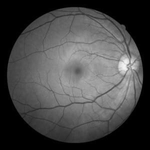

In [30]:
img = image_orig.convert(mode='L')
img

In [46]:
img = image_orig.convert(mode='L')
pixels = asarray(img)
# confirm pixel range is 0-255
print('Data Type: %s' % pixels.dtype)
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))
# convert from integers to floats
pixels = pixels.astype('float32')
# normalize to the range 0-1
#pixels /= 255.0
pixels = pixels / pixels.max() * 255.
pixels = pixels.astype('uint8')
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))

Data Type: uint8
Min: 0.000, Max: 245.000
Min: 0.000, Max: 255.000


In [20]:
kde_r_fg.evaluate(G_rgb.nodes[9454]["r"])[0]
#G_rgb.nodes

0.0

Min: 0.000, Max: 255.000


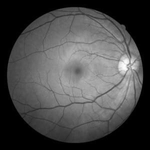

In [47]:
pixels.dtype
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))
img = Image.fromarray(pixels)
img

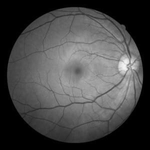

In [45]:
img = image_orig.convert(mode='L')
pixels = asarray(img)
img = Image.fromarray(pixels)
img

In [32]:
pixels

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [25]:
pixels = pixels / pixels.max() * 255
pixels = pixels.astype(int)

In [26]:
pixels

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [19]:
scrbl_nodes = nx.subgraph_view(G_wgtd, filter_node='foregrnd')

In [26]:
list(G_wgtd.nodes)[0]


103

In [42]:
import sys
sys.float_info.min

2.2250738585072014e-308